#### random walk 

92 92.80000000000001
(24, 6)
(24, 6)
Horizon: 1
MSE: 0.1326
MAE: 0.3176
SMAPE: 18.4236%


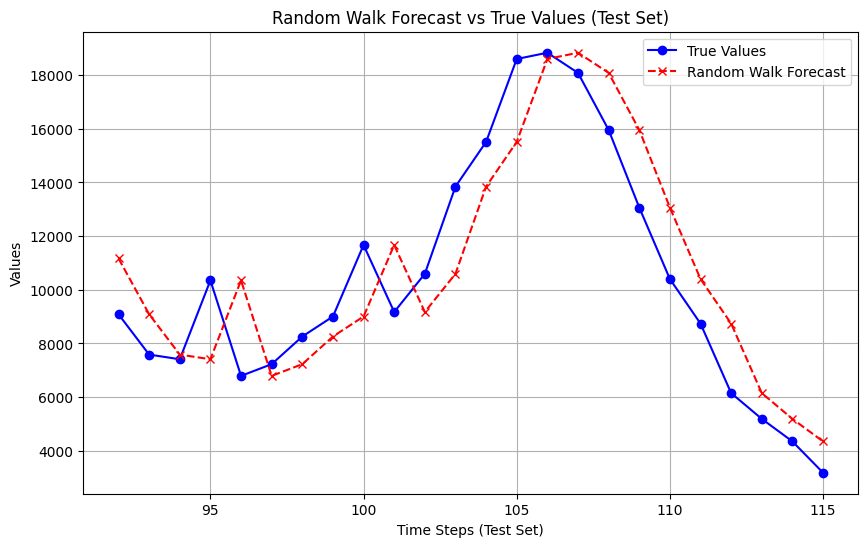

Horizon: 2
MSE: 0.3324
MAE: 0.5037
SMAPE: 28.6813%


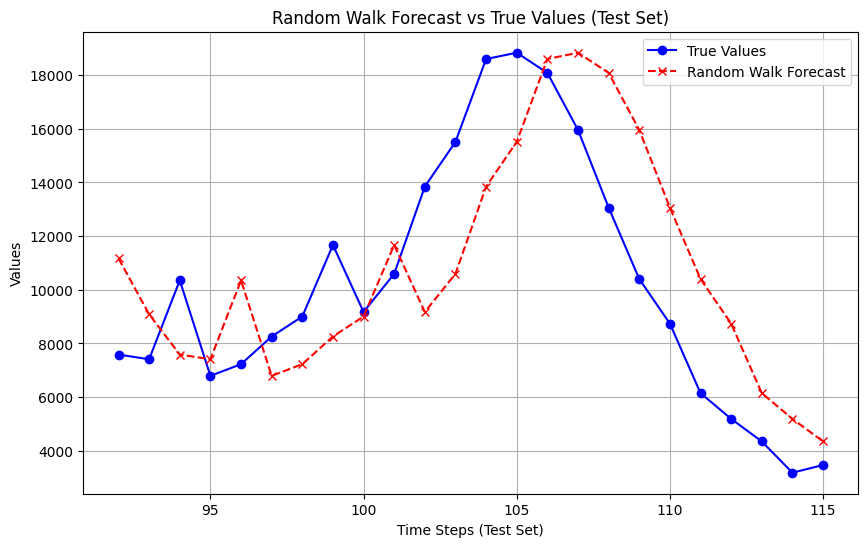

Horizon: 3
MSE: 0.5902
MAE: 0.6475
SMAPE: 36.7636%


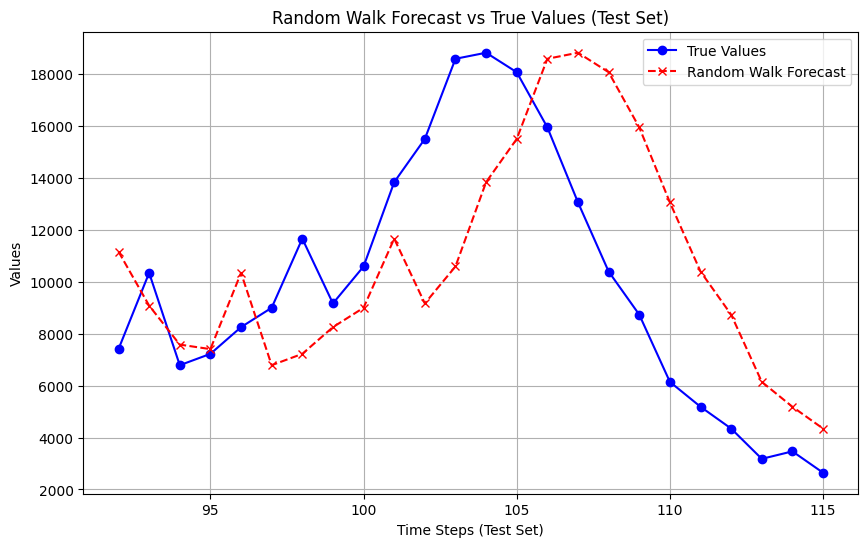

Horizon: 4
MSE: 0.9036
MAE: 0.7835
SMAPE: 45.6192%


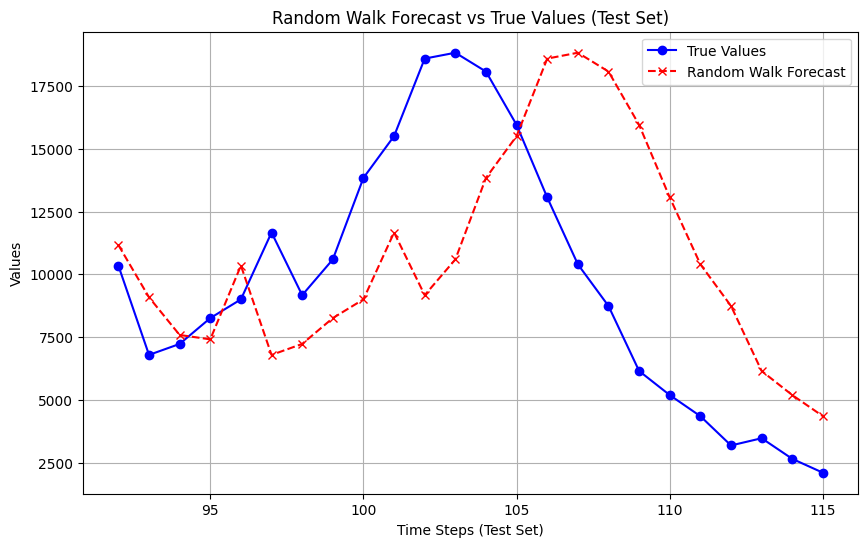

Horizon: 5
MSE: 1.2261
MAE: 0.9378
SMAPE: 54.8920%


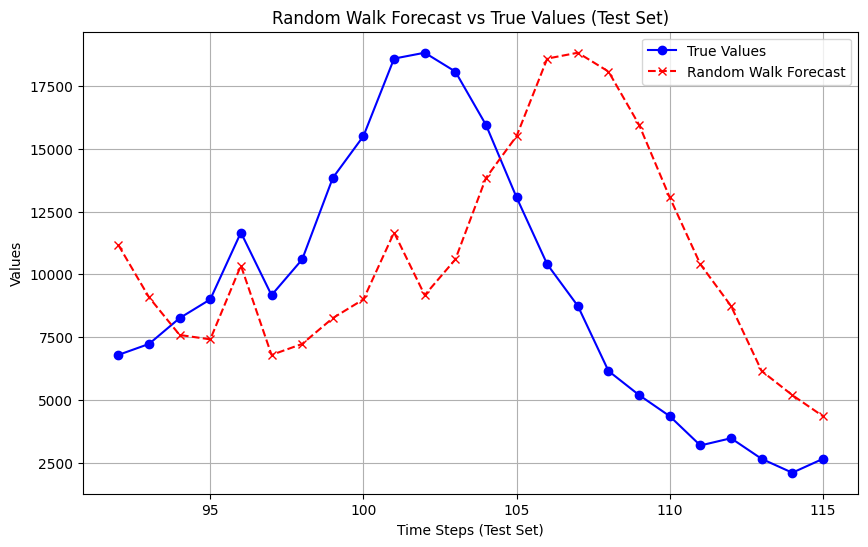

Horizon: 6
MSE: 1.5717
MAE: 1.0732
SMAPE: 63.5610%


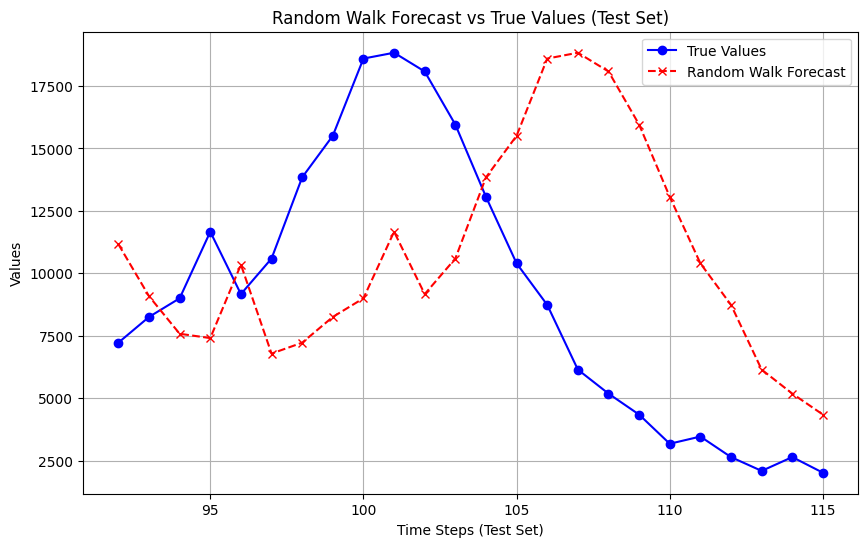

smape_value 63.56100466320189 horizon: 6
horizon: 0, mse: 0.13263108576596053, mse: 0.31761655797883137, smape: 18.42360516061573
horizon: 1, mse: 0.33244920181204357, mse: 0.503743351571344, smape: 28.6813307558688
horizon: 2, mse: 0.5901621674678716, mse: 0.6474946474173092, smape: 36.76357291066568
horizon: 3, mse: 0.9035771754736999, mse: 0.7835251719461028, smape: 45.61915752850361
horizon: 4, mse: 1.2260681241876499, mse: 0.9378222722923434, smape: 54.89202954645452
horizon: 5, mse: 1.5717378134804765, mse: 1.0731650269624233, smape: 63.56100466320189


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

mse_global = []
mae_global = []
smape_global = []

# Define function for SMAPE calculation
def smape(true_values, predicted_values):
    print(true_values.shape, predicted_values.shape)
    return 100 * np.mean(2 * np.abs(predicted_values - true_values) / (np.abs(predicted_values) + np.abs(true_values)))

# Define random walk forecasting function
def random_walk_forecast(train_series, horizon):
    """
    Inputs:
        train_series (array-like): The training part of the time series data.
        horizon (int): The number of steps to forecast.
    Outputs:
        forecast (array-like): The forecasted values for the given horizon.
    """
    forecast = np.full(horizon, train_series[-1])  # Forecast future values as the last observed value
    return forecast

# Define function to evaluate random walk model with rolling window
def evaluate_random_walk(time_series, horizon):
    """
    Inputs:
        time_series (array-like): The full input time series data.
        horizon (int): The individual forecast horizon (steps ahead).
    Outputs:
        Plots of estimated vs true values on the entire test set, and prints MSE, MAE, and SMAPE.
    """
    # Split the time series into training (80%) and test sets (20%)
    split_idx = int(0.8 * len(time_series))
    print(split_idx,0.8 * len(time_series))

    train_series = time_series[:split_idx]
    test_series = time_series[split_idx:]

    # To cover the entire test set, we start rolling from part of the training set
    rolling_start_idx = max(0, split_idx - horizon)

    # Rolling window predictions: for each step in test, forecast based on the last training value
    predictions = np.zeros(( (len(time_series) - horizon)-rolling_start_idx ,horizon))
    true_values = np.zeros(( (len(time_series) - horizon)-rolling_start_idx ,horizon))

    # Rolling window loop: start from `rolling_start_idx` to include all test points
    for i in range(rolling_start_idx, len(time_series) - horizon):
#         print(i)
        current_train_series = time_series[:i+1]  # Take the series up to the current point
        forecast = random_walk_forecast(current_train_series, horizon)  # Forecast for the given horizon
        predictions[i-rolling_start_idx,:] = np.array(forecast)
        true_values[i-rolling_start_idx,:] = np.array(time_series[i+1:i + horizon+1])

    # Convert to arrays for metric calculation
    predictions = np.array(predictions)
    true_values = np.array(true_values)
    print(predictions.shape)
    print(true_values.shape)

    
    scalar = StandardScaler()
    scalar.fit(train_series.reshape(-1,1))
    for h in range(horizon):
        trues = true_values[:,h] #[horizon:,h]
        preds = predictions[:,h] #[horizon:,h]

        # Compute metrics
        trues_norm = scalar.transform(trues.reshape(-1,1))
        preds_norm = scalar.transform(preds.reshape(-1,1))
        mse = mean_squared_error(trues_norm, preds_norm)
        mae = mean_absolute_error(trues_norm, preds_norm)
        smape_value = smape(trues, preds)

        mse_global.append(mse); mae_global.append(mae); smape_global.append(smape_value);
        
        print(f"Horizon: {h+1}")
        # Print evaluation metrics
        print(f"MSE: {mse:.4f}")
        print(f"MAE: {mae:.4f}")
        print(f"SMAPE: {smape_value:.4f}%")

        # Plot true vs forecasted values for the test set
        plt.figure(figsize=(10, 6))
        plt.plot(range(split_idx, len(time_series)), trues, label='True Values', color='blue', marker='o', linestyle='-')
        plt.plot(range(split_idx, len(time_series)), preds, label='Random Walk Forecast', color='red', linestyle='--', marker='x')
        plt.title(f'Random Walk Forecast vs True Values (Test Set)')
        plt.xlabel('Time Steps (Test Set)')
        plt.ylabel('Values')
        plt.legend()
        plt.grid(True)
        plt.show()
    return smape_value

# Example usage
if __name__ == "__main__":
    # Example time series (synthetic data)
    # np.random.seed(0)
    # time_series = np.cumsum(np.abs(np.random.randn(100)))  # Simulating a random walk

    df = pd.read_csv('./../dataset/rag_data/data/covid_till14May22.csv')
    time_series = np.array(df['new_deaths'])
    horizon = 12  # Forecast horizon (steps ahead)
    for horizon in range(6,7):
        smape_value = evaluate_random_walk(time_series, horizon)
        print("smape_value", smape_value, "horizon:",horizon)
        
    for horizon in range(6):
        print(f'horizon: {horizon}, mse: {mse_global[horizon]}, mse: {mae_global[horizon]}, smape: {smape_global[horizon]}')


92 92.80000000000001
(24, 6)
(24, 6)
(18,) (18,)
Horizon: 1
MSE: 0.1276
MAE: 0.3180
SMAPE: 17.7988%


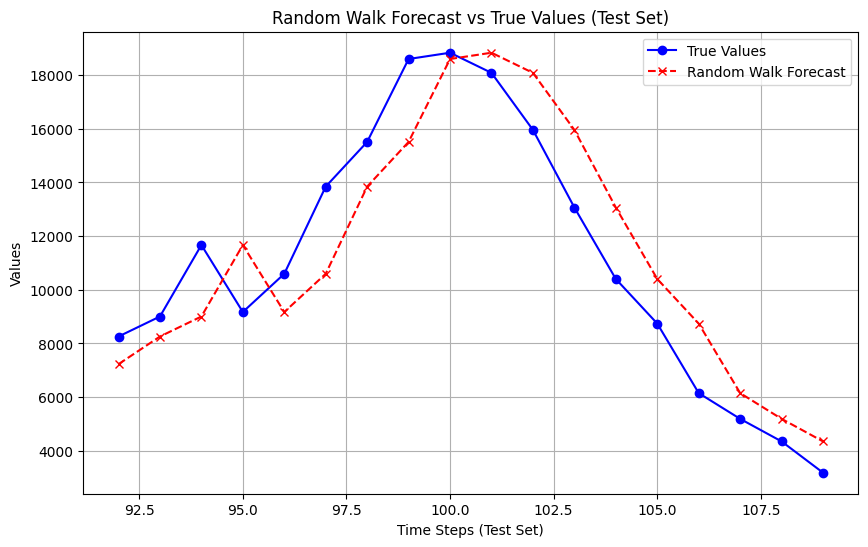

(18,) (18,)
Horizon: 2
MSE: 0.3810
MAE: 0.5411
SMAPE: 29.7320%


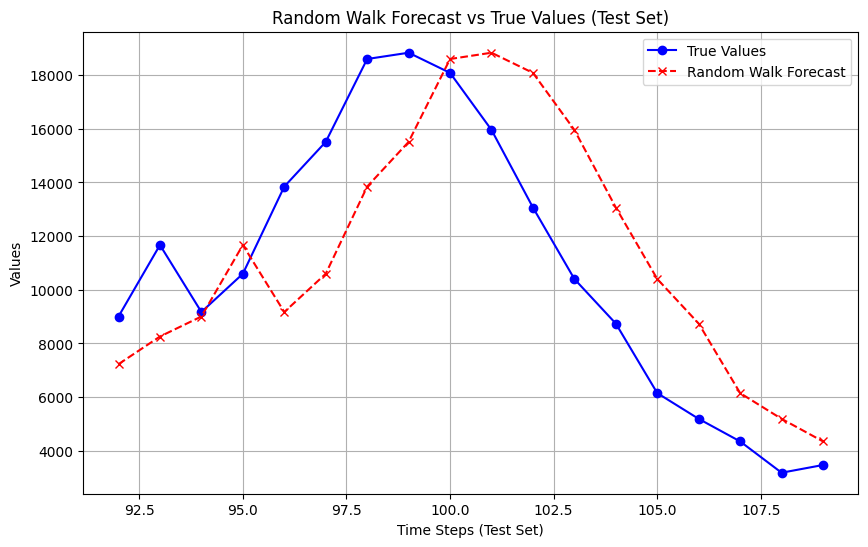

(18,) (18,)
Horizon: 3
MSE: 0.7420
MAE: 0.7617
SMAPE: 42.4889%


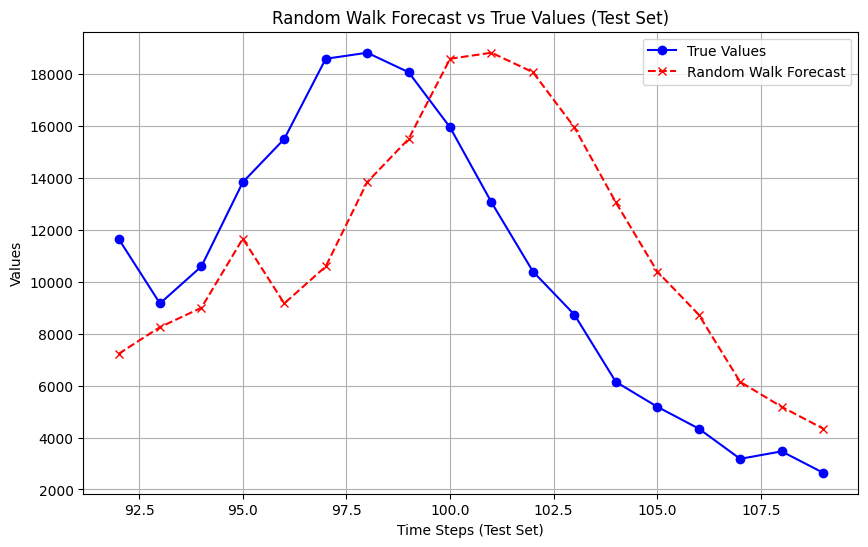

(18,) (18,)
Horizon: 4
MSE: 1.1481
MAE: 0.9407
SMAPE: 54.2161%


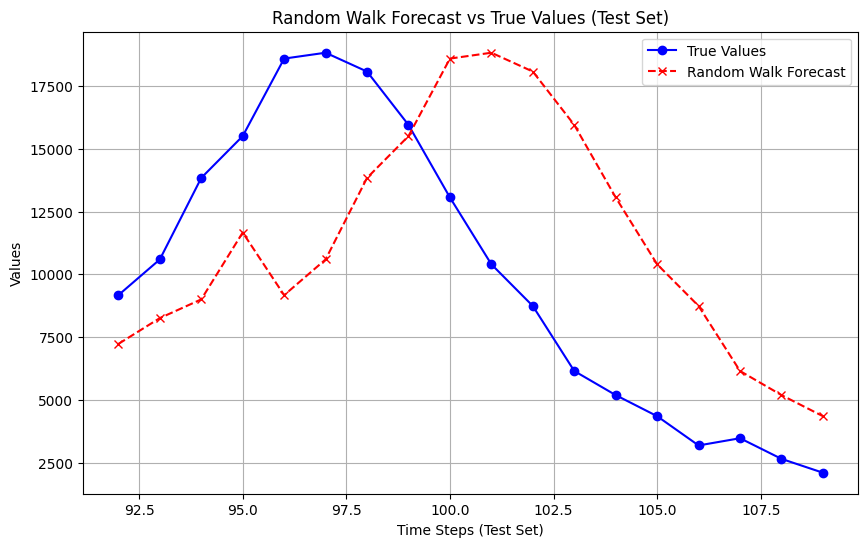

(18,) (18,)
Horizon: 5
MSE: 1.5769
MAE: 1.1301
SMAPE: 65.3388%


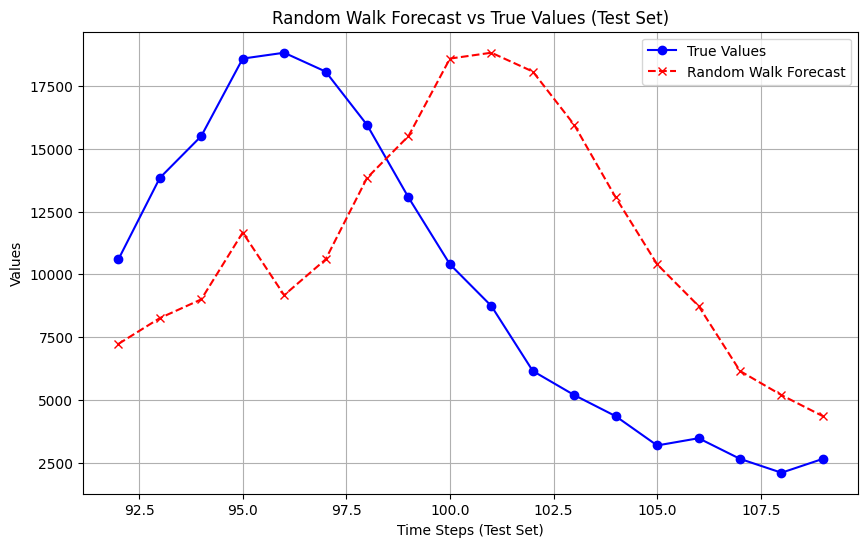

(18,) (18,)
Horizon: 6
MSE: 2.0042
MAE: 1.2787
SMAPE: 75.3015%


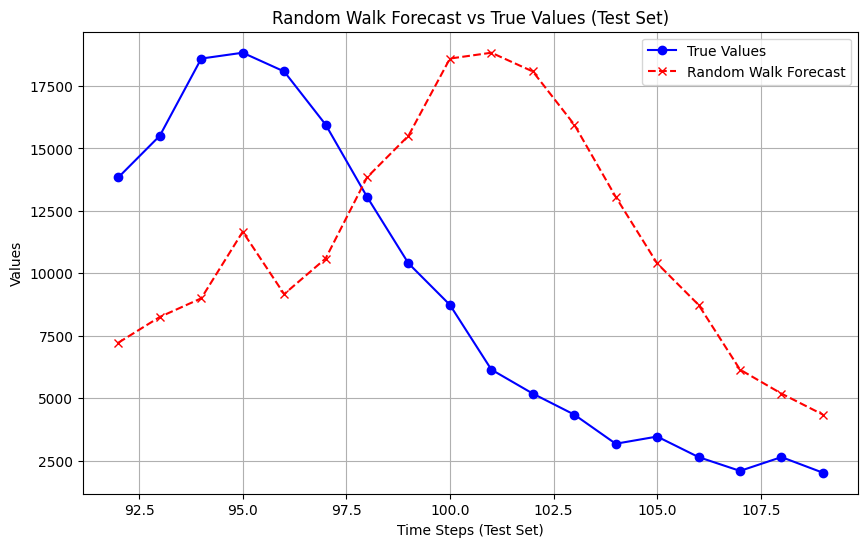

smape_value 75.30147379432267 horizon: 6
horizon: 0, mse: 0.12762922152533437, mse: 0.31804055946879095, smape: 17.798802028688606
horizon: 1, mse: 0.38097295213022964, mse: 0.5411442271856901, smape: 29.73195663114565
horizon: 2, mse: 0.7419737036708662, mse: 0.761733467462131, smape: 42.48890427793774
horizon: 3, mse: 1.1480652315072577, mse: 0.9407212592236954, smape: 54.2161473144391
horizon: 4, mse: 1.5769424009902788, mse: 1.1300822967396207, smape: 65.33876807582233
horizon: 5, mse: 2.004226944989311, mse: 1.2787194702198885, smape: 75.30147379432267


In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

mse_global = []
mae_global = []
smape_global = []

# Define function for SMAPE calculation
def smape(true_values, predicted_values):
    print(true_values.shape, predicted_values.shape)
    return 100 * np.mean(2 * np.abs(predicted_values - true_values) / (np.abs(predicted_values) + np.abs(true_values)))

# Define random walk forecasting function
def random_walk_forecast(train_series, horizon):
    """
    Inputs:
        train_series (array-like): The training part of the time series data.
        horizon (int): The number of steps to forecast.
    Outputs:
        forecast (array-like): The forecasted values for the given horizon.
    """
    forecast = np.full(horizon, train_series[-1])  # Forecast future values as the last observed value
    return forecast

# Define function to evaluate random walk model with rolling window
def evaluate_random_walk(time_series, horizon):
    """
    Inputs:
        time_series (array-like): The full input time series data.
        horizon (int): The individual forecast horizon (steps ahead).
    Outputs:
        Plots of estimated vs true values on the entire test set, and prints MSE, MAE, and SMAPE.
    """
    # Split the time series into training (80%) and test sets (20%)
    split_idx = int(0.8 * len(time_series))
    print(split_idx,0.8 * len(time_series))

    train_series = time_series[:split_idx]
    test_series = time_series[split_idx:]

    # To cover the entire test set, we start rolling from part of the training set
    rolling_start_idx = max(0, split_idx - horizon)

    # Rolling window predictions: for each step in test, forecast based on the last training value
    predictions = np.zeros(( (len(time_series) - horizon)-rolling_start_idx ,horizon))
    true_values = np.zeros(( (len(time_series) - horizon)-rolling_start_idx ,horizon))

    # Rolling window loop: start from `rolling_start_idx` to include all test points
    for i in range(rolling_start_idx, len(time_series) - horizon):
#         print(i)
        current_train_series = time_series[:i+1]  # Take the series up to the current point
        forecast = random_walk_forecast(current_train_series, horizon)  # Forecast for the given horizon
        predictions[i-rolling_start_idx,:] = np.array(forecast)
        true_values[i-rolling_start_idx,:] = np.array(time_series[i+1:i + horizon+1])

    # Convert to arrays for metric calculation
    predictions = np.array(predictions)
    true_values = np.array(true_values)
    print(predictions.shape)
    print(true_values.shape)

    
    scalar = StandardScaler()
    scalar.fit(train_series.reshape(-1,1))
    for h in range(horizon):
        trues = true_values[horizon:,h] #[horizon:,h]
        preds = predictions[horizon:,h] #[horizon:,h]

        # Compute metrics
        trues_norm = scalar.transform(trues.reshape(-1,1))
        preds_norm = scalar.transform(preds.reshape(-1,1))
        mse = mean_squared_error(trues_norm, preds_norm)
        mae = mean_absolute_error(trues_norm, preds_norm)
        smape_value = smape(trues, preds)

        mse_global.append(mse); mae_global.append(mae); smape_global.append(smape_value);
        
        print(f"Horizon: {h+1}")
        # Print evaluation metrics
        print(f"MSE: {mse:.4f}")
        print(f"MAE: {mae:.4f}")
        print(f"SMAPE: {smape_value:.4f}%")

        # Plot true vs forecasted values for the test set
        plt.figure(figsize=(10, 6))
        plt.plot(range(split_idx, len(time_series)-horizon), trues, label='True Values', color='blue', marker='o', linestyle='-')
        plt.plot(range(split_idx, len(time_series)-horizon), preds, label='Random Walk Forecast', color='red', linestyle='--', marker='x')
        plt.title(f'Random Walk Forecast vs True Values (Test Set)')
        plt.xlabel('Time Steps (Test Set)')
        plt.ylabel('Values')
        plt.legend()
        plt.grid(True)
        plt.show()
    return smape_value

# Example usage
if __name__ == "__main__":
    # Example time series (synthetic data)
    # np.random.seed(0)
    # time_series = np.cumsum(np.abs(np.random.randn(100)))  # Simulating a random walk

    df = pd.read_csv('./../dataset/rag_data/data/covid_till14May22.csv')
    time_series = np.array(df['new_deaths'])
    horizon = 12  # Forecast horizon (steps ahead)
    for horizon in range(6,7):
        smape_value = evaluate_random_walk(time_series, horizon)
        print("smape_value", smape_value, "horizon:",horizon)
        
    for horizon in range(6):
        print(f'horizon: {horizon}, mse: {mse_global[horizon]}, mse: {mae_global[horizon]}, smape: {smape_global[horizon]}')


92 92.80000000000001
split_idx 92
rolling_start_idx 92
predictions.shape (18, 6)
true_values.shape (18, 6)
predictions.shape (18, 6)
true_values.shape (18, 6)
true_values.shape, predicted_values.shape (18,) (18,)
Horizon: 1
MSE: 0.1276
MAE: 0.3180
SMAPE: 17.7988%


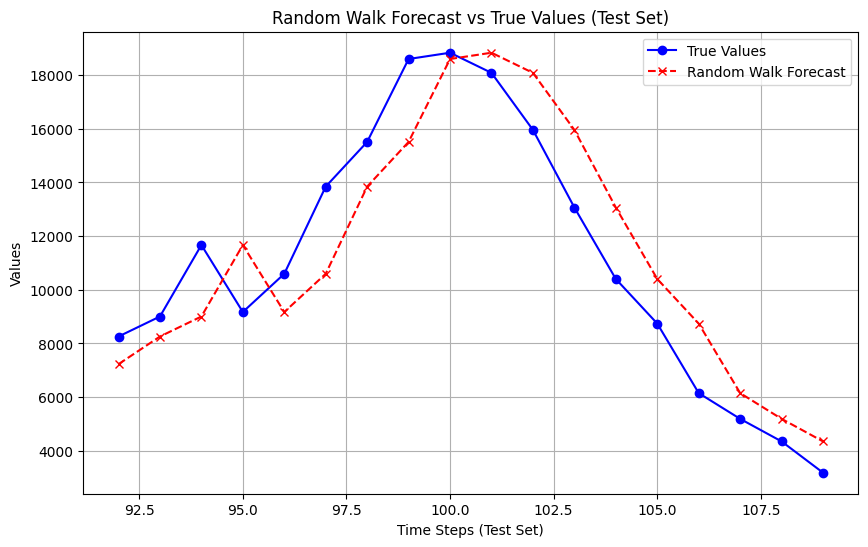

true_values.shape, predicted_values.shape (18,) (18,)
Horizon: 2
MSE: 0.3810
MAE: 0.5411
SMAPE: 29.7320%


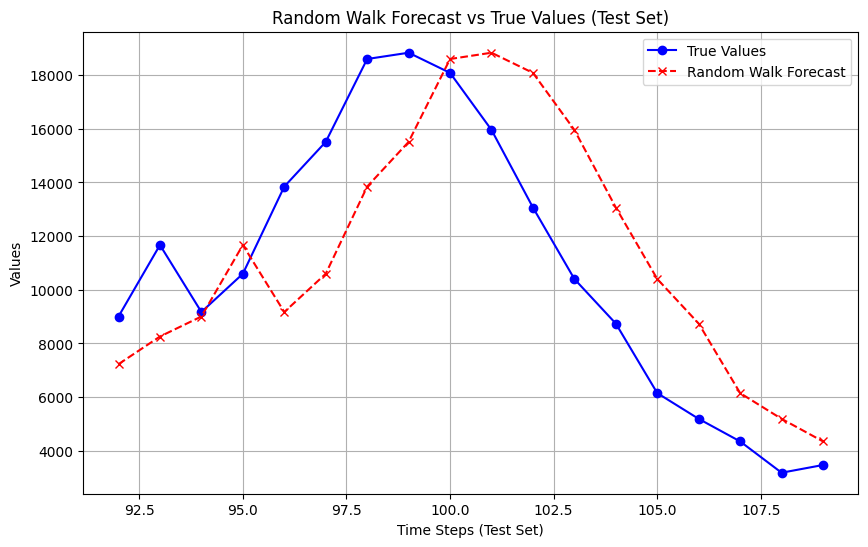

true_values.shape, predicted_values.shape (18,) (18,)
Horizon: 3
MSE: 0.7420
MAE: 0.7617
SMAPE: 42.4889%


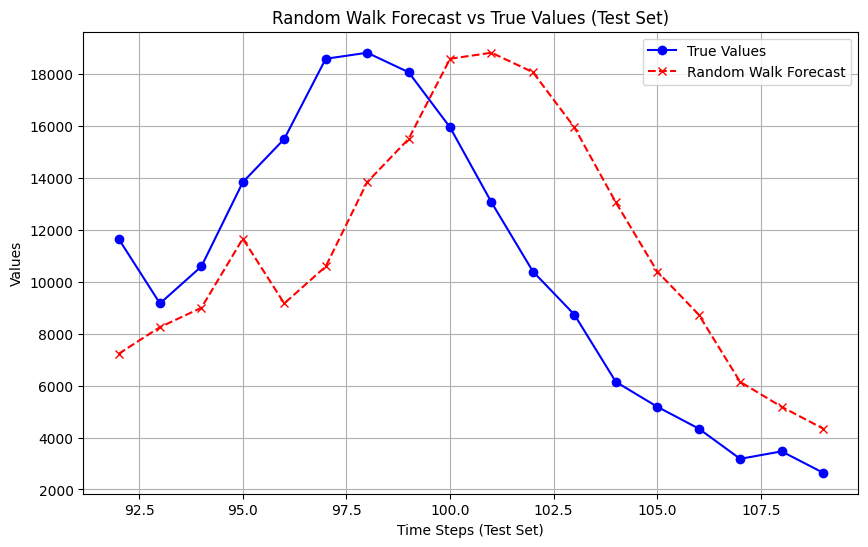

true_values.shape, predicted_values.shape (18,) (18,)
Horizon: 4
MSE: 1.1481
MAE: 0.9407
SMAPE: 54.2161%


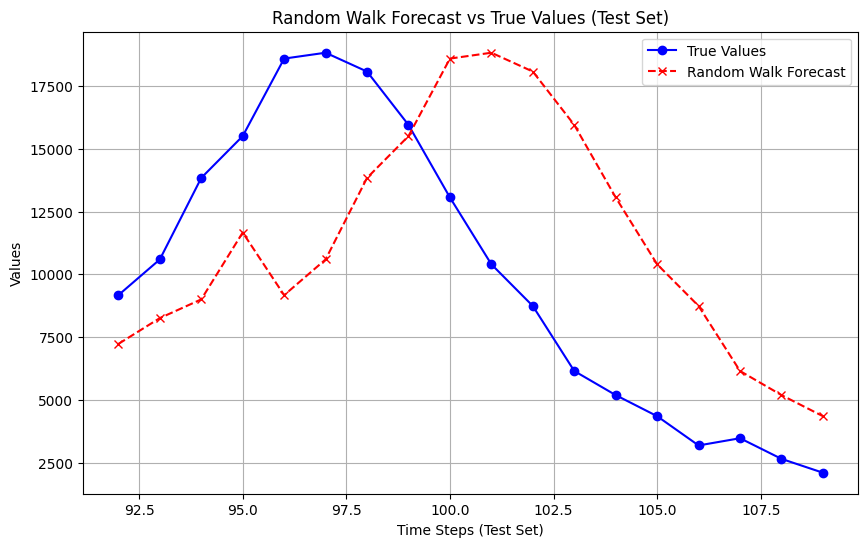

true_values.shape, predicted_values.shape (18,) (18,)
Horizon: 5
MSE: 1.5769
MAE: 1.1301
SMAPE: 65.3388%


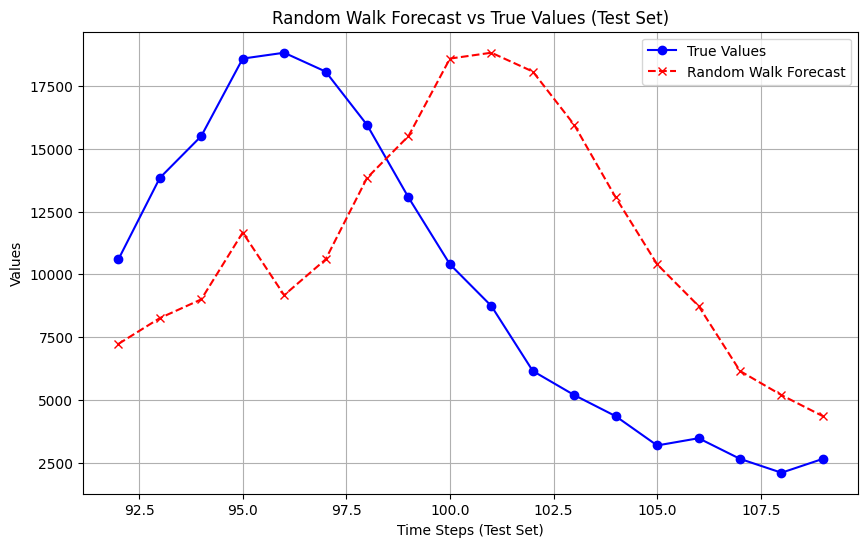

true_values.shape, predicted_values.shape (18,) (18,)
Horizon: 6
MSE: 2.0042
MAE: 1.2787
SMAPE: 75.3015%


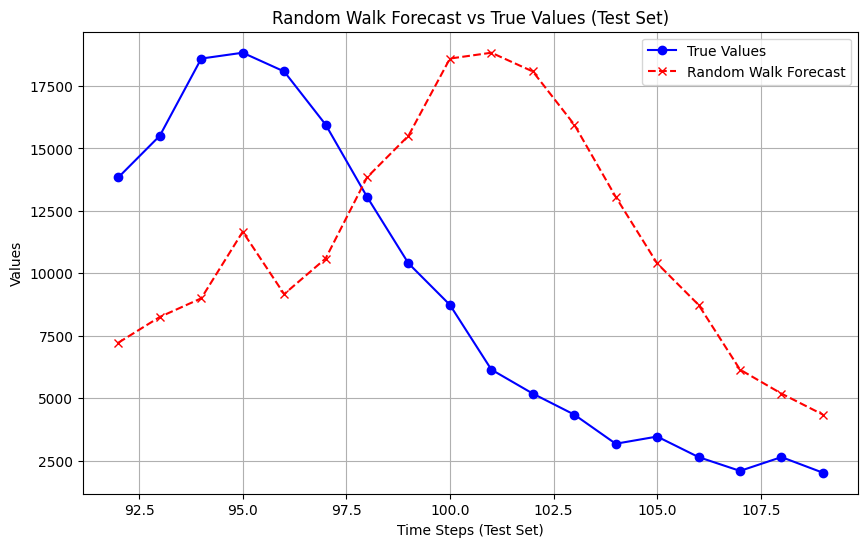

smape_value 75.30147379432267 horizon: 6
horizon: 0, mse: 0.12762922152533437, mse: 0.31804055946879095, smape: 17.798802028688606
horizon: 1, mse: 0.38097295213022964, mse: 0.5411442271856901, smape: 29.73195663114565
horizon: 2, mse: 0.7419737036708662, mse: 0.761733467462131, smape: 42.48890427793774
horizon: 3, mse: 1.1480652315072577, mse: 0.9407212592236954, smape: 54.2161473144391
horizon: 4, mse: 1.5769424009902788, mse: 1.1300822967396207, smape: 65.33876807582233
horizon: 5, mse: 2.004226944989311, mse: 1.2787194702198885, smape: 75.30147379432267


In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

mse_global = []
mae_global = []
smape_global = []

# Define function for SMAPE calculation
def smape(true_values, predicted_values):
    print("true_values.shape, predicted_values.shape",true_values.shape, predicted_values.shape)
    return 100 * np.mean(2 * np.abs(predicted_values - true_values) / (np.abs(predicted_values) + np.abs(true_values)))

# Define random walk forecasting function
def random_walk_forecast(train_series, horizon):
    """
    Inputs:
        train_series (array-like): The training part of the time series data.
        horizon (int): The number of steps to forecast.
    Outputs:
        forecast (array-like): The forecasted values for the given horizon.
    """
    forecast = np.full(horizon, train_series[-1])  # Forecast future values as the last observed value
    return forecast

# Define function to evaluate random walk model with rolling window
def evaluate_random_walk(time_series, horizon):
    """
    Inputs:
        time_series (array-like): The full input time series data.
        horizon (int): The individual forecast horizon (steps ahead).
    Outputs:
        Plots of estimated vs true values on the entire test set, and prints MSE, MAE, and SMAPE.
    """
    # Split the time series into training (80%) and test sets (20%)
    split_idx = int(0.8 * len(time_series))
    print(split_idx,0.8 * len(time_series))

    train_series = time_series[:split_idx]
    test_series = time_series[split_idx:]

    # To cover the entire test set, we start rolling from part of the training set
    rolling_start_idx = max(0, split_idx)

    # Rolling window predictions: for each step in test, forecast based on the last training value
    predictions = np.zeros(( (len(time_series) - horizon)-rolling_start_idx ,horizon))
    true_values = np.zeros(( (len(time_series) - horizon)-rolling_start_idx ,horizon))

    print("split_idx",split_idx)
    print("rolling_start_idx",rolling_start_idx)
    print("predictions.shape",predictions.shape)
    print("true_values.shape",true_values.shape)
    
    
    # Rolling window loop: start from `rolling_start_idx` to include all test points
    for i in range(rolling_start_idx, len(time_series) - horizon):
#         print(i)
        current_train_series = time_series[:i+1]  # Take the series up to the current point
        forecast = random_walk_forecast(current_train_series, horizon)  # Forecast for the given horizon
        predictions[i-rolling_start_idx,:] = np.array(forecast)
        true_values[i-rolling_start_idx,:] = np.array(time_series[i+1:i + horizon+1])

    # Convert to arrays for metric calculation
    predictions = np.array(predictions)
    true_values = np.array(true_values)
    print("predictions.shape",predictions.shape)
    print("true_values.shape",true_values.shape)

    
    scalar = StandardScaler()
    scalar.fit(train_series.reshape(-1,1))
    for h in range(horizon):
        trues = true_values[:,h] #[horizon:,h]
        preds = predictions[:,h] #[horizon:,h]

        # Compute metrics
        trues_norm = scalar.transform(trues.reshape(-1,1))
        preds_norm = scalar.transform(preds.reshape(-1,1))
        mse = mean_squared_error(trues_norm, preds_norm)
        mae = mean_absolute_error(trues_norm, preds_norm)
        smape_value = smape(trues, preds)

        mse_global.append(mse); mae_global.append(mae); smape_global.append(smape_value);
        
        print(f"Horizon: {h+1}")
        # Print evaluation metrics
        print(f"MSE: {mse:.4f}")
        print(f"MAE: {mae:.4f}")
        print(f"SMAPE: {smape_value:.4f}%")

        # Plot true vs forecasted values for the test set
        plt.figure(figsize=(10, 6))
        plt.plot(range(split_idx, len(time_series)-horizon), trues, label='True Values', color='blue', marker='o', linestyle='-')
        plt.plot(range(split_idx, len(time_series)-horizon), preds, label='Random Walk Forecast', color='red', linestyle='--', marker='x')
        plt.title(f'Random Walk Forecast vs True Values (Test Set)')
        plt.xlabel('Time Steps (Test Set)')
        plt.ylabel('Values')
        plt.legend()
        plt.grid(True)
        plt.show()
    return smape_value

# Example usage
if __name__ == "__main__":
    # Example time series (synthetic data)
    # np.random.seed(0)
    # time_series = np.cumsum(np.abs(np.random.randn(100)))  # Simulating a random walk

    df = pd.read_csv('./../dataset/rag_data/data/covid_till14May22.csv')
    time_series = np.array(df['new_deaths'])
    horizon = 12  # Forecast horizon (steps ahead)
    for horizon in range(6,7):
        smape_value = evaluate_random_walk(time_series, horizon)
        print("smape_value", smape_value, "horizon:",horizon)
        
    for horizon in range(6):
        print(f'horizon: {horizon}, mse: {mse_global[horizon]}, mae: {mae_global[horizon]}, smape: {smape_global[horizon]}')


92 92.80000000000001
(24, 6)
(24, 6)
preds: [11168.  9086.  7583.  7409. 10348.  6789.  7226.  8256.  9002. 11667.
  9170. 10594. 13844. 15510. 18599. 18833. 18082. 15956. 13064. 10400.
  8738.  6147.  5187.  4346.] test_series: [ 7226  8256  9002 11667  9170 10594 13844 15510 18599 18833 18082 15956
 13064 10400  8738  6147  5187  4346  3180  3468  2645  2093  2646  2020] trues: [ 9086.  7583.  7409. 10348.  6789.  7226.  8256.  9002. 11667.  9170.
 10594. 13844. 15510. 18599. 18833. 18082. 15956. 13064. 10400.  8738.
  6147.  5187.  4346.  3180.]
true_values.shape, predicted_values.shape: (24,) (24,)
Horizon: 1
MSE: 0.1326
MAE: 0.3176
SMAPE: 18.4236%


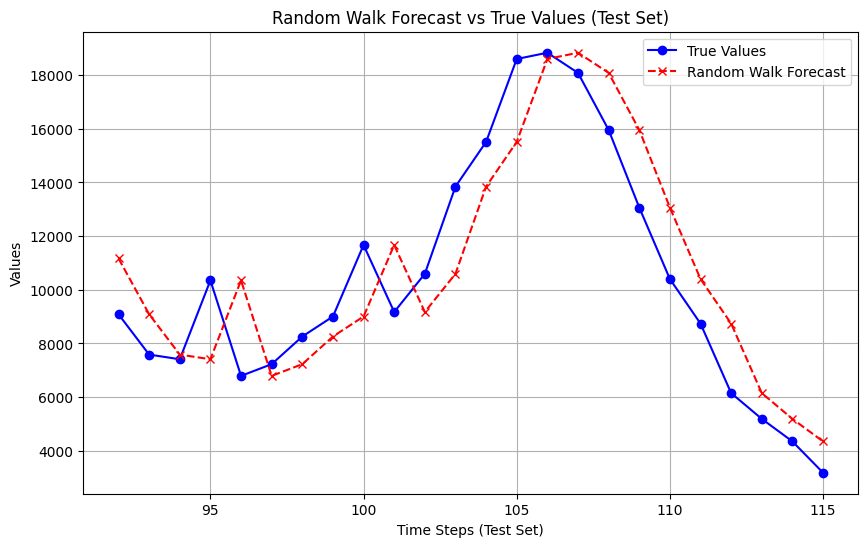

preds: [11168.  9086.  7583.  7409. 10348.  6789.  7226.  8256.  9002. 11667.
  9170. 10594. 13844. 15510. 18599. 18833. 18082. 15956. 13064. 10400.
  8738.  6147.  5187.  4346.] test_series: [ 7226  8256  9002 11667  9170 10594 13844 15510 18599 18833 18082 15956
 13064 10400  8738  6147  5187  4346  3180  3468  2645  2093  2646  2020] trues: [ 7583.  7409. 10348.  6789.  7226.  8256.  9002. 11667.  9170. 10594.
 13844. 15510. 18599. 18833. 18082. 15956. 13064. 10400.  8738.  6147.
  5187.  4346.  3180.  3468.]
true_values.shape, predicted_values.shape: (24,) (24,)
Horizon: 2
MSE: 0.3324
MAE: 0.5037
SMAPE: 28.6813%


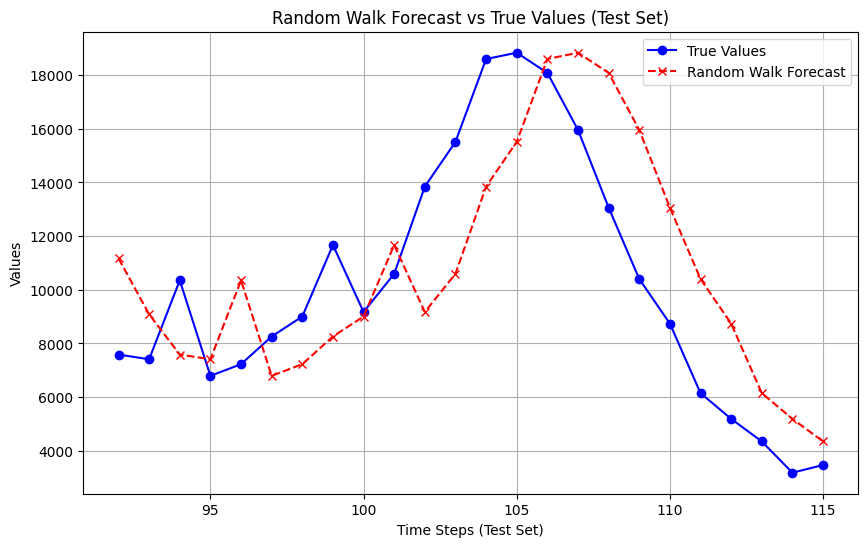

preds: [11168.  9086.  7583.  7409. 10348.  6789.  7226.  8256.  9002. 11667.
  9170. 10594. 13844. 15510. 18599. 18833. 18082. 15956. 13064. 10400.
  8738.  6147.  5187.  4346.] test_series: [ 7226  8256  9002 11667  9170 10594 13844 15510 18599 18833 18082 15956
 13064 10400  8738  6147  5187  4346  3180  3468  2645  2093  2646  2020] trues: [ 7409. 10348.  6789.  7226.  8256.  9002. 11667.  9170. 10594. 13844.
 15510. 18599. 18833. 18082. 15956. 13064. 10400.  8738.  6147.  5187.
  4346.  3180.  3468.  2645.]
true_values.shape, predicted_values.shape: (24,) (24,)
Horizon: 3
MSE: 0.5902
MAE: 0.6475
SMAPE: 36.7636%


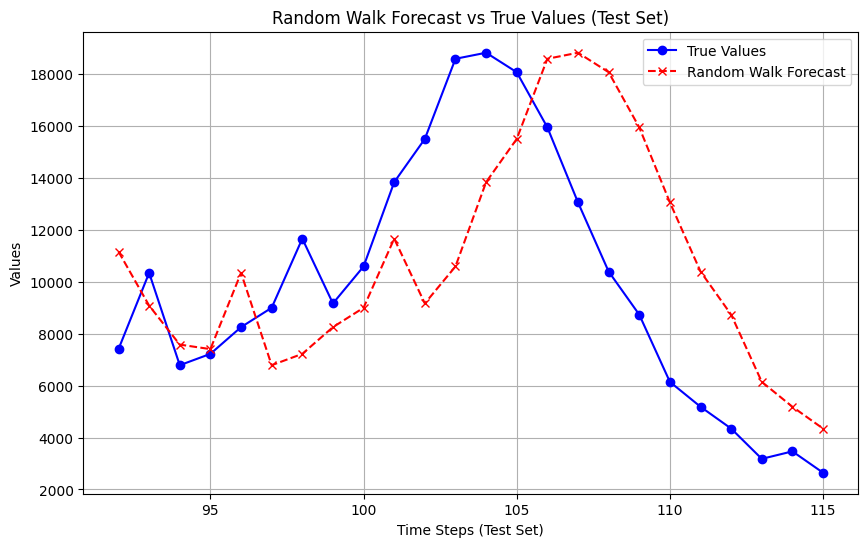

preds: [11168.  9086.  7583.  7409. 10348.  6789.  7226.  8256.  9002. 11667.
  9170. 10594. 13844. 15510. 18599. 18833. 18082. 15956. 13064. 10400.
  8738.  6147.  5187.  4346.] test_series: [ 7226  8256  9002 11667  9170 10594 13844 15510 18599 18833 18082 15956
 13064 10400  8738  6147  5187  4346  3180  3468  2645  2093  2646  2020] trues: [10348.  6789.  7226.  8256.  9002. 11667.  9170. 10594. 13844. 15510.
 18599. 18833. 18082. 15956. 13064. 10400.  8738.  6147.  5187.  4346.
  3180.  3468.  2645.  2093.]
true_values.shape, predicted_values.shape: (24,) (24,)
Horizon: 4
MSE: 0.9036
MAE: 0.7835
SMAPE: 45.6192%


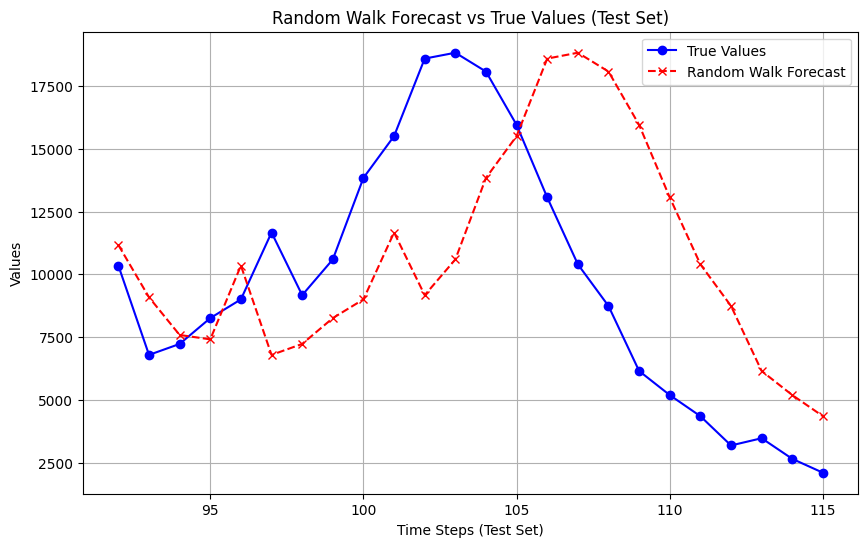

preds: [11168.  9086.  7583.  7409. 10348.  6789.  7226.  8256.  9002. 11667.
  9170. 10594. 13844. 15510. 18599. 18833. 18082. 15956. 13064. 10400.
  8738.  6147.  5187.  4346.] test_series: [ 7226  8256  9002 11667  9170 10594 13844 15510 18599 18833 18082 15956
 13064 10400  8738  6147  5187  4346  3180  3468  2645  2093  2646  2020] trues: [ 6789.  7226.  8256.  9002. 11667.  9170. 10594. 13844. 15510. 18599.
 18833. 18082. 15956. 13064. 10400.  8738.  6147.  5187.  4346.  3180.
  3468.  2645.  2093.  2646.]
true_values.shape, predicted_values.shape: (24,) (24,)
Horizon: 5
MSE: 1.2261
MAE: 0.9378
SMAPE: 54.8920%


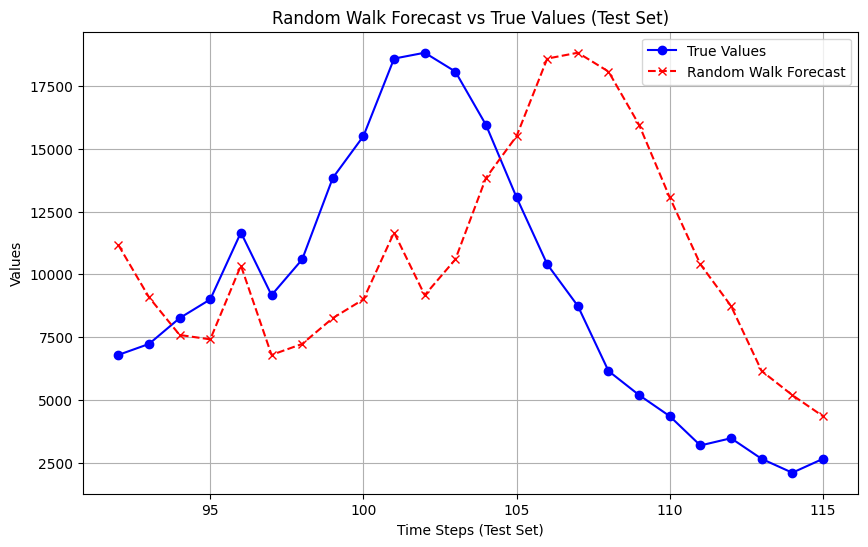

preds: [11168.  9086.  7583.  7409. 10348.  6789.  7226.  8256.  9002. 11667.
  9170. 10594. 13844. 15510. 18599. 18833. 18082. 15956. 13064. 10400.
  8738.  6147.  5187.  4346.] test_series: [ 7226  8256  9002 11667  9170 10594 13844 15510 18599 18833 18082 15956
 13064 10400  8738  6147  5187  4346  3180  3468  2645  2093  2646  2020] trues: [ 7226.  8256.  9002. 11667.  9170. 10594. 13844. 15510. 18599. 18833.
 18082. 15956. 13064. 10400.  8738.  6147.  5187.  4346.  3180.  3468.
  2645.  2093.  2646.  2020.]
true_values.shape, predicted_values.shape: (24,) (24,)
Horizon: 6
MSE: 1.5717
MAE: 1.0732
SMAPE: 63.5610%


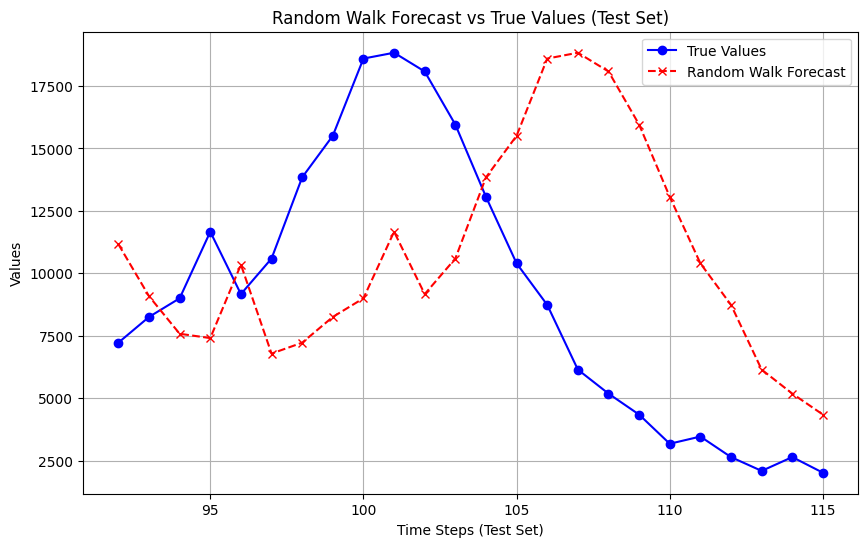

smape_value 63.56100466320189 horizon: 6
horizon: 0, mse: 0.13263108576596053, mse: 0.31761655797883137, smape: 18.42360516061573
horizon: 1, mse: 0.33244920181204357, mse: 0.503743351571344, smape: 28.6813307558688
horizon: 2, mse: 0.5901621674678716, mse: 0.6474946474173092, smape: 36.76357291066568
horizon: 3, mse: 0.9035771754736999, mse: 0.7835251719461028, smape: 45.61915752850361
horizon: 4, mse: 1.2260681241876499, mse: 0.9378222722923434, smape: 54.89202954645452
horizon: 5, mse: 1.5717378134804765, mse: 1.0731650269624233, smape: 63.56100466320189


In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

mse_global = []
mae_global = []
smape_global = []

# Define function for SMAPE calculation
def smape(true_values, predicted_values):
    print("true_values.shape, predicted_values.shape:",true_values.shape, predicted_values.shape)
    return 100 * np.mean(2 * np.abs(predicted_values - true_values) / (np.abs(predicted_values) + np.abs(true_values)))

# Define random walk forecasting function
def random_walk_forecast(train_series, horizon):
    """
    Inputs:
        train_series (array-like): The training part of the time series data.
        horizon (int): The number of steps to forecast.
    Outputs:
        forecast (array-like): The forecasted values for the given horizon.
    """
    forecast = np.full(horizon, train_series[-1])  # Forecast future values as the last observed value
    return forecast

# Define function to evaluate random walk model with rolling window
def evaluate_random_walk(time_series, horizon):
    """
    Inputs:
        time_series (array-like): The full input time series data.
        horizon (int): The individual forecast horizon (steps ahead).
    Outputs:
        Plots of estimated vs true values on the entire test set, and prints MSE, MAE, and SMAPE.
    """
    # Split the time series into training (80%) and test sets (20%)
    split_idx = int(0.8 * len(time_series))
    print(split_idx,0.8 * len(time_series))

    train_series = time_series[:split_idx]
    test_series = time_series[split_idx:]

    # To cover the entire test set, we start rolling from part of the training set
    rolling_start_idx = max(0, split_idx - horizon)

    # Rolling window predictions: for each step in test, forecast based on the last training value
    predictions = np.zeros(( (len(time_series) - horizon)-rolling_start_idx ,horizon))
    true_values = np.zeros(( (len(time_series) - horizon)-rolling_start_idx ,horizon))

    # Rolling window loop: start from `rolling_start_idx` to include all test points
    for i in range(rolling_start_idx, len(time_series) - horizon):
#         print(i)
        current_train_series = time_series[:i+1]  # Take the series up to the current point
        forecast = random_walk_forecast(current_train_series, horizon)  # Forecast for the given horizon
        predictions[i-rolling_start_idx,:] = np.array(forecast)
        true_values[i-rolling_start_idx,:] = np.array(time_series[i+1:i + horizon+1])

    # Convert to arrays for metric calculation
    predictions = np.array(predictions)
    true_values = np.array(true_values)
    print(predictions.shape)
    print(true_values.shape)

    
    scalar = StandardScaler()
    scalar.fit(train_series.reshape(-1,1))
    for h in range(horizon):
        trues = true_values[:,h] #[horizon:,h]
        preds = predictions[:,h] #[horizon:,h]
    
        # Compute metrics
        trues_norm = scalar.transform(trues.reshape(-1,1))
        preds_norm = scalar.transform(preds.reshape(-1,1))
        mse = mean_squared_error(trues_norm, preds_norm)
        mae = mean_absolute_error(trues_norm, preds_norm)
        print("preds:", preds, "test_series:",test_series, "trues:",trues )
        smape_value = smape(trues, preds)

        mse_global.append(mse); mae_global.append(mae); smape_global.append(smape_value);
        
        print(f"Horizon: {h+1}")
        # Print evaluation metrics
        print(f"MSE: {mse:.4f}")
        print(f"MAE: {mae:.4f}")
        print(f"SMAPE: {smape_value:.4f}%")

        # Plot true vs forecasted values for the test set
        plt.figure(figsize=(10, 6))
        plt.plot(range(split_idx, len(time_series)), trues, label='True Values', color='blue', marker='o', linestyle='-')
        plt.plot(range(split_idx, len(time_series)), preds, label='Random Walk Forecast', color='red', linestyle='--', marker='x')
        plt.title(f'Random Walk Forecast vs True Values (Test Set)')
        plt.xlabel('Time Steps (Test Set)')
        plt.ylabel('Values')
        plt.legend()
        plt.grid(True)
        plt.show()
    return smape_value

# Example usage
if __name__ == "__main__":
    # Example time series (synthetic data)
    # np.random.seed(0)
    # time_series = np.cumsum(np.abs(np.random.randn(100)))  # Simulating a random walk

    df = pd.read_csv('./../dataset/rag_data/data/covid_till14May22.csv')
    time_series = np.array(df['new_deaths'])
    horizon = 12  # Forecast horizon (steps ahead)
    for horizon in range(6,7):
        smape_value = evaluate_random_walk(time_series, horizon)
        print("smape_value", smape_value, "horizon:",horizon)
        
    for horizon in range(6):
        print(f'horizon: {horizon}, mse: {mse_global[horizon]}, mse: {mae_global[horizon]}, smape: {smape_global[horizon]}')


### ar

Horizon 1: MSE=0.0941, MAE=0.2473, SMAPE=13.07%


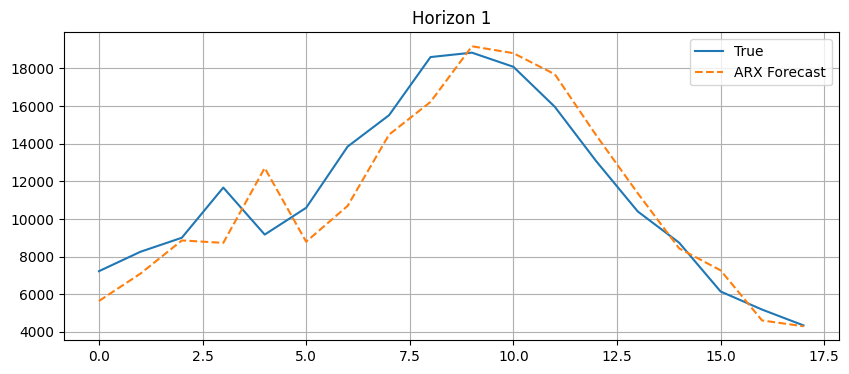

Horizon 2: MSE=0.2362, MAE=0.4087, SMAPE=21.35%


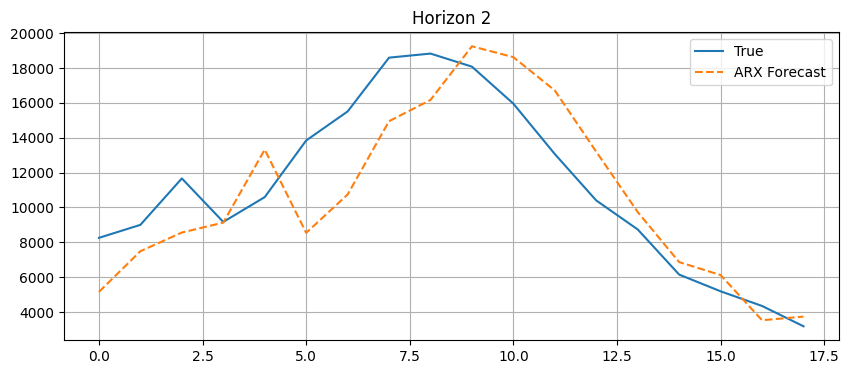

Horizon 3: MSE=0.4375, MAE=0.5126, SMAPE=25.71%


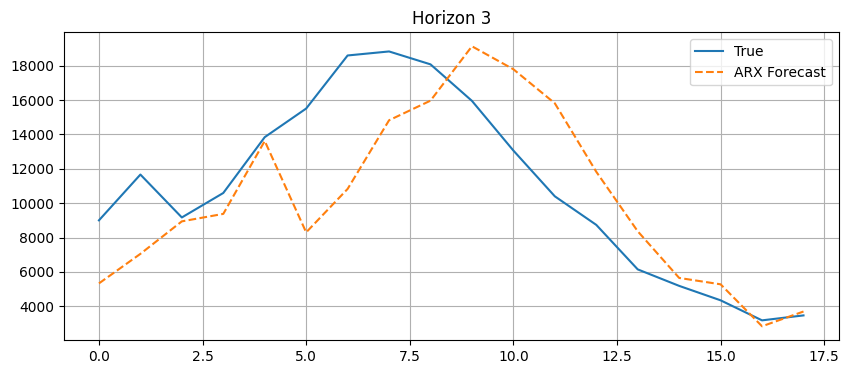

Horizon 4: MSE=0.7023, MAE=0.6639, SMAPE=36.25%


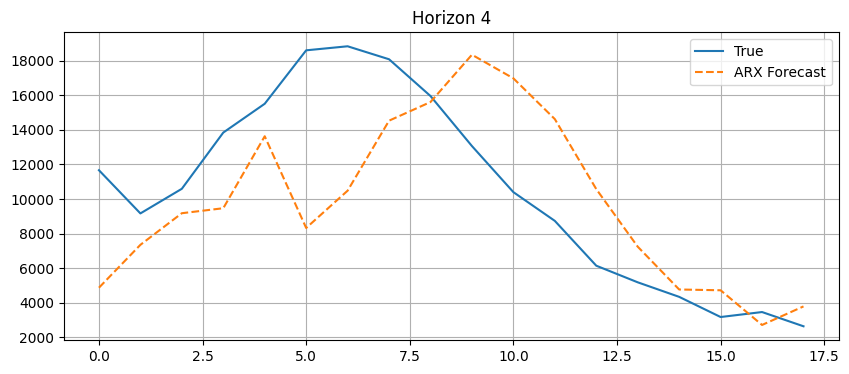

Horizon 5: MSE=0.8394, MAE=0.7658, SMAPE=43.35%


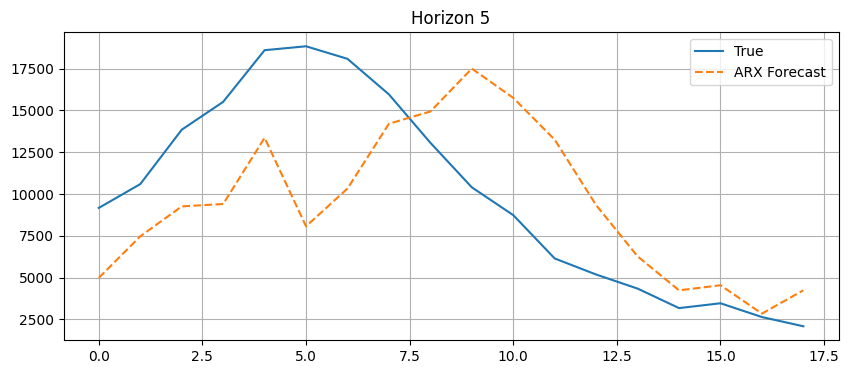

Horizon 6: MSE=1.0269, MAE=0.8741, SMAPE=52.68%


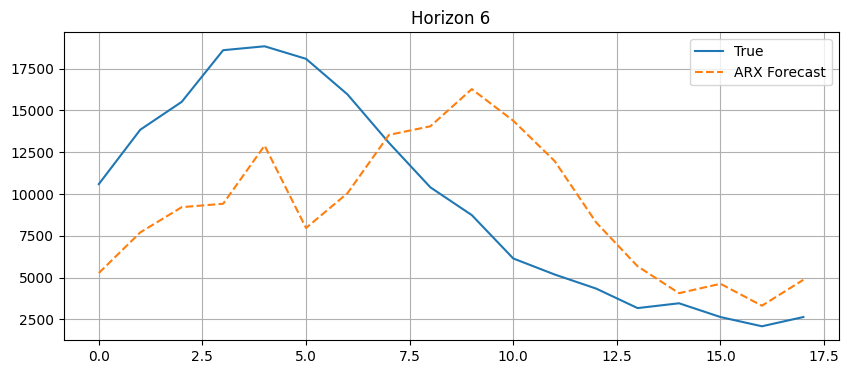

Horizon 1: MSE=0.0941, MAE=0.2473, SMAPE=13.07%
Horizon 2: MSE=0.2362, MAE=0.4087, SMAPE=21.35%
Horizon 3: MSE=0.4375, MAE=0.5126, SMAPE=25.71%
Horizon 4: MSE=0.7023, MAE=0.6639, SMAPE=36.25%
Horizon 5: MSE=0.8394, MAE=0.7658, SMAPE=43.35%
Horizon 6: MSE=1.0269, MAE=0.8741, SMAPE=52.68%


In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.ar_model import AutoReg

# --- Utility: SMAPE metric ---
def smape(true, pred):
    return 100 * np.mean(2 * np.abs(pred - true) / (np.abs(true) + np.abs(pred)))

# --- Load and preprocess data ---
df = pd.read_csv("./../dataset/rag_data/data/covid_till14May22.csv")  # replace with actual file path
data = df[['new_deaths','icu_patients']]  # endogenous + exogenous

# data = np.log1p(data)
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

endog = data_scaled[:, 0]             # ICU patients (target)
exog = data_scaled[:, 1:]             # Exogenous variables
horizon = 6

# --- Split data ---
split = int(0.8 * len(endog))
train_y, test_y = endog[:split], endog[split:]
train_x, test_x = exog[:split], exog[split:]

# --- Rolling forecast with ARX ---
mse_global, mae_global, smape_global = [], [], []
predictions, truths = [], []

for i in range(len(test_y) - horizon):
    y_train_i = np.concatenate([train_y, test_y[:i]])
    x_train_i = np.vstack([train_x, test_x[:i]])

    model = AutoReg(endog=y_train_i, lags=6) #, exog=x_train_i)
    model_fit = model.fit()

    x_forecast = x_train_i #exog[split+i-9:split+i] #test_x[i-92:i] #[i:i + horizon]
    
        # Provide future exogenous variables for forecasting
    x_oos = test_x[i:i + horizon]
    pred = model_fit.predict(
        start=len(y_train_i),
        end=len(y_train_i) + horizon - 1,
#         exog_oos=x_oos,
#         exog=x_forecast
    )
    
    
#     pred = model_fit.predict(start=len(y_train_i), end=len(y_train_i) + horizon - 1, exog=x_forecast)
    true = test_y[i:i + horizon]

    predictions.append(pred)
    truths.append(true)

predictions = np.array(predictions)
truths = np.array(truths)

# --- Evaluate for each horizon ---
for h in range(horizon):
    trues = truths[:, h].reshape(-1, 1)
    preds = predictions[:, h].reshape(-1, 1)

    mse = mean_squared_error(trues, preds)
    mae = mean_absolute_error(trues, preds)

    # Inverse transform for SMAPE
    trues_full = np.hstack([trues, np.zeros((len(trues), 1))])
    preds_full = np.hstack([preds, np.zeros((len(preds), 1))])
#     trues_inv = np.expm1(scaler.inverse_transform(trues_full))[:, 0]
#     preds_inv = np.expm1(scaler.inverse_transform(preds_full))[:, 0]

    trues_inv = (scaler.inverse_transform(trues_full))[:, 0]
    preds_inv = (scaler.inverse_transform(preds_full))[:, 0]
    
    smape_val = smape(trues_inv, preds_inv)

    mse_global.append(mse)
    mae_global.append(mae)
    smape_global.append(smape_val)

    print(f"Horizon {h+1}: MSE={mse:.4f}, MAE={mae:.4f}, SMAPE={smape_val:.2f}%")

    # Plot
    plt.figure(figsize=(10, 4))
    plt.plot(trues_inv, label="True")
    plt.plot(preds_inv, label="ARX Forecast", linestyle="--")
    plt.title(f"Horizon {h+1}")
    plt.legend()
    plt.grid()
    plt.show()
    
# --- Evaluate for each horizon ---
for h in range(horizon):
    print(f"Horizon {h+1}: MSE={mse_global[h]:.4f}, MAE={mae_global[h]:.4f}, SMAPE={smape_global[h]:.2f}%")


true_values.shape, predicted_values.shape: (18,) (18,)
Horizon 1: MSE=0.0941, MAE=0.2473, SMAPE=13.07%


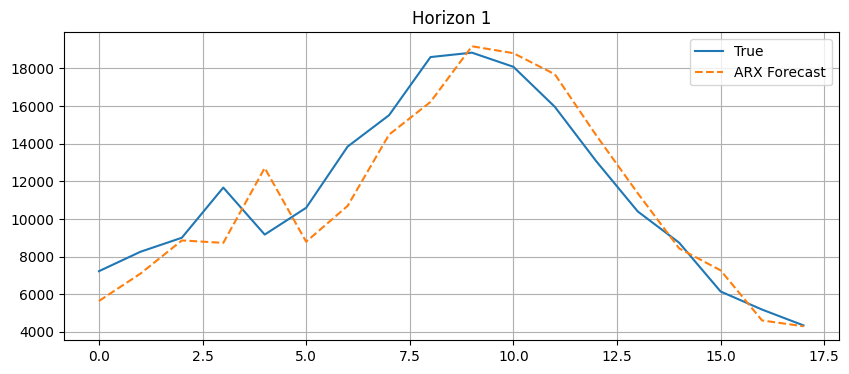

true_values.shape, predicted_values.shape: (18,) (18,)
Horizon 2: MSE=0.2362, MAE=0.4087, SMAPE=21.35%


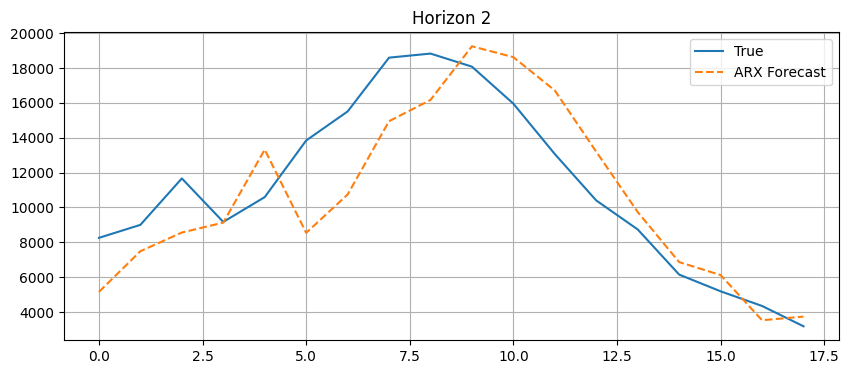

true_values.shape, predicted_values.shape: (18,) (18,)
Horizon 3: MSE=0.4375, MAE=0.5126, SMAPE=25.71%


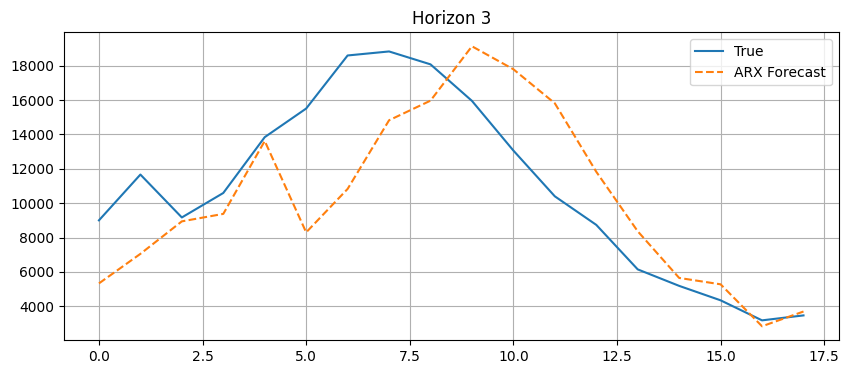

true_values.shape, predicted_values.shape: (18,) (18,)
Horizon 4: MSE=0.7023, MAE=0.6639, SMAPE=36.25%


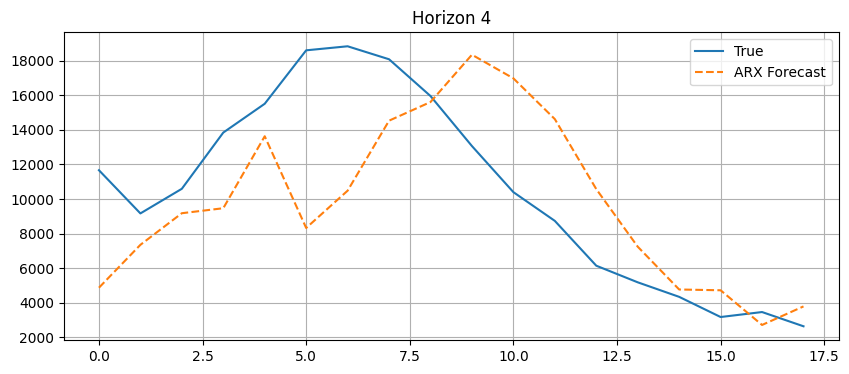

true_values.shape, predicted_values.shape: (18,) (18,)
Horizon 5: MSE=0.8394, MAE=0.7658, SMAPE=43.35%


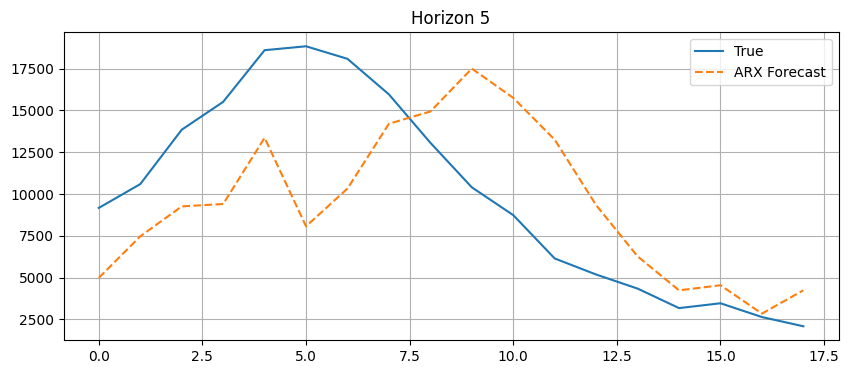

true_values.shape, predicted_values.shape: (18,) (18,)
Horizon 6: MSE=1.0269, MAE=0.8741, SMAPE=52.68%


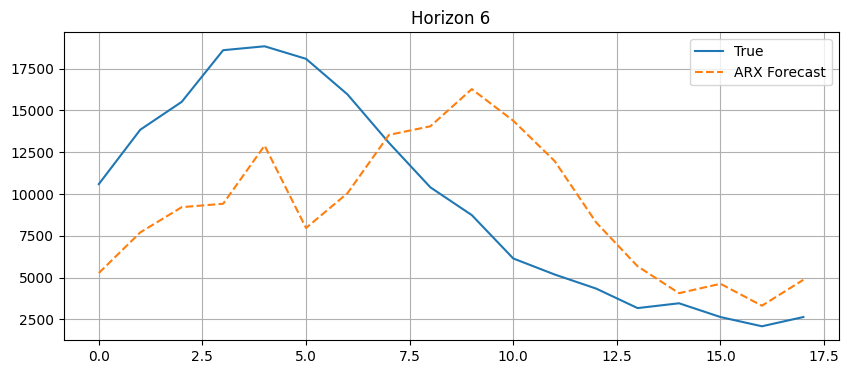

Horizon 1: MSE=0.0941, MAE=0.2473, SMAPE=13.07%
Horizon 2: MSE=0.2362, MAE=0.4087, SMAPE=21.35%
Horizon 3: MSE=0.4375, MAE=0.5126, SMAPE=25.71%
Horizon 4: MSE=0.7023, MAE=0.6639, SMAPE=36.25%
Horizon 5: MSE=0.8394, MAE=0.7658, SMAPE=43.35%
Horizon 6: MSE=1.0269, MAE=0.8741, SMAPE=52.68%


In [17]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.ar_model import AutoReg

# --- Utility: SMAPE metric ---
def smape(true, pred):
    print("true_values.shape, predicted_values.shape:",true.shape, pred.shape)
    return 100 * np.mean(2 * np.abs(pred - true) / (np.abs(true) + np.abs(pred)))

# --- Load and preprocess data ---
df = pd.read_csv("./../dataset/rag_data/data/covid_till14May22.csv")  # replace with actual file path
data = df[['new_deaths','icu_patients']]  # endogenous + exogenous

# data = np.log1p(data)
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

endog = data_scaled[:, 0]             # ICU patients (target)
exog = data_scaled[:, 1:]             # Exogenous variables
horizon = 6

# --- Split data ---
split = int(0.8 * len(endog))
train_y, test_y = endog[:split], endog[split:]
train_x, test_x = exog[:split], exog[split:]

# --- Rolling forecast with ARX ---
mse_global, mae_global, smape_global = [], [], []
predictions, truths = [], []

for i in range(len(test_y) - horizon):
    y_train_i = np.concatenate([train_y, test_y[:i]])
    x_train_i = np.vstack([train_x, test_x[:i]])

    model = AutoReg(endog=y_train_i, lags=6) #, exog=x_train_i)
    model_fit = model.fit()

    x_forecast = x_train_i #exog[split+i-9:split+i] #test_x[i-92:i] #[i:i + horizon]
    
        # Provide future exogenous variables for forecasting
    x_oos = test_x[i:i + horizon]
    pred = model_fit.predict(
        start=len(y_train_i),
        end=len(y_train_i) + horizon - 1,
#         exog_oos=x_oos,
#         exog=x_forecast
    )
    
    
#     pred = model_fit.predict(start=len(y_train_i), end=len(y_train_i) + horizon - 1, exog=x_forecast)
    true = test_y[i:i + horizon]

    predictions.append(pred)
    truths.append(true)

predictions = np.array(predictions)
truths = np.array(truths)

# --- Evaluate for each horizon ---
for h in range(horizon):
    trues = truths[:, h].reshape(-1, 1)
    preds = predictions[:, h].reshape(-1, 1)

    mse = mean_squared_error(trues, preds)
    mae = mean_absolute_error(trues, preds)

    # Inverse transform for SMAPE
    trues_full = np.hstack([trues, np.zeros((len(trues), 1))])
    preds_full = np.hstack([preds, np.zeros((len(preds), 1))])
#     trues_inv = np.expm1(scaler.inverse_transform(trues_full))[:, 0]
#     preds_inv = np.expm1(scaler.inverse_transform(preds_full))[:, 0]

    trues_inv = (scaler.inverse_transform(trues_full))[:, 0]
    preds_inv = (scaler.inverse_transform(preds_full))[:, 0]
    
    smape_val = smape(trues_inv, preds_inv)

    mse_global.append(mse)
    mae_global.append(mae)
    smape_global.append(smape_val)

    print(f"Horizon {h+1}: MSE={mse:.4f}, MAE={mae:.4f}, SMAPE={smape_val:.2f}%")

    # Plot
    plt.figure(figsize=(10, 4))
    plt.plot(trues_inv, label="True")
    plt.plot(preds_inv, label="ARX Forecast", linestyle="--")
    plt.title(f"Horizon {h+1}")
    plt.legend()
    plt.grid()
    plt.show()
    
# --- Evaluate for each horizon ---
for h in range(horizon):
    print(f"Horizon {h+1}: MSE={mse_global[h]:.4f}, MAE={mae_global[h]:.4f}, SMAPE={smape_global[h]:.2f}%")


In [4]:
# import numpy as np
# bb = np.array([32,43 ])
# bb[:0]

/home/fs47816/.local/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


true_values.shape, predicted_values.shape: (19,) (19,)
Horizon 1: MSE=0.0886, MAE=0.2385, SMAPE=13.31%


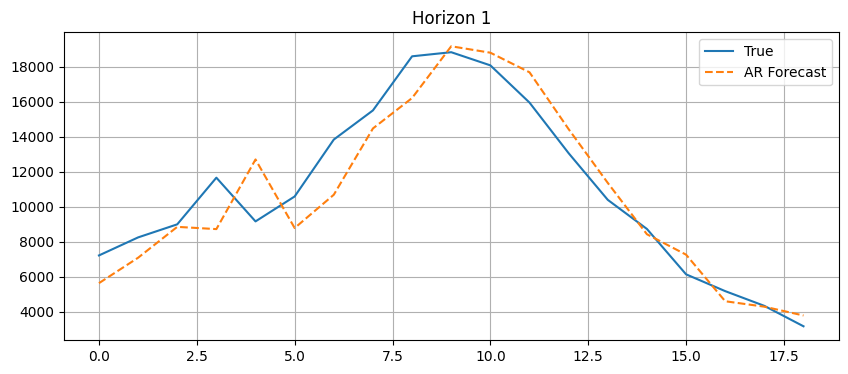

true_values.shape, predicted_values.shape: (19,) (19,)
Horizon 2: MSE=0.2210, MAE=0.3874, SMAPE=20.66%


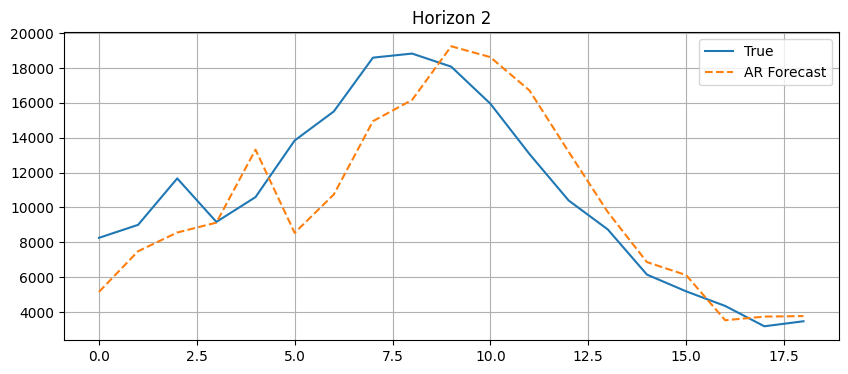

true_values.shape, predicted_values.shape: (19,) (19,)
Horizon 3: MSE=0.4115, MAE=0.4939, SMAPE=26.34%


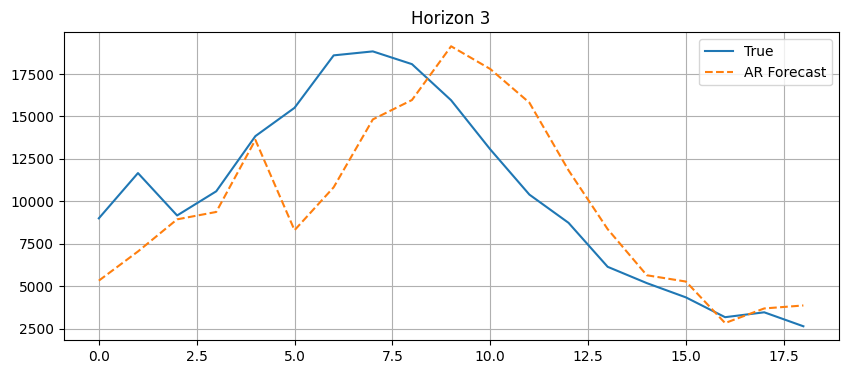

true_values.shape, predicted_values.shape: (19,) (19,)
Horizon 4: MSE=0.6649, MAE=0.6456, SMAPE=37.99%


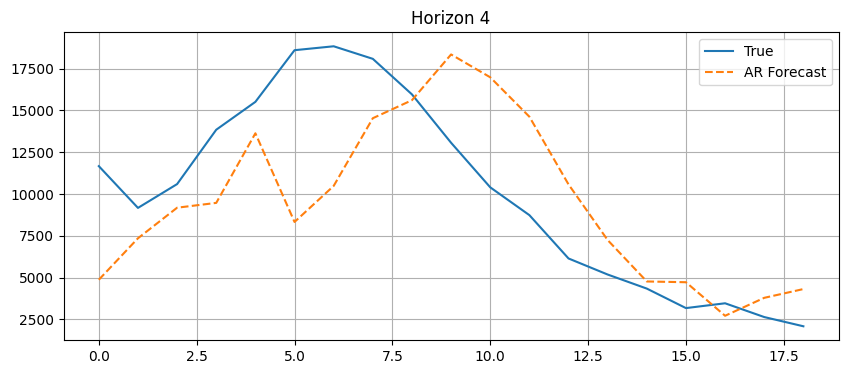

true_values.shape, predicted_values.shape: (19,) (19,)
Horizon 5: MSE=0.7936, MAE=0.7422, SMAPE=44.26%


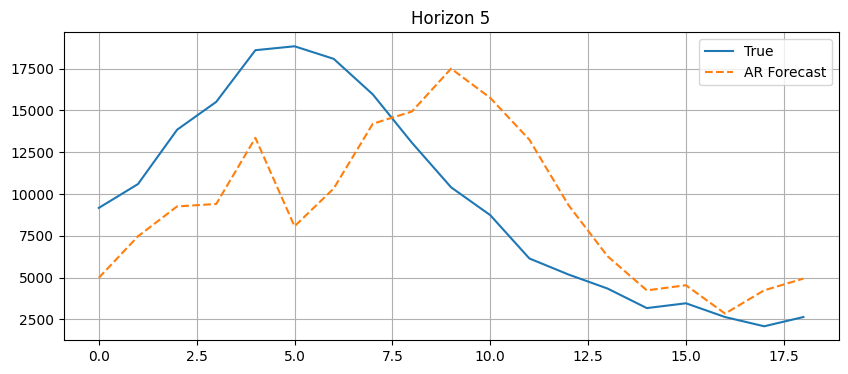

true_values.shape, predicted_values.shape: (19,) (19,)
Horizon 6: MSE=0.9822, MAE=0.8567, SMAPE=54.90%


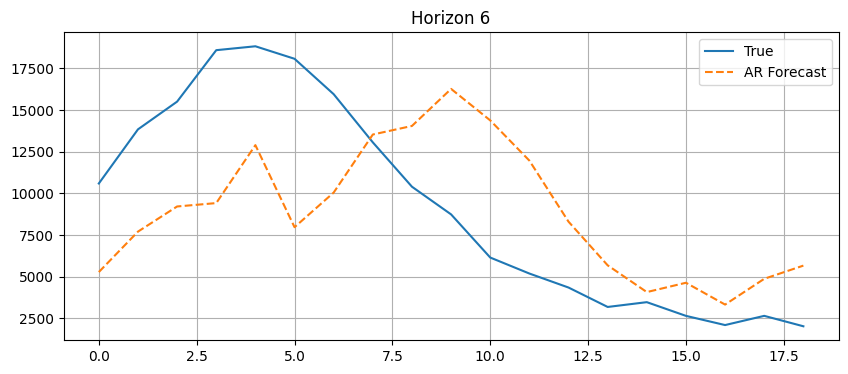

Horizon 1: MSE=0.0886, MAE=0.2385, SMAPE=13.31%
Horizon 2: MSE=0.2210, MAE=0.3874, SMAPE=20.66%
Horizon 3: MSE=0.4115, MAE=0.4939, SMAPE=26.34%
Horizon 4: MSE=0.6649, MAE=0.6456, SMAPE=37.99%
Horizon 5: MSE=0.7936, MAE=0.7422, SMAPE=44.26%
Horizon 6: MSE=0.9822, MAE=0.8567, SMAPE=54.90%


In [10]:




import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.ar_model import AutoReg

# --- Utility: SMAPE metric ---
def smape(true, pred):
    print("true_values.shape, predicted_values.shape:",true.shape, pred.shape)
    return 100 * np.mean(2 * np.abs(pred - true) / (np.abs(true) + np.abs(pred)))

# --- Load and preprocess data ---
df = pd.read_csv("./../dataset/rag_data/data/covid_till14May22.csv")  # replace with actual file path
data = df[['new_deaths','icu_patients']]  # endogenous + exogenous

# data = np.log1p(data)
# scaler = StandardScaler()
# data_scaled = scaler.fit_transform(data)
# --- Split data ---
split = int(0.8 * len(data))

scaler = StandardScaler()
scaler.fit(np.array(data)[:split,:])
data_scaled = scaler.transform(data)

endog = data_scaled[:, 0]             # ICU patients (target)
exog = data_scaled[:, 1:]             # Exogenous variables
horizon = 6


train_y, test_y = endog[:split], endog[split:]
train_x, test_x = exog[:split], exog[split:]

# --- Rolling forecast with ARX ---
mse_global, mae_global, smape_global = [], [], []
predictions, truths = [], []

for i in range(len(test_y) - horizon+1):
    y_train_i = np.concatenate([train_y, test_y[:i]])

    model = AutoReg(endog=y_train_i, lags=6) #, exog=x_train_i)
    model_fit = model.fit()

  
    pred = model_fit.predict(
        start=len(y_train_i),
        end=len(y_train_i) + horizon - 1
    )
    
    true = test_y[i:i + horizon]

    predictions.append(pred)
    truths.append(true)

predictions = np.array(predictions)
truths = np.array(truths)

# --- Evaluate for each horizon ---
for h in range(horizon):
    trues = truths[:, h].reshape(-1, 1)
    preds = predictions[:, h].reshape(-1, 1)

    mse = mean_squared_error(trues, preds)
    mae = mean_absolute_error(trues, preds)

    # Inverse transform for SMAPE
    trues_full = np.hstack([trues, np.zeros((len(trues), 1))])
    preds_full = np.hstack([preds, np.zeros((len(preds), 1))])
#     trues_inv = np.expm1(scaler.inverse_transform(trues_full))[:, 0]
#     preds_inv = np.expm1(scaler.inverse_transform(preds_full))[:, 0]

    trues_inv = (scaler.inverse_transform(trues_full))[:, 0]
    preds_inv = (scaler.inverse_transform(preds_full))[:, 0]
    
    smape_val = smape(trues_inv, preds_inv)

    mse_global.append(mse)
    mae_global.append(mae)
    smape_global.append(smape_val)

    print(f"Horizon {h+1}: MSE={mse:.4f}, MAE={mae:.4f}, SMAPE={smape_val:.2f}%")

    # Plot
    plt.figure(figsize=(10, 4))
    plt.plot(trues_inv, label="True")
    plt.plot(preds_inv, label="AR Forecast", linestyle="--")
    plt.title(f"Horizon {h+1}")
    plt.legend()
    plt.grid()
    plt.show()
    
# --- Evaluate for each horizon ---
for h in range(horizon):
    print(f"Horizon {h+1}: MSE={mse_global[h]:.4f}, MAE={mae_global[h]:.4f}, SMAPE={smape_global[h]:.2f}%")



In [15]:
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Example data
import numpy as np
np.random.seed(42)
y = np.random.randn(100)

# AutoReg
ar_model = AutoReg(y, lags=6, trend='c').fit()

# ARIMA
arima_model = ARIMA(y, order=(6,0,0), trend='c').fit()

# SARIMAX
sarimax_model = SARIMAX(y, order=(6,0,0), trend='c').fit()

# Compare predictions
print("AutoReg:", ar_model.params)
print("ARIMA:", arima_model.params)
print("SARIMAX:", sarimax_model.params)


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.29653D+00    |proj g|=  4.19791D-02

At iterate    5    f=  1.29556D+00    |proj g|=  7.92620D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8      7      9      1     0     0   4.189D-06   1.296D+00
  F =   1.2955628506423076     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
AutoReg: [-0.13358782 -0.02591645 -0.04409361 -0.03114088 -0.05585654  0.195681
 -0.01838536]
ARIMA: [-0.10237676 -0.00976423 -0.037

 This problem is unconstrained.


#### SARIMA(AR)

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.89072D-02    |proj g|=  1.36478D+00

At iterate    5    f=  4.87549D-03    |proj g|=  3.76795D-01

At iterate   10    f= -3.43656D-03    |proj g|=  4.98048D-03

At iterate   15    f= -3.58367D-03    |proj g|=  2.09980D-02

At iterate   20    f= -3.60111D-03    |proj g|=  7.54414D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     20     23      1     0     0   7.544D-05  -3.601D-03
  F =  -3.6011089791941463E-003

CONVERG

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -1.31161D-03    |proj g|=  1.37425D-02

At iterate   15    f= -1.43700D-03    |proj g|=  6.85587D-03

At iterate   20    f= -1.46224D-03    |proj g|=  1.57957D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     23     27      1     0     0   8.797D-06  -1.462D-03
  F =  -1.4622946648352982E-003

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.72167D-02    |proj g|=  1.39620D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -4.87355D-03    |proj g|=  1.52183D-02

At iterate   20    f= -4.89961D-03    |proj g|=  2.66746D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     21     25      1     0     0   1.752D-05  -4.900D-03
  F =  -4.8996106321748580E-003

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.15894D-02    |proj g|=  1.40483D+00

At iterate    5    f= -2.82173D-03    |proj g|=  3.60026D-01

At iter

 This problem is unconstrained.



At iterate   25    f=  3.54315D-03    |proj g|=  8.40111D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     25     41      1     0     0   8.401D-05   3.543D-03
  F =   3.5431494108127751E-003

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.70221D-02    |proj g|=  1.23922D+00

At iterate    5    f=  2.49686D-02    |proj g|=  3.46143D-01

At iterate   10    f=  1.84393D-02    |proj g|=  7.36174D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   25    f=  1.80086D-02    |proj g|=  5.62207D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     28     34      1     0     0   5.303D-05   1.801D-02
  F =   1.8007799790169757E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.40702D-02    |proj g|=  1.25466D+00

At iterate    5    f=  2.17722D-02    |proj g|=  3.47029D-01

At iterate   10    f=  1.50874D-02    |proj g|=  6.94111D-02

At iter

 This problem is unconstrained.



At iterate   25    f=  1.46148D-02    |proj g|=  4.25523D-04

At iterate   30    f=  1.46146D-02    |proj g|=  2.17341D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     30     35      1     0     0   2.173D-05   1.461D-02
  F =   1.4614608547283827E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.78312D-02    |proj g|=  1.09236D+00

At iterate    5    f=  3.84264D-02    |proj g|=  3.19281D-01

At iter

 This problem is unconstrained.



At iterate   20    f=  3.23030D-02    |proj g|=  5.91907D-03

At iterate   25    f=  3.22907D-02    |proj g|=  6.84327D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     27     33      1     0     0   5.763D-05   3.229D-02
  F =   3.2290657565151759E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.35314D-02    |proj g|=  1.04432D+00

At iterate    5    f=  3.55869D-02    |proj g|=  3.10027D-01

At iter

 This problem is unconstrained.



At iterate   20    f=  2.98389D-02    |proj g|=  8.06369D-03

At iterate   25    f=  2.97956D-02    |proj g|=  3.29314D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     26     32      1     0     0   9.880D-06   2.980D-02
  F =   2.9795612566246188E-002

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.97825D-02    |proj g|=  9.77587D-01

At iterate    5    f=  4.37140D-02    |proj g|=  2.81884D-01

At iter

 This problem is unconstrained.



At iterate   20    f=  3.79176D-02    |proj g|=  1.09264D-02

At iterate   25    f=  3.77842D-02    |proj g|=  2.69694D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     27     34      1     0     0   1.226D-05   3.778D-02
  F =   3.7784177106536372E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.47101D-02    |proj g|=  9.82246D-01

At iterate    5    f=  3.88190D-02    |proj g|=  2.83652D-01

At iter

 This problem is unconstrained.



At iterate   20    f=  3.30481D-02    |proj g|=  2.63464D-02

At iterate   25    f=  3.28107D-02    |proj g|=  1.02216D-03

At iterate   30    f=  3.28096D-02    |proj g|=  1.09397D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     31     38      1     0     0   5.547D-06   3.281D-02
  F =   3.2809619530418457E-002

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.47109D-02    |proj g|=  9.67548D-01

At iter

 This problem is unconstrained.



At iterate   15    f=  3.38859D-02    |proj g|=  2.19566D-02

At iterate   20    f=  3.37050D-02    |proj g|=  5.34896D-03

At iterate   25    f=  3.36475D-02    |proj g|=  1.32451D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     29     34      1     0     0   9.805D-06   3.365D-02
  F =   3.3647003193623702E-002

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.52262D-02    |proj g|=  9.16409D-01

At iter

 This problem is unconstrained.



At iterate   15    f=  3.56851D-02    |proj g|=  1.48034D-02

At iterate   20    f=  3.55501D-02    |proj g|=  8.23265D-03

At iterate   25    f=  3.55367D-02    |proj g|=  1.05720D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     27     33      1     0     0   5.400D-05   3.554D-02
  F =   3.5536684268677683E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.09342D-02    |proj g|=  8.82530D-01

At iter

 This problem is unconstrained.



At iterate   15    f=  3.24608D-02    |proj g|=  1.10574D-02

At iterate   20    f=  3.23593D-02    |proj g|=  1.85286D-03

At iterate   25    f=  3.23512D-02    |proj g|=  8.55056D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     27     34      1     0     0   1.070D-04   3.235D-02
  F =   3.2351139729213815E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.63938D-02    |proj g|=  8.55479D-01

At iter

 This problem is unconstrained.



At iterate   10    f=  2.91565D-02    |proj g|=  7.61810D-02

At iterate   15    f=  2.88973D-02    |proj g|=  1.08783D-02

At iterate   20    f=  2.88120D-02    |proj g|=  5.59034D-03

At iterate   25    f=  2.87957D-02    |proj g|=  9.40578D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     28     33      1     0     0   1.203D-04   2.880D-02
  F =   2.8795721877674301E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   10    f=  2.65243D-02    |proj g|=  7.54877D-02

At iterate   15    f=  2.62802D-02    |proj g|=  1.10552D-02

At iterate   20    f=  2.62165D-02    |proj g|=  4.23290D-03

At iterate   25    f=  2.61975D-02    |proj g|=  4.30738D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     26     31      1     0     0   1.215D-04   2.620D-02
  F =   2.6197498031663234E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   10    f=  2.39615D-02    |proj g|=  7.57008D-02

At iterate   15    f=  2.37157D-02    |proj g|=  9.96796D-03

At iterate   20    f=  2.36586D-02    |proj g|=  3.47533D-03

At iterate   25    f=  2.36490D-02    |proj g|=  4.58741D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     27     45      1     0     0   1.292D-05   2.365D-02
  F =   2.3649034695874403E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.71133D-02    |proj g|=  8.69735D-01

At iterate    5    f=  2.43499D-02    |proj g|=  2.74425D-01

At iterate   10    f=  2.02836D-02    |proj g|=  7.61536D-02

At iterate   15    f=  2.00316D-02    |proj g|=  1.43274D-02

At iterate   20    f=  1.99694D-02    |proj g|=  2.17412D-03

At iterate   25    f=  1.99548D-02    |proj g|=  2.16705D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     28     34      1     0     0   

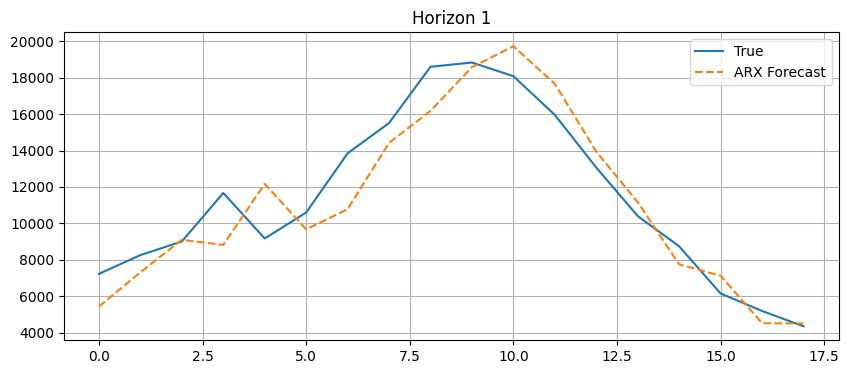

Horizon 2: MSE=0.2214, MAE=0.3909, SMAPE=20.16%


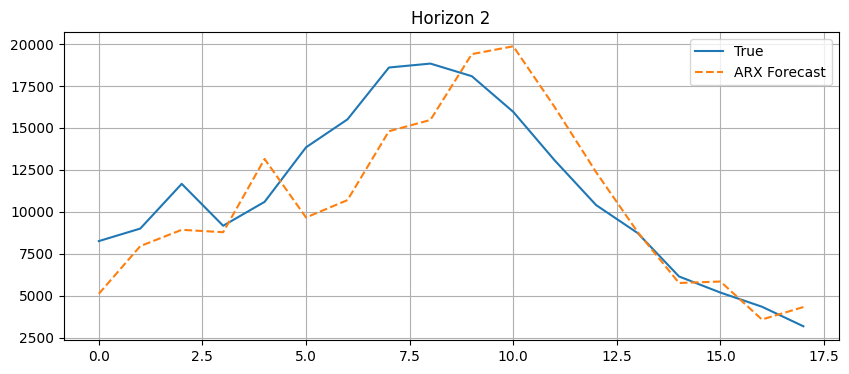

Horizon 3: MSE=0.4053, MAE=0.4893, SMAPE=24.43%


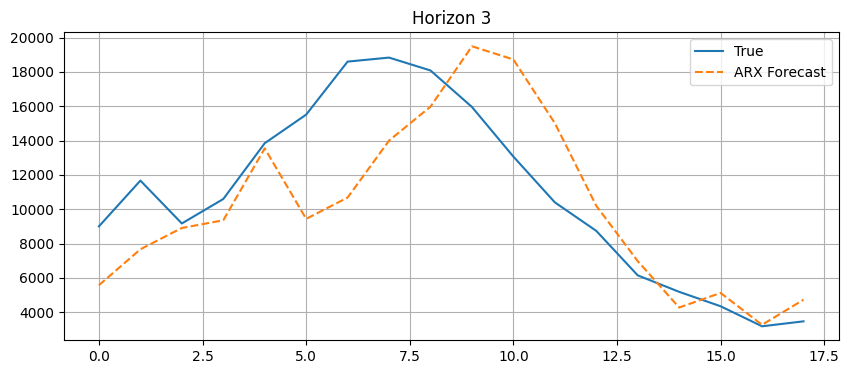

Horizon 4: MSE=0.6510, MAE=0.6213, SMAPE=33.81%


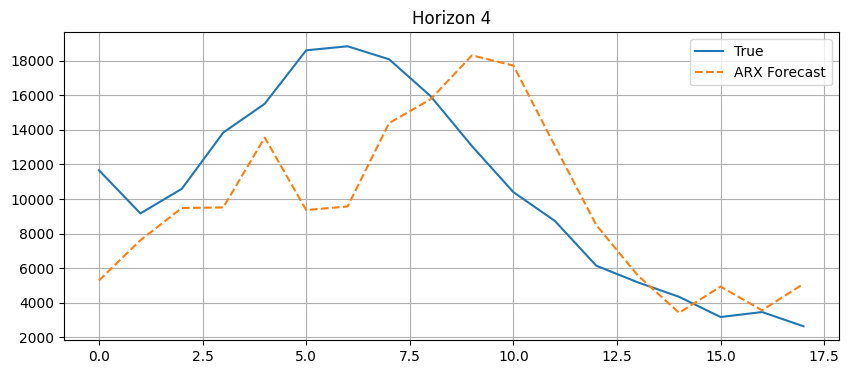

Horizon 5: MSE=0.7742, MAE=0.7217, SMAPE=41.59%


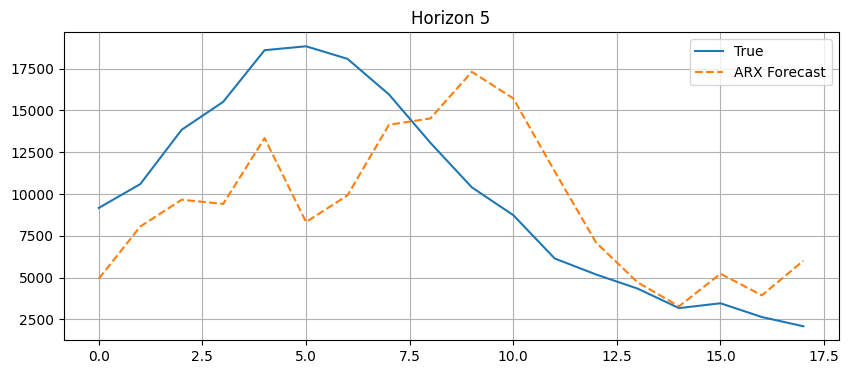

Horizon 6: MSE=0.9387, MAE=0.8342, SMAPE=51.60%


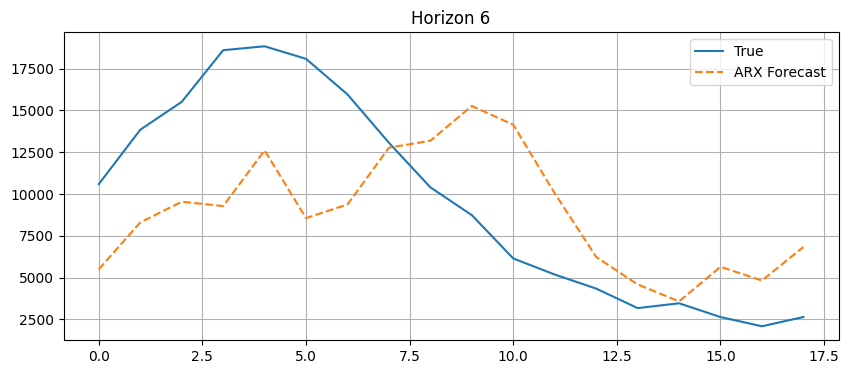

Horizon 1: MSE=0.0851, MAE=0.2404, SMAPE=12.81%
Horizon 2: MSE=0.2214, MAE=0.3909, SMAPE=20.16%
Horizon 3: MSE=0.4053, MAE=0.4893, SMAPE=24.43%
Horizon 4: MSE=0.6510, MAE=0.6213, SMAPE=33.81%
Horizon 5: MSE=0.7742, MAE=0.7217, SMAPE=41.59%
Horizon 6: MSE=0.9387, MAE=0.8342, SMAPE=51.60%


In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.statespace.sarimax import SARIMAX


p=7
d=0
q=0
P=0
D=0
Q=0
S=0

#     for p in range(1,5):
#         for q in range(1,5)

order = (p,d,q)
seasonal_order = (P,D,Q,S)


# --- Utility: SMAPE metric ---
def smape(true, pred):
    return 100 * np.mean(2 * np.abs(pred - true) / (np.abs(true) + np.abs(pred)))

# --- Load and preprocess data ---
df = pd.read_csv("./../dataset/rag_data/data/covid_till14May22.csv")  # replace with actual file path
data = df[['new_deaths','icu_patients']]  # endogenous + exogenous

# data = np.log1p(data)
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

endog = data_scaled[:, 0]             # ICU patients (target)
exog = data_scaled[:, 1:]             # Exogenous variables
horizon = 6

# --- Split data ---
split = int(0.8 * len(endog))
train_y, test_y = endog[:split], endog[split:]
train_x, test_x = exog[:split], exog[split:]

# --- Rolling forecast with ARX ---
mse_global, mae_global, smape_global = [], [], []
predictions, truths = [], []

for i in range(len(test_y) - horizon):
    y_train_i = np.concatenate([train_y, test_y[:i]])
    x_train_i = np.vstack([train_x, test_x[:i]])

    model = SARIMAX(y_train_i, order=order, seasonal_order=seasonal_order) #AutoReg(endog=y_train_i, lags=6) #, exog=x_train_i)
    model_fit = model.fit()

    x_forecast = x_train_i #exog[split+i-9:split+i] #test_x[i-92:i] #[i:i + horizon]
    
        # Provide future exogenous variables for forecasting
#     x_oos = test_x[i:i + horizon]
#     pred = model_fit.predict(
#         start=len(y_train_i),
#         end=len(y_train_i) + horizon - 1,
# #         exog_oos=x_oos,
# #         exog=x_forecast
#     )
    pred = model_fit.forecast( steps=horizon) #,exog=train_series[-horizon:,1:])
    
#     pred = model_fit.predict(start=len(y_train_i), end=len(y_train_i) + horizon - 1, exog=x_forecast)
    true = test_y[i:i + horizon]

    predictions.append(pred)
    truths.append(true)

predictions = np.array(predictions)
truths = np.array(truths)

# --- Evaluate for each horizon ---
for h in range(horizon):
    trues = truths[:, h].reshape(-1, 1)
    preds = predictions[:, h].reshape(-1, 1)

    mse = mean_squared_error(trues, preds)
    mae = mean_absolute_error(trues, preds)

    # Inverse transform for SMAPE
    trues_full = np.hstack([trues, np.zeros((len(trues), 1))])
    preds_full = np.hstack([preds, np.zeros((len(preds), 1))])
#     trues_inv = np.expm1(scaler.inverse_transform(trues_full))[:, 0]
#     preds_inv = np.expm1(scaler.inverse_transform(preds_full))[:, 0]

    trues_inv = (scaler.inverse_transform(trues_full))[:, 0]
    preds_inv = (scaler.inverse_transform(preds_full))[:, 0]
    
    smape_val = smape(trues_inv, preds_inv)

    mse_global.append(mse)
    mae_global.append(mae)
    smape_global.append(smape_val)

    print(f"Horizon {h+1}: MSE={mse:.4f}, MAE={mae:.4f}, SMAPE={smape_val:.2f}%")

    # Plot
    plt.figure(figsize=(10, 4))
    
    
#         plt.plot(range(split_idx, len(time_series)-horizon), trues, label='True Values', color='blue', marker='o', linestyle='-')
#         plt.plot(range(split_idx, len(time_series)-horizon), preds, label='Random Walk Forecast', color='red', linestyle='--', marker='x')
        
    plt.plot(trues_inv, color='blue', marker='o', linestyle='-', label="True")
    plt.plot(preds_inv, label="ARX Forecast", color='red', linestyle='--', marker='x')
    plt.title(f"Horizon {h+1}")
    plt.legend()
    plt.grid()
    plt.show()
    
# --- Evaluate for each horizon ---
for h in range(horizon):
    print(f"Horizon {h+1}: MSE={mse_global[h]:.4f}, MAE={mae_global[h]:.4f}, SMAPE={smape_global[h]:.2f}%")

    
    

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.16943D+00    |proj g|=  7.67011D-01

At iterate    5    f=  5.55816D-03    |proj g|=  1.84604D-01

At iterate   10    f= -3.47107D-03    |proj g|=  3.13073D-03

At iterate   15    f= -3.57668D-03    |proj g|=  2.32873D-02

At iterate   20    f= -3.60110D-03    |proj g|=  8.20771D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    9     22     26      1     0     0   1.467D-05  -3.601D-03
  F =  -3.6011099472252894E-003

CONVERG

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -1.35603D-03    |proj g|=  1.17001D-02

At iterate   15    f= -1.43078D-03    |proj g|=  7.76563D-03

At iterate   20    f= -1.46093D-03    |proj g|=  2.02914D-03

At iterate   25    f= -1.46228D-03    |proj g|=  2.16752D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    9     27     32      1     0     0   5.883D-06  -1.462D-03
  F =  -1.4622949600838501E-003

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -4.88759D-03    |proj g|=  3.45167D-03

At iterate   20    f= -4.89961D-03    |proj g|=  4.28935D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    9     21     24      1     0     0   1.032D-05  -4.900D-03
  F =  -4.8996107431434665E-003

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.16669D+00    |proj g|=  7.68127D-01

At iterate    5    f= -6.93774D-03    |proj g|=  4.48008D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  2.20510D-02    |proj g|=  4.26984D-02

At iterate   10    f=  1.80707D-02    |proj g|=  2.38907D-03

At iterate   15    f=  1.80111D-02    |proj g|=  1.66517D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    9     19     25      1     0     0   1.893D-05   1.801D-02
  F =   1.8007799744961289E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.16604D+00    |proj g|=  7.67704D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    9     19     25      1     0     0   4.080D-05   1.461D-02
  F =   1.4614610076524683E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.16644D+00    |proj g|=  7.67898D-01

At iterate    5    f=  4.86431D-02    |proj g|=  8.09398D-01

At iterate   10    f=  3.55649D-02    |proj g|=  1.47562D-01

At iterate   15    f=  3.25131D-02    |proj g|=  8.96292D-03

At iter

 This problem is unconstrained.



At iterate   30    f=  2.97956D-02    |proj g|=  3.54445D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    9     31     39      1     0     0   2.609D-05   2.980D-02
  F =   2.9795612771648151E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.17231D+00    |proj g|=  7.66328D-01

At iterate    5    f=  5.11680D-02    |proj g|=  1.22992D-01

At iterate   10    f=  3.89139D-02    |proj g|=  1.67410D-02

At iter

 This problem is unconstrained.



At iterate   30    f=  3.77842D-02    |proj g|=  4.72526D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    9     30     39      1     0     0   4.725D-05   3.778D-02
  F =   3.7784177524379715E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.17434D+00    |proj g|=  7.66530D-01

At iterate    5    f=  4.45236D-02    |proj g|=  5.20230D-01

At iterate   10    f=  3.51204D-02    |proj g|=  6.01562D-02

At iter

 This problem is unconstrained.



At iterate   30    f=  3.28096D-02    |proj g|=  1.95971D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    9     30     37      1     0     0   1.960D-05   3.281D-02
  F =   3.2809619979714336E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.17448D+00    |proj g|=  7.65916D-01

At iterate    5    f=  4.80673D-02    |proj g|=  6.79743D-01

At iterate   10    f=  3.71477D-02    |proj g|=  5.18645D-02

At iter

 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    9     34     38      1     0     0   5.575D-06   3.365D-02
  F =   3.3647003030246612E-002

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.17429D+00    |proj g|=  7.66865D-01

At iterate    5    f=  4.78177D-02    |proj g|=  1.82124D-01

At iterate   10    f=  3.68982D-02    |proj g|=  8.03997D-02

At iterate   15    f=  3.57094D-02    |proj g|=  8.96541D-03

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.17388D+00    |proj g|=  7.66949D-01

At iterate    5    f=  3.93808D-02    |proj g|=  1.52952D-01

At iterate   10    f=  3.26555D-02    |proj g|=  1.67456D-02

At iterate   15    f=  3.24360D-02    |proj g|=  1.03217D-02

At iterate   20    f=  3.23546D-02    |proj g|=  7.93813D-03

At iterate   25    f=  3.23511D-02    |proj g|=  4.09677D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    9     27     33      1     0     0   

 This problem is unconstrained.



At iterate    5    f=  3.94120D-02    |proj g|=  1.11045D-01

At iterate   10    f=  3.02296D-02    |proj g|=  2.93976D-02

At iterate   15    f=  2.89413D-02    |proj g|=  1.53366D-02

At iterate   20    f=  2.88698D-02    |proj g|=  2.51953D-03

At iterate   25    f=  2.87980D-02    |proj g|=  3.67689D-03

At iterate   30    f=  2.87957D-02    |proj g|=  1.26968D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    9     33     55      1     0     0   1.171D-05   2.880D-02
  F =   2.8795721544888752E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.17333D+00    |proj g|=  7.65549D-01

At iterate    5    f=  3.38846D-02    |proj g|=  1.94359D-01

At iterate   10    f=  2.42945D-02    |proj g|=  5.69967D-02

At iterate   15    f=  2.37162D-02    |proj g|=  8.49724D-03

At iterate   20    f=  2.36866D-02    |proj g|=  3.12468D-03

At iterate   25    f=  2.36495D-02    |proj g|=  1.10389D-03


 This problem is unconstrained.



At iterate   30    f=  2.36490D-02    |proj g|=  1.30020D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    9     30     42      1     0     0   1.300D-05   2.365D-02
  F =   2.3649034641486280E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.17355D+00    |proj g|=  7.65488D-01

At iterate    5    f=  3.00225D-02    |proj g|=  9.09163D-02

At iterate   10    f=  2.15886D-02    |proj g|=  2.28773D-02

At iter

 This problem is unconstrained.



At iterate   30    f=  1.99548D-02    |proj g|=  3.01863D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    9     30     37      1     0     0   3.019D-05   1.995D-02
  F =   1.9954752496074327E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
Q: [[[0.05894361]]]
R: [[[7.24263899e-12]]]
Horizon 1: MSE=0.0851, MAE=0.2404, SMAPE=12.81%


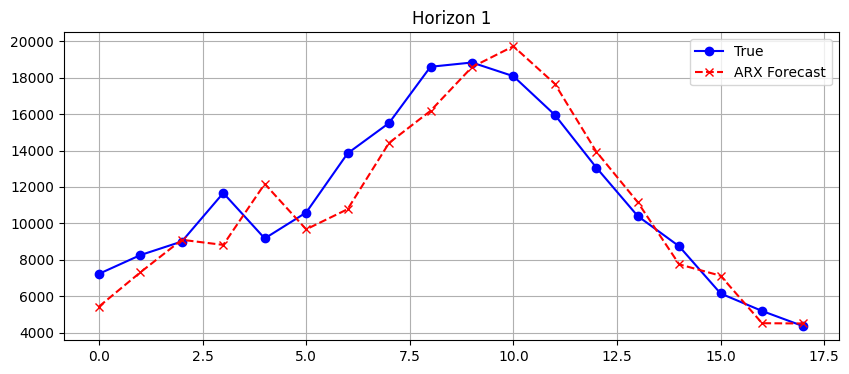

Horizon 2: MSE=0.2214, MAE=0.3909, SMAPE=20.16%


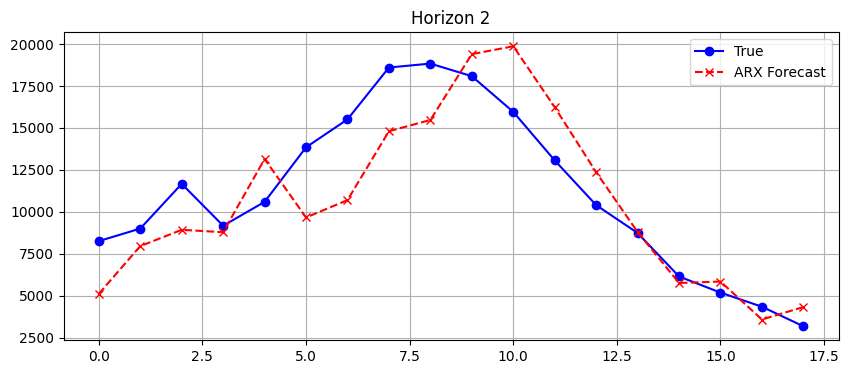

Horizon 3: MSE=0.4053, MAE=0.4893, SMAPE=24.43%


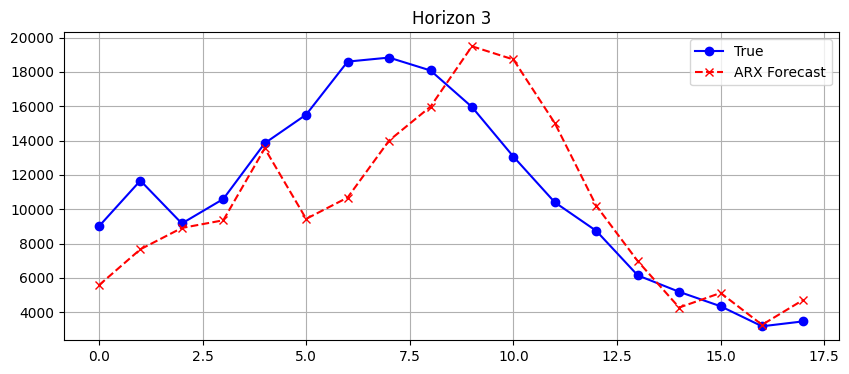

Horizon 4: MSE=0.6510, MAE=0.6213, SMAPE=33.81%


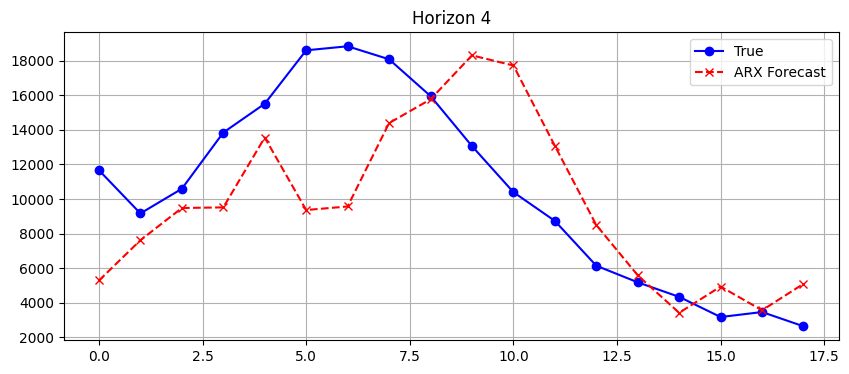

Horizon 5: MSE=0.7742, MAE=0.7217, SMAPE=41.59%


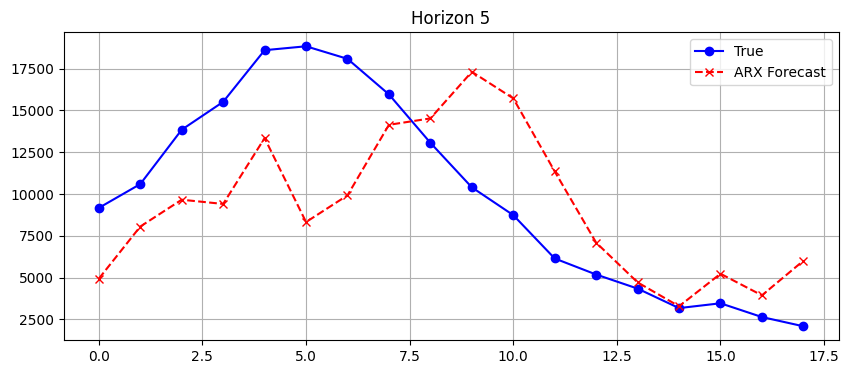

Horizon 6: MSE=0.9387, MAE=0.8342, SMAPE=51.60%


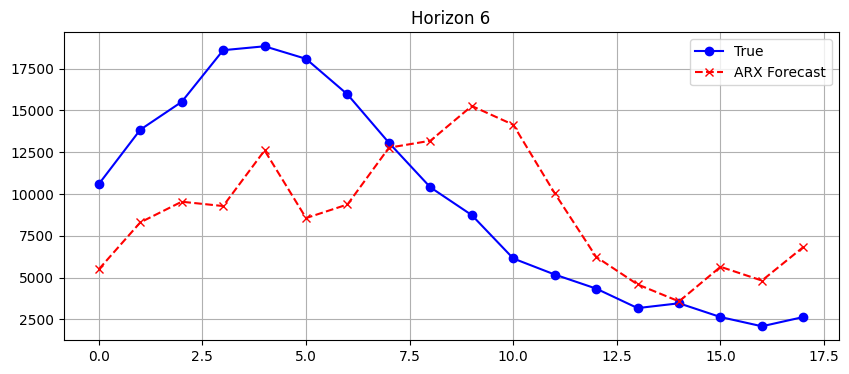

Horizon 1: MSE=0.0851, MAE=0.2404, SMAPE=12.81%
Horizon 2: MSE=0.2214, MAE=0.3909, SMAPE=20.16%
Horizon 3: MSE=0.4053, MAE=0.4893, SMAPE=24.43%
Horizon 4: MSE=0.6510, MAE=0.6213, SMAPE=33.81%
Horizon 5: MSE=0.7742, MAE=0.7217, SMAPE=41.59%
Horizon 6: MSE=0.9387, MAE=0.8342, SMAPE=51.60%


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.statespace.sarimax import SARIMAX


p=7
d=0
q=0
P=0
D=0
Q=0
S=0

#     for p in range(1,5):
#         for q in range(1,5)

order = (p,d,q)
seasonal_order = (P,D,Q,S)


# --- Utility: SMAPE metric ---
def smape(true, pred):
    return 100 * np.mean(2 * np.abs(pred - true) / (np.abs(true) + np.abs(pred)))

# --- Load and preprocess data ---
df = pd.read_csv("./../dataset/rag_data/data/covid_till14May22.csv")  # replace with actual file path
data = df[['new_deaths','icu_patients']]  # endogenous + exogenous

# data = np.log1p(data)
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

endog = data_scaled[:, 0]             # ICU patients (target)
exog = data_scaled[:, 1:]             # Exogenous variables
horizon = 6

# --- Split data ---
split = int(0.8 * len(endog))
train_y, test_y = endog[:split], endog[split:]
train_x, test_x = exog[:split], exog[split:]

# --- Rolling forecast with ARX ---
mse_global, mae_global, smape_global = [], [], []
predictions, truths = [], []

for i in range(len(test_y) - horizon):
    y_train_i = np.concatenate([train_y, test_y[:i]])
    x_train_i = np.vstack([train_x, test_x[:i]])

    model = SARIMAX(y_train_i, order=order, seasonal_order=seasonal_order,measurement_error=True) #AutoReg(endog=y_train_i, lags=6) #, exog=x_train_i)
    model_fit = model.fit()

    x_forecast = x_train_i #exog[split+i-9:split+i] #test_x[i-92:i] #[i:i + horizon]
    
        # Provide future exogenous variables for forecasting
#     x_oos = test_x[i:i + horizon]
#     pred = model_fit.predict(
#         start=len(y_train_i),
#         end=len(y_train_i) + horizon - 1,
# #         exog_oos=x_oos,
# #         exog=x_forecast
#     )
    pred = model_fit.forecast( steps=horizon) #,exog=train_series[-horizon:,1:])
    
#     pred = model_fit.predict(start=len(y_train_i), end=len(y_train_i) + horizon - 1, exog=x_forecast)
    true = test_y[i:i + horizon]

    predictions.append(pred)
    truths.append(true)


Q = model_fit.filter_results.state_cov  # Process covariance matrix (approximate Q)
R = model_fit.filter_results.obs_cov    # Observation covariance (R)

print("Q:",Q)

print("R:",R)

predictions = np.array(predictions)
truths = np.array(truths)

# --- Evaluate for each horizon ---
for h in range(horizon):
    trues = truths[:, h].reshape(-1, 1)
    preds = predictions[:, h].reshape(-1, 1)

    mse = mean_squared_error(trues, preds)
    mae = mean_absolute_error(trues, preds)

    # Inverse transform for SMAPE
    trues_full = np.hstack([trues, np.zeros((len(trues), 1))])
    preds_full = np.hstack([preds, np.zeros((len(preds), 1))])
#     trues_inv = np.expm1(scaler.inverse_transform(trues_full))[:, 0]
#     preds_inv = np.expm1(scaler.inverse_transform(preds_full))[:, 0]

    trues_inv = (scaler.inverse_transform(trues_full))[:, 0]
    preds_inv = (scaler.inverse_transform(preds_full))[:, 0]
    
    smape_val = smape(trues_inv, preds_inv)

    mse_global.append(mse)
    mae_global.append(mae)
    smape_global.append(smape_val)

    print(f"Horizon {h+1}: MSE={mse:.4f}, MAE={mae:.4f}, SMAPE={smape_val:.2f}%")

    # Plot
    plt.figure(figsize=(10, 4))
    
    
#         plt.plot(range(split_idx, len(time_series)-horizon), trues, label='True Values', color='blue', marker='o', linestyle='-')
#         plt.plot(range(split_idx, len(time_series)-horizon), preds, label='Random Walk Forecast', color='red', linestyle='--', marker='x')
        
    plt.plot(trues_inv, color='blue', marker='o', linestyle='-', label="True")
    plt.plot(preds_inv, label="ARX Forecast", color='red', linestyle='--', marker='x')
    plt.title(f"Horizon {h+1}")
    plt.legend()
    plt.grid()
    plt.show()
    
# --- Evaluate for each horizon ---
for h in range(horizon):
    print(f"Horizon {h+1}: MSE={mse_global[h]:.4f}, MAE={mae_global[h]:.4f}, SMAPE={smape_global[h]:.2f}%")

    
    

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.99896D-03    |proj g|=  1.34852D-01

At iterate    5    f=  1.17341D-03    |proj g|=  3.94048D-04

At iterate   10    f=  1.17302D-03    |proj g|=  6.15819D-04

At iterate   15    f=  1.17241D-03    |proj g|=  9.60533D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     15     21      1     0     0   9.605D-06   1.172D-03
  F =   1.1724122763053645E-003

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.97662D-03    |proj g|=  1.42316D-01

At iterate    5    f=  2.12725D-03    |proj g|=  2.35253D-03

At iterate   10    f=  2.12266D-03    |proj g|=  2.02005D-04

At iterate   15    f=  2.12234D-03    |proj g|=  1.54317D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     16     21      1     0     0   5.756D-06   2.122D-03
  F =   2.1223402933247537E-003

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING 

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  9.40813D-03    |proj g|=  6.13559D-04

At iterate   10    f=  9.40788D-03    |proj g|=  4.11919D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     13     18      1     0     0   2.823D-05   9.408D-03
  F =   9.4078027327086575E-003

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.58643D-02    |proj g|=  1.23399D-01

At iterate    5    f=  3.51006D-02    |proj g|=  1.75345D-03

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  5.23268D-02    |proj g|=  8.90883D-04

At iterate   10    f=  5.23185D-02    |proj g|=  3.33805D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     13     20      1     0     0   1.016D-05   5.232D-02
  F =   5.2318355276343119E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.03205D-02    |proj g|=  8.01534D-02

At iterate    5    f=  5.98332D-02    |proj g|=  2.29072D-04

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  5.09185D-02    |proj g|=  1.15656D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     14     21      1     0     0   9.891D-06   5.092D-02
  F =   5.0918137126475915E-002

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.27226D-02    |proj g|=  8.79155D-02

At iterate    5    f=  5.21858D-02    |proj g|=  1.11326D-03

At iterate   10    f=  5.21750D-02    |proj g|=  9.98971D-04

       

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.38891D-02    |proj g|=  8.82303D-02

At iterate    5    f=  4.33737D-02    |proj g|=  1.40905D-03

At iterate   10    f=  4.33565D-02    |proj g|=  2.15068D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     14     20      1     0     0   9.226D-06   4.336D-02
  F =   4.3356467705972547E-002

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220

 This problem is unconstrained.


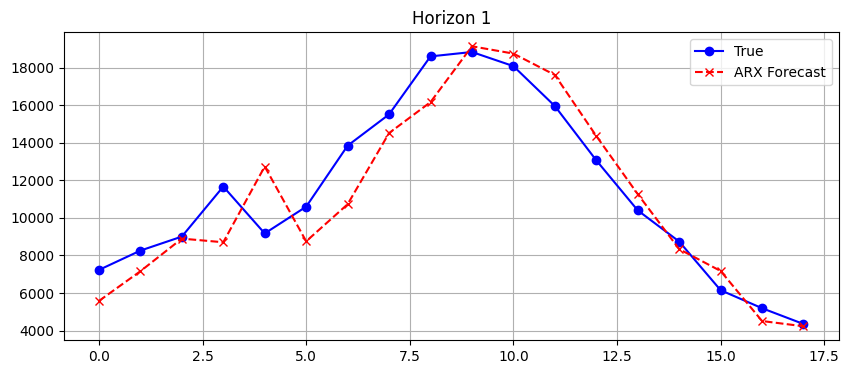

Horizon 2: MSE=0.2305, MAE=0.3973, SMAPE=20.74%


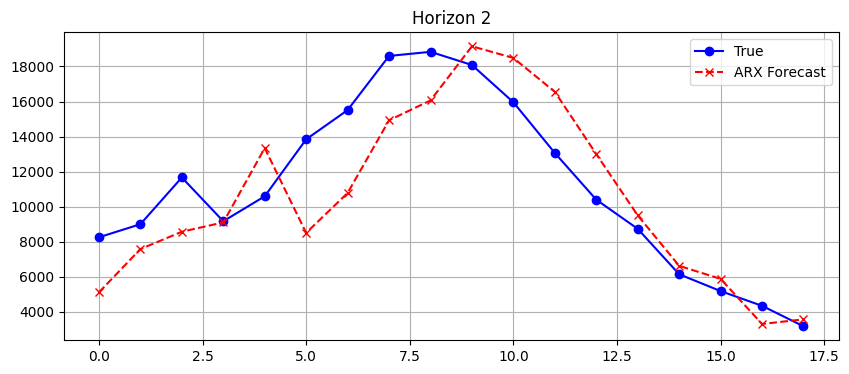

Horizon 3: MSE=0.4194, MAE=0.4927, SMAPE=24.58%


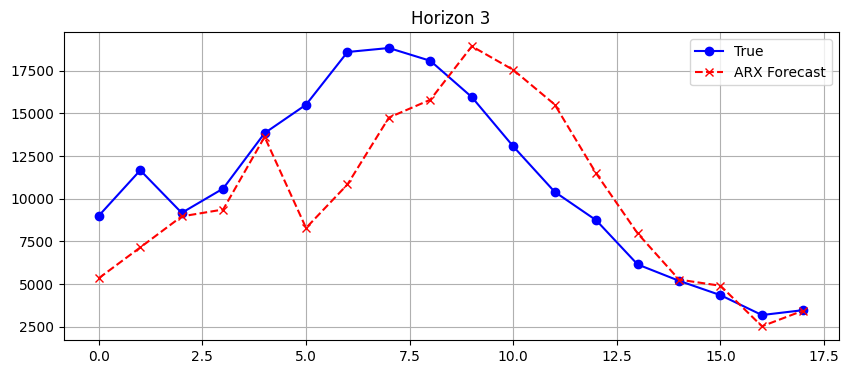

Horizon 4: MSE=0.6670, MAE=0.6367, SMAPE=34.60%


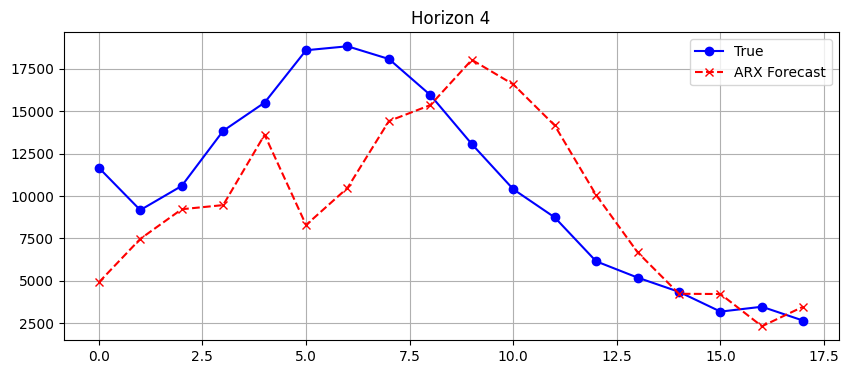

Horizon 5: MSE=0.7809, MAE=0.7175, SMAPE=39.57%


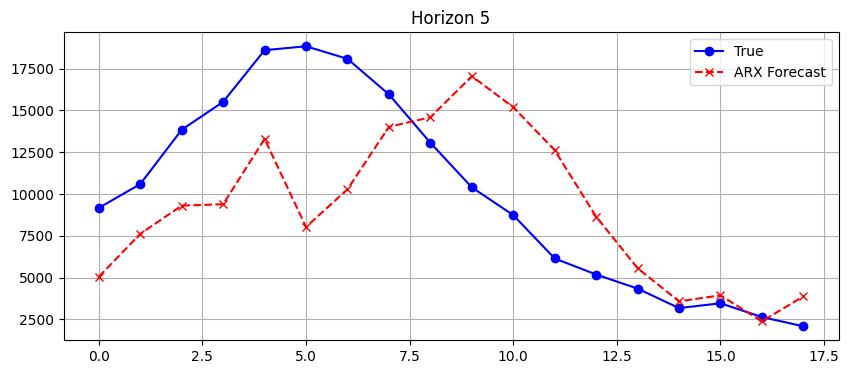

Horizon 6: MSE=0.9401, MAE=0.8080, SMAPE=47.34%


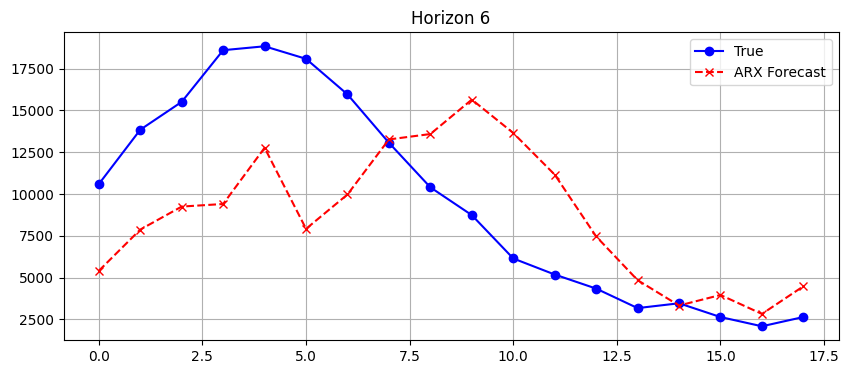

Horizon 1: MSE=0.0938, MAE=0.2461, SMAPE=13.20%
Horizon 2: MSE=0.2305, MAE=0.3973, SMAPE=20.74%
Horizon 3: MSE=0.4194, MAE=0.4927, SMAPE=24.58%
Horizon 4: MSE=0.6670, MAE=0.6367, SMAPE=34.60%
Horizon 5: MSE=0.7809, MAE=0.7175, SMAPE=39.57%
Horizon 6: MSE=0.9401, MAE=0.8080, SMAPE=47.34%


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.statespace.sarimax import SARIMAX


p=6
d=0
q=0
P=0
D=0
Q=0
S=0

#     for p in range(1,5):
#         for q in range(1,5)

order = (p,d,q)
seasonal_order = (P,D,Q,S)


# --- Utility: SMAPE metric ---
def smape(true, pred):
    return 100 * np.mean(2 * np.abs(pred - true) / (np.abs(true) + np.abs(pred)))

# --- Load and preprocess data ---
df = pd.read_csv("./../dataset/rag_data/data/covid_till14May22.csv")  # replace with actual file path
data = df[['new_deaths','icu_patients']]  # endogenous + exogenous

# data = np.log1p(data)
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

endog = data_scaled[:, 0]             # ICU patients (target)
exog = data_scaled[:, 1:]             # Exogenous variables
horizon = 6

# --- Split data ---
split = int(0.8 * len(endog))
train_y, test_y = endog[:split], endog[split:]
train_x, test_x = exog[:split], exog[split:]

# --- Rolling forecast with ARX ---
mse_global, mae_global, smape_global = [], [], []
predictions, truths = [], []

for i in range(len(test_y) - horizon):
    y_train_i = np.concatenate([train_y, test_y[:i]])
    x_train_i = np.vstack([train_x, test_x[:i]])

    model = SARIMAX(y_train_i, order=order, seasonal_order=seasonal_order) #AutoReg(endog=y_train_i, lags=6) #, exog=x_train_i)
    model_fit = model.fit()

    x_forecast = x_train_i #exog[split+i-9:split+i] #test_x[i-92:i] #[i:i + horizon]
    
        # Provide future exogenous variables for forecasting
#     x_oos = test_x[i:i + horizon]
#     pred = model_fit.predict(
#         start=len(y_train_i),
#         end=len(y_train_i) + horizon - 1,
# #         exog_oos=x_oos,
# #         exog=x_forecast
#     )
    pred = model_fit.forecast( steps=horizon) #,exog=train_series[-horizon:,1:])
    
#     pred = model_fit.predict(start=len(y_train_i), end=len(y_train_i) + horizon - 1, exog=x_forecast)
    true = test_y[i:i + horizon]

    predictions.append(pred)
    truths.append(true)

predictions = np.array(predictions)
truths = np.array(truths)

# --- Evaluate for each horizon ---
for h in range(horizon):
    trues = truths[:, h].reshape(-1, 1)
    preds = predictions[:, h].reshape(-1, 1)

    mse = mean_squared_error(trues, preds)
    mae = mean_absolute_error(trues, preds)

    # Inverse transform for SMAPE
    trues_full = np.hstack([trues, np.zeros((len(trues), 1))])
    preds_full = np.hstack([preds, np.zeros((len(preds), 1))])
#     trues_inv = np.expm1(scaler.inverse_transform(trues_full))[:, 0]
#     preds_inv = np.expm1(scaler.inverse_transform(preds_full))[:, 0]

    trues_inv = (scaler.inverse_transform(trues_full))[:, 0]
    preds_inv = (scaler.inverse_transform(preds_full))[:, 0]
    
    smape_val = smape(trues_inv, preds_inv)

    mse_global.append(mse)
    mae_global.append(mae)
    smape_global.append(smape_val)

    print(f"Horizon {h+1}: MSE={mse:.4f}, MAE={mae:.4f}, SMAPE={smape_val:.2f}%")

    # Plot
    plt.figure(figsize=(10, 4))
    
    
#         plt.plot(range(split_idx, len(time_series)-horizon), trues, label='True Values', color='blue', marker='o', linestyle='-')
#         plt.plot(range(split_idx, len(time_series)-horizon), preds, label='Random Walk Forecast', color='red', linestyle='--', marker='x')
        
    plt.plot(trues_inv, color='blue', marker='o', linestyle='-', label="True")
    plt.plot(preds_inv, label="ARX Forecast", color='red', linestyle='--', marker='x')
    plt.title(f"Horizon {h+1}")
    plt.legend()
    plt.grid()
    plt.show()
    
# --- Evaluate for each horizon ---
for h in range(horizon):
    print(f"Horizon {h+1}: MSE={mse_global[h]:.4f}, MAE={mae_global[h]:.4f}, SMAPE={smape_global[h]:.2f}%")

    
    

/home/fs47816/.local/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
 This problem is unconstrained.
 This problem is unconstrained.


split: 92  len(endog): 116 len(endog) -split:  24
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.98403D-03    |proj g|=  1.33431D-01

At iterate    5    f= -5.77546D-03    |proj g|=  5.30530D-04

At iterate   10    f= -5.77805D-03    |proj g|=  6.44841D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     14     20      1     0     0   2.085D-05  -5.779D-03
  F =  -5.7785420117050477E-003

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -7.26726D-03    |proj g|=  1.59564D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     17     24      1     0     0   8.132D-05  -7.267D-03
  F =  -7.2672763740528491E-003

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.18904D-02    |proj g|=  1.42953D-01

At iterate    5    f= -1.27027D-02    |proj g|=  5.35676D-03

At iterate   10    f= -1.27078D-02    |proj g|=  4.31539D-04

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  2.82916D-02    |proj g|=  1.43191D-03

At iterate   10    f=  2.82722D-02    |proj g|=  1.17906D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     13     18      1     0     0   1.071D-04   2.827D-02
  F =   2.8272127746716596E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.21419D-02    |proj g|=  1.20836D-01

At iterate    5    f=  3.14188D-02    |proj g|=  1.50955D-03

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f=  3.13972D-02    |proj g|=  1.62196D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     15     20      1     0     0   1.622D-05   3.140D-02
  F =   3.1397170841346356E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.96072D-02    |proj g|=  9.52968D-02

At iterate    5    f=  4.90215D-02    |proj g|=  1.00546D-03

At iterate   10    f=  4.90119D-02    |proj g|=  1.21618D-03

       

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  5.37142D-02    |proj g|=  2.87515D-04

At iterate   10    f=  5.37141D-02    |proj g|=  3.39355D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     12     18      1     0     0   1.271D-04   5.371D-02
  F =   5.3714021037027729E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.92790D-02    |proj g|=  8.20898D-02

At iterate    5    f=  4.88015D-02    |proj g|=  1.96609D-04

       

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.52368D-02    |proj g|=  8.58362D-02

At iterate    5    f=  4.47379D-02    |proj g|=  3.51692D-04

At iterate   10    f=  4.47367D-02    |proj g|=  3.17326D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     14     20      1     0     0   2.273D-06   4.474D-02
  F =   4.4736536949938698E-002

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  4.58761D-02    |proj g|=  7.88715D-04

At iterate   10    f=  4.58703D-02    |proj g|=  8.48854D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     13     19      1     0     0   1.327D-04   4.587D-02
  F =   4.5870017489363098E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.51543D-02    |proj g|=  8.36531D-02

At iterate    5    f=  4.46581D-02    |proj g|=  1.05805D-03

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  3.69365D-02    |proj g|=  1.09190D-03

At iterate   10    f=  3.69259D-02    |proj g|=  3.09669D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     12     17      1     0     0   2.453D-05   3.693D-02
  F =   3.6925864669336735E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.49258D-02    |proj g|=  8.18953D-02

At iterate    5    f=  3.44717D-02    |proj g|=  1.03130D-03

At iter

 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     14     19      1     0     0   1.373D-04   3.446D-02
  F =   3.4462332986032483E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.12960D-02    |proj g|=  8.75086D-02

At iterate    5    f=  3.08301D-02    |proj g|=  1.03916D-03

At iterate   10    f=  3.08209D-02    |proj g|=  6.22988D-04

           * * *

Tit   = total number of iterations
Tnf   = total nu

 This problem is unconstrained.


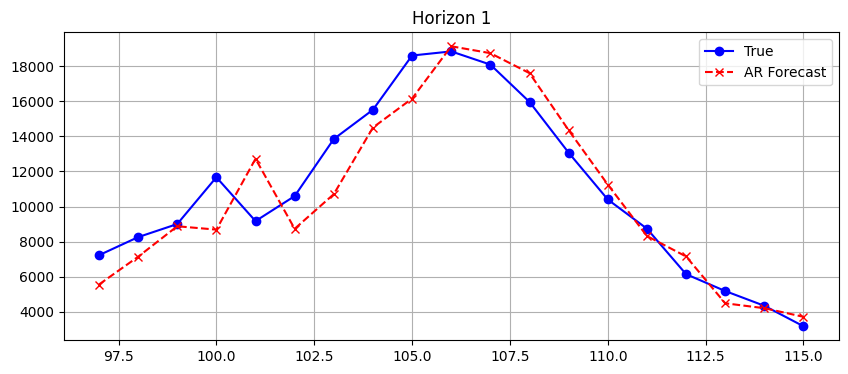

Horizon 2: MSE=0.2172, MAE=0.3754, SMAPE=19.87%


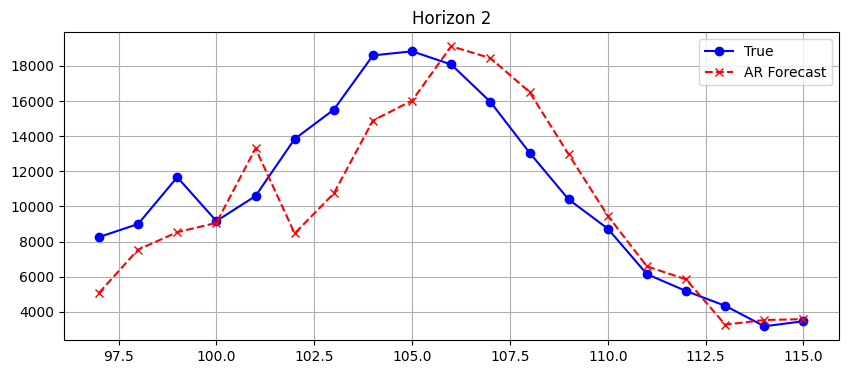

Horizon 3: MSE=0.3973, MAE=0.4754, SMAPE=25.20%


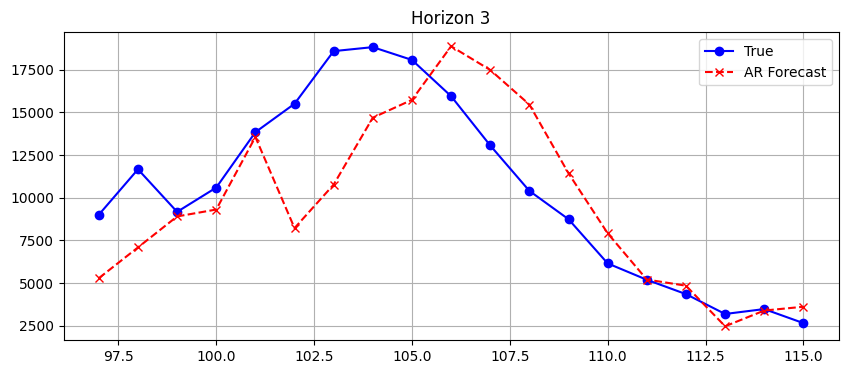

Horizon 4: MSE=0.6355, MAE=0.6205, SMAPE=36.35%


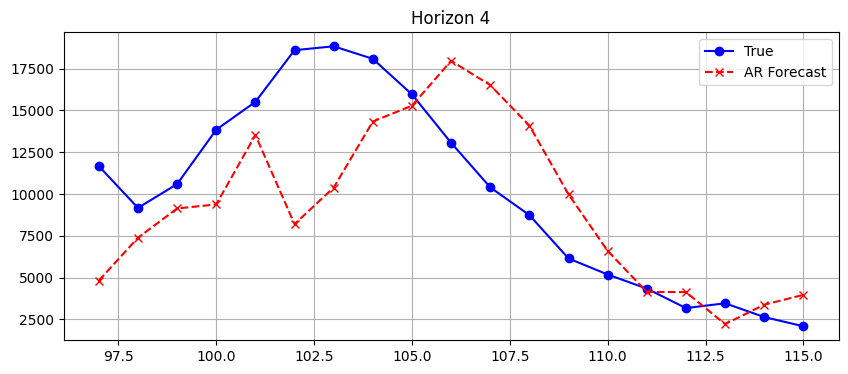

Horizon 5: MSE=0.7438, MAE=0.6938, SMAPE=40.28%


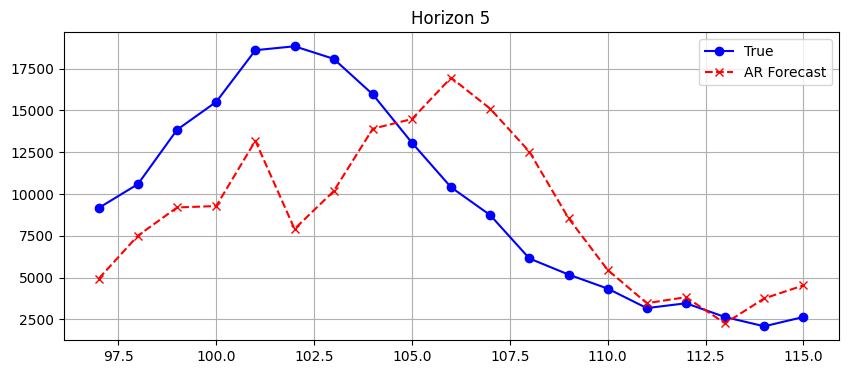

Horizon 6: MSE=0.9058, MAE=0.7886, SMAPE=49.20%


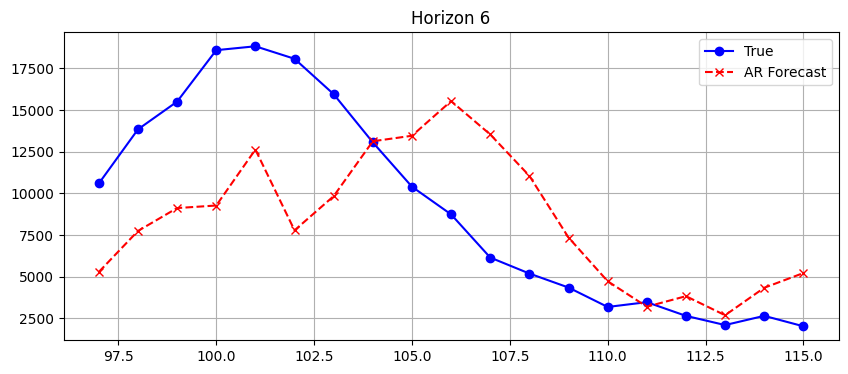

Horizon 1: MSE=0.0886, MAE=0.2375, SMAPE=13.4104%
Horizon 2: MSE=0.2172, MAE=0.3754, SMAPE=19.8692%
Horizon 3: MSE=0.3973, MAE=0.4754, SMAPE=25.2029%
Horizon 4: MSE=0.6355, MAE=0.6205, SMAPE=36.3474%
Horizon 5: MSE=0.7438, MAE=0.6938, SMAPE=40.2794%
Horizon 6: MSE=0.9058, MAE=0.7886, SMAPE=49.2035%


In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.statespace.sarimax import SARIMAX


p=6
d=0
q=0
P=0
D=0
Q=0
S=0

#     for p in range(1,5):
#         for q in range(1,5)

order = (p,d,q)
seasonal_order = (P,D,Q,S)


# --- Utility: SMAPE metric ---
def smape(true, pred):
    return 100 * np.mean(2 * np.abs(pred - true) / (np.abs(true) + np.abs(pred)))

# --- Load and preprocess data ---
df = pd.read_csv("./../dataset/rag_data/data/covid_till14May22.csv")  # replace with actual file path
data = df[['new_deaths','icu_patients']]  # endogenous + exogenous
# --- Split data ---
split = int(0.8 * len(data))

# data = np.log1p(data)
scaler = StandardScaler()
scaler.fit(np.array(data)[:split,:])
data_scaled = scaler.transform(data)

endog = data_scaled[:, 0]             # ICU patients (target)
exog = data_scaled[:, 1:]             # Exogenous variables
horizon = 6



print("split:",split, " len(endog):", len(endog), "len(endog) -split: ",len(endog) -split)

train_y, test_y = endog[:split], endog[split:]
train_x, test_x = exog[:split], exog[split:]

# --- Rolling forecast with ARX ---
mse_global, mae_global, smape_global = [], [], []
predictions, truths = [], []

for i in range(len(test_y) - horizon + 1):
    y_train_i = np.concatenate([train_y, test_y[:i]])
    x_train_i = np.vstack([train_x, test_x[:i]])

    model = SARIMAX(y_train_i, order=order, seasonal_order=seasonal_order) #AutoReg(endog=y_train_i, lags=6) #, exog=x_train_i)
    model_fit = model.fit()

    x_forecast = x_train_i #exog[split+i-9:split+i] #test_x[i-92:i] #[i:i + horizon]
    
        # Provide future exogenous variables for forecasting
#     x_oos = test_x[i:i + horizon]
#     pred = model_fit.predict(
#         start=len(y_train_i),
#         end=len(y_train_i) + horizon - 1,
# #         exog_oos=x_oos,
# #         exog=x_forecast
#     )
    pred = model_fit.forecast( steps=horizon) #,exog=train_series[-horizon:,1:])
    
#     pred = model_fit.predict(start=len(y_train_i), end=len(y_train_i) + horizon - 1, exog=x_forecast)
    true = test_y[i:i + horizon]

    predictions.append(pred)
    truths.append(true)

predictions = np.array(predictions)
truths = np.array(truths)

# --- Evaluate for each horizon ---
for h in range(horizon):
    trues = truths[:, h].reshape(-1, 1)
    preds = predictions[:, h].reshape(-1, 1)

    mse = mean_squared_error(trues, preds)
    mae = mean_absolute_error(trues, preds)

    # Inverse transform for SMAPE
    trues_full = np.hstack([trues, np.zeros((len(trues), 1))])
    preds_full = np.hstack([preds, np.zeros((len(preds), 1))])
#     trues_inv = np.expm1(scaler.inverse_transform(trues_full))[:, 0]
#     preds_inv = np.expm1(scaler.inverse_transform(preds_full))[:, 0]

    trues_inv = (scaler.inverse_transform(trues_full))[:, 0]
    preds_inv = (scaler.inverse_transform(preds_full))[:, 0]
    
    smape_val = smape(trues_inv, preds_inv)

    mse_global.append(mse)
    mae_global.append(mae)
    smape_global.append(smape_val)

    print(f"Horizon {h+1}: MSE={mse:.4f}, MAE={mae:.4f}, SMAPE={smape_val:.2f}%")

    # Plot
    plt.figure(figsize=(10, 4))
    
    
#         plt.plot(range(split_idx, len(time_series)-horizon), trues, label='True Values', color='blue', marker='o', linestyle='-')
#         plt.plot(range(split_idx, len(time_series)-horizon), preds, label='Random Walk Forecast', color='red', linestyle='--', marker='x')
        
    plt.plot(split + 5 + np.array(range(len(trues_inv))),trues_inv,  color='blue', marker='o', linestyle='-', label="True")
    plt.plot(split + 5 + np.array(range(len(trues_inv))),preds_inv, label="AR Forecast", color='red', linestyle='--', marker='x')
    plt.title(f"Horizon {h+1}")
    plt.legend()
    plt.grid()
    plt.show()
    
# --- Evaluate for each horizon ---
for h in range(horizon):
    print(f"Horizon {h+1}: MSE={mse_global[h]:.4f}, MAE={mae_global[h]:.4f}, SMAPE={smape_global[h]:.4f}%")

    
    

## consistency

In [ ]:
Horizon 1: MSE=0.0894, MAE=0.2384, SMAPE=13.35%
Horizon 2: MSE=0.2184, MAE=0.3779, SMAPE=19.88%
Horizon 3: MSE=0.3991, MAE=0.4764, SMAPE=25.00%
Horizon 4: MSE=0.6385, MAE=0.6217, SMAPE=36.15%
Horizon 5: MSE=0.7466, MAE=0.6987, SMAPE=40.39%
Horizon 6: MSE=0.9095, MAE=0.7970, SMAPE=49.62%

split: 97  len(endog): 116 len(endog) -split:  19
i: 0 nobs: 91
i: 1 nobs: 92
i: 2 nobs: 93
i: 3 nobs: 94
i: 4 nobs: 95
i: 5 nobs: 96
i: 6 nobs: 97
i: 7 nobs: 98
i: 8 nobs: 99
i: 9 nobs: 100
i: 10 nobs: 101
i: 11 nobs: 102
i: 12 nobs: 103
i: 13 nobs: 104
i: 14 nobs: 105
i: 15 nobs: 106
i: 16 nobs: 107
i: 17 nobs: 108
i: 18 nobs: 109
Horizon 1: MSE=0.0550, MAE=0.1892, SMAPE=14.78%


/home/fs47816/.local/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


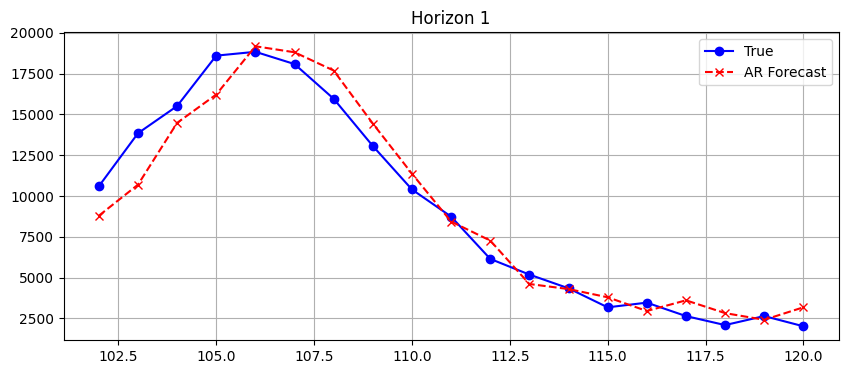

Horizon 1: MSE=0.0550, MAE=0.1892, SMAPE=14.7811%


In [25]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.statespace.sarimax import SARIMAX


p=6
d=0
q=0
P=0
D=0
Q=0
S=0

#     for p in range(1,5):
#         for q in range(1,5)

order = (p,d,q)
seasonal_order = (P,D,Q,S)


# --- Utility: SMAPE metric ---
def smape(true, pred):
    return 100 * np.mean(2 * np.abs(pred - true) / (np.abs(true) + np.abs(pred)))

# --- Load and preprocess data ---
df = pd.read_csv("./../dataset/rag_data/data/covid_till14May22.csv")  # replace with actual file path
data = df[['new_deaths','icu_patients']]  # endogenous + exogenous
# --- Split data ---
split = int(0.8 * len(data))+5

# data = np.log1p(data)
scaler = StandardScaler()
scaler.fit(np.array(data)[:split,:])
data_scaled = scaler.transform(data)

endog = data_scaled[:, 0]             # ICU patients (target)
exog = data_scaled[:, 1:]             # Exogenous variables
horizon = 1



print("split:",split, " len(endog):", len(endog), "len(endog) -split: ",len(endog) -split)

train_y, test_y = endog[:split], endog[split:]
train_x, test_x = exog[:split], exog[split:]

# --- Rolling forecast with ARX ---
mse_global, mae_global, smape_global = [], [], []
predictions, truths = [], []

for i in range(len(test_y) - horizon + 1):
    y_train_i = np.concatenate([train_y, test_y[:i]])
    x_train_i = np.vstack([train_x, test_x[:i]])

    model = AutoReg(y_train_i, lags=6, trend='c') #AutoReg(endog=y_train_i, lags=6) #, exog=x_train_i)
    model_fit = model.fit()
    print("i:",i,"nobs:",model_fit.nobs)
    x_forecast = x_train_i #exog[split+i-9:split+i] #test_x[i-92:i] #[i:i + horizon]
    
        # Provide future exogenous variables for forecasting
#     x_oos = test_x[i:i + horizon]
#     pred = model_fit.predict(
#         start=len(y_train_i),
#         end=len(y_train_i) + horizon - 1,
# #         exog_oos=x_oos,
# #         exog=x_forecast
#     )
    pred = model_fit.forecast( steps=horizon) #,exog=train_series[-horizon:,1:])
    
#     pred = model_fit.predict(start=len(y_train_i), end=len(y_train_i) + horizon - 1, exog=x_forecast)
    true = test_y[i:i + horizon]

    predictions.append(pred)
    truths.append(true)

predictions = np.array(predictions)
truths = np.array(truths)

# --- Evaluate for each horizon ---
for h in range(horizon):
    trues = truths[:, h].reshape(-1, 1)
    preds = predictions[:, h].reshape(-1, 1)

    mse = mean_squared_error(trues, preds)
    mae = mean_absolute_error(trues, preds)

    # Inverse transform for SMAPE
    trues_full = np.hstack([trues, np.zeros((len(trues), 1))])
    preds_full = np.hstack([preds, np.zeros((len(preds), 1))])
#     trues_inv = np.expm1(scaler.inverse_transform(trues_full))[:, 0]
#     preds_inv = np.expm1(scaler.inverse_transform(preds_full))[:, 0]

    trues_inv = (scaler.inverse_transform(trues_full))[:, 0]
    preds_inv = (scaler.inverse_transform(preds_full))[:, 0]
    
    smape_val = smape(trues_inv, preds_inv)

    mse_global.append(mse)
    mae_global.append(mae)
    smape_global.append(smape_val)

    print(f"Horizon {h+1}: MSE={mse:.4f}, MAE={mae:.4f}, SMAPE={smape_val:.2f}%")

    # Plot
    plt.figure(figsize=(10, 4))
    
    
#         plt.plot(range(split_idx, len(time_series)-horizon), trues, label='True Values', color='blue', marker='o', linestyle='-')
#         plt.plot(range(split_idx, len(time_series)-horizon), preds, label='Random Walk Forecast', color='red', linestyle='--', marker='x')
        
    plt.plot(split + 5 + np.array(range(len(trues_inv))),trues_inv,  color='blue', marker='o', linestyle='-', label="True")
    plt.plot(split + 5 + np.array(range(len(trues_inv))),preds_inv, label="AR Forecast", color='red', linestyle='--', marker='x')
    plt.title(f"Horizon {h+1}")
    plt.legend()
    plt.grid()
    plt.show()
    
# --- Evaluate for each horizon ---
for h in range(horizon):
    print(f"Horizon {h+1}: MSE={mse_global[h]:.4f}, MAE={mae_global[h]:.4f}, SMAPE={smape_global[h]:.4f}%")

    
    

split: 97  len(endog): 116 len(endog) -split:  19
nobs: 97
nobs: 97
nobs: 97
nobs: 97
nobs: 97
nobs: 97
nobs: 97
nobs: 97
nobs: 97
nobs: 97
nobs: 97
nobs: 97
nobs: 97
nobs: 97
nobs: 97
nobs: 97
nobs: 97
nobs: 97
nobs: 97
Horizon 1: MSE=1550765.8705, MAE=1008.3703, SMAPE=14.92%


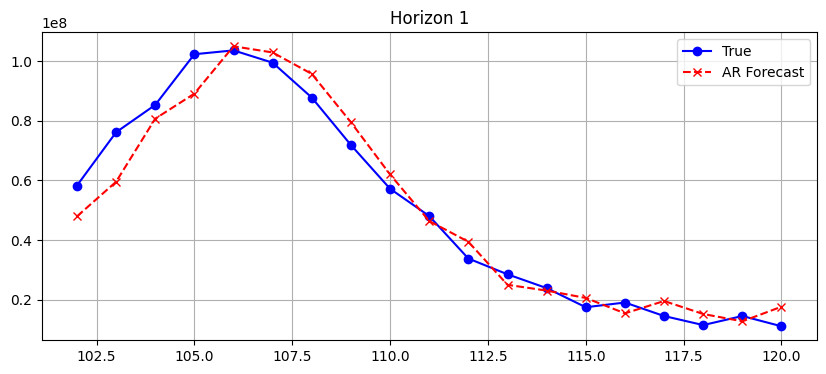

Horizon 1: MSE=1550765.8705, MAE=1008.3703, SMAPE=14.9192%


In [22]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.statespace.sarimax import SARIMAX


p=6
d=0
q=0
P=0
D=0
Q=0
S=0

#     for p in range(1,5):
#         for q in range(1,5)

order = (p,d,q)
seasonal_order = (P,D,Q,S)


# --- Utility: SMAPE metric ---
def smape(true, pred):
    return 100 * np.mean(2 * np.abs(pred - true) / (np.abs(true) + np.abs(pred)))

# --- Load and preprocess data ---
df = pd.read_csv("./../dataset/rag_data/data/covid_till14May22.csv")  # replace with actual file path
data = df[['new_deaths','icu_patients']]  # endogenous + exogenous
# --- Split data ---
split = int(0.8 * len(data)) # + 5

# data = np.log1p(data)
scaler = StandardScaler()
scaler.fit(np.array(data)[:split,:])
data_scaled = np.array(data) #scaler.transform(data)

endog = data_scaled[:, 0]             # ICU patients (target)
exog = data_scaled[:, 1:]             # Exogenous variables
horizon = 6 #1



print("split:",split, " len(endog):", len(endog), "len(endog) -split: ",len(endog) -split)

train_y, test_y = endog[:split], endog[split:]
train_x, test_x = exog[:split], exog[split:]

# --- Rolling forecast with ARX ---
mse_global, mae_global, smape_global = [], [], []
predictions, truths = [], []

for i in range(len(test_y) - horizon + 1):
    y_train_i = np.concatenate([train_y, test_y[:i]])
    x_train_i = np.vstack([train_x, test_x[:i]])

    if i == 0:
        model = SARIMAX(y_train_i, order=order, seasonal_order=seasonal_order, trend='c') #AutoReg(endog=y_train_i, lags=6) #, exog=x_train_i)
        model_fit = model.fit(disp=False)
    else:
        updated_model = model_fit.apply(y_train_i)

        
    print("nobs:",model_fit.nobs)
    
#     x_forecast = x_train_i #exog[split+i-9:split+i] #test_x[i-92:i] #[i:i + horizon]
    
        # Provide future exogenous variables for forecasting
#     x_oos = test_x[i:i + horizon]
#     pred = model_fit.predict(
#         start=len(y_train_i),
#         end=len(y_train_i) + horizon - 1,
# #         exog_oos=x_oos,
# #         exog=x_forecast
#     )
#     pred = model_fit.forecast( steps=horizon) #,exog=train_series[-horizon:,1:])
    if i == 0:    pred = model_fit.forecast( steps=horizon) #.predict(start=len(y_train_i), end=len(y_train_i) + horizon - 1)
    else:    pred = updated_model.forecast( steps=horizon)
#     pred = model_fit.predict(start=len(y_train_i), end=len(y_train_i) + horizon - 1, exog=x_forecast)
    true = test_y[i:i + horizon]

    predictions.append(pred)
    truths.append(true)

predictions = np.array(predictions)
truths = np.array(truths)

# --- Evaluate for each horizon ---
for h in range(horizon):
    trues = truths[:, h].reshape(-1, 1)
    preds = predictions[:, h].reshape(-1, 1)

    mse = mean_squared_error(trues, preds)
    mae = mean_absolute_error(trues, preds)

    # Inverse transform for SMAPE
    trues_full = np.hstack([trues, np.zeros((len(trues), 1))])
    preds_full = np.hstack([preds, np.zeros((len(preds), 1))])
#     trues_inv = np.expm1(scaler.inverse_transform(trues_full))[:, 0]
#     preds_inv = np.expm1(scaler.inverse_transform(preds_full))[:, 0]

    trues_inv = (scaler.inverse_transform(trues_full))[:, 0]
    preds_inv = (scaler.inverse_transform(preds_full))[:, 0]
    
    smape_val = smape(trues_inv, preds_inv)

    mse_global.append(mse)
    mae_global.append(mae)
    smape_global.append(smape_val)

    print(f"Horizon {h+1}: MSE={mse:.4f}, MAE={mae:.4f}, SMAPE={smape_val:.2f}%")

    # Plot
    plt.figure(figsize=(10, 4))
    
    
#         plt.plot(range(split_idx, len(time_series)-horizon), trues, label='True Values', color='blue', marker='o', linestyle='-')
#         plt.plot(range(split_idx, len(time_series)-horizon), preds, label='Random Walk Forecast', color='red', linestyle='--', marker='x')
        
    plt.plot(split + 5 + np.array(range(len(trues_inv))),trues_inv,  color='blue', marker='o', linestyle='-', label="True")
    plt.plot(split + 5 + np.array(range(len(trues_inv))),preds_inv, label="AR Forecast", color='red', linestyle='--', marker='x')
    plt.title(f"Horizon {h+1}")
    plt.legend()
    plt.grid()
    plt.show()
    
# --- Evaluate for each horizon ---
for h in range(horizon):
    print(f"Horizon {h+1}: MSE={mse_global[h]:.4f}, MAE={mae_global[h]:.4f}, SMAPE={smape_global[h]:.4f}%")

    
    

In [23]:
print(model_fit.params)
print(updated_model.params)

[ 9.06575676e+02  1.27671769e+00 -2.13575140e-01 -7.98300526e-02
 -5.48618139e-02  5.09949194e-02 -8.89424254e-02  1.85271537e+06]
[ 9.06575676e+02  1.27671769e+00 -2.13575140e-01 -7.98300526e-02
 -5.48618139e-02  5.09949194e-02 -8.89424254e-02  1.85271537e+06]


/home/fs47816/.local/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


split: 92  len(endog): 116 len(endog) -split:  24
nobs: 92
nobs: 93
nobs: 94
nobs: 95
nobs: 96
nobs: 97
nobs: 98
nobs: 99
nobs: 100
nobs: 101
nobs: 102
nobs: 103
nobs: 104
nobs: 105
nobs: 106
nobs: 107
nobs: 108
nobs: 109
nobs: 110
Horizon 1: MSE=0.0896, MAE=0.2399, SMAPE=13.53%


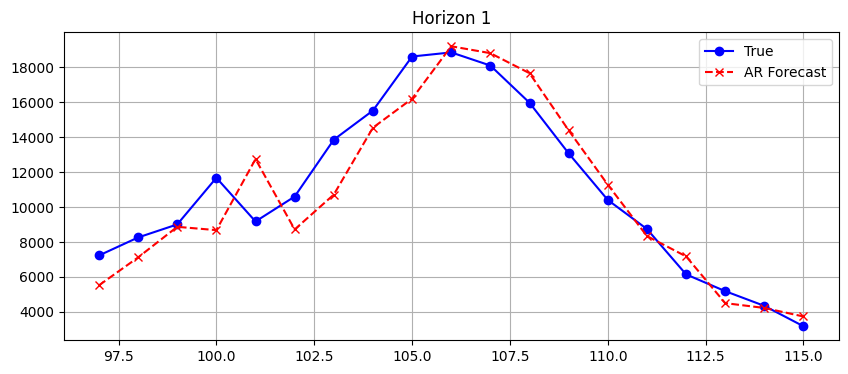

Horizon 2: MSE=0.2218, MAE=0.3824, SMAPE=20.33%


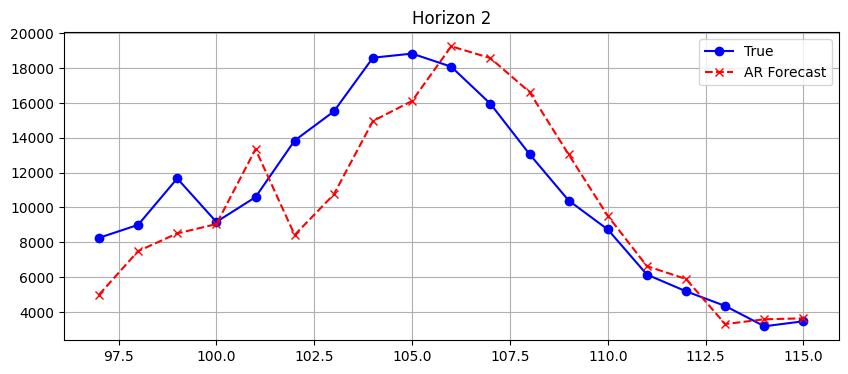

Horizon 3: MSE=0.4095, MAE=0.4841, SMAPE=25.68%


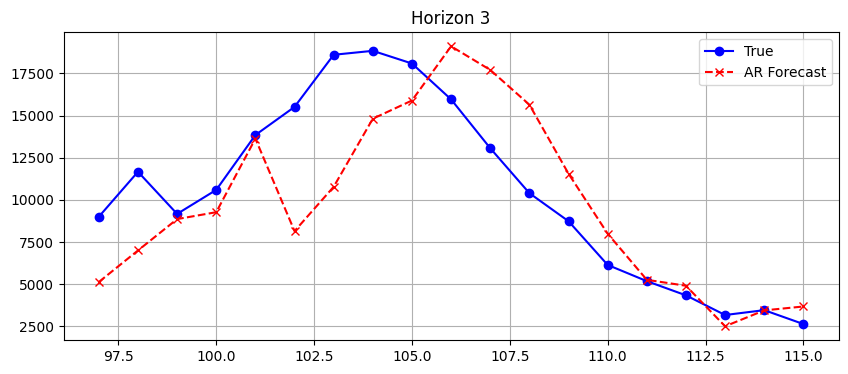

Horizon 4: MSE=0.6608, MAE=0.6327, SMAPE=37.11%


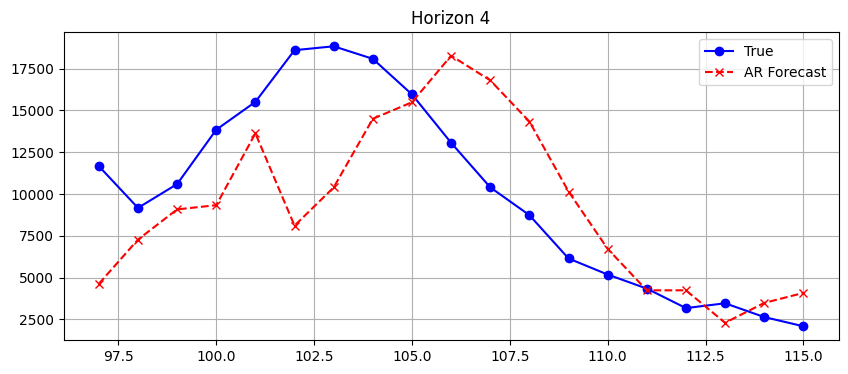

Horizon 5: MSE=0.7808, MAE=0.7164, SMAPE=41.81%


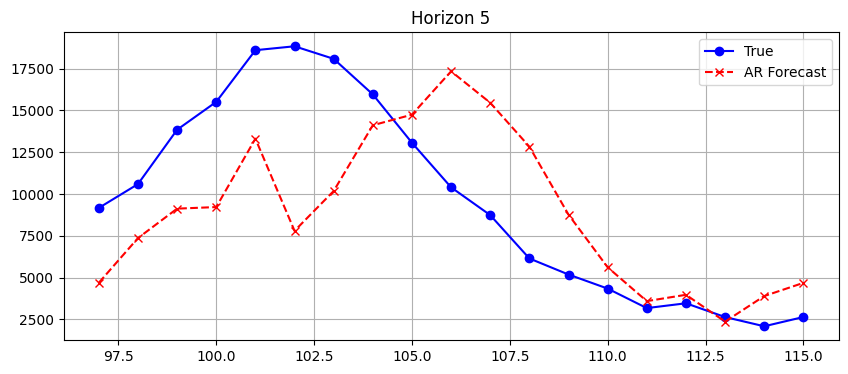

Horizon 6: MSE=0.9602, MAE=0.8201, SMAPE=51.26%


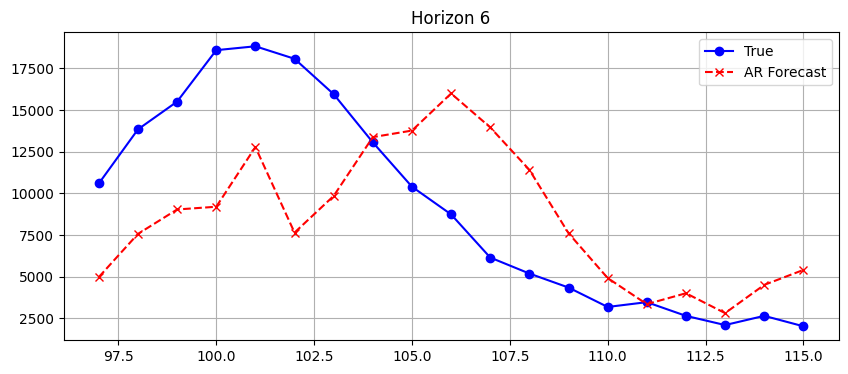

Horizon 1: MSE=0.0896, MAE=0.2399, SMAPE=13.5313%
Horizon 2: MSE=0.2218, MAE=0.3824, SMAPE=20.3266%
Horizon 3: MSE=0.4095, MAE=0.4841, SMAPE=25.6786%
Horizon 4: MSE=0.6608, MAE=0.6327, SMAPE=37.1132%
Horizon 5: MSE=0.7808, MAE=0.7164, SMAPE=41.8067%
Horizon 6: MSE=0.9602, MAE=0.8201, SMAPE=51.2618%


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.statespace.sarimax import SARIMAX


p=6
d=0
q=0
P=0
D=0
Q=0
S=0

#     for p in range(1,5):
#         for q in range(1,5)

order = (p,d,q)
seasonal_order = (P,D,Q,S)


# --- Utility: SMAPE metric ---
def smape(true, pred):
    return 100 * np.mean(2 * np.abs(pred - true) / (np.abs(true) + np.abs(pred)))

# --- Load and preprocess data ---
df = pd.read_csv("./../dataset/rag_data/data/covid_till14May22.csv")  # replace with actual file path
data = df[['new_deaths','icu_patients']]  # endogenous + exogenous
# --- Split data ---
split = int(0.8 * len(data))

# data = np.log1p(data)
scaler = StandardScaler()
scaler.fit(np.array(data)[:split,:])
data_scaled = scaler.transform(data)

endog = data_scaled[:, 0]             # ICU patients (target)
exog = data_scaled[:, 1:]             # Exogenous variables
horizon = 6



print("split:",split, " len(endog):", len(endog), "len(endog) -split: ",len(endog) -split)

train_y, test_y = endog[:split], endog[split:]
train_x, test_x = exog[:split], exog[split:]

# --- Rolling forecast with ARX ---
mse_global, mae_global, smape_global = [], [], []
predictions, truths = [], []

for i in range(len(test_y) - horizon + 1):
    y_train_i = np.concatenate([train_y, test_y[:i]])
    x_train_i = np.vstack([train_x, test_x[:i]])

    model = SARIMAX(y_train_i, order=order, seasonal_order=seasonal_order, trend='c') #AutoReg(endog=y_train_i, lags=6) #, exog=x_train_i)
    model_fit = model.fit(disp=False)

    print("nobs:",model_fit.nobs)
    
#     x_forecast = x_train_i #exog[split+i-9:split+i] #test_x[i-92:i] #[i:i + horizon]
    
        # Provide future exogenous variables for forecasting
#     x_oos = test_x[i:i + horizon]
#     pred = model_fit.predict(
#         start=len(y_train_i),
#         end=len(y_train_i) + horizon - 1,
# #         exog_oos=x_oos,
# #         exog=x_forecast
#     )
    pred = model_fit.forecast( steps=horizon) #,exog=train_series[-horizon:,1:])
    
#     pred = model_fit.predict(start=len(y_train_i), end=len(y_train_i) + horizon - 1, exog=x_forecast)
    true = test_y[i:i + horizon]

    predictions.append(pred)
    truths.append(true)

predictions = np.array(predictions)
truths = np.array(truths)

# --- Evaluate for each horizon ---
for h in range(horizon):
    trues = truths[:, h].reshape(-1, 1)
    preds = predictions[:, h].reshape(-1, 1)

    mse = mean_squared_error(trues, preds)
    mae = mean_absolute_error(trues, preds)

    # Inverse transform for SMAPE
    trues_full = np.hstack([trues, np.zeros((len(trues), 1))])
    preds_full = np.hstack([preds, np.zeros((len(preds), 1))])
#     trues_inv = np.expm1(scaler.inverse_transform(trues_full))[:, 0]
#     preds_inv = np.expm1(scaler.inverse_transform(preds_full))[:, 0]

    trues_inv = (scaler.inverse_transform(trues_full))[:, 0]
    preds_inv = (scaler.inverse_transform(preds_full))[:, 0]
    
    smape_val = smape(trues_inv, preds_inv)

    mse_global.append(mse)
    mae_global.append(mae)
    smape_global.append(smape_val)

    print(f"Horizon {h+1}: MSE={mse:.4f}, MAE={mae:.4f}, SMAPE={smape_val:.2f}%")

    # Plot
    plt.figure(figsize=(10, 4))
    
    
#         plt.plot(range(split_idx, len(time_series)-horizon), trues, label='True Values', color='blue', marker='o', linestyle='-')
#         plt.plot(range(split_idx, len(time_series)-horizon), preds, label='Random Walk Forecast', color='red', linestyle='--', marker='x')
        
    plt.plot(split + 5 + np.array(range(len(trues_inv))),trues_inv,  color='blue', marker='o', linestyle='-', label="True")
    plt.plot(split + 5 + np.array(range(len(trues_inv))),preds_inv, label="AR Forecast", color='red', linestyle='--', marker='x')
    plt.title(f"Horizon {h+1}")
    plt.legend()
    plt.grid()
    plt.show()
    
# --- Evaluate for each horizon ---
for h in range(horizon):
    print(f"Horizon {h+1}: MSE={mse_global[h]:.4f}, MAE={mae_global[h]:.4f}, SMAPE={smape_global[h]:.4f}%")

    
    

In [2]:
model_fit.params



array([ 0.00386399,  1.3047378 , -0.23351953, -0.06849589, -0.13393739,
        0.12617642, -0.10890044,  0.05981268])

/home/fs47816/.local/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


split: 92  len(endog): 116 len(endog) -split:  24
Horizon 1: MSE=0.0896, MAE=0.2399, SMAPE=13.53%


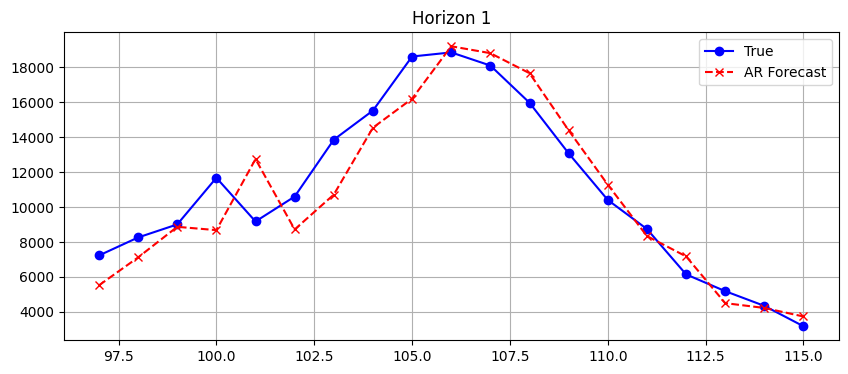

Horizon 2: MSE=0.2218, MAE=0.3824, SMAPE=20.33%


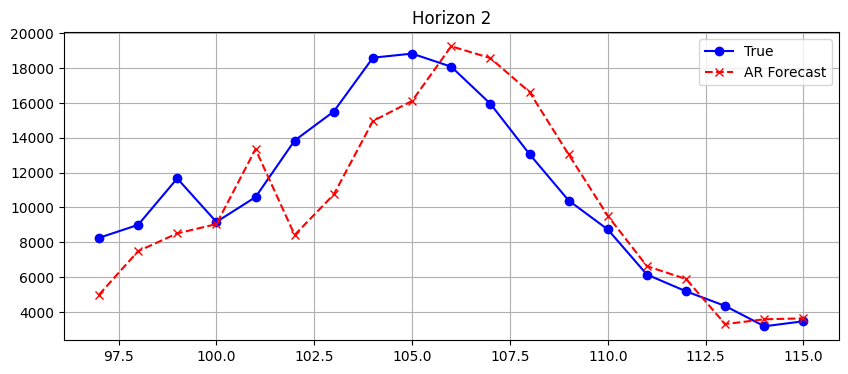

Horizon 3: MSE=0.4095, MAE=0.4841, SMAPE=25.68%


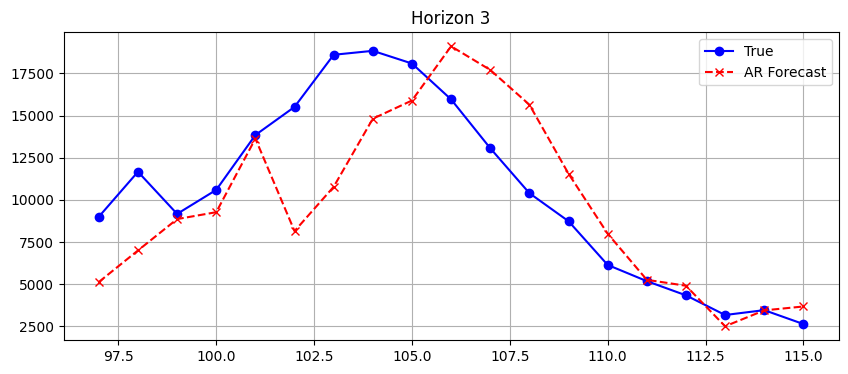

Horizon 4: MSE=0.6608, MAE=0.6327, SMAPE=37.12%


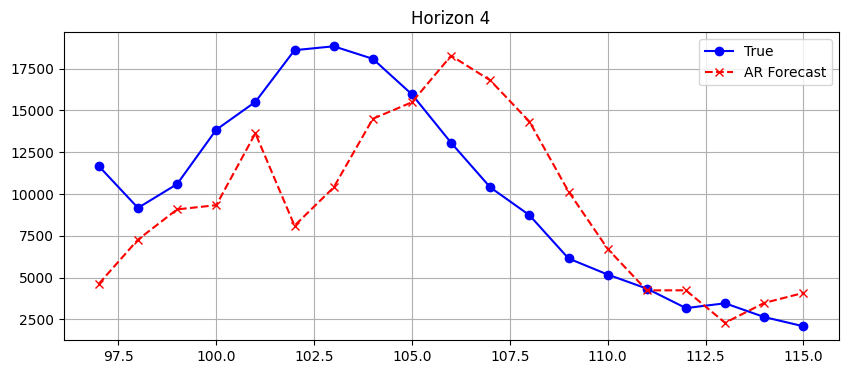

Horizon 5: MSE=0.7808, MAE=0.7164, SMAPE=41.81%


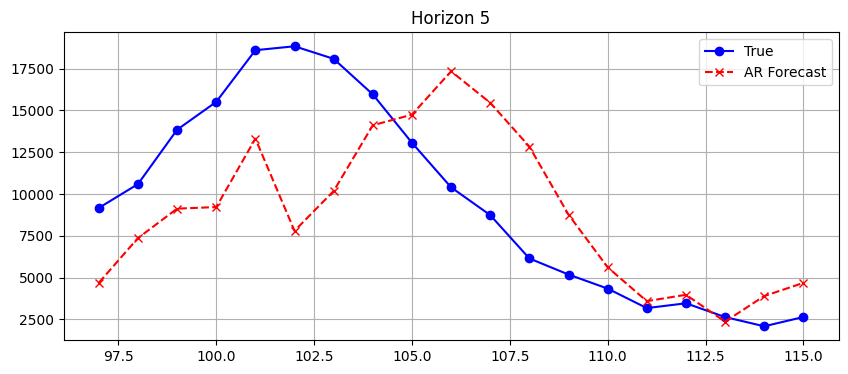

Horizon 6: MSE=0.9601, MAE=0.8201, SMAPE=51.26%


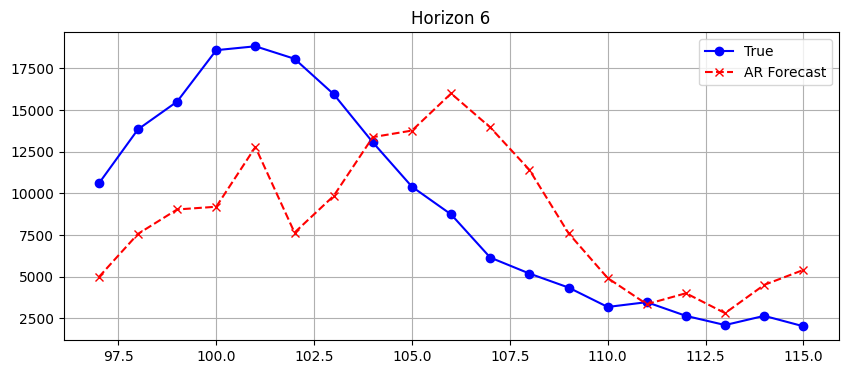

Horizon 1: MSE=0.0896, MAE=0.2399, SMAPE=13.5318%
Horizon 2: MSE=0.2218, MAE=0.3824, SMAPE=20.3272%
Horizon 3: MSE=0.4095, MAE=0.4841, SMAPE=25.6786%
Horizon 4: MSE=0.6608, MAE=0.6327, SMAPE=37.1151%
Horizon 5: MSE=0.7808, MAE=0.7164, SMAPE=41.8068%
Horizon 6: MSE=0.9601, MAE=0.8201, SMAPE=51.2623%


In [4]:
from statsmodels.tsa.arima.model import ARIMA

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.statespace.sarimax import SARIMAX


p=6
d=0
q=0
P=0
D=0
Q=0
S=0

#     for p in range(1,5):
#         for q in range(1,5)

order = (p,d,q)
seasonal_order = (P,D,Q,S)


# --- Utility: SMAPE metric ---
def smape(true, pred):
    return 100 * np.mean(2 * np.abs(pred - true) / (np.abs(true) + np.abs(pred)))

# --- Load and preprocess data ---
df = pd.read_csv("./../dataset/rag_data/data/covid_till14May22.csv")  # replace with actual file path
data = df[['new_deaths','icu_patients']]  # endogenous + exogenous
# --- Split data ---
split = int(0.8 * len(data))

# data = np.log1p(data)
scaler = StandardScaler()
scaler.fit(np.array(data)[:split,:])
data_scaled = scaler.transform(data)

endog = data_scaled[:, 0]             # ICU patients (target)
exog = data_scaled[:, 1:]             # Exogenous variables
horizon = 6



print("split:",split, " len(endog):", len(endog), "len(endog) -split: ",len(endog) -split)

train_y, test_y = endog[:split], endog[split:]
train_x, test_x = exog[:split], exog[split:]

# --- Rolling forecast with ARX ---
mse_global, mae_global, smape_global = [], [], []
predictions, truths = [], []

for i in range(len(test_y) - horizon + 1):
    y_train_i = np.concatenate([train_y, test_y[:i]])
    x_train_i = np.vstack([train_x, test_x[:i]])

    model = ARIMA(y_train_i, order=order,trend='c') #AutoReg(endog=y_train_i, lags=6) #, exog=x_train_i)
    model_fit = model.fit()

    x_forecast = x_train_i #exog[split+i-9:split+i] #test_x[i-92:i] #[i:i + horizon]
    
        # Provide future exogenous variables for forecasting
#     x_oos = test_x[i:i + horizon]
#     pred = model_fit.predict(
#         start=len(y_train_i),
#         end=len(y_train_i) + horizon - 1,
# #         exog_oos=x_oos,
# #         exog=x_forecast
#     )
    pred = model_fit.forecast( steps=horizon) #,exog=train_series[-horizon:,1:])
    
#     pred = model_fit.predict(start=len(y_train_i), end=len(y_train_i) + horizon - 1, exog=x_forecast)
    true = test_y[i:i + horizon]

    predictions.append(pred)
    truths.append(true)

predictions = np.array(predictions)
truths = np.array(truths)

# --- Evaluate for each horizon ---
for h in range(horizon):
    trues = truths[:, h].reshape(-1, 1)
    preds = predictions[:, h].reshape(-1, 1)

    mse = mean_squared_error(trues, preds)
    mae = mean_absolute_error(trues, preds)

    # Inverse transform for SMAPE
    trues_full = np.hstack([trues, np.zeros((len(trues), 1))])
    preds_full = np.hstack([preds, np.zeros((len(preds), 1))])
#     trues_inv = np.expm1(scaler.inverse_transform(trues_full))[:, 0]
#     preds_inv = np.expm1(scaler.inverse_transform(preds_full))[:, 0]

    trues_inv = (scaler.inverse_transform(trues_full))[:, 0]
    preds_inv = (scaler.inverse_transform(preds_full))[:, 0]
    
    smape_val = smape(trues_inv, preds_inv)

    mse_global.append(mse)
    mae_global.append(mae)
    smape_global.append(smape_val)

    print(f"Horizon {h+1}: MSE={mse:.4f}, MAE={mae:.4f}, SMAPE={smape_val:.2f}%")

    # Plot
    plt.figure(figsize=(10, 4))
    
    
#         plt.plot(range(split_idx, len(time_series)-horizon), trues, label='True Values', color='blue', marker='o', linestyle='-')
#         plt.plot(range(split_idx, len(time_series)-horizon), preds, label='Random Walk Forecast', color='red', linestyle='--', marker='x')
        
    plt.plot(split + 5 + np.array(range(len(trues_inv))),trues_inv,  color='blue', marker='o', linestyle='-', label="True")
    plt.plot(split + 5 + np.array(range(len(trues_inv))),preds_inv, label="AR Forecast", color='red', linestyle='--', marker='x')
    plt.title(f"Horizon {h+1}")
    plt.legend()
    plt.grid()
    plt.show()
    
# --- Evaluate for each horizon ---
for h in range(horizon):
    print(f"Horizon {h+1}: MSE={mse_global[h]:.4f}, MAE={mae_global[h]:.4f}, SMAPE={smape_global[h]:.4f}%")


    
    

In [5]:
model_fit.params

array([ 0.03391174,  1.30474451, -0.23353455, -0.06848921, -0.13390672,
        0.12612678, -0.10887816,  0.05981227])

In [ ]:
b   = VectorD(1020.66,    -0.0334826,     0.0318581,  -0.145533,       -0.0888038,     -0.0972581,     1.21432)

In [39]:
model_fit.params

array([ 1.30475737, -0.23357027, -0.06842819, -0.13397732,  0.12624551,
       -0.10886852,  0.06060463])

In [ ]:
VectorD(5.69005e-18,        -0.0334826,     0.0318581,   -0.145533,      -0.0888038,     -0.0972581,     1.21432)

In [ ]:
smape    -> VectorD(14.4899,    19.1462,        27.6639,    36.1339, 41.2108,        48.1782)

In [36]:
model_fit.params

array([ 1.39190731e+00, -2.62480338e-01, -8.78929416e-02, -1.52136280e-01,
        1.12211552e-01, -2.79443567e-02,  2.04074297e+06])

In [1]:
(13+20+24+34+39+47) / 6
model_fit.params

29.5

In [2]:
(10+14+22+32+38+50) / 6

27.666666666666668

#### (ARX) 
through SARIMAX

92 92.80000000000001
92 24
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.14217D-02    |proj g|=  2.63924D-01

At iterate    5    f= -1.39449D-01    |proj g|=  1.40646D-01

At iterate   10    f= -1.42263D-01    |proj g|=  5.54388D-02

At iterate   15    f= -1.45051D-01    |proj g|=  2.77182D-03

At iterate   20    f= -1.45058D-01    |proj g|=  2.10968D-04


 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     23     40      1     0     0   2.425D-05  -1.451D-01
  F = -0.14505839057882930     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.74598D-02    |proj g|=  2.70624D-01

At iterate    5    f= -1.44950D-01    |proj g|=  1.23916D-01

At iterate   10    f= -1.47672D-01    |proj g|=  6.23769D-02

At iterate   15    f= -1.50337D-01    |proj g|=  5.79324D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   25    f= -1.50607D-01    |proj g|=  3.83388D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     26     33      1     0     0   6.371D-05  -1.506D-01
  F = -0.15060675189763925     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00763D-01    |proj g|=  2.64828D-01

At iterate    5    f= -1.42857D-01    |proj g|=  5.16059D-02

At iterate   10    f= -1.49525D-01    |proj g|=  2.14399D-02

At iter

 This problem is unconstrained.



At iterate   25    f= -1.53094D-01    |proj g|=  2.63815D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     26     33      1     0     0   8.098D-06  -1.531D-01
  F = -0.15309382256529044     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.03094D-01    |proj g|=  2.64201D-01

At iterate    5    f= -1.44430D-01    |proj g|=  5.33636D-02

At iterate   10    f= -1.51224D-01    |proj g|=  3.03550D-02

At iter

 This problem is unconstrained.



At iterate   25    f= -1.54985D-01    |proj g|=  5.32536D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     26     32      1     0     0   3.058D-05  -1.550D-01
  F = -0.15498487414853165     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.91234D-02    |proj g|=  2.25783D-01

At iterate    5    f= -1.25903D-01    |proj g|=  1.08032D-01

At iterate   10    f= -1.28437D-01    |proj g|=  1.88631D-02

At iter

 This problem is unconstrained.



At iterate   20    f= -1.30672D-01    |proj g|=  1.70518D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     23     31      1     0     0   7.962D-07  -1.307D-01
  F = -0.13067174701901282     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.67767D-02    |proj g|=  2.17533D-01

At iterate    5    f= -8.72945D-02    |proj g|=  4.66012D-02

At iterate   10    f= -9.36181D-02    |proj g|=  2.51043D-02

At iter

 This problem is unconstrained.



At iterate   20    f= -9.75680D-02    |proj g|=  1.00650D-03

At iterate   25    f= -9.75692D-02    |proj g|=  2.67380D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     25     32      1     0     0   2.674D-05  -9.757D-02
  F =  -9.7569164938980241E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.09832D-02    |proj g|=  2.20869D-01

At iterate    5    f= -9.09407D-02    |proj g|=  4.99216D-02

At iter

 This problem is unconstrained.



At iterate   20    f= -1.01081D-01    |proj g|=  5.04218D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     24     31      1     0     0   7.185D-05  -1.011D-01
  F = -0.10108152743731287     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.36287D-02    |proj g|=  1.83378D-01

At iterate    5    f= -6.65158D-02    |proj g|=  4.26704D-02

At iterate   10    f= -7.14124D-02    |proj g|=  2.18478D-02

At iter

 This problem is unconstrained.



At iterate   20    f= -7.40436D-02    |proj g|=  2.74967D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     21     27      1     0     0   3.795D-06  -7.404D-02
  F =  -7.4043680946113827E-002

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.26030D-02    |proj g|=  1.72012D-01

At iterate    5    f= -6.16623D-02    |proj g|=  3.45005D-02

At iterate   10    f= -6.63224D-02    |proj g|=  1.65974D-02

At iter

 This problem is unconstrained.



At iterate   20    f= -6.83464D-02    |proj g|=  3.82437D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     20     25      1     0     0   3.824D-06  -6.835D-02
  F =  -6.8346380073718502E-002

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.79607D-02    |proj g|=  1.58777D-01

At iterate    5    f= -4.70081D-02    |proj g|=  2.46287D-02

At iterate   10    f= -5.07175D-02    |proj g|=  1.83932D-02

At iter

 This problem is unconstrained.



At iterate   20    f= -5.29834D-02    |proj g|=  1.35028D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     21     28      1     0     0   2.914D-06  -5.298D-02
  F =  -5.2983442592639457E-002

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.02873D-02    |proj g|=  1.60695D-01

At iterate    5    f= -4.97207D-02    |proj g|=  2.60991D-02

At iterate   10    f= -5.38826D-02    |proj g|=  1.86460D-02

At iter

 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     22     26      1     0     0   9.217D-06  -5.575D-02
  F =  -5.5749068416138324E-002

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.80160D-02    |proj g|=  1.64208D-01

At iterate    5    f= -4.85288D-02    |proj g|=  2.99825D-02

At iterate   10    f= -5.39216D-02    |proj g|=  2.06027D-02

At iterate   15    f= -5.54398D-02    |proj g|=  1.27538D-03


 This problem is unconstrained.



At iterate   20    f= -5.54424D-02    |proj g|=  1.13293D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     20     27      1     0     0   1.133D-05  -5.544D-02
  F =  -5.5442366948677657E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.01181D-03    |proj g|=  1.86306D-01

At iterate    5    f= -3.73789D-02    |proj g|=  4.02025D-02

At iterate   10    f= -4.37286D-02    |proj g|=  2.61396D-02

At iter

 This problem is unconstrained.



At iterate   20    f= -4.78815D-02    |proj g|=  1.02797D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     24     31      1     0     0   8.388D-05  -4.788D-02
  F =  -4.7881798546358691E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.00692D-02    |proj g|=  1.97638D-01

At iterate    5    f= -3.35979D-02    |proj g|=  4.47877D-02

At iterate   10    f= -4.08356D-02    |proj g|=  2.33898D-02


 This problem is unconstrained.



At iterate   15    f= -4.37214D-02    |proj g|=  1.07565D-01

At iterate   20    f= -4.61085D-02    |proj g|=  3.32451D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     24     29      1     0     0   7.889D-06  -4.612D-02
  F =  -4.6115052537926762E-002

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.83813D-03    |proj g|=  1.93380D-01

At iterate    5    f= -3.81217D-02    |proj g|=  4.30719D-02


 This problem is unconstrained.



At iterate   10    f= -4.50276D-02    |proj g|=  2.17936D-02

At iterate   15    f= -4.75101D-02    |proj g|=  1.25386D-01

At iterate   20    f= -4.96868D-02    |proj g|=  8.36166D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     23     29      1     0     0   5.751D-06  -4.969D-02
  F =  -4.9687368394001979E-002

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.08504D-04    |proj g|=  1.92374D-01


 This problem is unconstrained.



At iterate    5    f= -4.18811D-02    |proj g|=  4.43935D-02

At iterate   10    f= -4.92166D-02    |proj g|=  2.57964D-02

At iterate   15    f= -5.26463D-02    |proj g|=  3.26382D-02

At iterate   20    f= -5.42508D-02    |proj g|=  6.95848D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     23     27      1     0     0   2.659D-05  -5.425D-02
  F =  -5.4250884377790402E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate    5    f= -4.64730D-02    |proj g|=  4.18346D-02

At iterate   10    f= -5.33391D-02    |proj g|=  2.37994D-02

At iterate   15    f= -5.67353D-02    |proj g|=  2.17322D-02

At iterate   20    f= -5.74742D-02    |proj g|=  1.77572D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     23     27      1     0     0   4.422D-06  -5.747D-02
  F =  -5.7474736298594176E-002

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate    5    f= -4.97108D-02    |proj g|=  4.36518D-02

At iterate   10    f= -5.72991D-02    |proj g|=  2.54904D-02

At iterate   15    f= -6.10003D-02    |proj g|=  2.37745D-02

At iterate   20    f= -6.17074D-02    |proj g|=  1.08299D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     24     30      1     0     0   1.067D-04  -6.171D-02
  F =  -6.1709431414863486E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
Horizon 1: MSE=0.0982, MAE=0.2596, SMAPE=12.75%


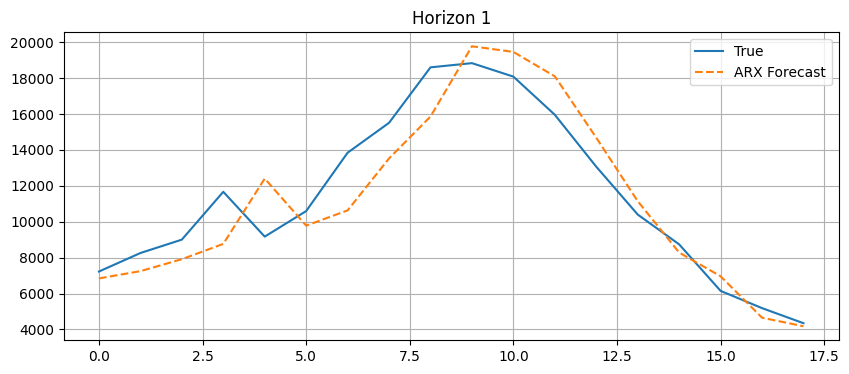

Horizon 2: MSE=0.2537, MAE=0.4089, SMAPE=19.45%


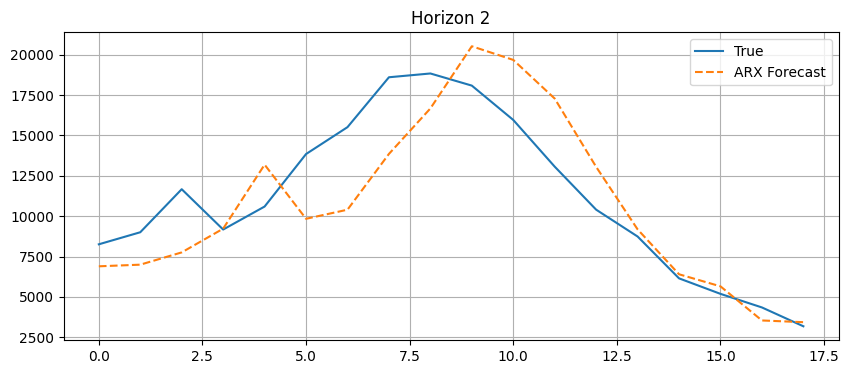

Horizon 3: MSE=0.4639, MAE=0.5105, SMAPE=24.38%


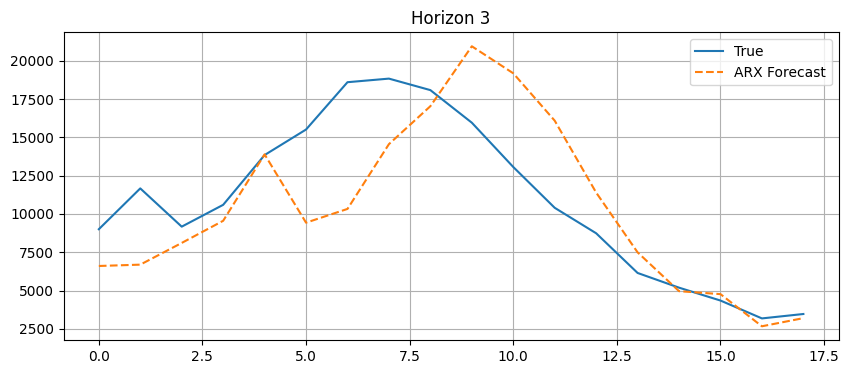

Horizon 4: MSE=0.7332, MAE=0.6734, SMAPE=34.84%


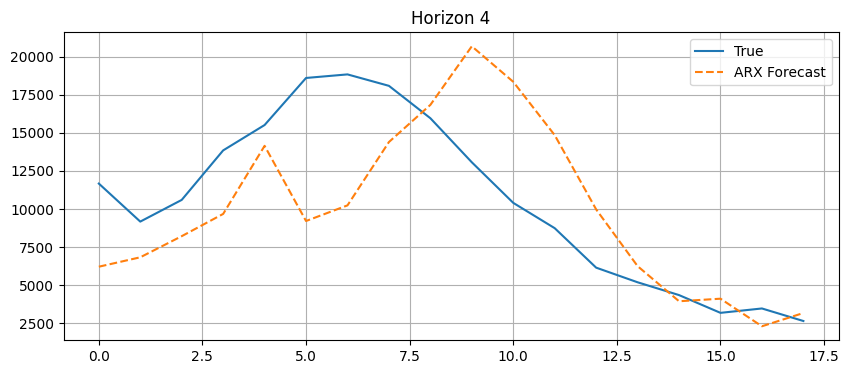

Horizon 5: MSE=0.9097, MAE=0.7676, SMAPE=39.63%


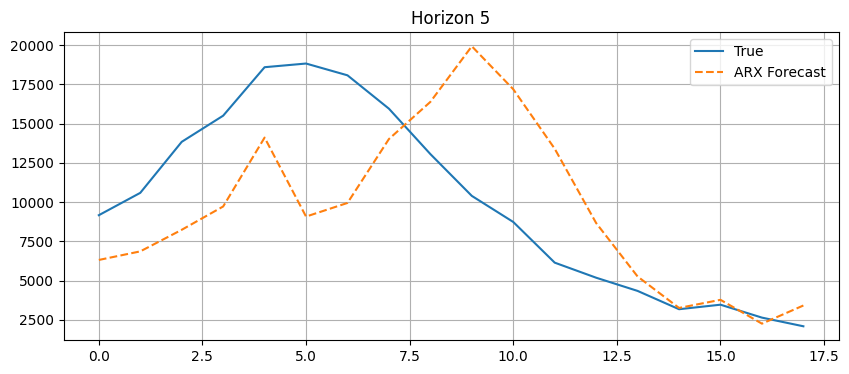

Horizon 6: MSE=1.1113, MAE=0.8713, SMAPE=48.23%


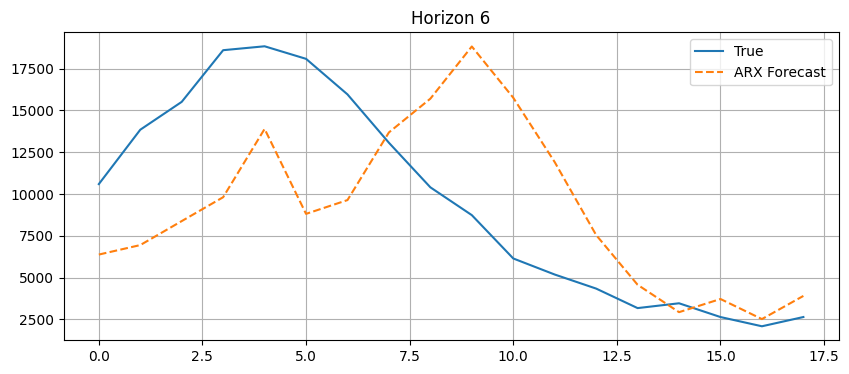

Horizon 1: MSE=0.0982, MAE=0.2596, SMAPE=12.75%
Horizon 2: MSE=0.2537, MAE=0.4089, SMAPE=19.45%
Horizon 3: MSE=0.4639, MAE=0.5105, SMAPE=24.38%
Horizon 4: MSE=0.7332, MAE=0.6734, SMAPE=34.84%
Horizon 5: MSE=0.9097, MAE=0.7676, SMAPE=39.63%
Horizon 6: MSE=1.1113, MAE=0.8713, SMAPE=48.23%


In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.statespace.sarimax import SARIMAX


p=5
d=0
q=0
P=0
D=0
Q=0
S=0

#     for p in range(1,5):
#         for q in range(1,5)

order = (p,d,q)
seasonal_order = (P,D,Q,S)


# --- Utility: SMAPE metric ---
def smape(true, pred):
    return 100 * np.mean(2 * np.abs(pred - true) / (np.abs(true) + np.abs(pred)))

# --- Load and preprocess data ---
df = pd.read_csv("./../dataset/rag_data/data/covid_till14May22.csv")  # replace with actual file path
data = df[['new_deaths','icu_patients']] #,'hosp_patients','new_tests','people_vaccinated','people_fully_vaccinated','OT']]  # endogenous + exogenous

# data = np.log1p(data)
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

endog = data_scaled[:, 0]             # ICU patients (target)
exog = data_scaled[:, 1:]             # Exogenous variables
horizon = 6

# --- Split data ---
split = int(0.8 * len(endog))
train_y, test_y = endog[:split], endog[split:]
train_x, test_x = exog[:split], exog[split:]
print(split, 0.8 * len(endog))
print(len(train_x), len(test_x))

# --- Rolling forecast with ARX ---
mse_global, mae_global, smape_global = [], [], []
predictions, truths = [], []

for i in range(len(test_y) - horizon):
    y_train_i = np.concatenate([train_y, test_y[:i]])
    x_train_i = np.vstack([train_x, test_x[:i]])

    model = SARIMAX(y_train_i[horizon:], order=order, seasonal_order=seasonal_order, exog=x_train_i[:-horizon]) #AutoReg(endog=y_train_i, lags=6) #, exog=x_train_i)
    model_fit = model.fit()

    x_forecast = x_train_i #exog[split+i-9:split+i] #test_x[i-92:i] #[i:i + horizon]
    
        # Provide future exogenous variables for forecasting
#     x_oos = test_x[i:i + horizon]
#     pred = model_fit.predict(
#         start=len(y_train_i),
#         end=len(y_train_i) + horizon - 1,
# #         exog_oos=x_oos,
# #         exog=x_forecast
#     )
    pred = model_fit.forecast( steps=horizon,exog=x_train_i[-horizon:])
    
#     pred = model_fit.predict(start=len(y_train_i), end=len(y_train_i) + horizon - 1, exog=x_forecast)
    true = test_y[i:i + horizon]

    predictions.append(pred)
    truths.append(true)

predictions = np.array(predictions)
truths = np.array(truths)

# --- Evaluate for each horizon ---
for h in range(horizon):
    trues = truths[:, h].reshape(-1, 1)
    preds = predictions[:, h].reshape(-1, 1)

    mse = mean_squared_error(trues, preds)
    mae = mean_absolute_error(trues, preds)

    # Inverse transform for SMAPE
    trues_full = np.hstack([trues, np.zeros((len(trues), x_train_i.shape[1]))])
    preds_full = np.hstack([preds, np.zeros((len(preds), x_train_i.shape[1]))])
#     trues_inv = np.expm1(scaler.inverse_transform(trues_full))[:, 0]
#     preds_inv = np.expm1(scaler.inverse_transform(preds_full))[:, 0]

    trues_inv = (scaler.inverse_transform(trues_full))[:, 0]
    preds_inv = (scaler.inverse_transform(preds_full))[:, 0]
    
    smape_val = smape(trues_inv, preds_inv)

    mse_global.append(mse)
    mae_global.append(mae)
    smape_global.append(smape_val)

    print(f"Horizon {h+1}: MSE={mse:.4f}, MAE={mae:.4f}, SMAPE={smape_val:.2f}%")

    # Plot
    plt.figure(figsize=(10, 4))
    plt.plot(trues_inv, label="True")
    plt.plot(preds_inv, label="ARX Forecast", linestyle="--")
    plt.title(f"Horizon {h+1}")
    plt.legend()
    plt.grid()
    plt.show()
    
# --- Evaluate for each horizon ---
for h in range(horizon):
    print(f"Horizon {h+1}: MSE={mse_global[h]:.4f}, MAE={mae_global[h]:.4f}, SMAPE={smape_global[h]:.2f}%")

    
    

In [ ]:
import numpy as np
import pandas as pd
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, mean_absolute_error

def create_lagged_matrix(y, X, p, q):
    """
    Construct lagged matrices for ARX(p, q) model.
    p: number of lags for endogenous y
    q: number of lags for exogenous X (excluding contemporaneous)
    """
    n_obs = len(y)
    lagged_data = []
    for i in range(max(p, q), n_obs):
        row = []
        # Add lags for y
        for lag in range(1, p + 1):
            row.append(y[i - lag])
        # Add lags for X
        for lag in range(1, q + 1):
            row.extend(X[i - lag])
        lagged_data.append(row)
    Y_target = y[max(p, q):]
    return np.array(lagged_data), Y_target

# Example data
np.random.seed(42)
n = 200
y = np.random.randn(n)           # Endogenous
X = np.random.randn(n, 2)        # Two exogenous variables

# Parameters
p = 3  # lags for y
q = 2  # lags for X

# Create lagged dataset
X_lagged, y_target = create_lagged_matrix(y, X, p, q)

# Fit model
model = Ridge(alpha=1.0)
model.fit(X_lagged, y_target)

# Predict
y_pred = model.predict(X_lagged)

# Evaluate
mse = mean_squared_error(y_target, y_pred)
mae = mean_absolute_error(y_target, y_pred)

print(f"MSE: {mse:.4f}, MAE: {mae:.4f}")


In [17]:
df

,date,new_deaths,icu_patients,hosp_patients,new_tests,people_vaccinated,people_fully_vaccinated,OT
0,2/29/2020,1,0,0,0,0,0,34
1,3/7/2020,15,0,0,6867,0,0,265
2,3/14/2020,42,0,0,46013,0,0,2627
3,3/21/2020,224,0,0,344810,0,0,20895
4,3/28/2020,1337,0,0,760008,0,0,82109
...,...,...,...,...,...,...,...,...
111,4/16/2022,3468,10685,70686,4870841,1795598026,1544407873,246185
112,4/23/2022,2645,10240,75702,4508344,1798116976,1546793248,276277
113,4/30/2022,2093,10914,87274,5865131,1800451766,1549033166,366692
114,5/7/2022,2646,11888,100602,5579522,1802647624,1551131477,450582


#### VAR

92 92.80000000000001
92 24
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           78     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.75868D+00    |proj g|=  7.21605D+00


 This problem is unconstrained.



At iterate    5    f= -3.78454D+00    |proj g|=  2.06251D+00

At iterate   10    f= -3.80140D+00    |proj g|=  5.08238D-01

At iterate   15    f= -3.80417D+00    |proj g|=  2.09436D-01

At iterate   20    f= -3.80520D+00    |proj g|=  9.74643D-02

At iterate   25    f= -3.80589D+00    |proj g|=  1.75705D-01

At iterate   30    f= -3.80640D+00    |proj g|=  2.64841D-01

At iterate   35    f= -3.80701D+00    |proj g|=  3.59753D-01

At iterate   40    f= -3.80845D+00    |proj g|=  3.12387D-01

At iterate   45    f= -3.81010D+00    |proj g|=  8.51960D-01

At iterate   50    f= -3.81216D+00    |proj g|=  1.11700D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate    5    f= -3.66527D+00    |proj g|=  1.69317D+00

At iterate   10    f= -3.68048D+00    |proj g|=  4.59885D-01

At iterate   15    f= -3.68332D+00    |proj g|=  4.69862D-01

At iterate   20    f= -3.68410D+00    |proj g|=  1.04987D-01

At iterate   25    f= -3.68489D+00    |proj g|=  4.16001D-01

At iterate   30    f= -3.68570D+00    |proj g|=  8.31531D-01

At iterate   35    f= -3.68725D+00    |proj g|=  6.99071D-01

At iterate   40    f= -3.68917D+00    |proj g|=  1.04248D+00

At iterate   45    f= -3.69078D+00    |proj g|=  8.86051D-01

At iterate   50    f= -3.69241D+00    |proj g|=  6.71685D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate    5    f= -3.67233D+00    |proj g|=  1.43170D+00

At iterate   10    f= -3.68653D+00    |proj g|=  8.19384D-01

At iterate   15    f= -3.68957D+00    |proj g|=  3.43056D-01

At iterate   20    f= -3.69007D+00    |proj g|=  2.42944D-01

At iterate   25    f= -3.69073D+00    |proj g|=  3.76068D-01

At iterate   30    f= -3.69188D+00    |proj g|=  4.44484D-01

At iterate   35    f= -3.69336D+00    |proj g|=  3.22031D-01

At iterate   40    f= -3.69531D+00    |proj g|=  4.01236D-01

At iterate   45    f= -3.69684D+00    |proj g|=  7.24434D-01

At iterate   50    f= -3.69808D+00    |proj g|=  4.07865D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate    5    f= -3.67064D+00    |proj g|=  1.66891D+00

At iterate   10    f= -3.68519D+00    |proj g|=  4.35940D-01

At iterate   15    f= -3.68768D+00    |proj g|=  1.64542D-01

At iterate   20    f= -3.68831D+00    |proj g|=  1.14409D-01

At iterate   25    f= -3.68890D+00    |proj g|=  2.22499D-01

At iterate   30    f= -3.69022D+00    |proj g|=  4.91946D-01

At iterate   35    f= -3.69243D+00    |proj g|=  2.16199D-01

At iterate   40    f= -3.69393D+00    |proj g|=  2.26408D-01

At iterate   45    f= -3.69518D+00    |proj g|=  2.75249D-01

At iterate   50    f= -3.69612D+00    |proj g|=  7.07469D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate    5    f= -3.68493D+00    |proj g|=  1.26281D+00

At iterate   10    f= -3.69829D+00    |proj g|=  5.73536D-01

At iterate   15    f= -3.70057D+00    |proj g|=  1.69452D-01

At iterate   20    f= -3.70112D+00    |proj g|=  1.80412D-01

At iterate   25    f= -3.70160D+00    |proj g|=  8.03613D-01

At iterate   30    f= -3.70275D+00    |proj g|=  1.26197D+00

At iterate   35    f= -3.70489D+00    |proj g|=  1.02300D+00

At iterate   40    f= -3.70600D+00    |proj g|=  5.22567D-01

At iterate   45    f= -3.70715D+00    |proj g|=  1.89647D-01

At iterate   50    f= -3.70814D+00    |proj g|=  4.26128D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate    5    f= -3.25851D+00    |proj g|=  1.55343D+00

At iterate   10    f= -3.27296D+00    |proj g|=  8.35987D-01

At iterate   15    f= -3.27457D+00    |proj g|=  2.89975D-01

At iterate   20    f= -3.27513D+00    |proj g|=  2.15833D-01

At iterate   25    f= -3.27586D+00    |proj g|=  8.27458D-01

At iterate   30    f= -3.27717D+00    |proj g|=  1.18770D+00

At iterate   35    f= -3.28065D+00    |proj g|=  3.51634D-01

At iterate   40    f= -3.28159D+00    |proj g|=  2.67710D-01

At iterate   45    f= -3.28173D+00    |proj g|=  3.92933D-01

At iterate   50    f= -3.28189D+00    |proj g|=  2.24306D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate    5    f= -3.14179D+00    |proj g|=  2.06414D+00

At iterate   10    f= -3.16064D+00    |proj g|=  7.99045D-01

At iterate   15    f= -3.16271D+00    |proj g|=  3.54880D-01

At iterate   20    f= -3.16331D+00    |proj g|=  1.74215D-01

At iterate   25    f= -3.16359D+00    |proj g|=  3.24135D-01

At iterate   30    f= -3.16394D+00    |proj g|=  5.00004D-01

At iterate   35    f= -3.16525D+00    |proj g|=  4.67086D-01

At iterate   40    f= -3.16625D+00    |proj g|=  1.77102D-01

At iterate   45    f= -3.16729D+00    |proj g|=  3.58882D-01

At iterate   50    f= -3.16797D+00    |proj g|=  1.47513D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate    5    f= -3.04569D+00    |proj g|=  1.88023D+00

At iterate   10    f= -3.05872D+00    |proj g|=  2.99787D-01

At iterate   15    f= -3.06055D+00    |proj g|=  1.71660D-01

At iterate   20    f= -3.06117D+00    |proj g|=  1.58797D-01

At iterate   25    f= -3.06213D+00    |proj g|=  2.30055D-01

At iterate   30    f= -3.06434D+00    |proj g|=  9.80722D-01

At iterate   35    f= -3.06601D+00    |proj g|=  2.82732D-01

At iterate   40    f= -3.06700D+00    |proj g|=  1.00076D-01

At iterate   45    f= -3.06754D+00    |proj g|=  9.92227D-02

At iterate   50    f= -3.06775D+00    |proj g|=  1.13197D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate    5    f= -3.04531D+00    |proj g|=  2.39854D+00

At iterate   10    f= -3.05220D+00    |proj g|=  6.09524D-01

At iterate   15    f= -3.05289D+00    |proj g|=  3.96818D-01

At iterate   20    f= -3.05339D+00    |proj g|=  2.88318D-01

At iterate   25    f= -3.05600D+00    |proj g|=  3.80517D-01

At iterate   30    f= -3.05806D+00    |proj g|=  1.32645D-01

At iterate   35    f= -3.05862D+00    |proj g|=  1.50834D-01

At iterate   40    f= -3.05898D+00    |proj g|=  1.24254D-01

At iterate   45    f= -3.05959D+00    |proj g|=  2.64927D-01

At iterate   50    f= -3.06029D+00    |proj g|=  2.41226D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate    5    f= -3.05434D+00    |proj g|=  1.52754D+00

At iterate   10    f= -3.06319D+00    |proj g|=  3.09552D-01

At iterate   15    f= -3.06372D+00    |proj g|=  1.16019D-01

At iterate   20    f= -3.06416D+00    |proj g|=  1.78265D-01

At iterate   25    f= -3.06563D+00    |proj g|=  2.33691D-01

At iterate   30    f= -3.06664D+00    |proj g|=  2.64324D-01

At iterate   35    f= -3.06788D+00    |proj g|=  2.86743D-01

At iterate   40    f= -3.06880D+00    |proj g|=  1.18902D-01

At iterate   45    f= -3.06907D+00    |proj g|=  6.87278D-02

At iterate   50    f= -3.06940D+00    |proj g|=  1.49560D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate    5    f= -3.01536D+00    |proj g|=  2.04836D+00

At iterate   10    f= -3.02260D+00    |proj g|=  2.71253D-01

At iterate   15    f= -3.02328D+00    |proj g|=  2.78828D-01

At iterate   20    f= -3.02397D+00    |proj g|=  2.73541D-01

At iterate   25    f= -3.02552D+00    |proj g|=  1.63931D-01

At iterate   30    f= -3.02748D+00    |proj g|=  1.27208D-01

At iterate   35    f= -3.02955D+00    |proj g|=  3.57493D-01

At iterate   40    f= -3.03008D+00    |proj g|=  1.06560D-01

At iterate   45    f= -3.03044D+00    |proj g|=  1.27246D-01

At iterate   50    f= -3.03073D+00    |proj g|=  2.66801D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate    5    f= -3.01769D+00    |proj g|=  1.40276D+00

At iterate   10    f= -3.02459D+00    |proj g|=  1.34823D-01

At iterate   15    f= -3.02520D+00    |proj g|=  1.09523D-01

At iterate   20    f= -3.02663D+00    |proj g|=  2.76444D-01

At iterate   25    f= -3.02900D+00    |proj g|=  3.48994D-01

At iterate   30    f= -3.03078D+00    |proj g|=  3.34595D-01

At iterate   35    f= -3.03237D+00    |proj g|=  1.46466D-01

At iterate   40    f= -3.03267D+00    |proj g|=  1.15498D-01

At iterate   45    f= -3.03319D+00    |proj g|=  1.08852D-01

At iterate   50    f= -3.03467D+00    |proj g|=  1.64274D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate    5    f= -3.03305D+00    |proj g|=  2.09974D+00

At iterate   10    f= -3.03933D+00    |proj g|=  2.49125D-01

At iterate   15    f= -3.04004D+00    |proj g|=  1.14962D-01

At iterate   20    f= -3.04147D+00    |proj g|=  5.96276D-01

At iterate   25    f= -3.04400D+00    |proj g|=  4.65762D-01

At iterate   30    f= -3.04596D+00    |proj g|=  1.35260D-01

At iterate   35    f= -3.04711D+00    |proj g|=  1.04088D-01

At iterate   40    f= -3.04734D+00    |proj g|=  5.47364D-01

At iterate   45    f= -3.04788D+00    |proj g|=  2.42841D-01

At iterate   50    f= -3.04977D+00    |proj g|=  4.82215D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate    5    f= -3.03563D+00    |proj g|=  1.58165D+00

At iterate   10    f= -3.04182D+00    |proj g|=  1.98309D-01

At iterate   15    f= -3.04270D+00    |proj g|=  1.74385D-01

At iterate   20    f= -3.04399D+00    |proj g|=  2.85362D-01

At iterate   25    f= -3.04595D+00    |proj g|=  3.68689D-01

At iterate   30    f= -3.04790D+00    |proj g|=  6.15681D-01

At iterate   35    f= -3.05022D+00    |proj g|=  1.94767D-01

At iterate   40    f= -3.05068D+00    |proj g|=  5.23374D-02

At iterate   45    f= -3.05111D+00    |proj g|=  1.36314D-01

At iterate   50    f= -3.05276D+00    |proj g|=  2.92645D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate    5    f= -3.05479D+00    |proj g|=  1.65013D+00

At iterate   10    f= -3.06070D+00    |proj g|=  2.59782D-01

At iterate   15    f= -3.06164D+00    |proj g|=  5.27306D-01

At iterate   20    f= -3.06286D+00    |proj g|=  4.19628D-01

At iterate   25    f= -3.06429D+00    |proj g|=  4.66765D-01

At iterate   30    f= -3.06656D+00    |proj g|=  6.75648D-01

At iterate   35    f= -3.06917D+00    |proj g|=  2.76568D-01

At iterate   40    f= -3.06987D+00    |proj g|=  9.70885D-02

At iterate   45    f= -3.07015D+00    |proj g|=  1.27496D-01

At iterate   50    f= -3.07063D+00    |proj g|=  1.74244D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate    5    f= -3.07178D+00    |proj g|=  1.50326D+00

At iterate   10    f= -3.07777D+00    |proj g|=  2.08323D-01

At iterate   15    f= -3.07869D+00    |proj g|=  1.51279D-01

At iterate   20    f= -3.07977D+00    |proj g|=  2.68436D-01

At iterate   25    f= -3.08164D+00    |proj g|=  2.86769D-01

At iterate   30    f= -3.08373D+00    |proj g|=  4.53439D-01

At iterate   35    f= -3.08661D+00    |proj g|=  2.49556D-01

At iterate   40    f= -3.08696D+00    |proj g|=  1.23819D-01

At iterate   45    f= -3.08755D+00    |proj g|=  1.21954D-01

At iterate   50    f= -3.08837D+00    |proj g|=  2.43211D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate    5    f= -3.08500D+00    |proj g|=  1.88490D+00

At iterate   10    f= -3.09073D+00    |proj g|=  3.37065D-01

At iterate   15    f= -3.09181D+00    |proj g|=  1.46499D-01

At iterate   20    f= -3.09310D+00    |proj g|=  2.14117D-01

At iterate   25    f= -3.09493D+00    |proj g|=  2.94858D-01

At iterate   30    f= -3.09755D+00    |proj g|=  3.16427D-01

At iterate   35    f= -3.09984D+00    |proj g|=  1.64569D-01

At iterate   40    f= -3.10031D+00    |proj g|=  2.23332D-01

At iterate   45    f= -3.10071D+00    |proj g|=  1.79082D-01

At iterate   50    f= -3.10167D+00    |proj g|=  3.67974D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate    5    f= -3.10316D+00    |proj g|=  1.77162D+00

At iterate   10    f= -3.10883D+00    |proj g|=  3.42987D-01

At iterate   15    f= -3.10991D+00    |proj g|=  1.47460D-01

At iterate   20    f= -3.11104D+00    |proj g|=  2.66919D-01

At iterate   25    f= -3.11305D+00    |proj g|=  3.87530D-01

At iterate   30    f= -3.11571D+00    |proj g|=  3.35593D-01

At iterate   35    f= -3.11808D+00    |proj g|=  1.27958D-01

At iterate   40    f= -3.11835D+00    |proj g|=  9.65691D-02

At iterate   45    f= -3.11873D+00    |proj g|=  8.16313D-02

At iterate   50    f= -3.11946D+00    |proj g|=  3.14568D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


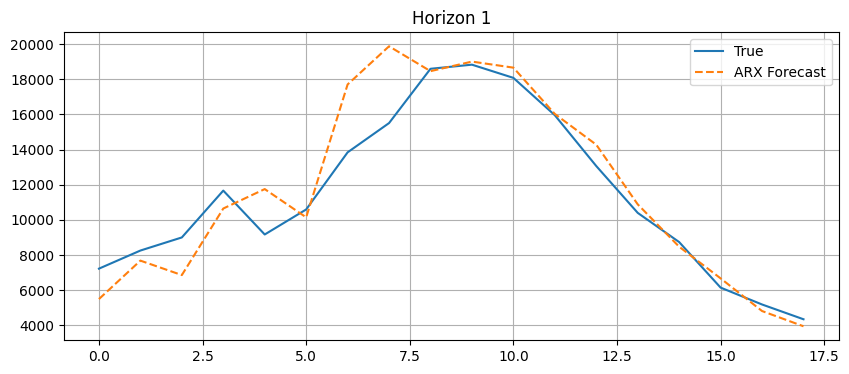

Horizon 2: MSE=0.4393, MAE=0.4181, SMAPE=17.88%


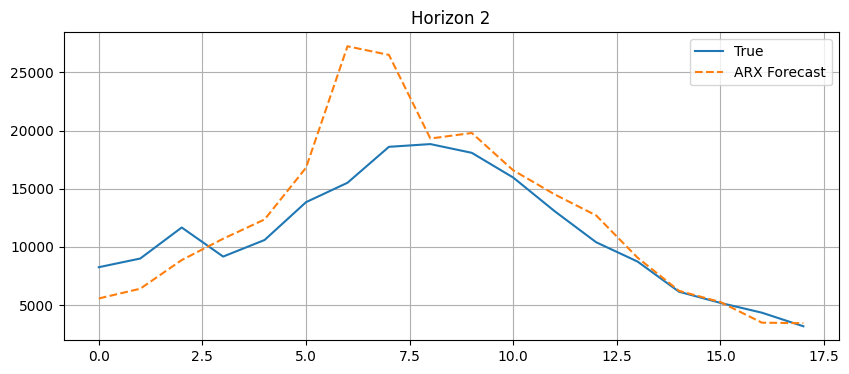

Horizon 3: MSE=1.0780, MAE=0.6127, SMAPE=22.58%


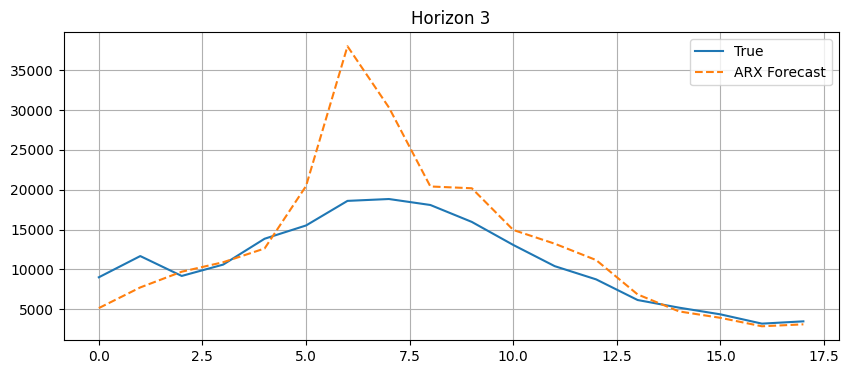

Horizon 4: MSE=2.2784, MAE=0.8794, SMAPE=31.05%


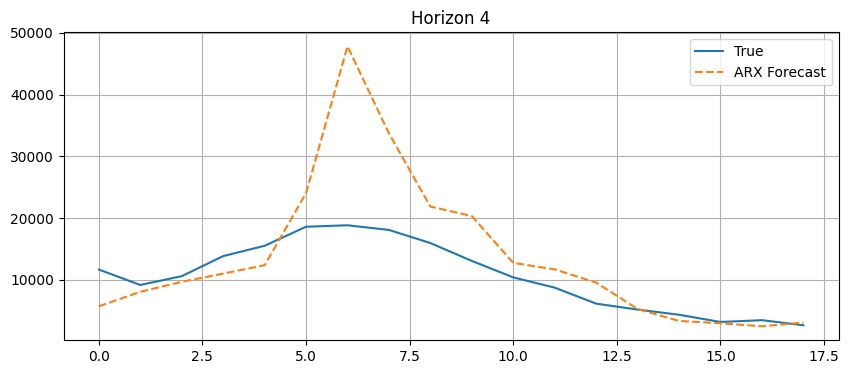

Horizon 5: MSE=4.0140, MAE=1.1665, SMAPE=40.70%


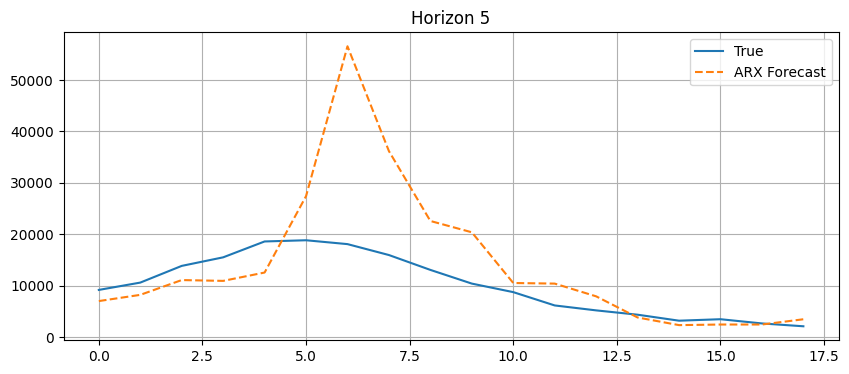

Horizon 6: MSE=6.3847, MAE=1.4548, SMAPE=50.06%


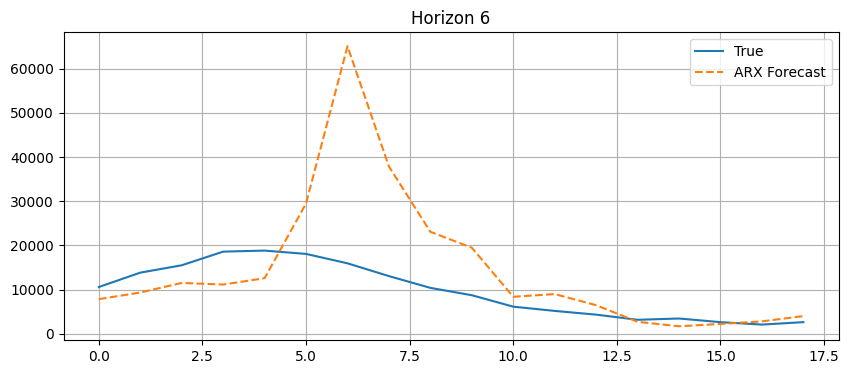

Horizon 1: MSE=0.0933, MAE=0.2080, SMAPE=10.88%
Horizon 2: MSE=0.4393, MAE=0.4181, SMAPE=17.88%
Horizon 3: MSE=1.0780, MAE=0.6127, SMAPE=22.58%
Horizon 4: MSE=2.2784, MAE=0.8794, SMAPE=31.05%
Horizon 5: MSE=4.0140, MAE=1.1665, SMAPE=40.70%
Horizon 6: MSE=6.3847, MAE=1.4548, SMAPE=50.06%


In [18]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.statespace.varmax import VARMAX



p=4
d=0
q=0
P=0
D=0
Q=0
S=0

#     for p in range(1,5):
#         for q in range(1,5)

order = (p,q)
seasonal_order = (P,D,Q,S)


# --- Utility: SMAPE metric ---
def smape(true, pred):
    return 100 * np.mean(2 * np.abs(pred - true) / (np.abs(true) + np.abs(pred)))

# --- Load and preprocess data ---
df = pd.read_csv("./../dataset/rag_data/data/covid_till14May22.csv")  # replace with actual file path
data = df[['new_deaths','icu_patients','hosp_patients','new_tests']]#,'people_vaccinated','people_fully_vaccinated','OT']]  # endogenous + exogenous

# data = np.log1p(data)
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

endog = data_scaled[:, :]             # ICU patients (target)
# exog = data_scaled[:, 1:]             # Exogenous variables
horizon = 6

# --- Split data ---
split = int(0.8 * len(endog))
train_y, test_y = endog[:split,:], endog[split:,:]
# train_x, test_x = exog[:split,:], exog[split:,:]
print(split, 0.8 * len(endog))
print(len(train_y), len(test_y))

# --- Rolling forecast with ARX ---
mse_global, mae_global, smape_global = [], [], []
predictions, truths = [], []

for i in range(len(test_y) - horizon):
#     y_train_i = np.concatenate([train_y, test_y[:i]])
    y_train_i = np.vstack([train_y, test_y[:i,:]])
#     x_train_i = np.vstack([train_x, test_x[:i]])

    model = VARMAX(y_train_i, order=order)#, exog=x_train_i[:-horizon]) #AutoReg(endog=y_train_i, lags=6) #, exog=x_train_i)
    model_fit = model.fit()

#     x_forecast = x_train_i #exog[split+i-9:split+i] #test_x[i-92:i] #[i:i + horizon]
    
        # Provide future exogenous variables for forecasting
#     x_oos = test_x[i:i + horizon]
#     pred = model_fit.predict(
#         start=len(y_train_i),
#         end=len(y_train_i) + horizon - 1,
# #         exog_oos=x_oos,
# #         exog=x_forecast
#     )
    pred_var = model_fit.forecast( steps=horizon)#,exog=x_train_i[-horizon:])
    pred = pred_var[:,0]
    
#     pred = model_fit.predict(start=len(y_train_i), end=len(y_train_i) + horizon - 1, exog=x_forecast)
    true = test_y[i:i + horizon,0]

    predictions.append(pred)
    truths.append(true)

predictions = np.array(predictions)
truths = np.array(truths)

# --- Evaluate for each horizon ---
for h in range(horizon):
    trues = truths[:, h].reshape(-1, 1)
    preds = predictions[:, h].reshape(-1, 1)

    mse = mean_squared_error(trues, preds)
    mae = mean_absolute_error(trues, preds)

    # Inverse transform for SMAPE
    trues_full = np.hstack([trues, np.zeros((len(trues), y_train_i.shape[1]-1))])
    preds_full = np.hstack([preds, np.zeros((len(preds), y_train_i.shape[1]-1))])
#     trues_inv = np.expm1(scaler.inverse_transform(trues_full))[:, 0]
#     preds_inv = np.expm1(scaler.inverse_transform(preds_full))[:, 0]

    trues_inv = (scaler.inverse_transform(trues_full))[:, 0]
    preds_inv = (scaler.inverse_transform(preds_full))[:, 0]
    
    smape_val = smape(trues_inv, preds_inv)

    mse_global.append(mse)
    mae_global.append(mae)
    smape_global.append(smape_val)

    print(f"Horizon {h+1}: MSE={mse:.4f}, MAE={mae:.4f}, SMAPE={smape_val:.2f}%")

    # Plot
    plt.figure(figsize=(10, 4))
    plt.plot(trues_inv, label="True")
    plt.plot(preds_inv, label="ARX Forecast", linestyle="--")
    plt.title(f"Horizon {h+1}")
    plt.legend()
    plt.grid()
    plt.show()
    
# --- Evaluate for each horizon ---
for h in range(horizon):
    print(f"Horizon {h+1}: MSE={mse_global[h]:.4f}, MAE={mae_global[h]:.4f}, SMAPE={smape_global[h]:.2f}%")

    
    

92 92.80000000000001
92 24
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.67748D+00    |proj g|=  8.31767D+00


 This problem is unconstrained.



At iterate    5    f= -5.71426D+00    |proj g|=  4.09634D+00

At iterate   10    f= -5.73888D+00    |proj g|=  2.34343D+00

At iterate   15    f= -5.76046D+00    |proj g|=  9.37267D-01

At iterate   20    f= -5.76310D+00    |proj g|=  1.98114D+00

At iterate   25    f= -5.76447D+00    |proj g|=  2.22242D+00

At iterate   30    f= -5.76541D+00    |proj g|=  5.56452D-01

At iterate   35    f= -5.76560D+00    |proj g|=  8.85358D-01

At iterate   40    f= -5.76620D+00    |proj g|=  4.45194D-01

At iterate   45    f= -5.76718D+00    |proj g|=  4.21852D-01

At iterate   50    f= -5.76803D+00    |proj g|=  5.91765D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.54468D+00    |proj g|=  8.19587D+00


 This problem is unconstrained.



At iterate    5    f= -5.58163D+00    |proj g|=  3.18684D+00

At iterate   10    f= -5.60382D+00    |proj g|=  2.06026D+00

At iterate   15    f= -5.62381D+00    |proj g|=  5.21013D+00

At iterate   20    f= -5.62779D+00    |proj g|=  2.16556D+00

At iterate   25    f= -5.62952D+00    |proj g|=  4.28016D-01

At iterate   30    f= -5.63052D+00    |proj g|=  1.00909D+00

At iterate   35    f= -5.63114D+00    |proj g|=  1.70954D-01

At iterate   40    f= -5.63141D+00    |proj g|=  2.82111D-01

At iterate   45    f= -5.63190D+00    |proj g|=  6.55327D-01

At iterate   50    f= -5.63385D+00    |proj g|=  1.52880D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.55065D+00    |proj g|=  8.07592D+00


 This problem is unconstrained.



At iterate    5    f= -5.58323D+00    |proj g|=  3.38893D+00

At iterate   10    f= -5.61380D+00    |proj g|=  3.14780D+00

At iterate   15    f= -5.63246D+00    |proj g|=  3.14661D+00

At iterate   20    f= -5.63492D+00    |proj g|=  4.70897D-01

At iterate   25    f= -5.63647D+00    |proj g|=  7.49849D-01

At iterate   30    f= -5.63680D+00    |proj g|=  6.44618D-01

At iterate   35    f= -5.63707D+00    |proj g|=  2.18681D-01

At iterate   40    f= -5.63778D+00    |proj g|=  6.19100D-01

At iterate   45    f= -5.64057D+00    |proj g|=  1.61690D+00

At iterate   50    f= -5.64391D+00    |proj g|=  1.01439D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.55457D+00    |proj g|=  8.03566D+00


 This problem is unconstrained.



At iterate    5    f= -5.59025D+00    |proj g|=  3.07339D+00

At iterate   10    f= -5.62398D+00    |proj g|=  4.28509D+00

At iterate   15    f= -5.63429D+00    |proj g|=  1.92144D+00

At iterate   20    f= -5.63803D+00    |proj g|=  1.36173D+00

At iterate   25    f= -5.63884D+00    |proj g|=  2.42915D+00

At iterate   30    f= -5.63986D+00    |proj g|=  8.49149D-01

At iterate   35    f= -5.64021D+00    |proj g|=  7.34246D-01

At iterate   40    f= -5.64034D+00    |proj g|=  6.10773D-01

At iterate   45    f= -5.64102D+00    |proj g|=  1.41873D+00

At iterate   50    f= -5.64211D+00    |proj g|=  9.48481D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.31803D+00    |proj g|=  7.92634D+00


 This problem is unconstrained.



At iterate    5    f= -5.34645D+00    |proj g|=  7.19648D+00

At iterate   10    f= -5.37141D+00    |proj g|=  1.98062D+00

At iterate   15    f= -5.39538D+00    |proj g|=  3.27322D+00

At iterate   20    f= -5.39771D+00    |proj g|=  3.22009D+00

At iterate   25    f= -5.40000D+00    |proj g|=  7.78336D-01

At iterate   30    f= -5.40109D+00    |proj g|=  3.51567D-01

At iterate   35    f= -5.40135D+00    |proj g|=  1.48543D-01

At iterate   40    f= -5.40162D+00    |proj g|=  3.58649D-01

At iterate   45    f= -5.40212D+00    |proj g|=  5.18099D-01

At iterate   50    f= -5.40374D+00    |proj g|=  8.43679D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.50029D+01    |proj g|=  9.41483D+02


 This problem is unconstrained.



At iterate    5    f=  3.57925D+00    |proj g|=  2.94743D+00

At iterate   10    f=  9.31519D-01    |proj g|=  2.49854D+00

At iterate   15    f=  4.49936D-01    |proj g|=  9.33316D+00

At iterate   20    f= -8.21740D-02    |proj g|=  2.82755D+00

At iterate   25    f= -5.36413D-01    |proj g|=  3.29196D+00

At iterate   30    f= -8.24072D-01    |proj g|=  2.18613D+00

At iterate   35    f= -1.31552D+00    |proj g|=  3.76674D+00

At iterate   40    f= -1.56867D+00    |proj g|=  2.05025D+00

At iterate   45    f= -1.83114D+00    |proj g|=  1.87153D+00

At iterate   50    f= -2.12246D+00    |proj g|=  2.71367D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.41211D+01    |proj g|=  1.01209D+03


 This problem is unconstrained.



At iterate    5    f=  4.21902D+00    |proj g|=  2.71643D+00

At iterate   10    f=  1.43090D+00    |proj g|=  1.91375D+00

At iterate   15    f=  8.45566D-01    |proj g|=  2.80515D+00

At iterate   20    f=  3.27732D-01    |proj g|=  2.95299D+00

At iterate   25    f= -1.62380D-01    |proj g|=  2.96090D+00

At iterate   30    f= -4.73259D-01    |proj g|=  1.73901D+00

At iterate   35    f= -9.10596D-01    |proj g|=  3.82438D+00

At iterate   40    f= -1.19394D+00    |proj g|=  1.45380D+00

At iterate   45    f= -1.51577D+00    |proj g|=  3.04674D+00

At iterate   50    f= -1.73263D+00    |proj g|=  1.75306D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.15762D+01    |proj g|=  1.51630D+03


 This problem is unconstrained.



At iterate    5    f=  5.47598D+00    |proj g|=  3.19912D+00

At iterate   10    f=  2.46705D+00    |proj g|=  1.17421D+00

At iterate   15    f=  1.23887D+00    |proj g|=  6.15017D+00

At iterate   20    f=  5.95486D-01    |proj g|=  2.83723D+00

At iterate   25    f=  9.96941D-02    |proj g|=  2.44849D+00

At iterate   30    f= -3.43360D-01    |proj g|=  2.10188D+00

At iterate   35    f= -5.97818D-01    |proj g|=  1.70866D+00

At iterate   40    f= -1.00021D+00    |proj g|=  4.89872D+00

At iterate   45    f= -1.24147D+00    |proj g|=  1.37943D+00

At iterate   50    f= -1.45530D+00    |proj g|=  2.14734D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.79161D+01    |proj g|=  1.52331D+03


 This problem is unconstrained.



At iterate    5    f=  5.58669D+00    |proj g|=  3.16796D+00

At iterate   10    f=  2.43853D+00    |proj g|=  1.09584D+00

At iterate   15    f=  1.22304D+00    |proj g|=  3.07137D+00

At iterate   20    f=  7.34791D-01    |proj g|=  1.68713D+00

At iterate   25    f=  2.96883D-01    |proj g|=  1.44511D+00

At iterate   30    f= -1.67889D-01    |proj g|=  2.33123D+00

At iterate   35    f= -5.51198D-01    |proj g|=  2.15352D+00

At iterate   40    f= -8.06853D-01    |proj g|=  2.67502D+00

At iterate   45    f= -1.14316D+00    |proj g|=  2.97095D+00

At iterate   50    f= -1.29524D+00    |proj g|=  3.63743D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.26985D+00    |proj g|=  4.87377D+00


 This problem is unconstrained.



At iterate    5    f= -4.31123D+00    |proj g|=  2.44924D+00

At iterate   10    f= -4.34781D+00    |proj g|=  1.59531D+00

At iterate   15    f= -4.35259D+00    |proj g|=  2.70525D+00

At iterate   20    f= -4.35452D+00    |proj g|=  1.05287D+00

At iterate   25    f= -4.35522D+00    |proj g|=  2.70204D-01

At iterate   30    f= -4.35554D+00    |proj g|=  3.47729D-01

At iterate   35    f= -4.35620D+00    |proj g|=  3.80312D-01

At iterate   40    f= -4.35688D+00    |proj g|=  4.79150D-01

At iterate   45    f= -4.35812D+00    |proj g|=  3.03579D-01

At iterate   50    f= -4.36014D+00    |proj g|=  3.02716D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.24257D+00    |proj g|=  4.90632D+00


 This problem is unconstrained.



At iterate    5    f= -4.28209D+00    |proj g|=  2.09007D+00

At iterate   10    f= -4.31666D+00    |proj g|=  1.64144D+00

At iterate   15    f= -4.32144D+00    |proj g|=  1.88164D+00

At iterate   20    f= -4.32311D+00    |proj g|=  2.23508D+00

At iterate   25    f= -4.32406D+00    |proj g|=  4.53147D-01

At iterate   30    f= -4.32439D+00    |proj g|=  4.77435D-01

At iterate   35    f= -4.32518D+00    |proj g|=  4.53214D-01

At iterate   40    f= -4.32581D+00    |proj g|=  4.11128D-01

At iterate   45    f= -4.32656D+00    |proj g|=  2.00614D-01

At iterate   50    f= -4.32789D+00    |proj g|=  1.06458D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.22938D+00    |proj g|=  4.96589D+00


 This problem is unconstrained.



At iterate    5    f= -4.27238D+00    |proj g|=  1.91340D+00

At iterate   10    f= -4.30233D+00    |proj g|=  1.26094D+00

At iterate   15    f= -4.30485D+00    |proj g|=  4.23089D-01

At iterate   20    f= -4.30611D+00    |proj g|=  1.37276D-01

At iterate   25    f= -4.30656D+00    |proj g|=  3.53193D-01

At iterate   30    f= -4.30720D+00    |proj g|=  4.57351D-01

At iterate   35    f= -4.30820D+00    |proj g|=  4.61148D-01

At iterate   40    f= -4.30999D+00    |proj g|=  5.02066D-01

At iterate   45    f= -4.31098D+00    |proj g|=  2.13267D-01

At iterate   50    f= -4.31242D+00    |proj g|=  9.14145D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.24949D+00    |proj g|=  4.96839D+00


 This problem is unconstrained.



At iterate    5    f= -4.29312D+00    |proj g|=  5.45963D+00

At iterate   10    f= -4.32086D+00    |proj g|=  1.13967D+00

At iterate   15    f= -4.32491D+00    |proj g|=  5.99211D-01

At iterate   20    f= -4.32599D+00    |proj g|=  6.46237D-01

At iterate   25    f= -4.32641D+00    |proj g|=  2.62358D-01

At iterate   30    f= -4.32683D+00    |proj g|=  2.64891D-01

At iterate   35    f= -4.32780D+00    |proj g|=  6.65901D-01

At iterate   40    f= -4.32899D+00    |proj g|=  4.84712D-01

At iterate   45    f= -4.33031D+00    |proj g|=  4.81330D-01

At iterate   50    f= -4.33134D+00    |proj g|=  3.04005D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.25160D+00    |proj g|=  4.97111D+00


 This problem is unconstrained.



At iterate    5    f= -4.28757D+00    |proj g|=  2.21951D+00

At iterate   10    f= -4.32060D+00    |proj g|=  1.57199D+00

At iterate   15    f= -4.32373D+00    |proj g|=  1.14684D+00

At iterate   20    f= -4.32494D+00    |proj g|=  4.08448D-01

At iterate   25    f= -4.32539D+00    |proj g|=  5.39327D-01

At iterate   30    f= -4.32614D+00    |proj g|=  2.51888D-01

At iterate   35    f= -4.32736D+00    |proj g|=  3.84829D-01

At iterate   40    f= -4.32843D+00    |proj g|=  2.97909D-01

At iterate   45    f= -4.32919D+00    |proj g|=  2.90147D-01

At iterate   50    f= -4.33065D+00    |proj g|=  6.45828D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.27019D+00    |proj g|=  4.95085D+00


 This problem is unconstrained.



At iterate    5    f= -4.30457D+00    |proj g|=  1.93563D+00

At iterate   10    f= -4.33388D+00    |proj g|=  1.08261D+00

At iterate   15    f= -4.33980D+00    |proj g|=  3.38087D-01

At iterate   20    f= -4.34117D+00    |proj g|=  6.28115D-01

At iterate   25    f= -4.34195D+00    |proj g|=  2.64404D-01

At iterate   30    f= -4.34254D+00    |proj g|=  5.90768D-01

At iterate   35    f= -4.34345D+00    |proj g|=  6.73986D-01

At iterate   40    f= -4.34458D+00    |proj g|=  6.87826D-01

At iterate   45    f= -4.34521D+00    |proj g|=  2.96773D-01

At iterate   50    f= -4.34619D+00    |proj g|=  5.12359D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.27797D+00    |proj g|=  4.91663D+00


 This problem is unconstrained.



At iterate    5    f= -4.31464D+00    |proj g|=  2.56075D+00

At iterate   10    f= -4.33825D+00    |proj g|=  1.44206D+00

At iterate   15    f= -4.34423D+00    |proj g|=  1.17274D+00

At iterate   20    f= -4.34536D+00    |proj g|=  8.35181D-01

At iterate   25    f= -4.34617D+00    |proj g|=  2.79977D-01

At iterate   30    f= -4.34685D+00    |proj g|=  5.95731D-01

At iterate   35    f= -4.34815D+00    |proj g|=  9.00966D-01

At iterate   40    f= -4.34893D+00    |proj g|=  4.27416D-01

At iterate   45    f= -4.34994D+00    |proj g|=  4.36249D-01

At iterate   50    f= -4.35094D+00    |proj g|=  1.07750D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.28404D+00    |proj g|=  4.86279D+00


 This problem is unconstrained.



At iterate    5    f= -4.31637D+00    |proj g|=  1.88905D+00

At iterate   10    f= -4.34292D+00    |proj g|=  1.11861D+00

At iterate   15    f= -4.34925D+00    |proj g|=  7.60298D-01

At iterate   20    f= -4.35031D+00    |proj g|=  6.77797D-01

At iterate   25    f= -4.35099D+00    |proj g|=  2.12237D-01

At iterate   30    f= -4.35162D+00    |proj g|=  2.73809D-01

At iterate   35    f= -4.35276D+00    |proj g|=  1.51292D-01

At iterate   40    f= -4.35385D+00    |proj g|=  7.05939D-01

At iterate   45    f= -4.35470D+00    |proj g|=  1.39398D+00

At iterate   50    f= -4.35681D+00    |proj g|=  7.23538D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.30588D+00    |proj g|=  4.83526D+00


 This problem is unconstrained.



At iterate    5    f= -4.33703D+00    |proj g|=  1.89227D+00

At iterate   10    f= -4.36227D+00    |proj g|=  1.10832D+00

At iterate   15    f= -4.36868D+00    |proj g|=  8.86639D-01

At iterate   20    f= -4.36962D+00    |proj g|=  7.46706D-01

At iterate   25    f= -4.37032D+00    |proj g|=  2.31023D-01

At iterate   30    f= -4.37102D+00    |proj g|=  2.34871D-01

At iterate   35    f= -4.37229D+00    |proj g|=  1.86283D-01

At iterate   40    f= -4.37376D+00    |proj g|=  2.98828D-01

At iterate   45    f= -4.37483D+00    |proj g|=  1.49107D+00

At iterate   50    f= -4.37751D+00    |proj g|=  1.23069D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


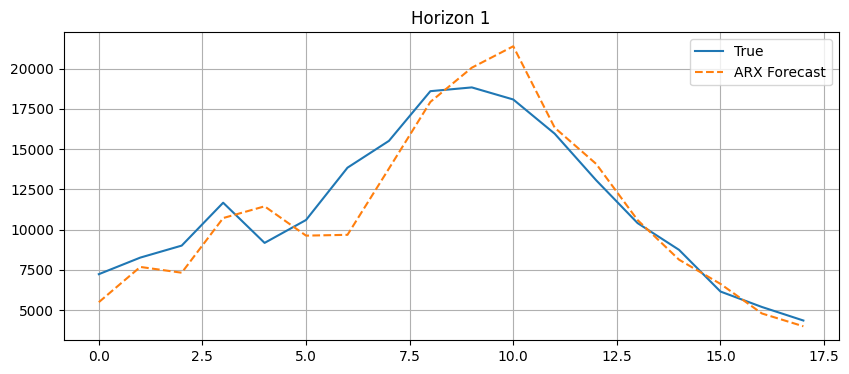

Horizon 2: MSE=0.2702, MAE=0.3933, SMAPE=19.26%


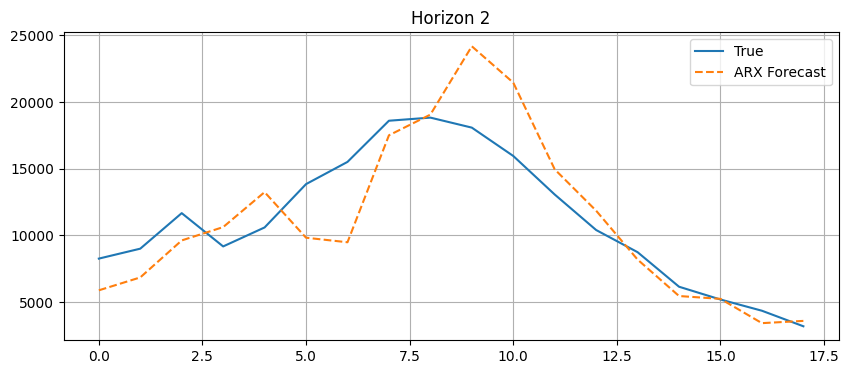

Horizon 3: MSE=0.4922, MAE=0.4708, SMAPE=21.36%


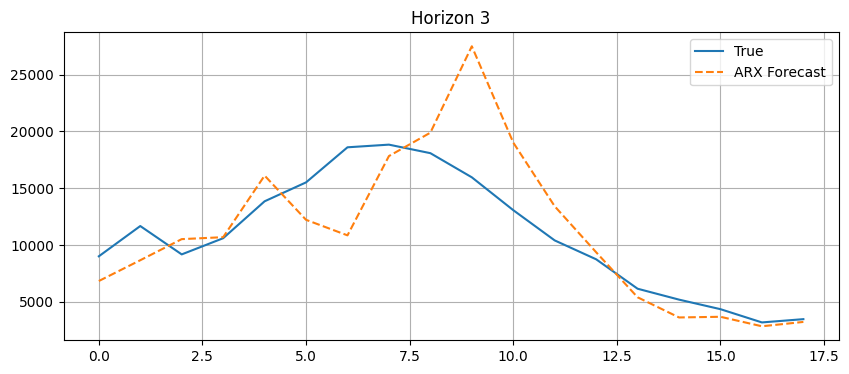

Horizon 4: MSE=0.6108, MAE=0.5105, SMAPE=27.51%


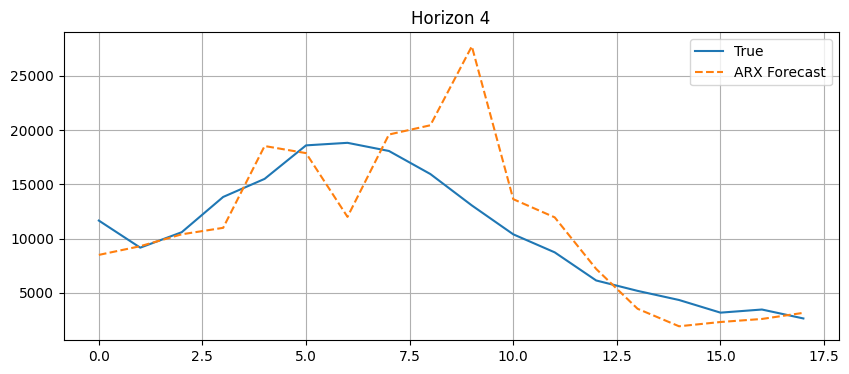

Horizon 5: MSE=0.7010, MAE=0.5735, SMAPE=37.52%


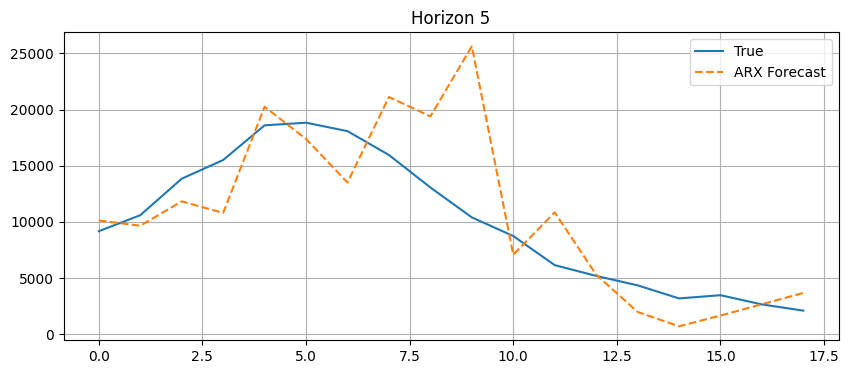

Horizon 6: MSE=0.7796, MAE=0.6673, SMAPE=56.96%


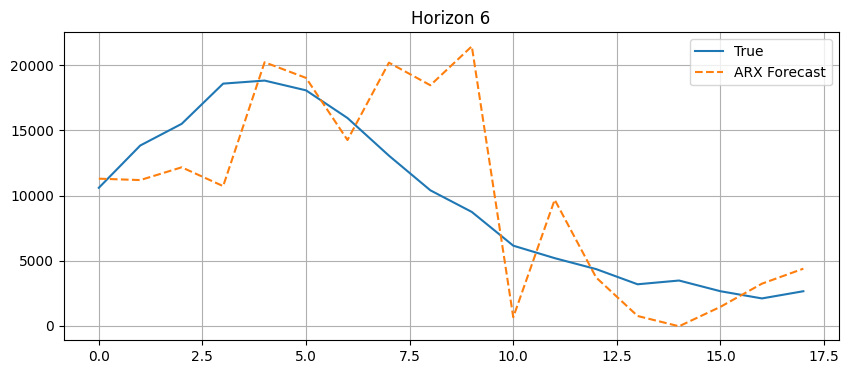

Horizon 1: MSE=0.0861, MAE=0.2255, SMAPE=11.80%
Horizon 2: MSE=0.2702, MAE=0.3933, SMAPE=19.26%
Horizon 3: MSE=0.4922, MAE=0.4708, SMAPE=21.36%
Horizon 4: MSE=0.6108, MAE=0.5105, SMAPE=27.51%
Horizon 5: MSE=0.7010, MAE=0.5735, SMAPE=37.52%
Horizon 6: MSE=0.7796, MAE=0.6673, SMAPE=56.96%


In [19]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.statespace.varmax import VARMAX



p=4
d=0
q=0
P=0
D=0
Q=0
S=0

#     for p in range(1,5):
#         for q in range(1,5)

order = (p,q)
seasonal_order = (P,D,Q,S)


# --- Utility: SMAPE metric ---
def smape(true, pred):
    return 100 * np.mean(2 * np.abs(pred - true) / (np.abs(true) + np.abs(pred)))

# --- Load and preprocess data ---
df = pd.read_csv("./../dataset/rag_data/data/covid_till14May22.csv")  # replace with actual file path
data = df[['new_deaths','icu_patients','hosp_patients','new_tests','OT']]#,'people_vaccinated','people_fully_vaccinated']]  # endogenous + exogenous

# data = np.log1p(data)
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

endog = data_scaled[:, :]             # ICU patients (target)
# exog = data_scaled[:, 1:]             # Exogenous variables
horizon = 6

# --- Split data ---
split = int(0.8 * len(endog))
train_y, test_y = endog[:split,:], endog[split:,:]
# train_x, test_x = exog[:split,:], exog[split:,:]
print(split, 0.8 * len(endog))
print(len(train_y), len(test_y))

# --- Rolling forecast with ARX ---
mse_global, mae_global, smape_global = [], [], []
predictions, truths = [], []

for i in range(len(test_y) - horizon):
#     y_train_i = np.concatenate([train_y, test_y[:i]])
    y_train_i = np.vstack([train_y, test_y[:i,:]])
#     x_train_i = np.vstack([train_x, test_x[:i]])

    model = VARMAX(y_train_i, order=order)#, exog=x_train_i[:-horizon]) #AutoReg(endog=y_train_i, lags=6) #, exog=x_train_i)
    model_fit = model.fit()

#     x_forecast = x_train_i #exog[split+i-9:split+i] #test_x[i-92:i] #[i:i + horizon]
    
        # Provide future exogenous variables for forecasting
#     x_oos = test_x[i:i + horizon]
#     pred = model_fit.predict(
#         start=len(y_train_i),
#         end=len(y_train_i) + horizon - 1,
# #         exog_oos=x_oos,
# #         exog=x_forecast
#     )
    pred_var = model_fit.forecast( steps=horizon)#,exog=x_train_i[-horizon:])
    pred = pred_var[:,0]
    
#     pred = model_fit.predict(start=len(y_train_i), end=len(y_train_i) + horizon - 1, exog=x_forecast)
    true = test_y[i:i + horizon,0]

    predictions.append(pred)
    truths.append(true)

predictions = np.array(predictions)
truths = np.array(truths)

# --- Evaluate for each horizon ---
for h in range(horizon):
    trues = truths[:, h].reshape(-1, 1)
    preds = predictions[:, h].reshape(-1, 1)

    mse = mean_squared_error(trues, preds)
    mae = mean_absolute_error(trues, preds)

    # Inverse transform for SMAPE
    trues_full = np.hstack([trues, np.zeros((len(trues), y_train_i.shape[1]-1))])
    preds_full = np.hstack([preds, np.zeros((len(preds), y_train_i.shape[1]-1))])
#     trues_inv = np.expm1(scaler.inverse_transform(trues_full))[:, 0]
#     preds_inv = np.expm1(scaler.inverse_transform(preds_full))[:, 0]

    trues_inv = (scaler.inverse_transform(trues_full))[:, 0]
    preds_inv = (scaler.inverse_transform(preds_full))[:, 0]
    
    smape_val = smape(trues_inv, preds_inv)

    mse_global.append(mse)
    mae_global.append(mae)
    smape_global.append(smape_val)

    print(f"Horizon {h+1}: MSE={mse:.4f}, MAE={mae:.4f}, SMAPE={smape_val:.2f}%")

    # Plot
    plt.figure(figsize=(10, 4))
    plt.plot(trues_inv, label="True")
    plt.plot(preds_inv, label="ARX Forecast", linestyle="--")
    plt.title(f"Horizon {h+1}")
    plt.legend()
    plt.grid()
    plt.show()
    
# --- Evaluate for each horizon ---
for h in range(horizon):
    print(f"Horizon {h+1}: MSE={mse_global[h]:.4f}, MAE={mae_global[h]:.4f}, SMAPE={smape_global[h]:.2f}%")

    
    

#### VARX

92 92.80000000000001
92 24
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           17     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.56899D-01    |proj g|=  3.25607D+00

At iterate    5    f= -9.08395D-01    |proj g|=  1.81205D-01

At iterate   10    f= -9.22703D-01    |proj g|=  2.45950D-01

At iterate   15    f= -9.42462D-01    |proj g|=  6.57245D-01

At iterate   20    f= -9.64152D-01    |proj g|=  3.28380D-01


 This problem is unconstrained.



At iterate   25    f= -9.76239D-01    |proj g|=  1.09470D-01

At iterate   30    f= -1.00387D+00    |proj g|=  6.88716D-01

At iterate   35    f= -1.00602D+00    |proj g|=  1.09444D-01

At iterate   40    f= -1.01068D+00    |proj g|=  2.81241D-01

At iterate   45    f= -1.02063D+00    |proj g|=  3.62235D-01

At iterate   50    f= -1.02722D+00    |proj g|=  2.28490D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   17     50     55      1     0     0   2.285D-01  -1.027D+00
  F =  -1.0272168571032649     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 


/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           17     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.69002D-01    |proj g|=  3.28980D+00

At iterate    5    f= -9.15854D-01    |proj g|=  3.85417D-01

At iterate   10    f= -9.29781D-01    |proj g|=  2.20771D-01

At iterate   15    f= -9.57878D-01    |proj g|=  1.92600D-01

At iterate   20    f= -9.79213D-01    |proj g|=  3.45318D-01

At iterate   25    f= -9.94392D-01    |proj g|=  9.04795D-01

At iterate   30    f= -1.00845D+00    |proj g|=  1.64323D-01

At iterate   35    f= -1.01254D+00    |proj g|=  1.75992D-01

At iterate   40    f= -1.02031D+00    |proj g|=  2.22638D-01

At iterate   45    f= -1.02725D+00    |proj g|=  2.23530D-01


/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate   50    f= -1.04320D+00    |proj g|=  2.03664D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   17     50     56      1     0     0   2.037D-01  -1.043D+00
  F =  -1.0432023687848604     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           17     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.81046D-01    |proj g|=  3.32705D+00

At iterate    5    f= -9.25419D-01    |proj g|=  2.85430D-01

At iterate   10    f= -9.38458D-01    |proj g|=  1.76242D-01

At iter

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate   15    f= -9.75446D-01    |proj g|=  3.92820D-01

At iterate   20    f= -9.90861D-01    |proj g|=  1.07781D+00

At iterate   25    f= -1.00680D+00    |proj g|=  2.28001D-01

At iterate   30    f= -1.02392D+00    |proj g|=  2.20695D-01

At iterate   35    f= -1.02893D+00    |proj g|=  8.64530D-02

At iterate   40    f= -1.03639D+00    |proj g|=  2.86412D-01

At iterate   45    f= -1.04593D+00    |proj g|=  8.29698D-02

At iterate   50    f= -1.05881D+00    |proj g|=  3.15424D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   17     50     56      1     0     0   3.154D-01  -1.059D+00
  F =  -1.05881405539

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate   10    f= -9.36917D-01    |proj g|=  3.33577D-01

At iterate   15    f= -9.68667D-01    |proj g|=  1.99639D-01

At iterate   20    f= -9.81725D-01    |proj g|=  3.92696D-01

At iterate   25    f= -9.94464D-01    |proj g|=  2.91940D-01

At iterate   30    f= -1.00853D+00    |proj g|=  2.98119D-01

At iterate   35    f= -1.01222D+00    |proj g|=  3.15878D-01

At iterate   40    f= -1.02452D+00    |proj g|=  1.93014D-01

At iterate   45    f= -1.03005D+00    |proj g|=  1.76952D-01

At iterate   50    f= -1.04170D+00    |proj g|=  2.03563D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   17     50     59   

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate    5    f= -8.93431D-01    |proj g|=  2.56611D-01

At iterate   10    f= -9.09691D-01    |proj g|=  2.40157D-01

At iterate   15    f= -9.37420D-01    |proj g|=  4.60726D-01

At iterate   20    f= -9.57758D-01    |proj g|=  5.30345D-01

At iterate   25    f= -9.63193D-01    |proj g|=  2.72981D-01

At iterate   30    f= -9.83147D-01    |proj g|=  1.62270D-01

At iterate   35    f= -9.84264D-01    |proj g|=  2.11997D-01

At iterate   40    f= -9.95294D-01    |proj g|=  5.16469D-01

At iterate   45    f= -1.00654D+00    |proj g|=  1.85432D-01

At iterate   50    f= -1.01263D+00    |proj g|=  2.61266D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate    5    f= -8.24959D-01    |proj g|=  2.07074D-01

At iterate   10    f= -8.44639D-01    |proj g|=  2.20872D-01

At iterate   15    f= -8.66590D-01    |proj g|=  2.35782D-01

At iterate   20    f= -8.91095D-01    |proj g|=  3.52956D-01

At iterate   25    f= -9.00210D-01    |proj g|=  3.20151D-01

At iterate   30    f= -9.22031D-01    |proj g|=  5.06276D-01

At iterate   35    f= -9.29363D-01    |proj g|=  8.77124D-02

At iterate   40    f= -9.31555D-01    |proj g|=  4.65297D-02

At iterate   45    f= -9.37294D-01    |proj g|=  1.60219D-01

At iterate   50    f= -9.47367D-01    |proj g|=  1.06349D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate    5    f= -7.49416D-01    |proj g|=  4.28447D-01

At iterate   10    f= -7.95667D-01    |proj g|=  6.13906D-01

At iterate   15    f= -8.46190D-01    |proj g|=  2.68516D-01

At iterate   20    f= -8.83178D-01    |proj g|=  1.40049D-01

At iterate   25    f= -9.03549D-01    |proj g|=  7.34140D-01

At iterate   30    f= -9.18481D-01    |proj g|=  7.56626D-02

At iterate   35    f= -9.29332D-01    |proj g|=  4.89515D-01

At iterate   40    f= -9.34307D-01    |proj g|=  1.16416D-01

At iterate   45    f= -9.38917D-01    |proj g|=  1.81197D-01

At iterate   50    f= -9.47122D-01    |proj g|=  2.88830D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate    5    f= -7.41471D-01    |proj g|=  4.39942D-01

At iterate   10    f= -7.78463D-01    |proj g|=  4.92056D-01

At iterate   15    f= -8.60748D-01    |proj g|=  2.74381D-01

At iterate   20    f= -8.88024D-01    |proj g|=  2.50148D-01

At iterate   25    f= -9.00829D-01    |proj g|=  4.06460D-01

At iterate   30    f= -9.11986D-01    |proj g|=  1.28953D-01

At iterate   35    f= -9.14573D-01    |proj g|=  7.78862D-02

At iterate   40    f= -9.23279D-01    |proj g|=  1.73303D-01

At iterate   45    f= -9.27709D-01    |proj g|=  2.50273D-01

At iterate   50    f= -9.30731D-01    |proj g|=  7.92988D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate    5    f= -6.90353D-01    |proj g|=  3.16701D-01

At iterate   10    f= -7.44581D-01    |proj g|=  4.51460D-01

At iterate   15    f= -8.10014D-01    |proj g|=  3.09309D-01

At iterate   20    f= -8.50996D-01    |proj g|=  2.26994D-01

At iterate   25    f= -8.63866D-01    |proj g|=  4.51188D-01

At iterate   30    f= -8.79662D-01    |proj g|=  9.12289D-02

At iterate   35    f= -8.86594D-01    |proj g|=  3.54698D-01

At iterate   40    f= -8.94482D-01    |proj g|=  1.32749D-01

At iterate   45    f= -8.98297D-01    |proj g|=  9.37553D-02

At iterate   50    f= -9.08518D-01    |proj g|=  4.70058D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           17     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.55103D-01    |proj g|=  2.92036D+00

At iterate    5    f= -6.80574D-01    |proj g|=  2.78061D-01

At iterate   10    f= -7.32307D-01    |proj g|=  6.12836D-01

At iterate   15    f= -8.08377D-01    |proj g|=  2.80920D-01

At iterate   20    f= -8.43649D-01    |proj g|=  6.87388D-01

At iterate   25    f= -8.58924D-01    |proj g|=  2.17646D-01

At iterate   30    f= -8.80886D-01    |proj g|=  2.98711D-01

At iterate   35    f= -8.90086D-01    |proj g|=  2.35642D-01

At iterate   40    f= -9.00243D-01    |proj g|=  1.00644D-01

At iterate   45    f= -9.04749D-01    |proj g|=  1.06007D-01

At iterate   50    f= -9.11054D-01    |proj g|=  2.02580D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate   15    f= -8.06450D-01    |proj g|=  2.68660D-01

At iterate   20    f= -8.45394D-01    |proj g|=  4.84044D-01

At iterate   25    f= -8.52421D-01    |proj g|=  2.38909D-01

At iterate   30    f= -8.74348D-01    |proj g|=  7.11411D-01

At iterate   35    f= -8.84658D-01    |proj g|=  1.54551D-01

At iterate   40    f= -8.95294D-01    |proj g|=  1.39765D-01

At iterate   45    f= -9.04090D-01    |proj g|=  2.01283D-01

At iterate   50    f= -9.08311D-01    |proj g|=  4.17848D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   17     50     58      1     0     0   4.178D-01  -9.083D-01
  F = -0.908311301132

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate   10    f= -7.54269D-01    |proj g|=  5.15342D-01

At iterate   15    f= -8.16057D-01    |proj g|=  4.64400D-01

At iterate   20    f= -8.46115D-01    |proj g|=  1.69252D-01

At iterate   25    f= -8.68213D-01    |proj g|=  4.84846D-01

At iterate   30    f= -8.89620D-01    |proj g|=  8.68344D-02

At iterate   35    f= -8.95750D-01    |proj g|=  2.82163D-01

At iterate   40    f= -9.08577D-01    |proj g|=  1.77358D-01

At iterate   45    f= -9.14111D-01    |proj g|=  2.19021D-01

At iterate   50    f= -9.26308D-01    |proj g|=  1.18966D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   17     50     57   

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate    5    f= -6.31072D-01    |proj g|=  6.30451D-01

At iterate   10    f= -7.23591D-01    |proj g|=  4.78530D-01

At iterate   15    f= -8.11827D-01    |proj g|=  6.49878D-01

At iterate   20    f= -8.55137D-01    |proj g|=  9.46577D-02

At iterate   25    f= -8.86001D-01    |proj g|=  4.49476D-01

At iterate   30    f= -8.96696D-01    |proj g|=  1.06012D-01

At iterate   35    f= -9.10755D-01    |proj g|=  2.89756D-01

At iterate   40    f= -9.18045D-01    |proj g|=  3.01111D-01

At iterate   45    f= -9.23393D-01    |proj g|=  2.29827D-01

At iterate   50    f= -9.32480D-01    |proj g|=  1.29805D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           17     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.27827D-01    |proj g|=  2.62066D+00

At iterate    5    f= -6.30670D-01    |proj g|=  6.63026D-01

At iterate   10    f= -7.39638D-01    |proj g|=  8.76544D-01

At iterate   15    f= -8.18012D-01    |proj g|=  4.01987D-01

At iterate   20    f= -8.68420D-01    |proj g|=  1.22368D-01

At iterate   25    f= -8.90187D-01    |proj g|=  1.11604D+00

At iterate   30    f= -9.03574D-01    |proj g|=  1.48771D-01

At iterate   35    f= -9.16725D-01    |proj g|=  4.78142D-01

At iterate   40    f= -9.33109D-01    |proj g|=  1.95147D-01

At iterate   45    f= -9.36766D-01    |proj g|=  1.51535D-01


/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate   50    f= -9.40259D-01    |proj g|=  1.60964D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   17     50     55      1     0     0   1.610D-01  -9.403D-01
  F = -0.94025851118962323     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           17     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.90602D-01    |proj g|=  2.57793D+00

At iterate    5    f= -5.99250D-01    |proj g|=  6.47710D-01

At iterate   10    f= -7.06402D-01    |proj g|=  6.29784D-01

At iter

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate   15    f= -8.34012D-01    |proj g|=  3.72771D-01

At iterate   20    f= -8.96720D-01    |proj g|=  2.10001D-01

At iterate   25    f= -9.18956D-01    |proj g|=  2.80530D-01

At iterate   30    f= -9.25517D-01    |proj g|=  3.00655D-01

At iterate   35    f= -9.39560D-01    |proj g|=  1.64778D-01

At iterate   40    f= -9.46438D-01    |proj g|=  1.28340D-01

At iterate   45    f= -9.59950D-01    |proj g|=  2.74504D-01

At iterate   50    f= -9.68001D-01    |proj g|=  3.09149D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   17     50     56      1     0     0   3.091D-01  -9.680D-01
  F = -0.968001122746

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate   10    f= -7.38272D-01    |proj g|=  6.11936D-01

At iterate   15    f= -8.50659D-01    |proj g|=  3.77899D-01

At iterate   20    f= -9.09128D-01    |proj g|=  3.45143D-01

At iterate   25    f= -9.31706D-01    |proj g|=  2.10843D-01

At iterate   30    f= -9.37772D-01    |proj g|=  3.47806D-01

At iterate   35    f= -9.65830D-01    |proj g|=  2.09476D-01

At iterate   40    f= -9.70537D-01    |proj g|=  1.97466D-01

At iterate   45    f= -9.79360D-01    |proj g|=  1.20985D-01

At iterate   50    f= -9.80634D-01    |proj g|=  1.75020D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   17     50     57   

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


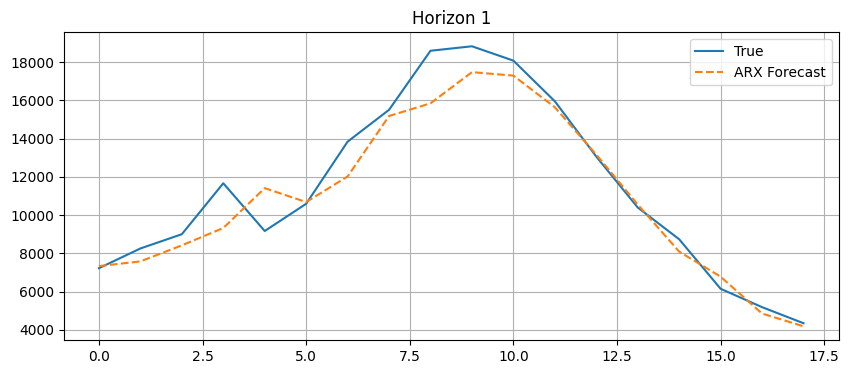

Horizon 2: MSE=0.0799, MAE=0.2144, SMAPE=11.04%


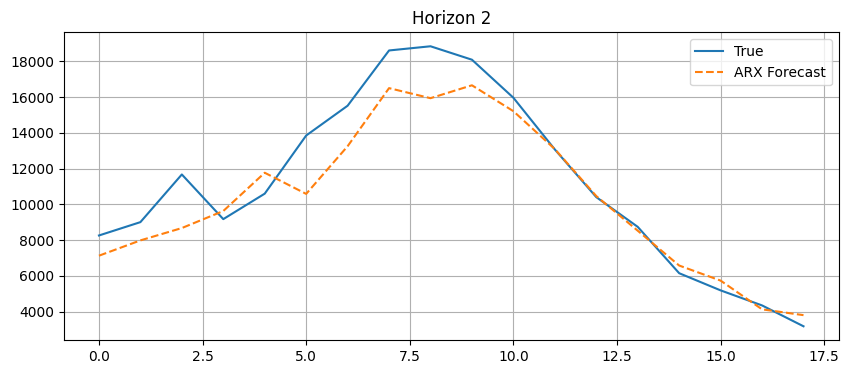

Horizon 3: MSE=0.1330, MAE=0.2714, SMAPE=14.81%


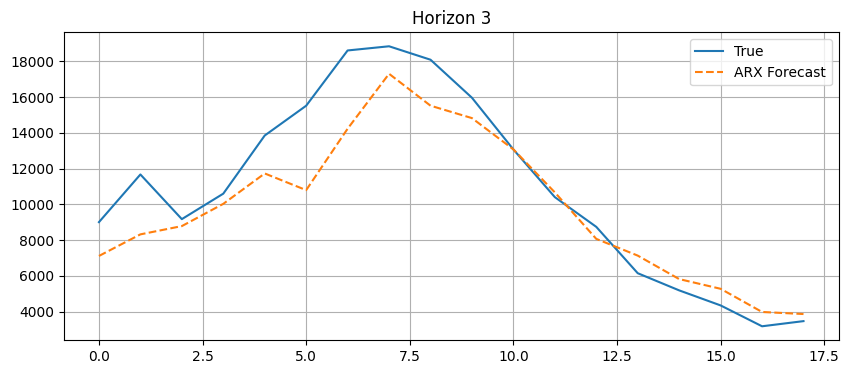

Horizon 4: MSE=0.2605, MAE=0.3654, SMAPE=22.40%


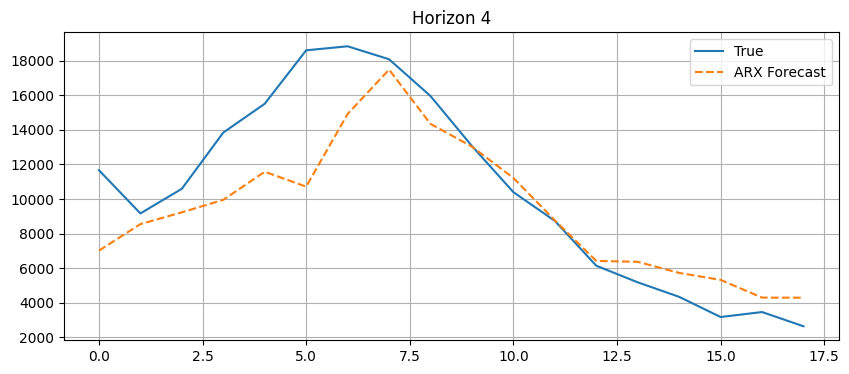

Horizon 5: MSE=0.4100, MAE=0.5021, SMAPE=33.64%


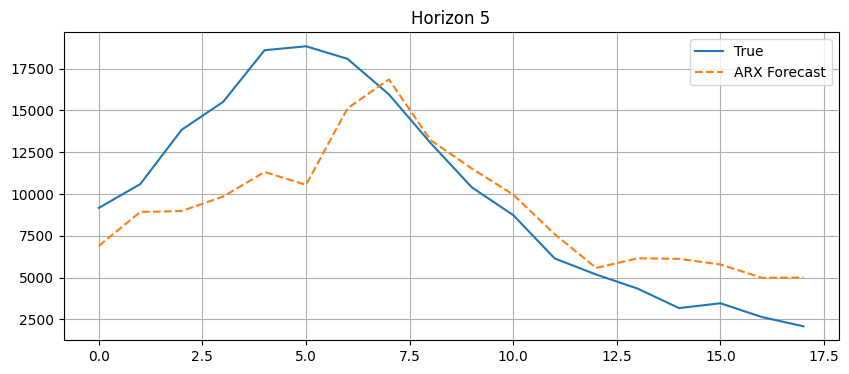

Horizon 6: MSE=0.6737, MAE=0.7092, SMAPE=47.63%


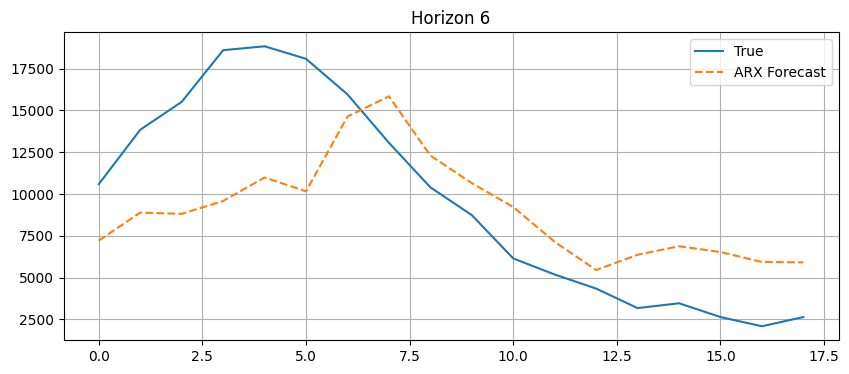

Horizon 1: MSE=0.0458, MAE=0.1531, SMAPE=7.66%
Horizon 2: MSE=0.0799, MAE=0.2144, SMAPE=11.04%
Horizon 3: MSE=0.1330, MAE=0.2714, SMAPE=14.81%
Horizon 4: MSE=0.2605, MAE=0.3654, SMAPE=22.40%
Horizon 5: MSE=0.4100, MAE=0.5021, SMAPE=33.64%
Horizon 6: MSE=0.6737, MAE=0.7092, SMAPE=47.63%


In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.statespace.varmax import VARMAX



p=2
d=0
q=0
P=0
D=0
Q=0
S=0

#     for p in range(1,5):
#         for q in range(1,5)

order = (p,q)
seasonal_order = (P,D,Q,S)


# --- Utility: SMAPE metric ---
def smape(true, pred):
    return 100 * np.mean(2 * np.abs(pred - true) / (np.abs(true) + np.abs(pred)))

# --- Load and preprocess data ---
df = pd.read_csv("./../dataset/rag_data/data/covid_till14May22.csv")  # replace with actual file path
data = df[['new_deaths','icu_patients','hosp_patients','new_tests','OT']]#,'people_vaccinated','people_fully_vaccinated','OT']]  # endogenous + exogenous

# data = np.log1p(data)
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)
exog_col_start = 2

endog = data_scaled[:, :exog_col_start]             # ICU patients (target)
exog = data_scaled[:, exog_col_start:]             # Exogenous variables
horizon = 6

# --- Split data ---
split = int(0.8 * len(endog))
train_y, test_y = endog[:split,:], endog[split:,:]
train_x, test_x = exog[:split,:], exog[split:,:]
print(split, 0.8 * len(endog))
print(len(train_y), len(test_y))

# --- Rolling forecast with ARX ---
mse_global, mae_global, smape_global = [], [], []
predictions, truths = [], []

for i in range(len(test_y) - horizon):
#     y_train_i = np.concatenate([train_y, test_y[:i]])
    y_train_i = np.vstack([train_y, test_y[:i,:]])
    x_train_i = np.vstack([train_x, test_x[:i,:]])

    model = VARMAX(y_train_i[horizon:,:], order=order, exog=x_train_i[:-horizon,:]) #AutoReg(endog=y_train_i, lags=6) #, exog=x_train_i)
    model_fit = model.fit()

#     x_forecast = x_train_i #exog[split+i-9:split+i] #test_x[i-92:i] #[i:i + horizon]
    
        # Provide future exogenous variables for forecasting
#     x_oos = test_x[i:i + horizon]
#     pred = model_fit.predict(
#         start=len(y_train_i),
#         end=len(y_train_i) + horizon - 1,
# #         exog_oos=x_oos,
# #         exog=x_forecast
#     )
    pred_var = model_fit.forecast( steps=horizon,exog=x_train_i[-horizon:,:])
    pred = pred_var[:,0]
    
#     pred = model_fit.predict(start=len(y_train_i), end=len(y_train_i) + horizon - 1, exog=x_forecast)
    true = test_y[i:i + horizon,0]

    predictions.append(pred)
    truths.append(true)

predictions = np.array(predictions)
truths = np.array(truths)

# --- Evaluate for each horizon ---
for h in range(horizon):
    trues = truths[:, h].reshape(-1, 1)
    preds = predictions[:, h].reshape(-1, 1)

    mse = mean_squared_error(trues, preds)
    mae = mean_absolute_error(trues, preds)

    # Inverse transform for SMAPE
    trues_full = np.hstack([trues, np.zeros((len(trues), (x_train_i.shape[1]+y_train_i.shape[1])-1))])
    preds_full = np.hstack([preds, np.zeros((len(preds), (x_train_i.shape[1]+y_train_i.shape[1])-1))])
#     trues_inv = np.expm1(scaler.inverse_transform(trues_full))[:, 0]
#     preds_inv = np.expm1(scaler.inverse_transform(preds_full))[:, 0]

    trues_inv = (scaler.inverse_transform(trues_full))[:, 0]
    preds_inv = (scaler.inverse_transform(preds_full))[:, 0]
    
    smape_val = smape(trues_inv, preds_inv)

    mse_global.append(mse)
    mae_global.append(mae)
    smape_global.append(smape_val)

    print(f"Horizon {h+1}: MSE={mse:.4f}, MAE={mae:.4f}, SMAPE={smape_val:.2f}%")

    # Plot
    plt.figure(figsize=(10, 4))
    plt.plot(trues_inv, label="True")
    plt.plot(preds_inv, label="ARX Forecast", linestyle="--")
    plt.title(f"Horizon {h+1}")
    plt.legend()
    plt.grid()
    plt.show()
    
# --- Evaluate for each horizon ---
for h in range(horizon):
    print(f"Horizon {h+1}: MSE={mse_global[h]:.4f}, MAE={mae_global[h]:.4f}, SMAPE={smape_global[h]:.2f}%")

    
    

92 92.80000000000001
92 24
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           80     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.29867D+00    |proj g|=  3.67704D+01


 This problem is unconstrained.



At iterate    5    f= -6.51326D+00    |proj g|=  1.47268D+01

At iterate   10    f= -6.60411D+00    |proj g|=  2.50738D+01

At iterate   15    f= -6.64957D+00    |proj g|=  1.41313D+01

At iterate   20    f= -6.70797D+00    |proj g|=  4.01608D+00

At iterate   25    f= -6.73183D+00    |proj g|=  5.56281D+00

At iterate   30    f= -6.77463D+00    |proj g|=  2.04108D+00

At iterate   35    f= -6.79241D+00    |proj g|=  5.60036D+00

At iterate   40    f= -6.82296D+00    |proj g|=  4.71776D+00

At iterate   45    f= -6.83463D+00    |proj g|=  3.32939D+00

At iterate   50    f= -6.84352D+00    |proj g|=  6.40330D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           80     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.20502D+00    |proj g|=  3.32331D+01


 This problem is unconstrained.



At iterate    5    f= -6.39600D+00    |proj g|=  2.34443D+01

At iterate   10    f= -6.47958D+00    |proj g|=  1.69302D+01

At iterate   15    f= -6.52455D+00    |proj g|=  1.75249D+01

At iterate   20    f= -6.58483D+00    |proj g|=  2.95245D+01

At iterate   25    f= -6.61554D+00    |proj g|=  5.80800D+00

At iterate   30    f= -6.65895D+00    |proj g|=  5.92826D+00

At iterate   35    f= -6.67843D+00    |proj g|=  2.76014D+00

At iterate   40    f= -6.71368D+00    |proj g|=  4.16314D+00

At iterate   45    f= -6.72432D+00    |proj g|=  2.93878D+00

At iterate   50    f= -6.73731D+00    |proj g|=  4.77024D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           80     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.20642D+00    |proj g|=  3.42472D+01


 This problem is unconstrained.



At iterate    5    f= -6.40546D+00    |proj g|=  2.26101D+01

At iterate   10    f= -6.49146D+00    |proj g|=  1.89264D+01

At iterate   15    f= -6.52631D+00    |proj g|=  1.31157D+01

At iterate   20    f= -6.59810D+00    |proj g|=  1.73516D+01

At iterate   25    f= -6.62197D+00    |proj g|=  3.29071D+00

At iterate   30    f= -6.65854D+00    |proj g|=  5.62789D+00

At iterate   35    f= -6.68263D+00    |proj g|=  3.21109D+00

At iterate   40    f= -6.70268D+00    |proj g|=  1.04529D+01

At iterate   45    f= -6.72076D+00    |proj g|=  4.95865D+00

At iterate   50    f= -6.73534D+00    |proj g|=  3.09178D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           80     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.21375D+00    |proj g|=  3.30981D+01


 This problem is unconstrained.



At iterate    5    f= -6.41995D+00    |proj g|=  9.91794D+00

At iterate   10    f= -6.50323D+00    |proj g|=  7.72919D+00

At iterate   15    f= -6.54190D+00    |proj g|=  6.33553D+00

At iterate   20    f= -6.60635D+00    |proj g|=  3.95178D+00

At iterate   25    f= -6.63158D+00    |proj g|=  4.29897D+00

At iterate   30    f= -6.66632D+00    |proj g|=  9.77678D+00

At iterate   35    f= -6.68828D+00    |proj g|=  3.18714D+00

At iterate   40    f= -6.72069D+00    |proj g|=  3.28670D+00

At iterate   45    f= -6.73086D+00    |proj g|=  9.22277D+00

At iterate   50    f= -6.74883D+00    |proj g|=  2.63522D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           80     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.21125D+00    |proj g|=  3.21021D+01


 This problem is unconstrained.



At iterate    5    f= -6.40791D+00    |proj g|=  1.59819D+01

At iterate   10    f= -6.48202D+00    |proj g|=  1.82081D+01

At iterate   15    f= -6.52453D+00    |proj g|=  1.00845D+01

At iterate   20    f= -6.60012D+00    |proj g|=  1.25725D+01

At iterate   25    f= -6.62694D+00    |proj g|=  1.16620D+01

At iterate   30    f= -6.66726D+00    |proj g|=  1.49208D+01

At iterate   35    f= -6.69515D+00    |proj g|=  4.67391D+00

At iterate   40    f= -6.71896D+00    |proj g|=  6.74539D+00

At iterate   45    f= -6.73079D+00    |proj g|=  9.77199D+00

At iterate   50    f= -6.74488D+00    |proj g|=  6.67048D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           80     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.78971D+00    |proj g|=  2.70552D+01


 This problem is unconstrained.



At iterate    5    f= -5.99742D+00    |proj g|=  1.37782D+01

At iterate   10    f= -6.07818D+00    |proj g|=  4.59708D+00

At iterate   15    f= -6.15139D+00    |proj g|=  1.07203D+01

At iterate   20    f= -6.20344D+00    |proj g|=  4.70204D+00

At iterate   25    f= -6.23484D+00    |proj g|=  1.03889D+01

At iterate   30    f= -6.25765D+00    |proj g|=  1.47284D+01

At iterate   35    f= -6.29306D+00    |proj g|=  9.02916D+00

At iterate   40    f= -6.30922D+00    |proj g|=  3.93033D+00

At iterate   45    f= -6.32030D+00    |proj g|=  2.60576D+00

At iterate   50    f= -6.32944D+00    |proj g|=  2.24773D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           80     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.16820D+02    |proj g|=  5.00631D+04


 This problem is unconstrained.



At iterate    5    f=  7.73415D+00    |proj g|=  2.52811D+01

At iterate   10    f=  2.14088D+00    |proj g|=  1.77329D+00

At iterate   15    f=  1.33166D+00    |proj g|=  1.98758D+00

At iterate   20    f= -5.39664D-02    |proj g|=  1.84104D+00

At iterate   25    f= -4.58645D-01    |proj g|=  2.66657D+00

At iterate   30    f= -7.31233D-01    |proj g|=  3.51581D+00

At iterate   35    f= -1.11776D+00    |proj g|=  2.33954D+00

At iterate   40    f= -1.49569D+00    |proj g|=  1.50320D+00

At iterate   45    f= -1.93442D+00    |proj g|=  4.59523D+00

At iterate   50    f= -2.14733D+00    |proj g|=  3.79647D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           80     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.50654D+00    |proj g|=  2.72121D+01


 This problem is unconstrained.



At iterate    5    f= -5.71487D+00    |proj g|=  1.74353D+01

At iterate   10    f= -5.78102D+00    |proj g|=  8.65697D+00

At iterate   15    f= -5.84778D+00    |proj g|=  1.49551D+01

At iterate   20    f= -5.94171D+00    |proj g|=  7.56741D+00

At iterate   25    f= -5.96754D+00    |proj g|=  2.58454D+00

At iterate   30    f= -6.01126D+00    |proj g|=  1.17169D+01

At iterate   35    f= -6.03239D+00    |proj g|=  9.17033D+00

At iterate   40    f= -6.05117D+00    |proj g|=  1.76703D+01

At iterate   45    f= -6.06139D+00    |proj g|=  3.57679D+00

At iterate   50    f= -6.07220D+00    |proj g|=  3.99465D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           80     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.41555D+00    |proj g|=  3.23808D+01


 This problem is unconstrained.



At iterate    5    f= -5.65393D+00    |proj g|=  8.23026D+00

At iterate   10    f= -5.72333D+00    |proj g|=  6.33649D+00

At iterate   15    f= -5.78685D+00    |proj g|=  1.77614D+01

At iterate   20    f= -5.87397D+00    |proj g|=  1.44839D+01

At iterate   25    f= -5.90389D+00    |proj g|=  5.87419D+00

At iterate   30    f= -5.92646D+00    |proj g|=  9.71681D+00

At iterate   35    f= -5.96097D+00    |proj g|=  3.63301D+00

At iterate   40    f= -5.97551D+00    |proj g|=  4.95544D+00

At iterate   45    f= -5.99207D+00    |proj g|=  2.84630D+00

At iterate   50    f= -6.00839D+00    |proj g|=  3.52035D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           80     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.37558D+00    |proj g|=  2.96051D+01


 This problem is unconstrained.



At iterate    5    f= -5.56492D+00    |proj g|=  4.56713D+01

At iterate   10    f= -5.64964D+00    |proj g|=  9.20040D+00

At iterate   15    f= -5.73462D+00    |proj g|=  1.75987D+01

At iterate   20    f= -5.82221D+00    |proj g|=  2.00830D+01

At iterate   25    f= -5.87404D+00    |proj g|=  1.87534D+01

At iterate   30    f= -5.90428D+00    |proj g|=  4.77018D+00

At iterate   35    f= -5.96146D+00    |proj g|=  4.13670D+00

At iterate   40    f= -5.98049D+00    |proj g|=  1.50812D+01

At iterate   45    f= -5.99151D+00    |proj g|=  6.52775D+00

At iterate   50    f= -6.00627D+00    |proj g|=  2.05228D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           80     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.33170D+00    |proj g|=  3.17955D+01


 This problem is unconstrained.



At iterate    5    f= -5.58818D+00    |proj g|=  1.00748D+01

At iterate   10    f= -5.66545D+00    |proj g|=  1.01280D+01

At iterate   15    f= -5.76092D+00    |proj g|=  1.04776D+01

At iterate   20    f= -5.86222D+00    |proj g|=  1.87237D+01

At iterate   25    f= -5.90240D+00    |proj g|=  1.16114D+01

At iterate   30    f= -5.94318D+00    |proj g|=  1.09641D+01

At iterate   35    f= -5.98052D+00    |proj g|=  3.23939D+00

At iterate   40    f= -5.99734D+00    |proj g|=  6.50510D+00

At iterate   45    f= -6.01628D+00    |proj g|=  1.06356D+01

At iterate   50    f= -6.03421D+00    |proj g|=  9.04735D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           80     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.35592D+00    |proj g|=  3.50805D+01


 This problem is unconstrained.



At iterate    5    f= -5.62155D+00    |proj g|=  8.93471D+00

At iterate   10    f= -5.68062D+00    |proj g|=  1.84347D+01

At iterate   15    f= -5.73341D+00    |proj g|=  2.54354D+01

At iterate   20    f= -5.80496D+00    |proj g|=  3.14522D+01

At iterate   25    f= -5.87805D+00    |proj g|=  7.69227D+00

At iterate   30    f= -5.93322D+00    |proj g|=  5.33750D+00

At iterate   35    f= -5.94650D+00    |proj g|=  8.21470D+00

At iterate   40    f= -5.96775D+00    |proj g|=  6.66542D+00

At iterate   45    f= -5.99965D+00    |proj g|=  3.28478D+00

At iterate   50    f= -6.02666D+00    |proj g|=  1.68381D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           80     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.63049D+00    |proj g|=  3.48496D+01


 This problem is unconstrained.



At iterate    5    f= -5.79660D+00    |proj g|=  6.41365D+00

At iterate   10    f= -5.85434D+00    |proj g|=  1.85909D+01

At iterate   15    f= -5.88650D+00    |proj g|=  1.95567D+01

At iterate   20    f= -5.94442D+00    |proj g|=  5.08292D+00

At iterate   25    f= -5.97447D+00    |proj g|=  3.71607D+00

At iterate   30    f= -5.99187D+00    |proj g|=  1.83270D+01

At iterate   35    f= -6.01648D+00    |proj g|=  1.67372D+01

At iterate   40    f= -6.04043D+00    |proj g|=  2.36583D+00

At iterate   45    f= -6.04757D+00    |proj g|=  3.79488D+00

At iterate   50    f= -6.05756D+00    |proj g|=  5.73561D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           80     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.86437D+00    |proj g|=  3.48841D+01


 This problem is unconstrained.



At iterate    5    f= -5.96785D+00    |proj g|=  5.83697D+00

At iterate   10    f= -6.00885D+00    |proj g|=  4.33744D+00

At iterate   15    f= -6.02909D+00    |proj g|=  1.06752D+01

At iterate   20    f= -6.06393D+00    |proj g|=  6.88684D+00

At iterate   25    f= -6.08870D+00    |proj g|=  8.29107D+00

At iterate   30    f= -6.11129D+00    |proj g|=  3.51924D+00

At iterate   35    f= -6.12819D+00    |proj g|=  1.38378D+00

At iterate   40    f= -6.13472D+00    |proj g|=  5.12469D+00

At iterate   45    f= -6.14861D+00    |proj g|=  2.62619D+00

At iterate   50    f= -6.15833D+00    |proj g|=  1.82273D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           80     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.94335D+00    |proj g|=  3.42481D+01


 This problem is unconstrained.



At iterate    5    f= -6.01727D+00    |proj g|=  1.89909D+01

At iterate   10    f= -6.04872D+00    |proj g|=  1.04162D+01

At iterate   15    f= -6.06012D+00    |proj g|=  7.53493D+00

At iterate   20    f= -6.08659D+00    |proj g|=  6.04635D+00

At iterate   25    f= -6.12219D+00    |proj g|=  3.63429D+00

At iterate   30    f= -6.14841D+00    |proj g|=  5.61948D+00

At iterate   35    f= -6.16397D+00    |proj g|=  4.32549D+00

At iterate   40    f= -6.17177D+00    |proj g|=  1.51072D+00

At iterate   45    f= -6.17922D+00    |proj g|=  3.32204D+00

At iterate   50    f= -6.19302D+00    |proj g|=  5.88983D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           80     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.01730D+00    |proj g|=  3.26609D+01


 This problem is unconstrained.



At iterate    5    f= -6.07697D+00    |proj g|=  4.02888D+00

At iterate   10    f= -6.09956D+00    |proj g|=  1.25399D+01

At iterate   15    f= -6.11247D+00    |proj g|=  9.39789D+00

At iterate   20    f= -6.13318D+00    |proj g|=  7.16235D+00

At iterate   25    f= -6.15942D+00    |proj g|=  5.28252D+00

At iterate   30    f= -6.18258D+00    |proj g|=  3.65902D+00

At iterate   35    f= -6.19237D+00    |proj g|=  5.21357D+00

At iterate   40    f= -6.19822D+00    |proj g|=  3.81750D+00

At iterate   45    f= -6.20566D+00    |proj g|=  5.35529D+00

At iterate   50    f= -6.21641D+00    |proj g|=  1.55094D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           80     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.05009D+00    |proj g|=  3.13958D+01


 This problem is unconstrained.



At iterate    5    f= -6.10238D+00    |proj g|=  3.52465D+00

At iterate   10    f= -6.12539D+00    |proj g|=  4.64807D+00

At iterate   15    f= -6.13848D+00    |proj g|=  1.38717D+01

At iterate   20    f= -6.16050D+00    |proj g|=  1.07868D+01

At iterate   25    f= -6.19114D+00    |proj g|=  2.00987D+00

At iterate   30    f= -6.20336D+00    |proj g|=  2.70891D+00

At iterate   35    f= -6.21016D+00    |proj g|=  1.18868D+00

At iterate   40    f= -6.22251D+00    |proj g|=  7.09575D+00

At iterate   45    f= -6.23240D+00    |proj g|=  3.28601D+00

At iterate   50    f= -6.23747D+00    |proj g|=  8.13749D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           80     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.07634D+00    |proj g|=  3.08375D+01


 This problem is unconstrained.



At iterate    5    f= -6.12890D+00    |proj g|=  3.80414D+00

At iterate   10    f= -6.15037D+00    |proj g|=  2.40889D+00

At iterate   15    f= -6.16395D+00    |proj g|=  2.72372D+01

At iterate   20    f= -6.18352D+00    |proj g|=  9.21792D+00

At iterate   25    f= -6.20847D+00    |proj g|=  3.93173D+00

At iterate   30    f= -6.21812D+00    |proj g|=  1.95333D+00

At iterate   35    f= -6.22679D+00    |proj g|=  5.37345D+00

At iterate   40    f= -6.23151D+00    |proj g|=  7.76965D+00

At iterate   45    f= -6.24572D+00    |proj g|=  4.50984D+00

At iterate   50    f= -6.25340D+00    |proj g|=  2.17521D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


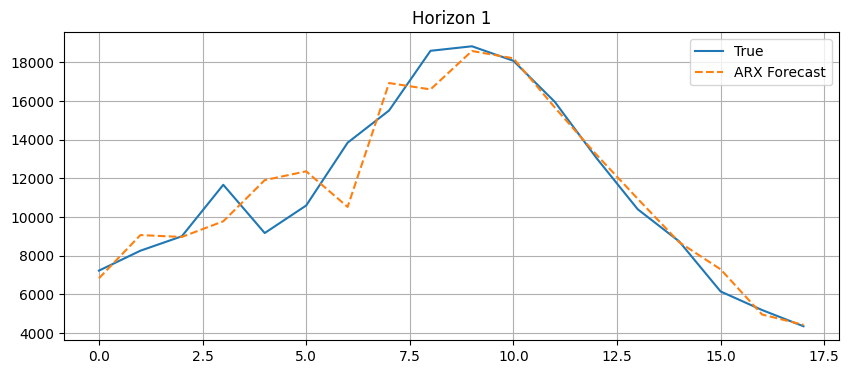

Horizon 2: MSE=0.0552, MAE=0.2067, SMAPE=10.94%


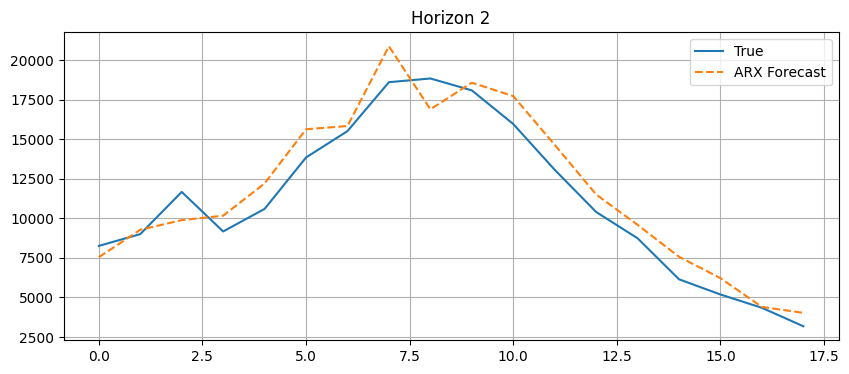

Horizon 3: MSE=0.2371, MAE=0.3905, SMAPE=19.73%


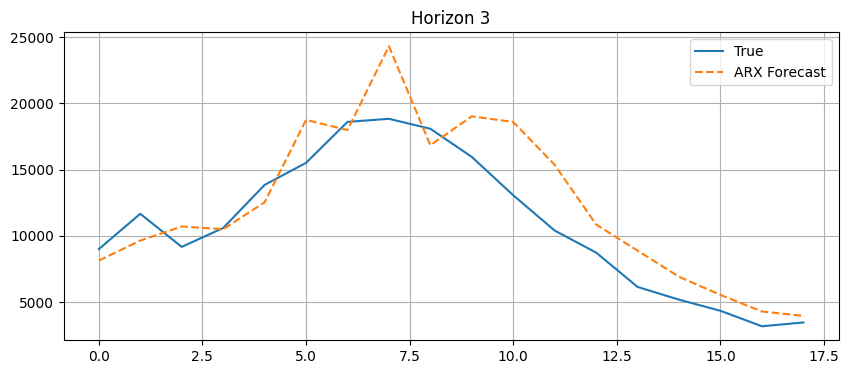

Horizon 4: MSE=0.7043, MAE=0.6594, SMAPE=33.39%


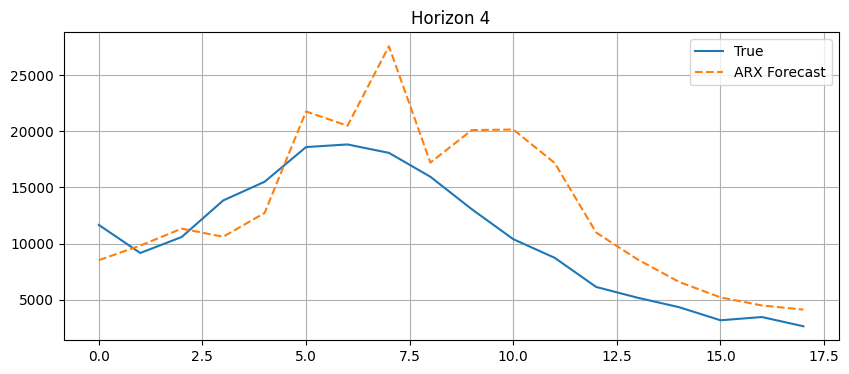

Horizon 5: MSE=1.6511, MAE=1.0285, SMAPE=49.65%


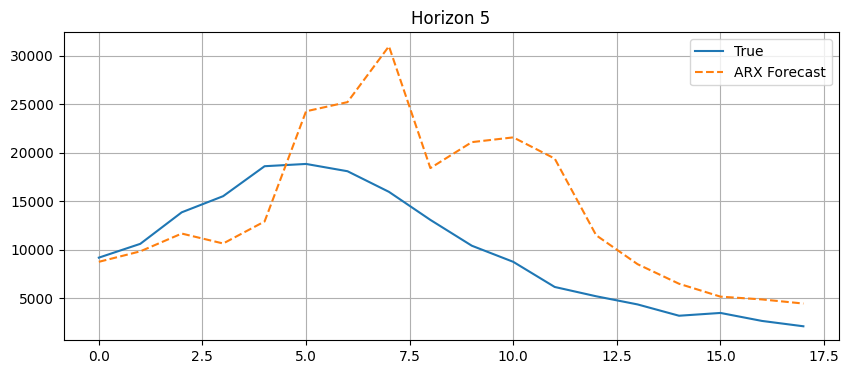

Horizon 6: MSE=3.2155, MAE=1.4660, SMAPE=66.81%


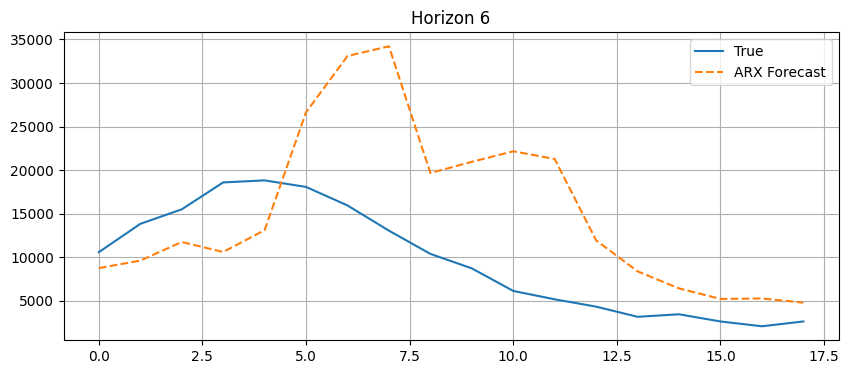

Horizon 1: MSE=0.0601, MAE=0.1712, SMAPE=8.65%
Horizon 2: MSE=0.0552, MAE=0.2067, SMAPE=10.94%
Horizon 3: MSE=0.2371, MAE=0.3905, SMAPE=19.73%
Horizon 4: MSE=0.7043, MAE=0.6594, SMAPE=33.39%
Horizon 5: MSE=1.6511, MAE=1.0285, SMAPE=49.65%
Horizon 6: MSE=3.2155, MAE=1.4660, SMAPE=66.81%


In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.statespace.varmax import VARMAX



p=2
d=0
q=0
P=0
D=0
Q=0
S=0

#     for p in range(1,5):
#         for q in range(1,5)

order = (p,q)
seasonal_order = (P,D,Q,S)


# --- Utility: SMAPE metric ---
def smape(true, pred):
    return 100 * np.mean(2 * np.abs(pred - true) / (np.abs(true) + np.abs(pred)))

# --- Load and preprocess data ---
df = pd.read_csv("./../dataset/rag_data/data/covid_till14May22.csv")  # replace with actual file path
data = df[['new_deaths','icu_patients','hosp_patients','new_tests','people_vaccinated','people_fully_vaccinated','OT']]  # endogenous + exogenous

# data = np.log1p(data)
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)
exog_col_start = 5

endog = data_scaled[:, :exog_col_start]             # ICU patients (target)
exog = data_scaled[:, exog_col_start:]             # Exogenous variables
horizon = 6

# --- Split data ---
split = int(0.8 * len(endog))
train_y, test_y = endog[:split,:], endog[split:,:]
train_x, test_x = exog[:split,:], exog[split:,:]
print(split, 0.8 * len(endog))
print(len(train_y), len(test_y))

# --- Rolling forecast with ARX ---
mse_global, mae_global, smape_global = [], [], []
predictions, truths = [], []

for i in range(len(test_y) - horizon):
#     y_train_i = np.concatenate([train_y, test_y[:i]])
    y_train_i = np.vstack([train_y, test_y[:i,:]])
    x_train_i = np.vstack([train_x, test_x[:i,:]])

    model = VARMAX(y_train_i[horizon:,:], order=order, exog=x_train_i[:-horizon,:]) #AutoReg(endog=y_train_i, lags=6) #, exog=x_train_i)
    model_fit = model.fit()

#     x_forecast = x_train_i #exog[split+i-9:split+i] #test_x[i-92:i] #[i:i + horizon]
    
        # Provide future exogenous variables for forecasting
#     x_oos = test_x[i:i + horizon]
#     pred = model_fit.predict(
#         start=len(y_train_i),
#         end=len(y_train_i) + horizon - 1,
# #         exog_oos=x_oos,
# #         exog=x_forecast
#     )
    pred_var = model_fit.forecast( steps=horizon,exog=x_train_i[-horizon:,:])
    pred = pred_var[:,0]
    
#     pred = model_fit.predict(start=len(y_train_i), end=len(y_train_i) + horizon - 1, exog=x_forecast)
    true = test_y[i:i + horizon,0]

    predictions.append(pred)
    truths.append(true)

predictions = np.array(predictions)
truths = np.array(truths)

# --- Evaluate for each horizon ---
for h in range(horizon):
    trues = truths[:, h].reshape(-1, 1)
    preds = predictions[:, h].reshape(-1, 1)

    mse = mean_squared_error(trues, preds)
    mae = mean_absolute_error(trues, preds)

    # Inverse transform for SMAPE
    trues_full = np.hstack([trues, np.zeros((len(trues), (x_train_i.shape[1]+y_train_i.shape[1])-1))])
    preds_full = np.hstack([preds, np.zeros((len(preds), (x_train_i.shape[1]+y_train_i.shape[1])-1))])
#     trues_inv = np.expm1(scaler.inverse_transform(trues_full))[:, 0]
#     preds_inv = np.expm1(scaler.inverse_transform(preds_full))[:, 0]

    trues_inv = (scaler.inverse_transform(trues_full))[:, 0]
    preds_inv = (scaler.inverse_transform(preds_full))[:, 0]
    
    smape_val = smape(trues_inv, preds_inv)

    mse_global.append(mse)
    mae_global.append(mae)
    smape_global.append(smape_val)

    print(f"Horizon {h+1}: MSE={mse:.4f}, MAE={mae:.4f}, SMAPE={smape_val:.2f}%")

    # Plot
    plt.figure(figsize=(10, 4))
    plt.plot(trues_inv, label="True")
    plt.plot(preds_inv, label="ARX Forecast", linestyle="--")
    plt.title(f"Horizon {h+1}")
    plt.legend()
    plt.grid()
    plt.show()
    
# --- Evaluate for each horizon ---
for h in range(horizon):
    print(f"Horizon {h+1}: MSE={mse_global[h]:.4f}, MAE={mae_global[h]:.4f}, SMAPE={smape_global[h]:.2f}%")

    
    

In [20]:
( 8.65 + 10.94 + 19.73 + 33.39 + 49.65 + 66.81 )/6

31.528333333333336

92 92.80000000000001
92 24
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          130     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.21098D+00    |proj g|=  6.20476D+01


 This problem is unconstrained.



At iterate    5    f= -6.34160D+00    |proj g|=  3.05040D+01

At iterate   10    f= -6.45637D+00    |proj g|=  1.76066D+01

At iterate   15    f= -6.54031D+00    |proj g|=  6.22368D+00

At iterate   20    f= -6.56245D+00    |proj g|=  5.31892D+00

At iterate   25    f= -6.61379D+00    |proj g|=  1.41246D+01

At iterate   30    f= -6.65083D+00    |proj g|=  1.05928D+01

At iterate   35    f= -6.68050D+00    |proj g|=  6.36720D+00

At iterate   40    f= -6.71712D+00    |proj g|=  3.80240D+01

At iterate   45    f= -6.76475D+00    |proj g|=  6.98617D+00

At iterate   50    f= -6.79577D+00    |proj g|=  2.97153D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          130     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.08243D+00    |proj g|=  4.72260D+01


 This problem is unconstrained.



At iterate    5    f= -6.21632D+00    |proj g|=  6.49661D+00

At iterate   10    f= -6.32358D+00    |proj g|=  3.51441D+01

At iterate   15    f= -6.40227D+00    |proj g|=  8.17494D+00

At iterate   20    f= -6.42419D+00    |proj g|=  9.73005D+00

At iterate   25    f= -6.50365D+00    |proj g|=  3.06097D+01

At iterate   30    f= -6.54453D+00    |proj g|=  1.11695D+01

At iterate   35    f= -6.57153D+00    |proj g|=  1.11896D+01

At iterate   40    f= -6.62710D+00    |proj g|=  3.75220D+00

At iterate   45    f= -6.65722D+00    |proj g|=  7.70622D+00

At iterate   50    f= -6.68276D+00    |proj g|=  5.16330D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          130     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.09947D+00    |proj g|=  5.24735D+01


 This problem is unconstrained.



At iterate    5    f= -6.21769D+00    |proj g|=  2.20019D+01

At iterate   10    f= -6.26239D+00    |proj g|=  2.31449D+01

At iterate   15    f= -6.40188D+00    |proj g|=  6.62172D+00

At iterate   20    f= -6.43973D+00    |proj g|=  4.41483D+00

At iterate   25    f= -6.46964D+00    |proj g|=  6.18596D+00

At iterate   30    f= -6.52372D+00    |proj g|=  9.93221D+00

At iterate   35    f= -6.55606D+00    |proj g|=  5.79509D+00

At iterate   40    f= -6.59478D+00    |proj g|=  1.66988D+01

At iterate   45    f= -6.64286D+00    |proj g|=  2.11868D+01

At iterate   50    f= -6.66392D+00    |proj g|=  9.17984D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          130     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.09139D+00    |proj g|=  5.12066D+01


 This problem is unconstrained.



At iterate    5    f= -6.21530D+00    |proj g|=  2.96776D+01

At iterate   10    f= -6.27895D+00    |proj g|=  1.83454D+01

At iterate   15    f= -6.40648D+00    |proj g|=  1.04199D+01

At iterate   20    f= -6.43320D+00    |proj g|=  1.00633D+01

At iterate   25    f= -6.50279D+00    |proj g|=  1.18291D+01

At iterate   30    f= -6.54773D+00    |proj g|=  4.40750D+00

At iterate   35    f= -6.58484D+00    |proj g|=  8.36791D+00

At iterate   40    f= -6.63759D+00    |proj g|=  1.88027D+01

At iterate   45    f= -6.65621D+00    |proj g|=  1.07790D+01

At iterate   50    f= -6.68864D+00    |proj g|=  8.48703D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          130     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.07535D+00    |proj g|=  5.22479D+01


 This problem is unconstrained.



At iterate    5    f= -6.20804D+00    |proj g|=  2.78178D+01

At iterate   10    f= -6.25466D+00    |proj g|=  2.28013D+01

At iterate   15    f= -6.38960D+00    |proj g|=  1.33996D+01

At iterate   20    f= -6.42704D+00    |proj g|=  1.27001D+01

At iterate   25    f= -6.48784D+00    |proj g|=  2.98123D+01

At iterate   30    f= -6.53835D+00    |proj g|=  6.08669D+00

At iterate   35    f= -6.57513D+00    |proj g|=  9.20992D+00

At iterate   40    f= -6.63780D+00    |proj g|=  3.55658D+01

At iterate   45    f= -6.66870D+00    |proj g|=  1.39281D+01

At iterate   50    f= -6.68574D+00    |proj g|=  1.04442D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          130     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.62602D+00    |proj g|=  4.55110D+01


 This problem is unconstrained.



At iterate    5    f= -5.76065D+00    |proj g|=  4.78023D+01

At iterate   10    f= -5.84834D+00    |proj g|=  9.13455D+00

At iterate   15    f= -5.93749D+00    |proj g|=  8.34701D+00

At iterate   20    f= -6.00993D+00    |proj g|=  2.24432D+01

At iterate   25    f= -6.05049D+00    |proj g|=  8.21207D+00

At iterate   30    f= -6.10438D+00    |proj g|=  7.60498D+00

At iterate   35    f= -6.14866D+00    |proj g|=  7.38008D+00

At iterate   40    f= -6.20600D+00    |proj g|=  4.59147D+00

At iterate   45    f= -6.24157D+00    |proj g|=  5.58557D+00

At iterate   50    f= -6.26248D+00    |proj g|=  6.37615D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          130     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.46800D+00    |proj g|=  4.05636D+01


 This problem is unconstrained.



At iterate    5    f= -5.64006D+00    |proj g|=  1.13134D+01

At iterate   10    f= -5.76185D+00    |proj g|=  7.80868D+00

At iterate   15    f= -5.82493D+00    |proj g|=  7.89572D+00

At iterate   20    f= -5.90143D+00    |proj g|=  2.18871D+01

At iterate   25    f= -5.95162D+00    |proj g|=  1.55171D+01

At iterate   30    f= -5.99809D+00    |proj g|=  4.84804D+00

At iterate   35    f= -6.05791D+00    |proj g|=  8.18540D+00

At iterate   40    f= -6.10871D+00    |proj g|=  3.02035D+00

At iterate   45    f= -6.12694D+00    |proj g|=  1.44773D+01

At iterate   50    f= -6.14875D+00    |proj g|=  7.45814D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          130     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.45168D+00    |proj g|=  4.68340D+01


 This problem is unconstrained.



At iterate    5    f= -5.63255D+00    |proj g|=  9.74279D+00

At iterate   10    f= -5.73259D+00    |proj g|=  2.92229D+01

At iterate   15    f= -5.80268D+00    |proj g|=  6.36703D+00

At iterate   20    f= -5.89025D+00    |proj g|=  9.47227D+00

At iterate   25    f= -5.95803D+00    |proj g|=  4.68155D+00

At iterate   30    f= -5.99732D+00    |proj g|=  8.80820D+00

At iterate   35    f= -6.03215D+00    |proj g|=  6.51199D+00

At iterate   40    f= -6.09107D+00    |proj g|=  4.89630D+00

At iterate   45    f= -6.10932D+00    |proj g|=  4.23184D+00

At iterate   50    f= -6.13926D+00    |proj g|=  6.83530D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          130     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.50896D+00    |proj g|=  4.78452D+01


 This problem is unconstrained.



At iterate    5    f= -5.68455D+00    |proj g|=  1.31683D+01

At iterate   10    f= -5.77603D+00    |proj g|=  2.71749D+01

At iterate   15    f= -5.85866D+00    |proj g|=  1.05029D+01

At iterate   20    f= -5.93958D+00    |proj g|=  7.92015D+00

At iterate   25    f= -6.01182D+00    |proj g|=  4.24950D+00

At iterate   30    f= -6.06201D+00    |proj g|=  8.02210D+00

At iterate   35    f= -6.09003D+00    |proj g|=  1.88348D+01

At iterate   40    f= -6.13586D+00    |proj g|=  1.03089D+01

At iterate   45    f= -6.15211D+00    |proj g|=  2.17357D+01

At iterate   50    f= -6.17107D+00    |proj g|=  9.99339D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          130     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.52140D+00    |proj g|=  5.36950D+01


 This problem is unconstrained.



At iterate    5    f= -5.70827D+00    |proj g|=  3.02703D+01

At iterate   10    f= -5.75984D+00    |proj g|=  1.75491D+01

At iterate   15    f= -5.82746D+00    |proj g|=  3.11773D+01

At iterate   20    f= -5.90330D+00    |proj g|=  2.76503D+01

At iterate   25    f= -5.95501D+00    |proj g|=  9.35899D+00

At iterate   30    f= -6.02250D+00    |proj g|=  7.37913D+00

At iterate   35    f= -6.05416D+00    |proj g|=  8.98386D+00

At iterate   40    f= -6.09527D+00    |proj g|=  1.51215D+01

At iterate   45    f= -6.13190D+00    |proj g|=  1.77207D+01

At iterate   50    f= -6.15605D+00    |proj g|=  1.22053D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          130     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.40574D+00    |proj g|=  7.38467D+01


 This problem is unconstrained.



At iterate    5    f= -5.60587D+00    |proj g|=  1.66223D+01

At iterate   10    f= -5.69651D+00    |proj g|=  1.93688D+01

At iterate   15    f= -5.77536D+00    |proj g|=  2.79073D+01

At iterate   20    f= -5.86225D+00    |proj g|=  6.48466D+00

At iterate   25    f= -5.92851D+00    |proj g|=  8.15732D+00

At iterate   30    f= -5.97387D+00    |proj g|=  3.88239D+00

At iterate   35    f= -6.00682D+00    |proj g|=  1.57074D+01

At iterate   40    f= -6.05688D+00    |proj g|=  1.12768D+01

At iterate   45    f= -6.07373D+00    |proj g|=  1.15820D+01

At iterate   50    f= -6.11543D+00    |proj g|=  1.33201D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          130     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.51404D+00    |proj g|=  7.41047D+01


 This problem is unconstrained.



At iterate    5    f= -5.69680D+00    |proj g|=  2.28204D+01

At iterate   10    f= -5.76610D+00    |proj g|=  1.10694D+01

At iterate   15    f= -5.88061D+00    |proj g|=  1.10628D+01

At iterate   20    f= -6.00454D+00    |proj g|=  7.09385D+00

At iterate   25    f= -6.06705D+00    |proj g|=  7.13851D+00

At iterate   30    f= -6.12622D+00    |proj g|=  3.10418D+00

At iterate   35    f= -6.15303D+00    |proj g|=  9.77179D+00

At iterate   40    f= -6.23125D+00    |proj g|=  1.34210D+01

At iterate   45    f= -6.26319D+00    |proj g|=  8.23685D+00

At iterate   50    f= -6.29840D+00    |proj g|=  2.33576D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:374: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          130     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.51667D+02    |proj g|=  8.85943D+04


 This problem is unconstrained.



At iterate    5    f=  1.31594D+01    |proj g|=  3.66244D+01

At iterate   10    f=  2.86589D+00    |proj g|=  1.72238D+00

At iterate   15    f=  1.63524D+00    |proj g|=  2.69033D+00

At iterate   20    f=  6.31353D-01    |proj g|=  3.11197D+00

At iterate   25    f= -7.54904D-02    |proj g|=  1.70869D+00

At iterate   30    f= -6.16002D-01    |proj g|=  2.99289D+00

At iterate   35    f= -1.57787D+00    |proj g|=  3.07361D+00

At iterate   40    f= -2.20188D+00    |proj g|=  3.43688D+00

At iterate   45    f= -2.45593D+00    |proj g|=  2.16121D+00

At iterate   50    f= -2.64362D+00    |proj g|=  5.24429D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          130     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.10689D+00    |proj g|=  4.75584D+01


 This problem is unconstrained.



At iterate    5    f= -6.25365D+00    |proj g|=  1.00352D+01

At iterate   10    f= -6.30545D+00    |proj g|=  9.05300D+00

At iterate   15    f= -6.37209D+00    |proj g|=  3.97463D+01

At iterate   20    f= -6.39503D+00    |proj g|=  8.38075D+00

At iterate   25    f= -6.45465D+00    |proj g|=  8.45493D+00

At iterate   30    f= -6.48231D+00    |proj g|=  1.33238D+01

At iterate   35    f= -6.50531D+00    |proj g|=  6.25285D+00

At iterate   40    f= -6.52735D+00    |proj g|=  5.39923D+00

At iterate   45    f= -6.54707D+00    |proj g|=  5.91591D+00

At iterate   50    f= -6.56809D+00    |proj g|=  2.95755D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          130     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.15448D+00    |proj g|=  3.81143D+01


 This problem is unconstrained.



At iterate    5    f= -6.27310D+00    |proj g|=  4.42767D+00

At iterate   10    f= -6.33115D+00    |proj g|=  2.62510D+01

At iterate   15    f= -6.37405D+00    |proj g|=  1.60322D+01

At iterate   20    f= -6.39971D+00    |proj g|=  6.85179D+00

At iterate   25    f= -6.47505D+00    |proj g|=  9.67176D+00

At iterate   30    f= -6.51360D+00    |proj g|=  4.24598D+01

At iterate   35    f= -6.54287D+00    |proj g|=  3.50424D+00

At iterate   40    f= -6.57254D+00    |proj g|=  1.94437D+01

At iterate   45    f= -6.59847D+00    |proj g|=  4.66966D+00

At iterate   50    f= -6.62020D+00    |proj g|=  3.71079D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          130     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.21110D+00    |proj g|=  3.53617D+01


 This problem is unconstrained.



At iterate    5    f= -6.30684D+00    |proj g|=  5.15379D+00

At iterate   10    f= -6.35676D+00    |proj g|=  8.30495D+00

At iterate   15    f= -6.39139D+00    |proj g|=  7.13688D+00

At iterate   20    f= -6.41710D+00    |proj g|=  1.12730D+01

At iterate   25    f= -6.47037D+00    |proj g|=  4.91150D+00

At iterate   30    f= -6.50866D+00    |proj g|=  5.78766D+00

At iterate   35    f= -6.53266D+00    |proj g|=  1.52192D+01

At iterate   40    f= -6.54684D+00    |proj g|=  2.07348D+01

At iterate   45    f= -6.56582D+00    |proj g|=  4.72705D+00

At iterate   50    f= -6.58923D+00    |proj g|=  4.22070D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          130     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.29880D+00    |proj g|=  3.16613D+01


 This problem is unconstrained.



At iterate    5    f= -6.37704D+00    |proj g|=  8.01765D+00

At iterate   10    f= -6.42138D+00    |proj g|=  6.69499D+00

At iterate   15    f= -6.44496D+00    |proj g|=  2.67741D+01

At iterate   20    f= -6.47077D+00    |proj g|=  1.60352D+01

At iterate   25    f= -6.50982D+00    |proj g|=  1.57826D+01

At iterate   30    f= -6.54011D+00    |proj g|=  5.09205D+00

At iterate   35    f= -6.56831D+00    |proj g|=  9.11770D+00

At iterate   40    f= -6.57673D+00    |proj g|=  5.09973D+00

At iterate   45    f= -6.60207D+00    |proj g|=  1.01430D+01

At iterate   50    f= -6.61618D+00    |proj g|=  1.00595D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          130     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.38766D+00    |proj g|=  3.06822D+01


 This problem is unconstrained.



At iterate    5    f= -6.46391D+00    |proj g|=  6.88982D+00

At iterate   10    f= -6.50086D+00    |proj g|=  6.65221D+00

At iterate   15    f= -6.52107D+00    |proj g|=  4.28420D+00

At iterate   20    f= -6.56031D+00    |proj g|=  1.28954D+01

At iterate   25    f= -6.59643D+00    |proj g|=  1.34455D+01

At iterate   30    f= -6.62240D+00    |proj g|=  7.64538D+00

At iterate   35    f= -6.62693D+00    |proj g|=  5.64985D+00

At iterate   40    f= -6.64837D+00    |proj g|=  7.23985D+00

At iterate   45    f= -6.65830D+00    |proj g|=  5.10729D+00

At iterate   50    f= -6.66884D+00    |proj g|=  2.47610D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Horizon 1: MSE=0.0822, MAE=0.2161, SMAPE=10.64%


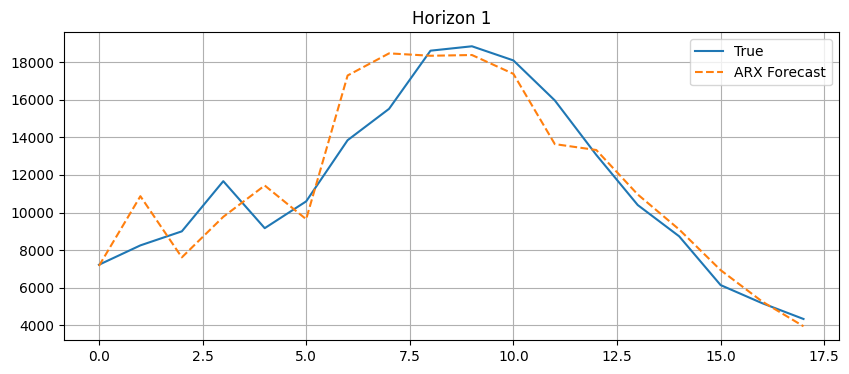

Horizon 2: MSE=0.2818, MAE=0.3349, SMAPE=14.14%


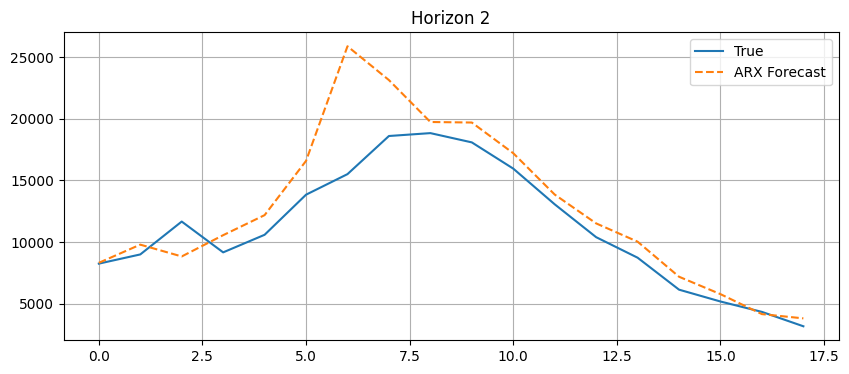

Horizon 3: MSE=0.8393, MAE=0.6068, SMAPE=22.12%


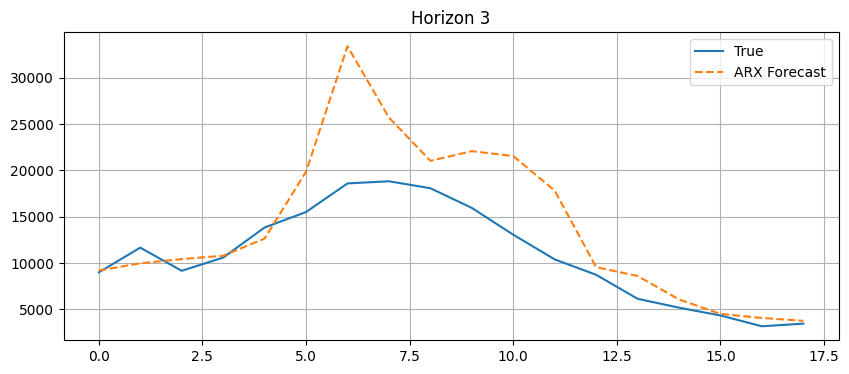

Horizon 4: MSE=2.3746, MAE=1.0568, SMAPE=38.01%


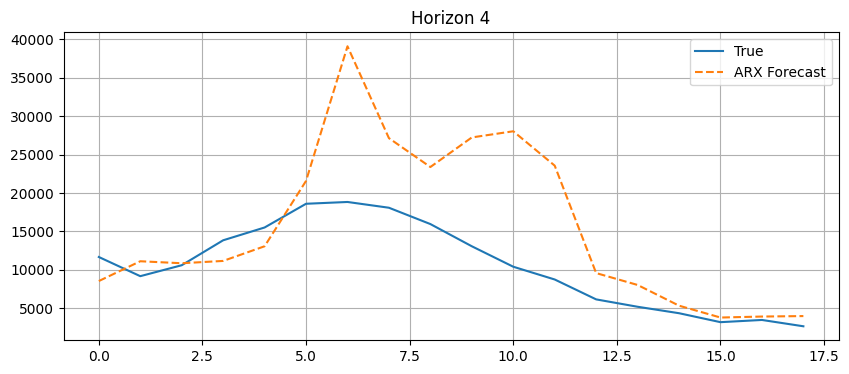

Horizon 5: MSE=5.3061, MAE=1.5614, SMAPE=52.76%


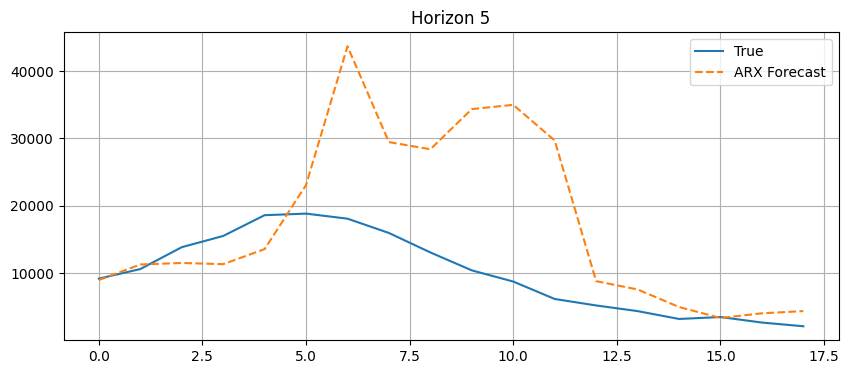

Horizon 6: MSE=9.4134, MAE=2.1216, SMAPE=67.21%


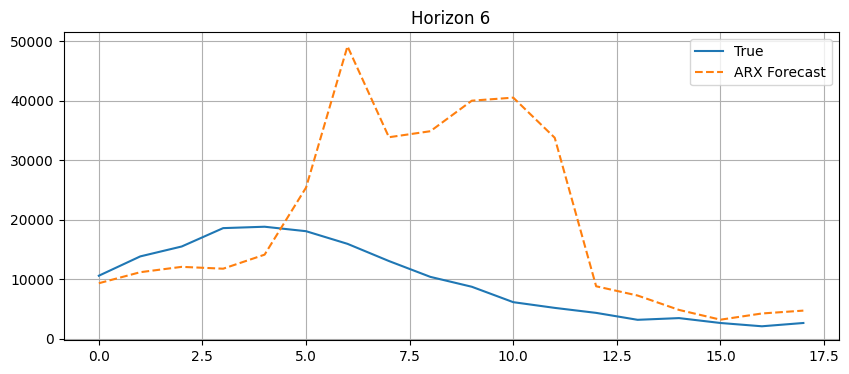

Horizon 1: MSE=0.0822, MAE=0.2161, SMAPE=10.64%
Horizon 2: MSE=0.2818, MAE=0.3349, SMAPE=14.14%
Horizon 3: MSE=0.8393, MAE=0.6068, SMAPE=22.12%
Horizon 4: MSE=2.3746, MAE=1.0568, SMAPE=38.01%
Horizon 5: MSE=5.3061, MAE=1.5614, SMAPE=52.76%
Horizon 6: MSE=9.4134, MAE=2.1216, SMAPE=67.21%


In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.statespace.varmax import VARMAX



p=4
d=0
q=0
P=0
D=0
Q=0
S=0

#     for p in range(1,5):
#         for q in range(1,5)

order = (p,q)
seasonal_order = (P,D,Q,S)


# --- Utility: SMAPE metric ---
def smape(true, pred):
    return 100 * np.mean(2 * np.abs(pred - true) / (np.abs(true) + np.abs(pred)))

# --- Load and preprocess data ---
df = pd.read_csv("./../dataset/rag_data/data/covid_till14May22.csv")  # replace with actual file path
data = df[['new_deaths','icu_patients','hosp_patients','new_tests','people_vaccinated','people_fully_vaccinated','OT']]  # endogenous + exogenous

# data = np.log1p(data)
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)
exog_col_start = 5

endog = data_scaled[:, :exog_col_start]             # ICU patients (target)
exog = data_scaled[:, exog_col_start:]             # Exogenous variables
horizon = 6

# --- Split data ---
split = int(0.8 * len(endog))
train_y, test_y = endog[:split,:], endog[split:,:]
train_x, test_x = exog[:split,:], exog[split:,:]
print(split, 0.8 * len(endog))
print(len(train_y), len(test_y))

# --- Rolling forecast with ARX ---
mse_global, mae_global, smape_global = [], [], []
predictions, truths = [], []

for i in range(len(test_y) - horizon):
#     y_train_i = np.concatenate([train_y, test_y[:i]])
    y_train_i = np.vstack([train_y, test_y[:i,:]])
    x_train_i = np.vstack([train_x, test_x[:i,:]])

    model = VARMAX(y_train_i[horizon:,:], order=order, exog=x_train_i[:-horizon,:]) #AutoReg(endog=y_train_i, lags=6) #, exog=x_train_i)
    model_fit = model.fit()

#     x_forecast = x_train_i #exog[split+i-9:split+i] #test_x[i-92:i] #[i:i + horizon]
    
        # Provide future exogenous variables for forecasting
#     x_oos = test_x[i:i + horizon]
#     pred = model_fit.predict(
#         start=len(y_train_i),
#         end=len(y_train_i) + horizon - 1,
# #         exog_oos=x_oos,
# #         exog=x_forecast
#     )
    pred_var = model_fit.forecast( steps=horizon,exog=x_train_i[-horizon:,:])
    pred = pred_var[:,0]
    
#     pred = model_fit.predict(start=len(y_train_i), end=len(y_train_i) + horizon - 1, exog=x_forecast)
    true = test_y[i:i + horizon,0]

    predictions.append(pred)
    truths.append(true)

predictions = np.array(predictions)
truths = np.array(truths)

# --- Evaluate for each horizon ---
for h in range(horizon):
    trues = truths[:, h].reshape(-1, 1)
    preds = predictions[:, h].reshape(-1, 1)

    mse = mean_squared_error(trues, preds)
    mae = mean_absolute_error(trues, preds)

    # Inverse transform for SMAPE
    trues_full = np.hstack([trues, np.zeros((len(trues), (x_train_i.shape[1]+y_train_i.shape[1])-1))])
    preds_full = np.hstack([preds, np.zeros((len(preds), (x_train_i.shape[1]+y_train_i.shape[1])-1))])
#     trues_inv = np.expm1(scaler.inverse_transform(trues_full))[:, 0]
#     preds_inv = np.expm1(scaler.inverse_transform(preds_full))[:, 0]

    trues_inv = (scaler.inverse_transform(trues_full))[:, 0]
    preds_inv = (scaler.inverse_transform(preds_full))[:, 0]
    
    smape_val = smape(trues_inv, preds_inv)

    mse_global.append(mse)
    mae_global.append(mae)
    smape_global.append(smape_val)

    print(f"Horizon {h+1}: MSE={mse:.4f}, MAE={mae:.4f}, SMAPE={smape_val:.2f}%")

    # Plot
    plt.figure(figsize=(10, 4))
    plt.plot(trues_inv, label="True")
    plt.plot(preds_inv, label="ARX Forecast", linestyle="--")
    plt.title(f"Horizon {h+1}")
    plt.legend()
    plt.grid()
    plt.show()
    
# --- Evaluate for each horizon ---
for h in range(horizon):
    print(f"Horizon {h+1}: MSE={mse_global[h]:.4f}, MAE={mae_global[h]:.4f}, SMAPE={smape_global[h]:.2f}%")

    
    

In [10]:
bb=[3,4,5,9]
bb[:-1]

[3, 4, 5]

#### python arx ridge regression 

In [8]:
import numpy as np
import pandas as pd
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

def SMAPE(pred, true):
    return 200*np.mean(np.abs( pred - true)  / ( np.abs(true) + np.abs(pred) )  )


def create_lagged_matrix(y, X, p, q,h):
    """
    Construct lagged matrices for ARX(p, q) model.
    p: number of lags for endogenous y
    q: number of lags for exogenous X (excluding contemporaneous)
    """
    n_obs = len(y)
    lagged_data = []
    for i in range(max(p, q), n_obs-h):
        row = []
        # Add lags for y
        for lag in range(1, p + 1):
            row.append(y[i - lag])
        # Add lags for X
        for lag in range(1, q + 1):
            row.extend(X[i - lag])
        lagged_data.append(row)
        
    Y_target = []
    for i in range(h):
        Y_target.append(y[max(p, q)+i:n_obs-(h-i) ])
    return np.array(lagged_data), np.array(Y_target).transpose()

# Example data
np.random.seed(42)
n = 200
y = np.random.randn(n)           # Endogenous
X = np.random.randn(n, 2)        # Two exogenous variables

# --- Load and preprocess data ---
df = pd.read_csv("./../dataset/rag_data/data/covid_till14May22.csv")  # replace with actual file path
data = df[['new_deaths','icu_patients','hosp_patients','new_tests','people_vaccinated','people_fully_vaccinated','OT']]  # endogenous + exogenous

# data = np.log1p(data)
scaler = StandardScaler()
dataS = scaler.fit_transform(data)
y= dataS[:,0]
X= dataS[:,1:]

split = int(len(y)*0.8)

# Parameters
p = 3  # lags for y
q = 2  # lags for X
h=6

# Create lagged dataset
X_lagged_train, y_target_train = create_lagged_matrix(y[:split], X[:split], p, q,h)
X_lagged_test, y_target_test = create_lagged_matrix(y[split-max(p,q) :], X[split-max(p,q) :], p, q,h)
# print(y_target_train)

# Fit model
model = Ridge(alpha=35.0)
print("X_lagged_train.shape",X_lagged_train.shape, "y_target_train.shape", y_target_train.shape)
print("X_lagged_test.shape",X_lagged_test.shape, "y_target_test.shape", y_target_test.shape)
model.fit(X_lagged_train, y_target_train)

# Predict
y_pred = model.predict(X_lagged_test)
print("y_pred.shape",y_pred.shape)

# Evaluate
for i in range(h):
    
    # denormalize
    dummy = np.zeros((len(y_pred), dataS.shape[1]))
    dummy[:,0] = y_pred[:,i]
    denorm_y_pred = scaler.inverse_transform(dummy)[:,0]
    
    
        # denormalize
    dummy = np.zeros((len(y_target_test), dataS.shape[1]))
    dummy[:,0] = y_target_test[:,i]
    denorm_y_target_test = scaler.inverse_transform(dummy)[:,0]
    
    smape = SMAPE(denorm_y_target_test,denorm_y_pred)
    mse = mean_squared_error(y_target_test[:,i], y_pred[:,i])
    mae = mean_absolute_error(y_target_test[:,i], y_pred[:,i])
    print(f"MSE: {mse:.4f}, MAE: {mae:.4f}, SMAPE: {smape:.4f}")
# MSE: 0.8548, MAE: 0.7255

X_lagged_train.shape (83, 15) y_target_train.shape (83, 6)
X_lagged_test.shape (18, 15) y_target_test.shape (18, 6)
y_pred.shape (18, 6)
MSE: 0.0450, MAE: 0.1416, SMAPE: 8.3552
MSE: 0.1183, MAE: 0.2764, SMAPE: 14.8589
MSE: 0.3271, MAE: 0.4774, SMAPE: 26.1601
MSE: 0.6634, MAE: 0.6806, SMAPE: 38.8121
MSE: 0.9962, MAE: 0.8132, SMAPE: 46.6241
MSE: 1.3238, MAE: 0.9057, SMAPE: 49.4555


In [23]:
import numpy as np
import pandas as pd
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

def SMAPE(pred, true):
    return 200*np.mean(np.abs( pred - true)  / ( np.abs(true) + np.abs(pred) )  )


def create_lagged_matrix(y, X, p, q,h):
    """
    Construct lagged matrices for ARX(p, q) model.
    p: number of lags for endogenous y
    q: number of lags for exogenous X (excluding contemporaneous)
    """
    n_obs = len(y)
    lagged_data = []
    for i in range(max(p, q), n_obs-h):
        row = []
        # Add lags for y
        for lag in range(1, p + 1):
            row.append(y[i - lag])
        # Add lags for X
        for lag in range(1, q + 1):
            row.extend(X[i - lag])
        lagged_data.append(row)
        
    Y_target = []
    for i in range(h):
        Y_target.append(y[max(p, q)+i:n_obs-(h-i) ])
    return np.array(lagged_data), np.array(Y_target).transpose()

# Example data
np.random.seed(42)
n = 200
y = np.random.randn(n)           # Endogenous
X = np.random.randn(n, 2)        # Two exogenous variables

# --- Load and preprocess data ---
df = pd.read_csv("./../dataset/rag_data/data/covid_till14May22.csv")  # replace with actual file path
data = df[['new_deaths','icu_patients','hosp_patients','new_tests','people_vaccinated','people_fully_vaccinated','OT']]  # endogenous + exogenous

# data = np.log1p(data)
scaler = StandardScaler()
dataS = scaler.fit_transform(data)
y= dataS[:,0]
X= dataS[:,1:]

split = int(len(y)*0.8)
print("split:",split)

X_lagged_test

# Parameters
p = 6  # lags for y
q =0  # lags for X
h=6

# Create lagged dataset
X_lagged_train, y_target_train = create_lagged_matrix(y[:split], X[:split], p, q,h)
X_lagged_test, y_target_test = create_lagged_matrix(y[split-max(p,q) :], X[split-max(p,q) :], p, q,h)
# print(y_target_train)

# Fit model
model = Ridge(alpha=0,solver='lsqr') #alpha=35.0)
print("X_lagged_train.shape",X_lagged_train.shape, "y_target_train.shape", y_target_train.shape)
print("X_lagged_test.shape",X_lagged_test.shape, "y_target_test.shape", y_target_test.shape)
model.fit(X_lagged_train, y_target_train)

# Predict
y_pred = model.predict(X_lagged_test)
print("y_pred.shape",y_pred.shape)

# Evaluate
for i in range(h):
    
    # denormalize
    dummy = np.zeros((len(y_pred), dataS.shape[1]))
    dummy[:,0] = y_pred[:,i]
    denorm_y_pred = scaler.inverse_transform(dummy)[:,0]
    
    
        # denormalize
    dummy = np.zeros((len(y_target_test), dataS.shape[1]))
    dummy[:,0] = y_target_test[:,i]
    denorm_y_target_test = scaler.inverse_transform(dummy)[:,0]
    
    smape = SMAPE(denorm_y_target_test,denorm_y_pred)
    mse = mean_squared_error(y_target_test[:,i], y_pred[:,i])
    mae = mean_absolute_error(y_target_test[:,i], y_pred[:,i])
    print(f"MSE: {mse:.4f}, MAE: {mae:.4f}, SMAPE: {smape:.4f}")
# MSE: 0.8548, MAE: 0.7255

split: 92
X_lagged_train.shape (80, 6) y_target_train.shape (80, 6)
X_lagged_test.shape (18, 6) y_target_test.shape (18, 6)
y_pred.shape (18, 6)
MSE: 0.0890, MAE: 0.2346, SMAPE: 12.7580
MSE: 0.2369, MAE: 0.4046, SMAPE: 21.8546
MSE: 0.4395, MAE: 0.4976, SMAPE: 25.9560
MSE: 0.7275, MAE: 0.6475, SMAPE: 36.5463
MSE: 0.8600, MAE: 0.7497, SMAPE: 44.3208
MSE: 1.0383, MAE: 0.8773, SMAPE: 53.8920


### varx ridge regression

In [19]:
import numpy as np
import pandas as pd
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

def SMAPE(pred, true):
    return 200*np.mean(np.abs( pred - true)  / ( np.abs(true) + np.abs(pred) )  )


def create_lagged_matrix(y, X, p, q,h):
    """
    Construct lagged matrices for ARX(p, q) model.
    p: number of lags for endogenous y
    q: number of lags for exogenous X (excluding contemporaneous)
    """
    n_obs = len(y)
    lagged_data = []
    for i in range(max(p, q), n_obs-h):
        row = []
        # Add lags for y
        for lag in range(1, p + 1):
            row.append(y[i - lag])
        # Add lags for X
        for lag in range(1, q + 1):
            row.extend(X[i - lag])
        lagged_data.append(row)
        
    Y_target = []
    for i in range(h):
        Y_target.append(y[max(p, q)+i:n_obs-(h-i) ])
    ## for each exogenous
    for j in range(3): #X.shape[1]):
        for i in range(h):
            Y_target.append(X[max(p, q)+i:n_obs-(h-i),j ])
        
    return np.array(lagged_data), np.array(Y_target).transpose()

# Example data
np.random.seed(42)
n = 200
y = np.random.randn(n)           # Endogenous
X = np.random.randn(n, 2)        # Two exogenous variables

# --- Load and preprocess data ---
df = pd.read_csv("./../dataset/rag_data/data/covid_till14May22.csv")  # replace with actual file path
data = df[['new_deaths','icu_patients','hosp_patients','new_tests','people_vaccinated','people_fully_vaccinated','OT']]  # endogenous + exogenous

# data = np.log1p(data)
scaler = StandardScaler()
dataS = scaler.fit_transform(data)
y= dataS[:,0]
X= dataS[:,1:]

split = int(len(y)*0.8)

# Parameters
p = 3  # lags for y
q = 2  # lags for X
h=6

# Create lagged dataset
X_lagged_train, y_target_train = create_lagged_matrix(y[:split], X[:split], p, q,h)
X_lagged_test, y_target_test = create_lagged_matrix(y[split-max(p,q) :], X[split-max(p,q) :], p, q,h)
# print(y_target_train)

# Fit model
model = Ridge(alpha=35.0)
print("X_lagged_train.shape",X_lagged_train.shape, "y_target_train.shape", y_target_train.shape)
print("X_lagged_test.shape",X_lagged_test.shape, "y_target_test.shape", y_target_test.shape)
model.fit(X_lagged_train, y_target_train)

# Predict
y_pred = model.predict(X_lagged_test)
print("y_pred.shape",y_pred.shape)

# Evaluate
for i in range(h):
    
    # denormalize
    dummy = np.zeros((len(y_pred), dataS.shape[1]))
    dummy[:,0] = y_pred[:,i]
    denorm_y_pred = scaler.inverse_transform(dummy)[:,0]
    
    
        # denormalize
    dummy = np.zeros((len(y_target_test), dataS.shape[1]))
    dummy[:,0] = y_target_test[:,i]
    denorm_y_target_test = scaler.inverse_transform(dummy)[:,0]
    
    smape = SMAPE(denorm_y_target_test,denorm_y_pred)
    mse = mean_squared_error(y_target_test[:,i], y_pred[:,i])
    mae = mean_absolute_error(y_target_test[:,i], y_pred[:,i])
    print(f"MSE: {mse:.4f}, MAE: {mae:.4f}, SMAPE: {smape:.4f}")
# MSE: 0.8548, MAE: 0.7255

X_lagged_train.shape (83, 15) y_target_train.shape (83, 24)
X_lagged_test.shape (18, 15) y_target_test.shape (18, 24)
y_pred.shape (18, 24)
MSE: 0.0450, MAE: 0.1416, SMAPE: 8.3552
MSE: 0.1183, MAE: 0.2764, SMAPE: 14.8589
MSE: 0.3271, MAE: 0.4774, SMAPE: 26.1601
MSE: 0.6634, MAE: 0.6806, SMAPE: 38.8121
MSE: 0.9962, MAE: 0.8132, SMAPE: 46.6241
MSE: 1.3238, MAE: 0.9057, SMAPE: 49.4555


In [1]:
import numpy as np
import pandas as pd
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

def SMAPE(pred, true):
    return 200 * np.mean(np.abs(pred - true) / (np.abs(true) + np.abs(pred)))

def create_lagged_matrix_VARX(Y, X, p, q, h):
    """
    Construct lagged matrices for VARX(p, q) model.
    Y: endogenous variables (n_samples, n_endog)
    X: exogenous variables (n_samples, n_exog)
    p: lags for Y
    q: lags for X
    h: horizon
    """
    n_obs = len(Y)
    lagged_data = []
    Y_target = []

    for i in range(max(p, q), n_obs - h):
        row = []
        # Add lags for each endogenous variable
        for lag in range(1, p + 1):
            row.extend(Y[i - lag])
        # Add lags for each exogenous variable
        for lag in range(1, q + 1):
            row.extend(X[i - lag])
        lagged_data.append(row)

        target_row = []
        for i_h in range(h):
            target_row.extend(Y[i + i_h])
        Y_target.append(target_row)

    return np.array(lagged_data), np.array(Y_target)

# --- Load and preprocess data ---
df = pd.read_csv("./../dataset/rag_data/data/covid_till14May22.csv")
data = df[['new_deaths', 'icu_patients', 'hosp_patients', 'new_tests', 'people_vaccinated', 'people_fully_vaccinated', 'OT']]
scaler = StandardScaler()
dataS = scaler.fit_transform(data)

Y = dataS[:, :3]  # multivariate endogenous: first 3 columns (e.g., deaths, icu, hosp)
X = dataS[:, 3:]  # exogenous: rest

# Parameters
p = 3
q = 2
h = 6
split = int(len(Y) * 0.8)

X_lagged_train, y_target_train = create_lagged_matrix_VARX(Y[:split], X[:split], p, q, h)
X_lagged_test, y_target_test = create_lagged_matrix_VARX(Y[split - max(p, q):], X[split - max(p, q):], p, q, h)

model = Ridge(alpha=35.0)
model.fit(X_lagged_train, y_target_train)
y_pred = model.predict(X_lagged_test)

# Evaluate
n_endog = Y.shape[1]
for i in range(h):
    for j in range(n_endog):
        idx = i * n_endog + j

        # Denormalize
        dummy_pred = np.zeros((len(y_pred), dataS.shape[1]))
        dummy_true = np.zeros((len(y_pred), dataS.shape[1]))
        dummy_pred[:, j] = y_pred[:, idx]
        dummy_true[:, j] = y_target_test[:, idx]

        denorm_pred = scaler.inverse_transform(dummy_pred)[:, j]
        denorm_true = scaler.inverse_transform(dummy_true)[:, j]

        smape = SMAPE(denorm_true, denorm_pred)
        mse = mean_squared_error(y_target_test[:, idx], y_pred[:, idx])
        mae = mean_absolute_error(y_target_test[:, idx], y_pred[:, idx])
        print(f"Horizon {i+1}, Var {j+1} — MSE: {mse:.4f}, MAE: {mae:.4f}, SMAPE: {smape:.4f}")


Horizon 1, Var 1 — MSE: 0.0468, MAE: 0.1515, SMAPE: 8.8599
Horizon 1, Var 2 — MSE: 0.5814, MAE: 0.5841, SMAPE: 37.3363
Horizon 1, Var 3 — MSE: 0.1790, MAE: 0.3296, SMAPE: 20.0248
Horizon 2, Var 1 — MSE: 0.1248, MAE: 0.2841, SMAPE: 15.1340
Horizon 2, Var 2 — MSE: 0.9626, MAE: 0.7488, SMAPE: 49.5668
Horizon 2, Var 3 — MSE: 0.5766, MAE: 0.6057, SMAPE: 34.6787
Horizon 3, Var 1 — MSE: 0.3350, MAE: 0.4833, SMAPE: 26.1546
Horizon 3, Var 2 — MSE: 1.3905, MAE: 0.9130, SMAPE: 62.1828
Horizon 3, Var 3 — MSE: 1.1007, MAE: 0.8362, SMAPE: 48.1275
Horizon 4, Var 1 — MSE: 0.6695, MAE: 0.6821, SMAPE: 38.2780
Horizon 4, Var 2 — MSE: 1.7473, MAE: 1.0476, SMAPE: 74.0720
Horizon 4, Var 3 — MSE: 1.5968, MAE: 1.0156, SMAPE: 59.8422
Horizon 5, Var 1 — MSE: 0.9984, MAE: 0.8098, SMAPE: 45.6277
Horizon 5, Var 2 — MSE: 1.9725, MAE: 1.1318, SMAPE: 84.1466
Horizon 5, Var 3 — MSE: 1.9646, MAE: 1.1534, SMAPE: 70.0328
Horizon 6, Var 1 — MSE: 1.3231, MAE: 0.9010, SMAPE: 48.4971
Horizon 6, Var 2 — MSE: 2.0381, MAE: 1.19

In [11]:
y_pred[:,i]

array([-0.60751365, -0.12680424, -0.05867032,  0.08511751,  0.64070547,
        2.79972751,  6.69290359,  9.4153033 ,  9.29511045,  6.93930717,
        3.77503729,  0.99992703, -0.57202997, -1.36415194, -1.42201724,
       -1.54011484, -1.40902789, -1.36271475])

In [10]:
y_target_test[:,i]

array([ 0.35910575,  0.93974189,  1.23738492,  1.78925724,  1.83106305,
        1.69689143,  1.31706606,  0.80038922,  0.32444623,  0.02751784,
       -0.43538316, -0.60689415, -0.75714492, -0.9654593 , -0.91400601,
       -1.06104094, -1.15965976, -1.06086229])

In [4]:
print(y)

[-1.53341078 -1.53090958 -1.52608583 -1.49357021 -1.29472466 -0.50577413
  0.79324293  1.2897315   1.16985247  0.92920111  0.79842399  0.29568241
 -0.05127002 -0.18133252 -0.4327033  -0.54900919 -0.74124442 -0.43842034
 -0.75696626 -0.57330658 -0.36356294 -0.18955075 -0.09343314 -0.13095116
 -0.1625735  -0.33354851 -0.40536874 -0.49094557 -0.63708723 -0.59813994
 -0.67585586 -0.71926957 -0.68854052 -0.6915777  -0.51810148 -0.44252945
 -0.30942978  0.02180081  0.27656608  0.65514085  0.94367235  1.52484447
  1.87965782  1.86893839  1.83195633  2.18873491  2.68968992  2.43260209
  2.51514176  2.0336604   1.71368522  1.53413465  0.91687376  0.34016807
  0.07289679 -0.34069481 -0.43538316 -0.54168424 -0.66156327 -0.65245175
 -0.69515084 -0.72570124 -0.7383859  -0.80502507 -0.87684529 -0.91186212
 -1.03477832 -1.03209846 -1.19539122 -1.18324252 -1.20753991 -1.2661395
 -1.19824973 -1.1691286  -1.03049055 -0.79394832 -0.59045768 -0.1588217
  0.23547491  0.53401122  0.56849207  0.88596605  0.8

In [3]:
print(X)

[[-1.27868405 -1.17498997 -2.07694326 -1.06298677 -1.01652246 -0.77549979]
 [-1.27868405 -1.17498997 -2.07507983 -1.06298677 -1.01652246 -0.77524505]
 [-1.27868405 -1.17498997 -2.06445715 -1.06298677 -1.01652246 -0.77264031]
 [-1.27868405 -1.17498997 -1.98337543 -1.06298677 -1.01652246 -0.75249495]
 [-1.27868405 -1.17498997 -1.87070708 -1.06298677 -1.01652246 -0.68499012]
 [-1.27868405 -1.17498997 -1.80340207 -1.06298677 -1.01652246 -0.59420036]
 [-1.27868405 -1.17498997 -1.75489882 -1.06298677 -1.01652246 -0.53507877]
 [-1.27868405 -1.17498997 -1.77544488 -1.06298677 -1.01652246 -0.55607216]
 [-1.27868405 -1.17498997 -1.679415   -1.06298677 -1.01652246 -0.55420848]
 [-1.27868405 -1.17498997 -1.56398338 -1.06298677 -1.01652246 -0.55483816]
 [-1.27868405 -1.17498997 -1.46910081 -1.06298677 -1.01652246 -0.56987661]
 [-1.27868405 -1.17498997 -1.34325384 -1.06298677 -1.01652246 -0.58670264]
 [-1.27868405 -1.17498997 -1.29067013 -1.06298677 -1.01652246 -0.59138609]
 [-1.27868405 -1.17498997

In [ ]:
import numpy as np
import pandas as pd
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, mean_absolute_error

def create_lagged_matrix(y, X, p, q):
    """
    Construct lagged matrices for ARX(p, q) model.
    p: number of lags for endogenous y
    q: number of lags for exogenous X (excluding contemporaneous)
    """
    n_obs = len(y)
    lagged_data = []
    for i in range(max(p, q), n_obs):
        row = []
        # Add lags for y
        for lag in range(1, p + 1):
            row.append(y[i - lag])
        # Add lags for X
        for lag in range(1, q + 1):
            row.extend(X[i - lag])
        lagged_data.append(row)
    Y_target = y[max(p, q):]
    return np.array(lagged_data), Y_target

# Example data
np.random.seed(42)
n = 200
y = np.random.randn(n)           # Endogenous
X = np.random.randn(n, 2)        # Two exogenous variables

# Parameters
p = 3  # lags for y
q = 2  # lags for X

# Create lagged dataset
X_lagged, y_target = create_lagged_matrix(y, X, p, q)

# Fit model
model = Ridge(alpha=1.0)
model.fit(X_lagged, y_target)

# Predict
y_pred = model.predict(X_lagged[-5:,:])

# Evaluate
mse = mean_squared_error(y_target[-5:], y_pred)
mae = mean_absolute_error(y_target[-5:], y_pred)

print(f"MSE: {mse:.4f}, MAE: {mae:.4f}")
# MSE: 0.8548, MAE: 0.7255

In [2]:
print(y) #endogenous 

[ 0.49671415 -0.1382643   0.64768854  1.52302986 -0.23415337 -0.23413696
  1.57921282  0.76743473 -0.46947439  0.54256004 -0.46341769 -0.46572975
  0.24196227 -1.91328024 -1.72491783 -0.56228753 -1.01283112  0.31424733
 -0.90802408 -1.4123037   1.46564877 -0.2257763   0.0675282  -1.42474819
 -0.54438272  0.11092259 -1.15099358  0.37569802 -0.60063869 -0.29169375
 -0.60170661  1.85227818 -0.01349722 -1.05771093  0.82254491 -1.22084365
  0.2088636  -1.95967012 -1.32818605  0.19686124  0.73846658  0.17136828
 -0.11564828 -0.3011037  -1.47852199 -0.71984421 -0.46063877  1.05712223
  0.34361829 -1.76304016  0.32408397 -0.38508228 -0.676922    0.61167629
  1.03099952  0.93128012 -0.83921752 -0.30921238  0.33126343  0.97554513
 -0.47917424 -0.18565898 -1.10633497 -1.19620662  0.81252582  1.35624003
 -0.07201012  1.0035329   0.36163603 -0.64511975  0.36139561  1.53803657
 -0.03582604  1.56464366 -2.6197451   0.8219025   0.08704707 -0.29900735
  0.09176078 -1.98756891 -0.21967189  0.35711257  1

In [3]:
print(X) #exogenous

[[ 0.35778736  0.56078453]
 [ 1.08305124  1.05380205]
 [-1.37766937 -0.93782504]
 [ 0.51503527  0.51378595]
 [ 0.51504769  3.85273149]
 [ 0.57089051  1.13556564]
 [ 0.95400176  0.65139125]
 [-0.31526924  0.75896922]
 [-0.77282521 -0.23681861]
 [-0.48536355  0.08187414]
 [ 2.31465857 -1.86726519]
 [ 0.68626019 -1.61271587]
 [-0.47193187  1.0889506 ]
 [ 0.06428002 -1.07774478]
 [-0.71530371  0.67959775]
 [-0.73036663  0.21645859]
 [ 0.04557184 -0.65160035]
 [ 2.14394409  0.63391902]
 [-2.02514259  0.18645431]
 [-0.66178646  0.85243333]
 [-0.79252074 -0.11473644]
 [ 0.50498728  0.86575519]
 [-1.20029641 -0.33450124]
 [-0.47494531 -0.65332923]
 [ 1.76545424  0.40498171]
 [-1.26088395  0.91786195]
 [ 2.1221562   1.03246526]
 [-1.51936997 -0.48423407]
 [ 1.26691115 -0.70766947]
 [ 0.44381943  0.77463405]
 [-0.92693047 -0.05952536]
 [-3.24126734 -1.02438764]
 [-0.25256815 -1.24778318]
 [ 1.6324113  -1.43014138]
 [-0.44004449  0.13074058]
 [ 1.44127329 -1.43586215]
 [ 1.16316375  0.01023306]
 

In [6]:
X_lagged[0]

array([ 0.64768854, -0.1382643 ,  0.49671415, -1.37766937, -0.93782504,
        1.08305124,  1.05380205])

In [5]:
y_target

array([ 1.52302986, -0.23415337, -0.23413696,  1.57921282,  0.76743473,
       -0.46947439,  0.54256004, -0.46341769, -0.46572975,  0.24196227,
       -1.91328024, -1.72491783, -0.56228753, -1.01283112,  0.31424733,
       -0.90802408, -1.4123037 ,  1.46564877, -0.2257763 ,  0.0675282 ,
       -1.42474819, -0.54438272,  0.11092259, -1.15099358,  0.37569802,
       -0.60063869, -0.29169375, -0.60170661,  1.85227818, -0.01349722,
       -1.05771093,  0.82254491, -1.22084365,  0.2088636 , -1.95967012,
       -1.32818605,  0.19686124,  0.73846658,  0.17136828, -0.11564828,
       -0.3011037 , -1.47852199, -0.71984421, -0.46063877,  1.05712223,
        0.34361829, -1.76304016,  0.32408397, -0.38508228, -0.676922  ,
        0.61167629,  1.03099952,  0.93128012, -0.83921752, -0.30921238,
        0.33126343,  0.97554513, -0.47917424, -0.18565898, -1.10633497,
       -1.19620662,  0.81252582,  1.35624003, -0.07201012,  1.0035329 ,
        0.36163603, -0.64511975,  0.36139561,  1.53803657, -0.03

### ar(6) through SARIMA

/home/fs47816/.local/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


split: 92 len(train_y): 92 len(test_y): 24 len(endog): 116
i: 0 nobs: 92
i: 1 nobs: 92
i: 2 nobs: 92
i: 3 nobs: 92
i: 4 nobs: 92
i: 5 nobs: 92
i: 6 nobs: 92
i: 7 nobs: 92
i: 8 nobs: 92
i: 9 nobs: 92
i: 10 nobs: 92
i: 11 nobs: 92
i: 12 nobs: 92
i: 13 nobs: 92
i: 14 nobs: 92
i: 15 nobs: 92
i: 16 nobs: 92
i: 17 nobs: 92
i: 18 nobs: 92
Horizon 1: MSE=0.0944, MAE=0.2382, SMAPE=13.44%


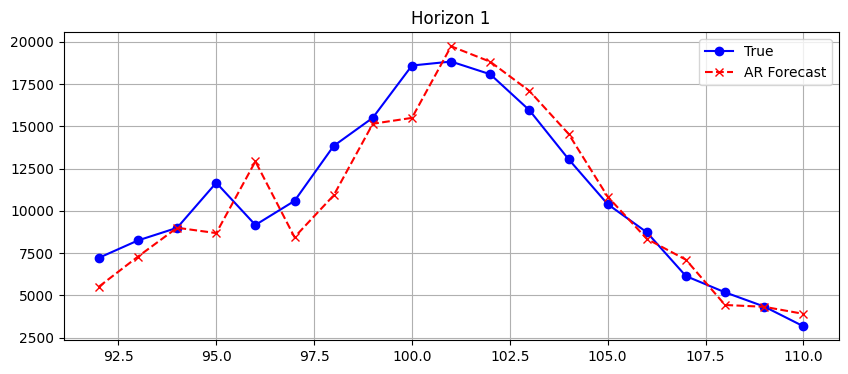

Horizon 2: MSE=0.2193, MAE=0.3786, SMAPE=20.21%


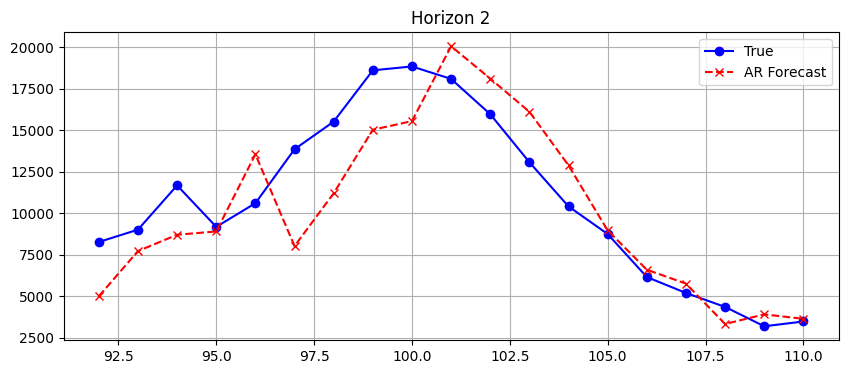

Horizon 3: MSE=0.3913, MAE=0.4665, SMAPE=24.47%


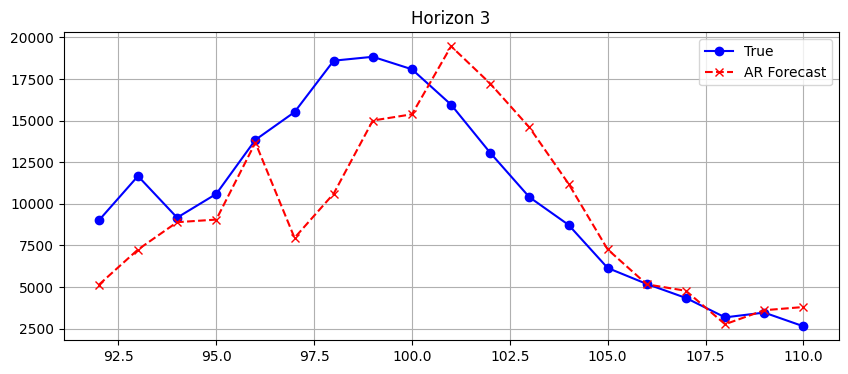

Horizon 4: MSE=0.6404, MAE=0.6125, SMAPE=36.13%


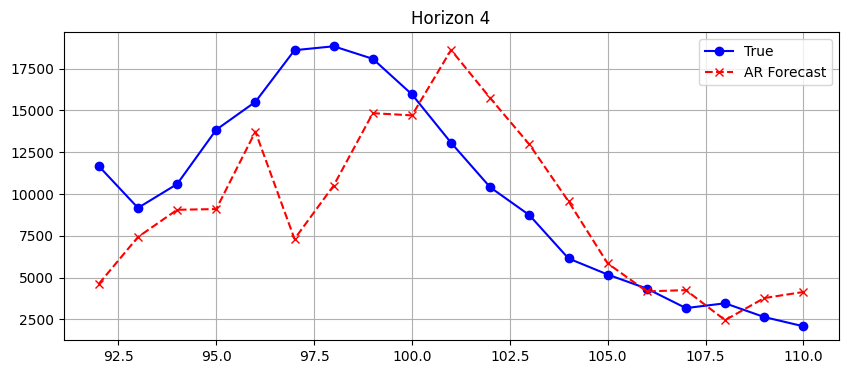

Horizon 5: MSE=0.7435, MAE=0.6757, SMAPE=39.67%


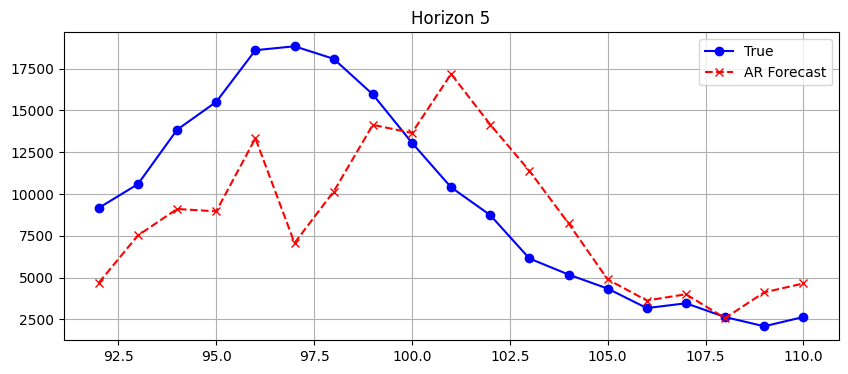

Horizon 6: MSE=0.9061, MAE=0.7758, SMAPE=49.26%


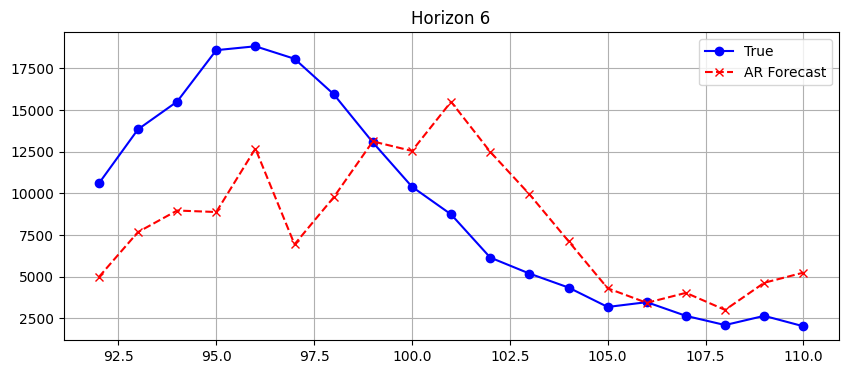

Horizon 1: MSE=0.0944, MAE=0.2382, SMAPE=13.4375%
Horizon 2: MSE=0.2193, MAE=0.3786, SMAPE=20.2108%
Horizon 3: MSE=0.3913, MAE=0.4665, SMAPE=24.4703%
Horizon 4: MSE=0.6404, MAE=0.6125, SMAPE=36.1323%
Horizon 5: MSE=0.7435, MAE=0.6757, SMAPE=39.6714%
Horizon 6: MSE=0.9061, MAE=0.7758, SMAPE=49.2602%


In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.statespace.sarimax import SARIMAX


p=6
d=0
q=0
P=0
D=0
Q=0
S=0
order = (p,d,q)
seasonal_order = (P,D,Q,S)


# --- Utility: SMAPE metric ---
def smape(true, pred):
    return 100 * np.mean(2 * np.abs(pred - true) / (np.abs(true) + np.abs(pred)))

# --- Load and preprocess data ---
df = pd.read_csv("./../dataset/rag_data/data/covid_till14May22.csv")  # replace with actual file path
data = df[['new_deaths','icu_patients']]  # endogenous + exogenous

# --- Split data ---
split = int(0.8 * len(data)) # + 5

# --- Standardize data ---
# data = np.log1p(data)
scaler = StandardScaler()
scaler.fit(np.array(data)[:split,:])
data_scaled = scaler.transform(data) # np.array(data) #scaler.transform(data)

endog = data_scaled[:, 0]             # ICU patients (target)
exog = data_scaled[:, 1:]             # Exogenous variables
horizon = 6 #1


# print("split:",split, " len(endog):", len(endog), "len(endog) -split: ",len(endog) -split)

train_y, test_y = endog[:split], endog[split:]
train_x, test_x = exog[:split], exog[split:]
print("split:",split, "len(train_y):", len(train_y), "len(test_y):",len(test_y), "len(endog):",len(endog))


# --- Rolling forecast with ARX ---
mse_global, mae_global, smape_global = [], [], []
predictions, truths = [], []

for i in range(len(test_y) - horizon + 1):
    y_train_i = np.concatenate([train_y, test_y[:i]])
#     x_train_i = np.vstack([train_x, test_x[:i]])

    if i == 0:
        model = SARIMAX(y_train_i, order=order, seasonal_order=seasonal_order, trend='c') #AutoReg(endog=y_train_i, lags=6) #, exog=x_train_i)
        model_fit = model.fit(disp=False)
    else:
        updated_model = model_fit.apply(y_train_i)

        
    print("i:",i,"nobs:",model_fit.nobs)
    

    if i == 0:    pred = model_fit.forecast( steps=horizon) 
    else:    pred = updated_model.forecast( steps=horizon)

    true = test_y[i:i + horizon]

    predictions.append(pred)
    truths.append(true)

predictions = np.array(predictions)
truths = np.array(truths)

# --- Evaluate for each horizon ---
for h in range(horizon):
    trues = truths[:, h].reshape(-1, 1)
    preds = predictions[:, h].reshape(-1, 1)

    mse = mean_squared_error(trues, preds)
    mae = mean_absolute_error(trues, preds)

    # Inverse transform for SMAPE
    trues_full = np.hstack([trues, np.zeros((len(trues), 1))])
    preds_full = np.hstack([preds, np.zeros((len(preds), 1))])
#     trues_inv = np.expm1(scaler.inverse_transform(trues_full))[:, 0]
#     preds_inv = np.expm1(scaler.inverse_transform(preds_full))[:, 0]

    trues_inv = (scaler.inverse_transform(trues_full))[:, 0]
    preds_inv = (scaler.inverse_transform(preds_full))[:, 0]
    
    smape_val = smape(trues_inv, preds_inv)

    mse_global.append(mse)
    mae_global.append(mae)
    smape_global.append(smape_val)

    print(f"Horizon {h+1}: MSE={mse:.4f}, MAE={mae:.4f}, SMAPE={smape_val:.2f}%")

    # Plot
    plt.figure(figsize=(10, 4))
    
    
#         plt.plot(range(split_idx, len(time_series)-horizon), trues, label='True Values', color='blue', marker='o', linestyle='-')
#         plt.plot(range(split_idx, len(time_series)-horizon), preds, label='Random Walk Forecast', color='red', linestyle='--', marker='x')
        
    plt.plot(split + np.array(range(len(trues_inv))),trues_inv,  color='blue', marker='o', linestyle='-', label="True")
    plt.plot(split + np.array(range(len(trues_inv))),preds_inv, label="AR Forecast", color='red', linestyle='--', marker='x')
    plt.title(f"Horizon {h+1}")
    plt.legend()
    plt.grid()
    plt.show()
    
# --- Evaluate for each horizon ---
for h in range(horizon):
    print(f"Horizon {h+1}: MSE={mse_global[h]:.4f}, MAE={mae_global[h]:.4f}, SMAPE={smape_global[h]:.4f}%")

    
    

### arx ridge regression

In [75]:
import numpy as np
import pandas as pd
from sklearn.linear_model import Ridge
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

def SMAPE(pred, true):
    return 200*np.mean(np.abs( pred - true)  / ( np.abs(true) + np.abs(pred) )  )


def create_lagged_matrix(y, X, p, q,h):
    """
    Construct lagged matrices for ARX(p, q) model.
    p: number of lags for endogenous y
    q: number of lags for exogenous X (excluding contemporaneous)
    """
    n_obs = len(y)
    lagged_data = []
    for i in range(max(p, q), n_obs-h+1):
        row = []
        # Add lags for y
        for lag in range(1, p + 1):
            row.append(y[i - lag])
        # Add lags for X
        for lag in range(1, q + 1):
            row.extend(X[i - lag])
        lagged_data.append(row)
        
    Y_target = []
    for i in range(h):
        Y_target.append(y[max(p, q)+i:n_obs-(h-i) +1])
    return np.array(lagged_data), np.array(Y_target).transpose()

# Example data
np.random.seed(42)
n = 200
y = np.random.randn(n)           # Endogenous
X = np.random.randn(n, 2)        # Two exogenous variables

# --- Load and preprocess data ---
df = pd.read_csv("./../dataset/rag_data/data/covid_19_weekly_2.csv")  # replace with actual file path
vnames = ['new_deaths','new_cases','reproduction_rate','icu_patients','hosp_patients','new_tests','positive_rate','tests_per_case','people_vaccinated','people_fully_vaccinated','total_boosters','new_vaccinations']
data = df[vnames]  # endogenous + exogenous

split = int(len(data)*0.8)

# data = np.log1p(data)


# split = int(len(y)*0.8)
print("split:",split)

# X_lagged_test

# Parameters
p = 6  # lags for y
q = 0  # lags for X
h=6

for p_ in range(p,int(p/2)-1,-1):
    for q_ in range(1,int(p/2)+1):
        for vname in vnames[1:]:
            
            data = df[ [vnames[0],vname] ]  
            print(f"\n p:{p_}, q:{q_}, variables: {data.columns} ")
            
            
            scaler = StandardScaler()
            scaler.fit(np.array(data)[:split,:])
            dataS = np.array(data) #scaler.transform(data)
            y= dataS[:,0]
            XX= dataS[:,1:]        

            
            
            # Create lagged dataset
            X_lagged_train, y_target_train = create_lagged_matrix(y[:split], XX[:split], p_, q_,h)
            X_lagged_test, y_target_test = create_lagged_matrix(y[split-max(p_,q_) :], XX[split-max(p_,q_) :], p_, q_, h)

            
            
            # Fit model
            model = Ridge(alpha=7.0) #alpha=35.0)

#             print("X_lagged_train.shape",X_lagged_train.shape, "y_target_train.shape", y_target_train.shape)
#             print("X_lagged_test.shape",X_lagged_test.shape, "y_target_test.shape", y_target_test.shape)
           
#             print("y_target_test[:4,:]:",y_target_test[:])
        
            model.fit(X_lagged_train, y_target_train)

            # Predict
            y_pred = model.predict(X_lagged_test)
#             print(f"X:{X_lagged_test[3,:]}  y:{y_target_test[3,1]} y_pred:{y_pred[3,1]}",) #19,6

            smape_list = []; mse_list=[]; mae_list=[]

            # Evaluate
            for i in range(h):
#                 print("i:",i,"y_pred",y_pred[:4])

                # denormalize
                dummy = np.zeros((len(y_pred), dataS.shape[1]))
                dummy[:,0] = y_pred[:,i]
                denorm_y_pred = scaler.inverse_transform(dummy)[:,0]


                # denormalize
                dummy = np.zeros((len(y_target_test), dataS.shape[1]))
                dummy[:,0] = y_target_test[:,i]
                denorm_y_target_test = scaler.inverse_transform(dummy)[:,0]

                
                smape = SMAPE(denorm_y_target_test,denorm_y_pred)
                mse = mean_squared_error(y_target_test[:,i], y_pred[:,i])
                mae = mean_absolute_error(y_target_test[:,i], y_pred[:,i])
                
#                 print(f"MSE: {mse:.4f}, MAE: {mae:.4f}, SMAPE: {smape:.4f}")

                smape_list.append(smape); mse_list.append(mse); mae_list.append(mae); 

            print(f"avg MSE: {np.mean(mse_list):.4f}, MAE: {np.mean(mae_list):.4f}, SMAPE: {np.mean(smape_list):.4f}")


            #     plt.figure(figsize=(10, 4))
            #     plt.plot(split + np.array(range(len(denorm_y_target_test))),denorm_y_target_test,  color='blue', marker='o', linestyle='-', label="True")
            #     plt.plot(split + np.array(range(len(denorm_y_target_test))),denorm_y_pred , label="AR Forecast", color='red', linestyle='--', marker='x')
            #     plt.title(f"Horizon {i+1}")
            #     plt.legend()
            #     plt.grid()
            #     plt.show()

            # MSE: 0.8548, MAE: 0.7255

split: 92

 p:6, q:1, variables: Index(['new_deaths', 'new_cases'], dtype='object') 
avg MSE: 203076341.6954, MAE: 7776.2923, SMAPE: 38.6123

 p:6, q:1, variables: Index(['new_deaths', 'reproduction_rate'], dtype='object') 
avg MSE: 4721744.0330, MAE: 1632.0882, SMAPE: 20.3631

 p:6, q:1, variables: Index(['new_deaths', 'icu_patients'], dtype='object') 
avg MSE: 13095462.3310, MAE: 2628.5918, SMAPE: 26.3931

 p:6, q:1, variables: Index(['new_deaths', 'hosp_patients'], dtype='object') 
avg MSE: 15653272.4656, MAE: 2860.5798, SMAPE: 27.4631

 p:6, q:1, variables: Index(['new_deaths', 'new_tests'], dtype='object') 
avg MSE: 10826366.8227, MAE: 2401.0396, SMAPE: 24.2289

 p:6, q:1, variables: Index(['new_deaths', 'positive_rate'], dtype='object') 
avg MSE: 16238088.5492, MAE: 3026.6379, SMAPE: 32.5359

 p:6, q:1, variables: Index(['new_deaths', 'tests_per_case'], dtype='object') 
avg MSE: 13741836.3718, MAE: 2759.6061, SMAPE: 31.5897

 p:6, q:1, variables: Index(['new_deaths', 'people_vacc

avg MSE: 8247157.0624, MAE: 1914.8826, SMAPE: 19.3137

 p:4, q:3, variables: Index(['new_deaths', 'new_tests'], dtype='object') 
avg MSE: 8463365.6262, MAE: 1920.4524, SMAPE: 22.6620

 p:4, q:3, variables: Index(['new_deaths', 'positive_rate'], dtype='object') 
avg MSE: 11748642.1343, MAE: 2589.0888, SMAPE: 28.5375

 p:4, q:3, variables: Index(['new_deaths', 'tests_per_case'], dtype='object') 
avg MSE: 13336498.6718, MAE: 2956.5257, SMAPE: 44.7189

 p:4, q:3, variables: Index(['new_deaths', 'people_vaccinated'], dtype='object') 
avg MSE: 17290856.9924, MAE: 3103.8671, SMAPE: 34.9554

 p:4, q:3, variables: Index(['new_deaths', 'people_fully_vaccinated'], dtype='object') 
avg MSE: 16316525.5879, MAE: 3223.6021, SMAPE: 36.3950

 p:4, q:3, variables: Index(['new_deaths', 'total_boosters'], dtype='object') 
avg MSE: 5457958462.9922, MAE: 61277.9734, SMAPE: 181.0514

 p:4, q:3, variables: Index(['new_deaths', 'new_vaccinations'], dtype='object') 
avg MSE: 20021719.2809, MAE: 3194.7790, SMAPE

#### top 2 pairs

split: 92

 p:6, q:1, variables: Index(['new_deaths', 'new_cases', 'reproduction_rate'], dtype='object') 
avg MSE: 171940988.2675, MAE: 7231.3406, SMAPE: 41.0572

 p:6, q:1, variables: Index(['new_deaths', 'new_cases', 'icu_patients'], dtype='object') 
avg MSE: 694214012.4408, MAE: 13987.3805, SMAPE: 51.7014

 p:6, q:1, variables: Index(['new_deaths', 'new_cases', 'hosp_patients'], dtype='object') 
avg MSE: 753607693.3305, MAE: 14207.2837, SMAPE: 48.9482

 p:6, q:1, variables: Index(['new_deaths', 'new_cases', 'new_tests'], dtype='object') 
avg MSE: 552178753.7848, MAE: 12775.0996, SMAPE: 49.1992

 p:6, q:1, variables: Index(['new_deaths', 'new_cases', 'positive_rate'], dtype='object') 
avg MSE: 240327864.3329, MAE: 8483.2487, SMAPE: 39.7405

 p:6, q:1, variables: Index(['new_deaths', 'new_cases', 'tests_per_case'], dtype='object') 
avg MSE: 198987654.7288, MAE: 7808.7760, SMAPE: 45.6123

 p:6, q:1, variables: Index(['new_deaths', 'new_cases', 'people_vaccinated'], dtype='object') 
avg

/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=3.15575e-18): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=4.12798e-18): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=2.96334e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=3.85074e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T



 p:6, q:1, variables: Index(['new_deaths', 'hosp_patients', 'new_tests'], dtype='object') 
avg MSE: 12960116.3497, MAE: 2636.2817, SMAPE: 25.6037

 p:6, q:1, variables: Index(['new_deaths', 'hosp_patients', 'positive_rate'], dtype='object') 
avg MSE: 17352470.0394, MAE: 2914.4397, SMAPE: 26.3178

 p:6, q:1, variables: Index(['new_deaths', 'hosp_patients', 'tests_per_case'], dtype='object') 
avg MSE: 14780917.3904, MAE: 2893.1144, SMAPE: 39.3859

 p:6, q:1, variables: Index(['new_deaths', 'hosp_patients', 'people_vaccinated'], dtype='object') 
avg MSE: 19770697.7847, MAE: 3544.7999, SMAPE: 64.1893

 p:6, q:1, variables: Index(['new_deaths', 'hosp_patients', 'people_fully_vaccinated'], dtype='object') 
avg MSE: 19671492.7759, MAE: 3546.7673, SMAPE: 64.2135

 p:6, q:1, variables: Index(['new_deaths', 'hosp_patients', 'total_boosters'], dtype='object') 
avg MSE: 240248309.6113, MAE: 13189.1473, SMAPE: 146.7113

 p:6, q:1, variables: Index(['new_deaths', 'hosp_patients', 'new_vaccinations'

/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=3.70101e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=4.44004e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.23666e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.61077e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


avg MSE: 9861187.8244, MAE: 2005.9882, SMAPE: 22.2268

 p:6, q:2, variables: Index(['new_deaths', 'hosp_patients', 'positive_rate'], dtype='object') 
avg MSE: 10505540.1155, MAE: 2202.3104, SMAPE: 21.9360

 p:6, q:2, variables: Index(['new_deaths', 'hosp_patients', 'tests_per_case'], dtype='object') 
avg MSE: 9925402.2586, MAE: 2345.5646, SMAPE: 36.7379

 p:6, q:2, variables: Index(['new_deaths', 'hosp_patients', 'people_vaccinated'], dtype='object') 
avg MSE: 10585311.1727, MAE: 2252.7882, SMAPE: 24.0815

 p:6, q:2, variables: Index(['new_deaths', 'hosp_patients', 'people_fully_vaccinated'], dtype='object') 
avg MSE: 9633228.2408, MAE: 2134.3195, SMAPE: 21.8684

 p:6, q:2, variables: Index(['new_deaths', 'hosp_patients', 'total_boosters'], dtype='object') 
avg MSE: 1027498687.9909, MAE: 22309.6848, SMAPE: 100.3858

 p:6, q:2, variables: Index(['new_deaths', 'hosp_patients', 'new_vaccinations'], dtype='object') 
avg MSE: 11479493.5860, MAE: 2405.3615, SMAPE: 25.4425

 p:6, q:2, variabl

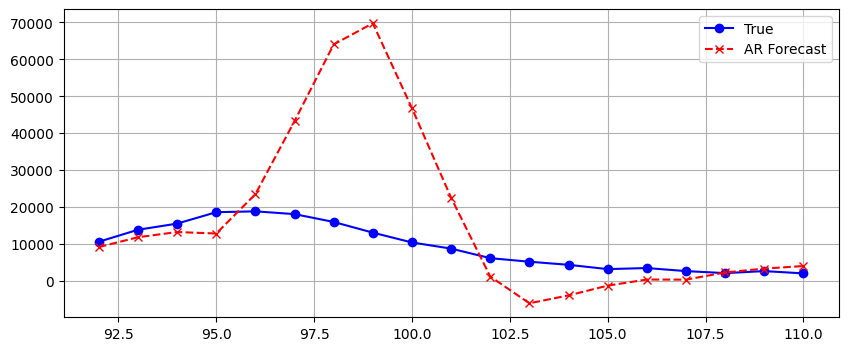

h: 1 MSE: 25918704.3105, MAE: 3408.9467, SMAPE: 20.9665
h: 2 MSE: 91359311.2732, MAE: 5883.6535, SMAPE: 30.8546
h: 3 MSE: 179715456.2264, MAE: 7684.4047, SMAPE: 36.9554
h: 4 MSE: 296686185.6347, MAE: 9955.2939, SMAPE: 61.9645
h: 5 MSE: 386298253.2127, MAE: 11348.7408, SMAPE: 81.8440
model.coef_:[[ 6.94671126e-01  6.72297765e-02  4.41622099e-02  4.76178915e-02
  -4.55695571e-02 -3.73307143e-02  3.88809560e-03 -2.13183690e-03
   1.34655484e-03  1.77336411e+01 -7.87245183e+01  4.78441386e+02]
 [ 4.69459907e-01  1.08522726e-01  8.88309477e-02  1.06385664e-01
  -2.42292529e-01  4.98347964e-02  6.65059294e-03 -1.28693818e-03
   1.42955572e-04  2.00851815e+02 -1.01329689e+02  5.98098982e+02]
 [ 3.47317746e-01  1.12850224e-01  1.56483006e-01 -7.47654452e-02
  -1.43063284e-01  3.29178539e-02  9.69278298e-03 -8.19590264e-04
  -1.83367369e-03  5.01162972e+02 -1.41838605e+02  5.02139346e+02]
 [ 2.60926824e-01  1.09501545e-01  7.95678437e-02  3.59825804e-02
  -2.11933336e-01  5.01848494e-02  1.1694

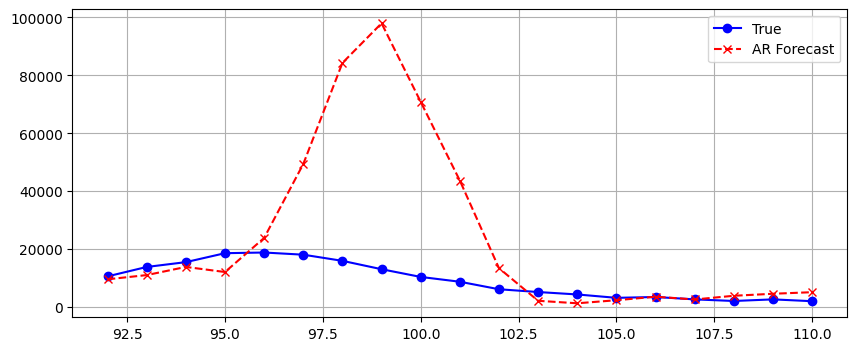

h: 1 MSE: 52731845.7162, MAE: 4955.4990, SMAPE: 27.8137
h: 2 MSE: 219793238.3805, MAE: 9517.7873, SMAPE: 41.9812
h: 3 MSE: 477385125.8665, MAE: 13532.1460, SMAPE: 51.8326
h: 4 MSE: 705652145.8556, MAE: 15198.4415, SMAPE: 53.4722
h: 5 MSE: 829529767.9707, MAE: 15388.4634, SMAPE: 52.8962
model.coef_:[[ 1.16541817e+00 -2.63640583e-01 -1.00773786e-01  7.60403183e-03
   2.46718430e-02 -6.39515979e-02  2.96361507e-03 -1.03778689e-03
   2.70171833e-03 -3.91881576e-03 -1.46715845e-02  2.45617081e-03]
 [ 1.05840614e+00 -3.43308031e-01 -1.03879761e-01  6.03139599e-02
  -1.43898763e-01  4.26184929e-03  6.34844109e-03 -1.34008986e-04
   3.06465963e-03 -6.94816017e-03 -2.77148310e-02  3.73576693e-03]
 [ 8.16714903e-01 -3.10968859e-01 -1.41174210e-02 -1.10333787e-01
  -4.83179501e-02 -2.43036608e-02  1.11591258e-02 -3.05802843e-04
   2.40631943e-03 -1.35642010e-02 -3.46163138e-02  5.18370749e-03]
 [ 5.60985246e-01 -2.47666188e-01 -1.16444180e-02  1.43112098e-03
  -1.62337898e-01  1.06996085e-02  1.5

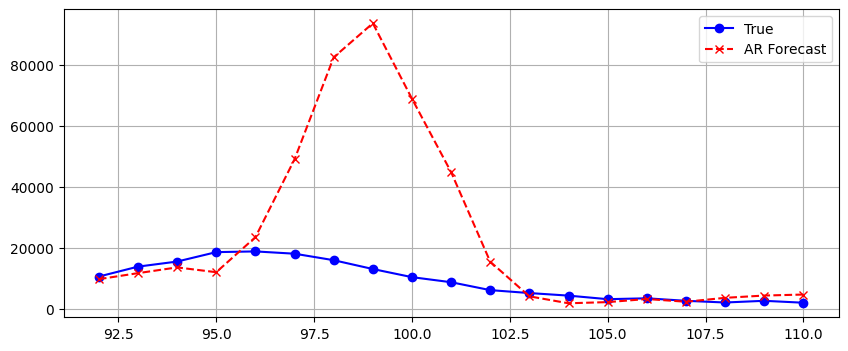

h: 1 MSE: 43501448.0369, MAE: 4510.9227, SMAPE: 25.9132
h: 2 MSE: 183387334.0656, MAE: 8619.6462, SMAPE: 38.3496
h: 3 MSE: 415957744.8871, MAE: 12467.3189, SMAPE: 46.4552
h: 4 MSE: 635039078.0820, MAE: 14394.1729, SMAPE: 50.9217
h: 5 MSE: 817165134.4937, MAE: 15478.0219, SMAPE: 53.5533
model.coef_:[[ 1.19197074e+00 -2.74039662e-01 -9.40874087e-02 -2.67006900e-04
   1.54590683e-02 -4.09416402e-02  2.88086492e-03 -9.62925289e-04
   2.63945756e-03  8.88448163e-04 -5.57315290e-03  6.46056331e-04]
 [ 1.11484797e+00 -3.68124633e-01 -8.44974177e-02  3.34024630e-02
  -1.53465561e-01  4.81233044e-02  5.78245561e-03  1.41994533e-04
   3.22216810e-03  4.05439736e-03 -1.36115200e-02  1.77698326e-03]
 [ 8.94229468e-01 -3.48235253e-01  1.99908770e-02 -1.60828388e-01
  -5.30262140e-02  3.44792300e-02  1.02593655e-02  2.25704993e-04
   2.86273449e-03  6.36339653e-03 -2.14509803e-02  3.90499435e-03]
 [ 6.42302797e-01 -2.91159480e-01  3.63260229e-02 -6.92601005e-02
  -1.56562856e-01  6.96874043e-02  1.4

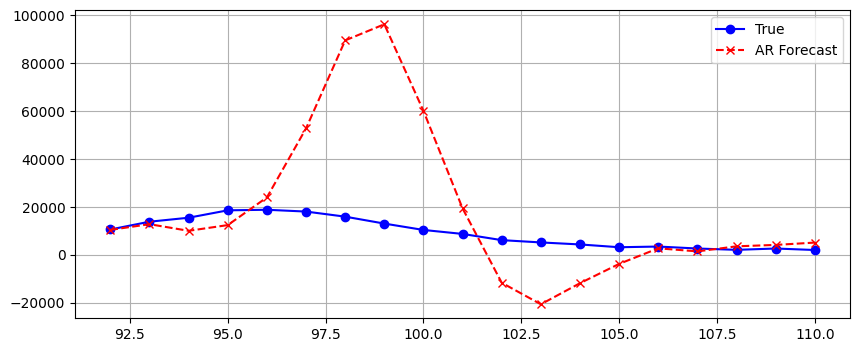

h: 1 MSE: 56727574.7861, MAE: 5016.8870, SMAPE: 27.6066
h: 2 MSE: 207172704.0976, MAE: 8892.1609, SMAPE: 38.3050
h: 3 MSE: 383420979.0793, MAE: 10954.0353, SMAPE: 38.4713
h: 4 MSE: 580750559.6224, MAE: 13466.4654, SMAPE: 64.5387
h: 5 MSE: 768119246.9529, MAE: 16069.9957, SMAPE: 87.1278
model.coef_:[[ 1.09266040e+00 -2.48495322e-01 -8.91584936e-02 -4.89262068e-03
  -8.82553759e-03  1.19528711e-02  3.80240736e-03 -2.71152876e-04
   1.55780985e-03 -1.01367882e-04 -3.49515048e-04  1.30560706e-04]
 [ 9.45482883e-01 -3.08728251e-01 -8.47282658e-02  4.94798324e-02
  -2.21889929e-01  1.42970063e-01  8.75279543e-03 -2.88903684e-04
   8.42425672e-04 -3.55723432e-04 -3.38162153e-04  1.62142185e-04]
 [ 7.29120663e-01 -2.84369752e-01  3.53674068e-02 -1.35027378e-01
  -1.48729950e-01  1.48447950e-01  1.36744603e-02 -5.51853442e-05
  -2.04599311e-03 -3.67004897e-04 -5.51918257e-04  3.38591118e-04]
 [ 5.15439068e-01 -2.33182049e-01  4.71552765e-02 -1.71827555e-02
  -2.59558815e-01  1.77289307e-01  1.7

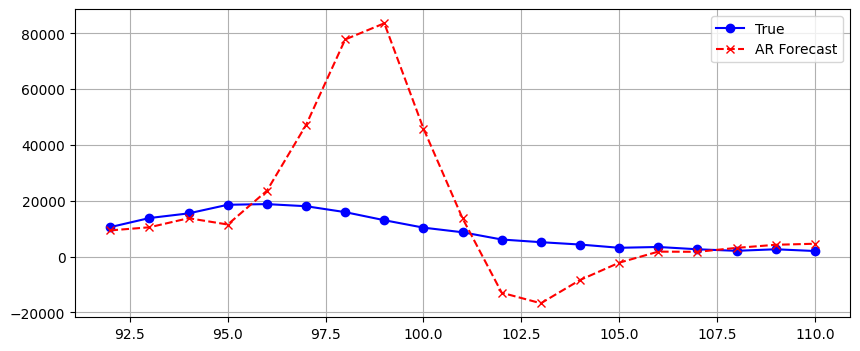

h: 1 MSE: 19850164.0455, MAE: 3194.5018, SMAPE: 20.8187
h: 2 MSE: 78214358.9072, MAE: 5453.2118, SMAPE: 27.5477
h: 3 MSE: 178466957.8921, MAE: 7511.3249, SMAPE: 33.2180
h: 4 MSE: 341066673.1942, MAE: 10729.6341, SMAPE: 67.9887
h: 5 MSE: 512392378.4934, MAE: 13176.6803, SMAPE: 81.9587
model.coef_:[[ 1.09118672e+00 -2.50111500e-01 -7.61950474e-02  9.50624430e-03
   4.68645852e-03 -1.88540242e-02  2.51281587e-03 -1.48900224e-03
   1.34401102e-03  8.16863776e+02  4.64347815e+02  2.11404504e+02]
 [ 9.87937922e-01 -3.28151460e-01 -4.97668327e-02  5.66789461e-02
  -1.96340350e-01  8.79127452e-02  5.73349697e-03 -9.54985359e-04
  -1.92794653e-04  1.15298488e+03  6.09464014e+02  2.45305415e+02]
 [ 8.03115861e-01 -3.01811165e-01  6.97087572e-02 -1.23953301e-01
  -1.34940690e-01  8.90476518e-02  1.03469505e-02 -1.43125511e-03
  -2.65354514e-03  1.17712028e+03  5.08657963e+02  1.17136480e+02]
 [ 6.10035291e-01 -2.42247363e-01  7.47983877e-02 -6.99817532e-03
  -2.62132269e-01  1.25040327e-01  1.455

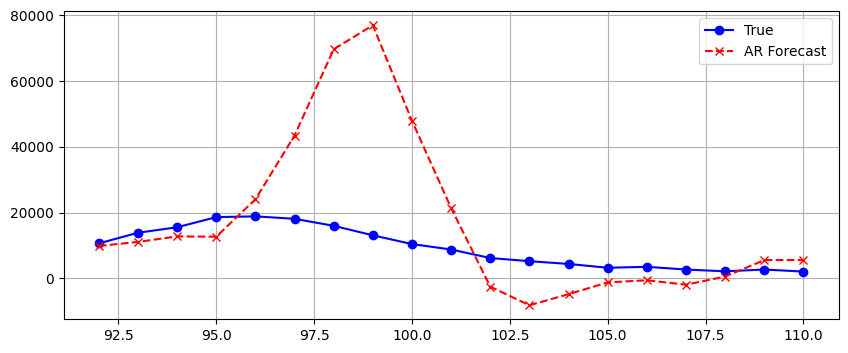

h: 1 MSE: 10509837.6403, MAE: 2383.3844, SMAPE: 16.8304
h: 2 MSE: 48410514.8515, MAE: 4638.5947, SMAPE: 29.4087
h: 3 MSE: 127697763.3280, MAE: 6707.7166, SMAPE: 38.1713
h: 4 MSE: 267358982.3895, MAE: 9636.0857, SMAPE: 74.1042
h: 5 MSE: 411540591.0375, MAE: 12081.4389, SMAPE: 102.7181
model.coef_:[[ 1.16087642e+00 -2.72855015e-01 -9.47152532e-02 -4.45419909e-03
   3.09281036e-02 -5.28220973e-02  2.06300271e-03 -1.47348493e-03
   1.37923763e-03 -2.58228782e+01  4.06229725e+01 -2.16831918e+01]
 [ 1.07440920e+00 -3.55993526e-01 -8.05277640e-02  4.07094050e-02
  -1.57074680e-01  4.02855392e-02  4.88799703e-03 -8.98799710e-04
   6.74604958e-05 -3.34917947e+01  4.84697293e+01 -2.47790814e+01]
 [ 8.70497729e-01 -3.31674390e-01  2.72081467e-02 -1.36796325e-01
  -7.46843756e-02  3.09843776e-02  8.98653253e-03 -1.22419470e-03
  -1.91989175e-03 -4.12213660e+01  5.61398453e+01 -2.57428136e+01]
 [ 6.38716455e-01 -2.75555239e-01  2.02350283e-02 -1.33096730e-02
  -1.74085404e-01  5.80764665e-02  1.259

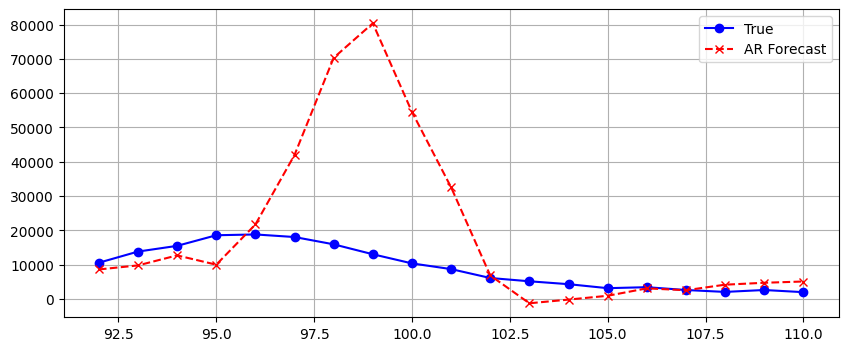

h: 1 MSE: 11537961.5913, MAE: 2544.1749, SMAPE: 19.3315
h: 2 MSE: 55628529.4211, MAE: 5017.1636, SMAPE: 33.1666
h: 3 MSE: 141027700.5325, MAE: 7302.9225, SMAPE: 43.6821
h: 4 MSE: 290389766.2033, MAE: 9771.1430, SMAPE: 53.4597
h: 5 MSE: 452533846.2684, MAE: 11664.4026, SMAPE: 68.6041
model.coef_:[[ 1.15890664e+00 -2.52092247e-01 -1.18100958e-01  1.64077560e-02
   2.00666122e-02 -7.45853202e-02  2.07777025e-03 -1.35331564e-03
   1.68570072e-03  1.91242706e-05 -3.94716347e-05  1.98037197e-05]
 [ 1.04934666e+00 -3.27067101e-01 -1.28337213e-01  7.12709138e-02
  -1.73533093e-01  1.84935077e-02  4.75537959e-03 -6.91265399e-04
   9.87923599e-04  2.75129448e-05 -6.22439434e-05  3.37738716e-05]
 [ 8.02535881e-01 -2.82484627e-01 -7.35820455e-02 -8.73752350e-02
  -9.30527866e-02  9.38535639e-03  8.53394003e-03 -1.13263486e-03
   4.02198401e-05  4.89867369e-05 -1.12601679e-04  6.23305939e-05]
 [ 5.35768512e-01 -2.31624139e-01 -6.77742593e-02  2.61263109e-02
  -2.48525004e-01  1.20699326e-01  1.2506

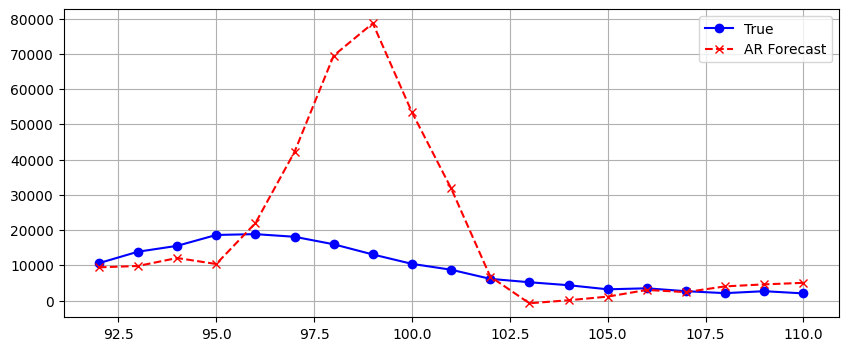

h: 1 MSE: 11851760.0175, MAE: 2555.2015, SMAPE: 18.5010
h: 2 MSE: 57062350.0336, MAE: 4907.5746, SMAPE: 28.4640
h: 3 MSE: 147505118.6407, MAE: 7143.2971, SMAPE: 35.7963
h: 4 MSE: 295549372.6034, MAE: 9768.2185, SMAPE: 51.6150
h: 5 MSE: 442405524.2374, MAE: 11541.2481, SMAPE: 67.5525
model.coef_:[[ 1.16337557e+00 -2.64318818e-01 -9.04308759e-02  3.07993659e-03
  -4.31614830e-03 -3.57856969e-02  2.29734348e-03 -1.36971197e-03
   1.43970887e-03 -1.34290516e-05  1.94513640e-05 -6.52406639e-06]
 [ 1.04720268e+00 -3.41991992e-01 -8.88505662e-02  4.91070398e-02
  -1.95875488e-01  5.59946581e-02  4.82928286e-03 -5.71140492e-04
   7.14041040e-04 -8.90894519e-06  6.39783618e-07  7.38254838e-06]
 [ 8.07310161e-01 -3.12217758e-01  6.22497442e-03 -1.26147080e-01
  -1.35597404e-01  7.50294239e-02  9.07912449e-03 -1.17583505e-03
  -6.20723328e-04 -4.08911948e-05  5.54916886e-05 -1.58415430e-05]
 [ 5.34377754e-01 -2.47555788e-01 -1.55951612e-02 -1.09305151e-03
  -2.68198663e-01  1.48674005e-01  1.2937

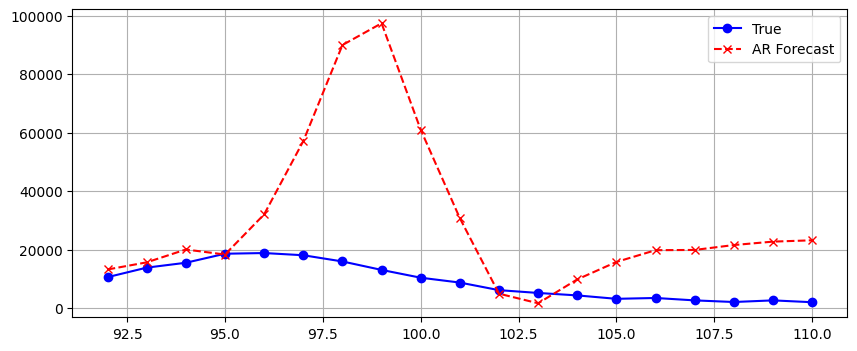

h: 1 MSE: 55789312.6646, MAE: 6818.5629, SMAPE: 49.5999
h: 2 MSE: 1070623512.8738, MAE: 29643.1062, SMAPE: 194.1566
h: 3 MSE: 305497692.6400, MAE: 15820.7112, SMAPE: 151.3170
h: 4 MSE: 1686179449.8348, MAE: 36288.3368, SMAPE: 123.7114
h: 5 MSE: 6733439159.1145, MAE: 76488.1574, SMAPE: 155.4499
model.coef_:[[ 1.22186869e+00 -2.66987918e-01 -6.52040836e-02 -1.83333586e-02
  -1.94881465e-02 -1.61168112e-02  3.06842295e-03 -2.02199129e-03
   7.17697011e-04 -1.30213080e-04  2.76124956e-04 -1.37653639e-04]
 [ 1.17112238e+00 -3.76900340e-01 -2.90240008e-02  1.96664268e-02
  -1.90716373e-01  5.97675668e-02  6.01297805e-03 -1.10347068e-03
  -1.08710250e-03 -4.53172259e-05  2.03767165e-04 -2.25158976e-04]
 [ 9.58177330e-01 -3.45907784e-01  8.29655943e-02 -1.38778491e-01
  -1.34587605e-01  5.75591040e-02  1.05291576e-02 -1.36558503e-03
  -3.47927122e-03  1.47112797e-05 -3.42458498e-05 -1.32117117e-05]
 [ 6.96262037e-01 -2.57260071e-01  7.18426753e-02 -6.61165524e-03
  -2.90754387e-01  1.23851327e

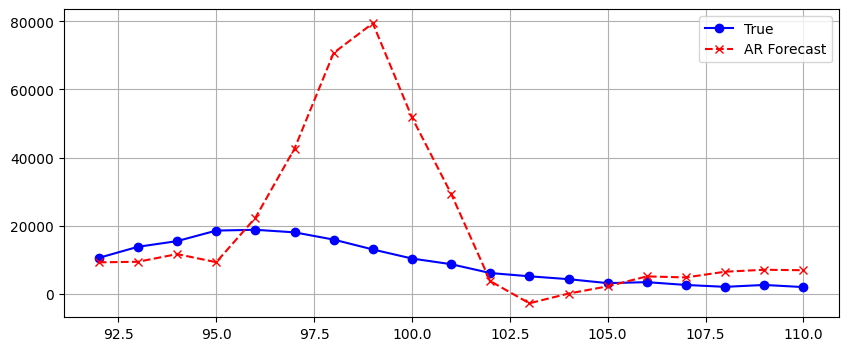

h: 1 MSE: 9055279.3134, MAE: 2305.2353, SMAPE: 17.3122
h: 2 MSE: 45901941.9174, MAE: 4399.1267, SMAPE: 26.1518
h: 3 MSE: 127821980.2309, MAE: 6595.3171, SMAPE: 33.3759
h: 4 MSE: 283577568.7027, MAE: 9643.1618, SMAPE: 52.9430
h: 5 MSE: 453670158.1085, MAE: 12287.0575, SMAPE: 76.5790
model.coef_:[[ 1.19746977e+00 -2.66460809e-01 -9.82210286e-02 -1.16135687e-02
   7.37777447e-03 -2.89391044e-02  2.20368524e-03 -1.55750884e-03
   1.32960819e-03  1.79433641e-05  7.99342527e-05 -1.31801850e-04]
 [ 1.11795205e+00 -3.57529020e-01 -1.02543953e-01  4.83519691e-02
  -2.17021526e-01  1.01668309e-01  4.72669228e-03 -7.18248146e-04
   2.83680084e-04  7.61768693e-05  2.41786256e-05 -1.78203968e-04]
 [ 8.99344650e-01 -3.36803236e-01 -7.69562562e-03 -1.13913789e-01
  -1.88556461e-01  1.54452373e-01  8.76256065e-03 -9.51273928e-04
  -1.42001747e-03  9.95166605e-05 -6.93713682e-05 -1.54214297e-04]
 [ 6.39945811e-01 -2.85168223e-01 -1.36507622e-02  3.95449731e-02
  -3.90956158e-01  2.91639818e-01  1.26908

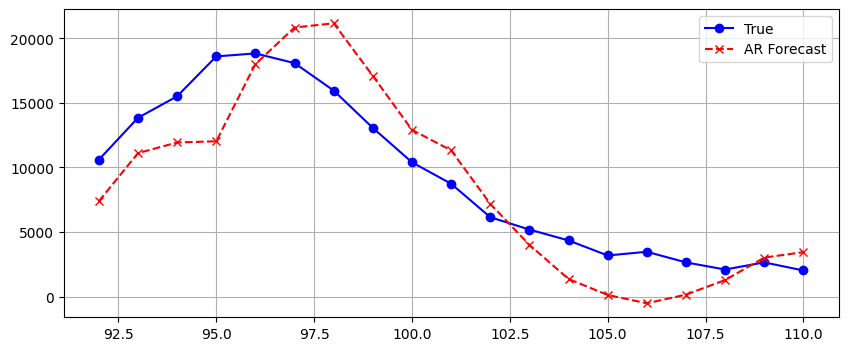

h: 1 MSE: 1116706.8317, MAE: 705.6512, SMAPE: 7.9992
h: 2 MSE: 1592822.7520, MAE: 994.8833, SMAPE: 14.3509
h: 3 MSE: 1574833.2581, MAE: 1125.0397, SMAPE: 19.8491
h: 4 MSE: 3396213.6237, MAE: 1472.4339, SMAPE: 29.7522
h: 5 MSE: 4799204.3186, MAE: 1823.2552, SMAPE: 41.1630
model.coef_:[[ 9.06478562e-01 -4.65439327e-02  6.32371702e-02  7.29176781e-03
  -3.17891818e-02 -2.04724548e-02  1.43668609e+02  4.42177085e+01
   3.19459341e+02  3.29003059e-02 -2.72307214e-02  6.53869341e-03]
 [ 8.58075893e-01 -5.62378968e-02  7.39796208e-02  1.75256819e-02
  -1.99622367e-01  8.18576826e-02  3.97780975e+02  2.01550786e+02
   2.66678654e+02  6.58759136e-02 -5.37445646e-02  8.91734242e-03]
 [ 9.00139174e-01 -1.06937144e-01  8.24540206e-02 -2.02208968e-01
  -5.19555062e-02  5.98911047e-02  7.86417086e+02  3.45281032e+02
  -6.72383786e+00  9.21049218e-02 -7.62727222e-02  1.01755961e-02]
 [ 9.22705427e-01 -1.08085434e-01 -1.01081327e-01 -1.31406107e-01
  -5.66482738e-02  5.90485793e-02  1.22650041e+03  5.

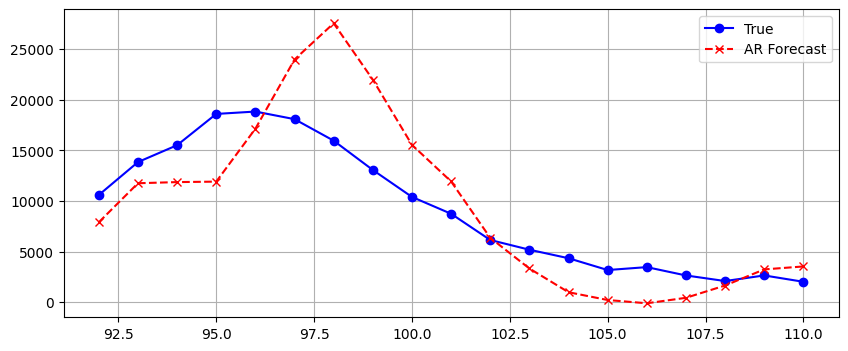

h: 1 MSE: 1225127.6529, MAE: 749.3384, SMAPE: 7.9900
h: 2 MSE: 2118320.0932, MAE: 1158.4772, SMAPE: 14.0514
h: 3 MSE: 3042387.4349, MAE: 1453.5184, SMAPE: 19.2189
h: 4 MSE: 7289252.3366, MAE: 2127.5615, SMAPE: 30.5369
h: 5 MSE: 12877258.4081, MAE: 2804.9536, SMAPE: 43.6903
model.coef_:[[ 8.44536868e-01 -2.49599893e-02  8.03118815e-02  1.32172516e-02
  -2.84465071e-02 -3.19187869e-02  9.48029434e+01  7.15349540e+00
   3.75483292e+02  8.09475394e-03 -5.06288935e-03  3.98969924e-04]
 [ 7.39610232e-01 -1.51363388e-02  1.21512623e-01  1.61346498e-02
  -1.95052413e-01  6.74679756e-02  2.79467219e+02  1.30864493e+02
   3.80783162e+02  1.79864736e-02 -1.26955023e-02  6.49050173e-04]
 [ 7.41899359e-01 -5.29159948e-02  1.64450595e-01 -2.22133208e-01
  -4.54360697e-02  4.79596563e-02  5.98882182e+02  2.52639126e+02
   1.52787932e+02  2.73035020e-02 -2.15876821e-02  1.66290276e-03]
 [ 7.43495554e-01 -4.79627756e-02  2.70681914e-03 -1.61059262e-01
  -5.07608705e-02  5.07957399e-02  9.92514217e+02  

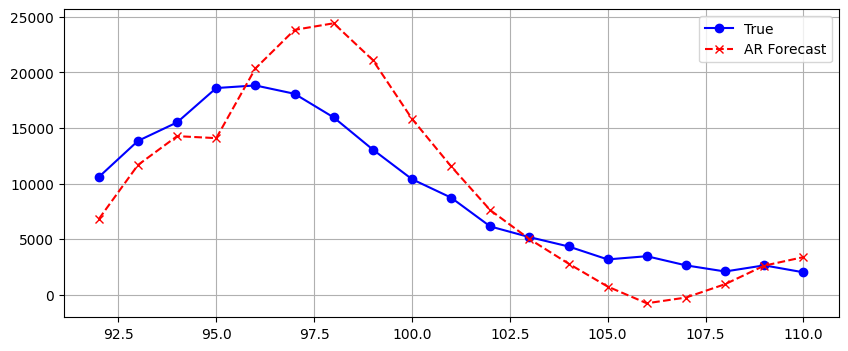

h: 1 MSE: 1286347.1734, MAE: 831.1907, SMAPE: 9.1959
h: 2 MSE: 2484644.5770, MAE: 1303.9025, SMAPE: 16.7301
h: 3 MSE: 3034936.5027, MAE: 1615.9094, SMAPE: 23.5521
h: 4 MSE: 6025007.2123, MAE: 2017.4247, SMAPE: 33.5524
h: 5 MSE: 8736705.1238, MAE: 2258.8795, SMAPE: 43.7683
model.coef_:[[ 9.24756876e-01 -9.03706304e-03  1.98080575e-02  8.09293791e-03
   2.11551310e-02 -9.49086275e-02  1.67908947e+02  1.33457010e+02
   2.88760529e+02  2.49700875e-04 -2.33233701e-04  2.12147076e-04]
 [ 8.91841127e-01 -5.71442168e-03 -8.26913794e-03  5.42373183e-02
  -1.27780560e-01 -5.47097022e-02  5.52776970e+02  2.45174140e+02
   2.50843676e+02  2.79717842e-04  2.27799602e-05  1.06692286e-04]
 [ 9.13741918e-01 -2.95709325e-02 -1.48651611e-02 -1.47470190e-01
   2.16882636e-02 -1.10927413e-01  9.93993424e+02  3.23594391e+02
   2.78595446e+01  4.63393921e-04  1.00055709e-04 -2.62561993e-05]
 [ 9.07307316e-01 -1.89300257e-02 -1.95551050e-01 -4.36933018e-02
  -3.71685130e-03 -1.26976672e-01  1.49827037e+03  3

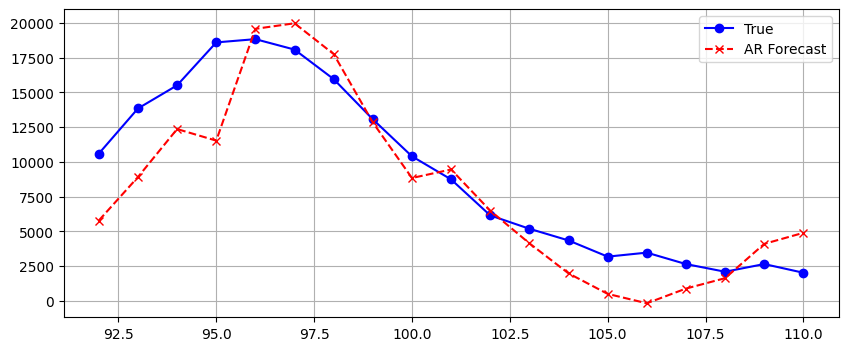

h: 1 MSE: 1771966.3481, MAE: 925.8867, SMAPE: 9.6247
h: 2 MSE: 3323824.9494, MAE: 1387.9683, SMAPE: 14.2051
h: 3 MSE: 4190939.7382, MAE: 1594.6316, SMAPE: 19.4625
h: 4 MSE: 5318331.0727, MAE: 1931.9347, SMAPE: 29.9828
h: 5 MSE: 4145690.3862, MAE: 1729.9284, SMAPE: 37.5660
model.coef_:[[ 1.15648173e+00 -1.16629533e-01 -6.30793377e-03 -1.20723204e-02
  -6.65728794e-03 -4.68646193e-02  1.73851807e+02  2.72167361e+02
   7.42255081e+01  2.72619252e+01 -2.48677839e+02 -3.72999164e+02]
 [ 1.31245882e+00 -1.80525292e-01 -6.59444192e-02 -2.09824484e-02
  -1.47974258e-01  2.80380986e-02  4.84250873e+02  6.29879452e+02
  -1.91455984e+02 -9.06353905e-01 -4.31827423e+02 -6.19502377e+02]
 [ 1.48281568e+00 -2.62535433e-01 -1.12729619e-01 -2.51770562e-01
   2.04074314e-02 -1.58805781e-02  9.28038791e+02  9.08054713e+02
  -6.08417846e+02  8.09276990e+00 -5.39964030e+02 -7.80622208e+02]
 [ 1.57722870e+00 -2.77045865e-01 -3.29204330e-01 -1.85954468e-01
   2.74246822e-02 -3.17103205e-02  1.40306142e+03  1

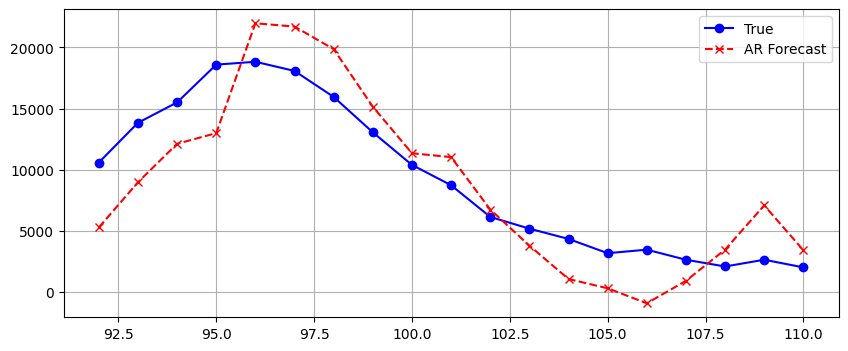

h: 1 MSE: 1835409.2736, MAE: 895.7445, SMAPE: 8.9576
h: 2 MSE: 3283539.6687, MAE: 1256.8763, SMAPE: 14.2337
h: 3 MSE: 3626828.1521, MAE: 1492.7683, SMAPE: 18.3873
h: 4 MSE: 4954196.5169, MAE: 1639.7575, SMAPE: 24.3126
h: 5 MSE: 5284684.5868, MAE: 1896.1631, SMAPE: 38.7296
model.coef_:[[ 1.15501455e+00 -1.11832532e-01 -1.82774014e-02 -4.12534503e-02
   1.76334486e-02 -4.34462910e-02  4.08182540e+02  4.05509881e+02
  -6.94603148e+01 -1.30149269e+01  4.27593965e+01 -3.06482602e+01]
 [ 1.30549749e+00 -1.72517822e-01 -9.66367619e-02 -6.42040798e-02
  -1.15821694e-01  4.23987177e-02  9.46679241e+02  7.96716228e+02
  -4.40368512e+02 -1.08405580e+01  5.21302864e+01 -4.36289756e+01]
 [ 1.47072806e+00 -2.67828655e-01 -1.58055758e-01 -3.02073015e-01
   6.06123638e-02  4.49303014e-03  1.49609863e+03  1.07080846e+03
  -9.19287441e+02 -1.29073691e+01  6.07491863e+01 -5.29698916e+01]
 [ 1.56048720e+00 -2.96812200e-01 -3.83582984e-01 -2.44246596e-01
   7.86700285e-02 -9.18563681e-03  2.02873465e+03  1

/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=8.73998e-20): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


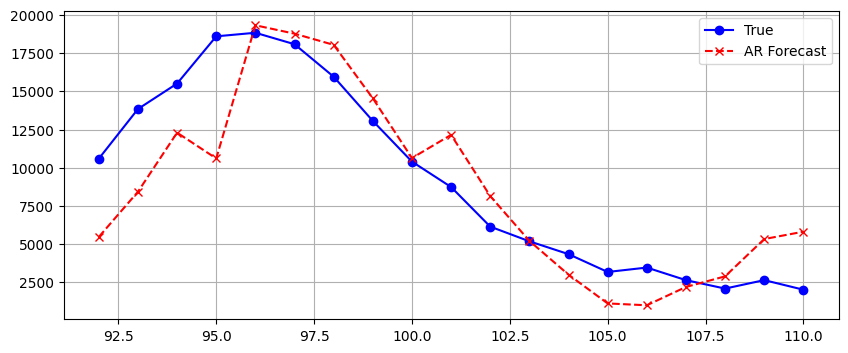

h: 1 MSE: 1490940.7188, MAE: 808.0478, SMAPE: 8.6458
h: 2 MSE: 2560964.4876, MAE: 1263.5830, SMAPE: 13.0026
h: 3 MSE: 3888307.0699, MAE: 1647.7086, SMAPE: 19.7130
h: 4 MSE: 5692414.4311, MAE: 1994.5231, SMAPE: 29.6078
h: 5 MSE: 4635896.8710, MAE: 1758.6077, SMAPE: 30.2859
model.coef_:[[ 1.16142718e+00 -1.44920633e-01 -5.41570016e-03 -1.56939090e-02
  -1.19102252e-02 -2.05626282e-02  1.89388107e+02  2.87327937e+02
   3.79280222e+01 -6.89527419e-06  1.27522990e-05 -5.78058658e-06]
 [ 1.31775835e+00 -2.28941491e-01 -7.30308313e-02 -2.19048378e-02
  -1.56557142e-01  7.00750049e-02  4.86421195e+02  6.50634874e+02
  -2.53174163e+02 -3.74472726e-06  4.73332707e-06 -9.33245883e-07]
 [ 1.48375796e+00 -3.17797885e-01 -1.55761452e-01 -2.30742064e-01
   1.83872256e-02  1.15935099e-02  8.78034181e+02  9.04348553e+02
  -6.71936271e+02  2.64140491e-05 -5.64756144e-05  2.99642682e-05]
 [ 1.57794660e+00 -3.51284502e-01 -3.67703411e-01 -1.70129437e-01
   7.39765956e-03  3.06571048e-02  1.31070026e+03  1

/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.14777e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


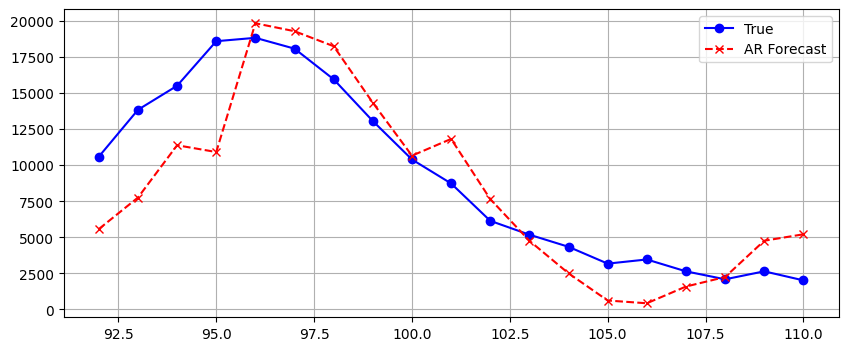

h: 1 MSE: 1606492.0225, MAE: 839.6071, SMAPE: 9.0392
h: 2 MSE: 2723473.5895, MAE: 1283.7658, SMAPE: 13.2966
h: 3 MSE: 3751151.1426, MAE: 1581.3737, SMAPE: 19.2006
h: 4 MSE: 5554153.4785, MAE: 1944.6136, SMAPE: 30.9115
h: 5 MSE: 4824028.9291, MAE: 1844.9271, SMAPE: 35.2103
model.coef_:[[ 1.17003196e+00 -1.42863044e-01 -1.11588038e-02 -9.28349060e-03
  -1.84716709e-02 -9.64611489e-03  2.22933980e+02  3.04367504e+02
   2.66060213e+01 -3.89306636e-05  7.85767900e-05 -3.96165814e-05]
 [ 1.32675257e+00 -2.29410671e-01 -7.39756088e-02 -1.83447192e-02
  -1.65447863e-01  8.53915514e-02  5.17445522e+02  6.73670082e+02
  -2.66443779e+02 -4.45550497e-05  8.74800432e-05 -4.29074195e-05]
 [ 1.50369283e+00 -3.28513986e-01 -1.20242712e-01 -2.50264326e-01
  -4.74802479e-03  6.08807585e-02  9.67908197e+02  9.84899128e+02
  -7.19975205e+02 -7.56857899e-05  1.48303230e-04 -7.28141997e-05]
 [ 1.60184483e+00 -3.61203053e-01 -3.34947209e-01 -1.86298391e-01
  -9.08159730e-03  6.86024766e-02  1.42615165e+03  1

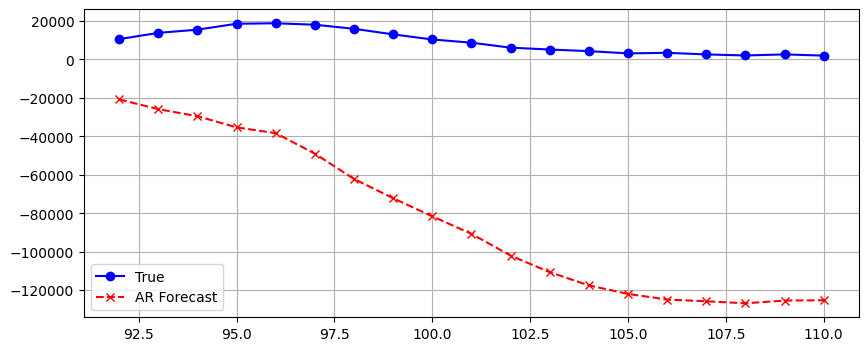

h: 1 MSE: 8374249.3893, MAE: 2493.3999, SMAPE: 49.5963
h: 2 MSE: 3263128465.9173, MAE: 53428.4017, SMAPE: 200.0000
h: 3 MSE: 4102546457.0281, MAE: 60392.2978, SMAPE: 200.0000
h: 4 MSE: 1710822958.4750, MAE: 39119.0373, SMAPE: 200.0000
h: 5 MSE: 805321929.6217, MAE: 26001.4527, SMAPE: 181.7962
model.coef_:[[ 1.16766352e+00 -1.49314964e-01 -7.90797280e-03 -2.48890682e-02
  -6.66263206e-03 -2.48061724e-02  1.94101653e+02  2.68546929e+02
   4.10496098e+01 -8.72001911e-05  2.36759795e-04 -1.55653224e-04]
 [ 1.32703494e+00 -2.45879856e-01 -6.05407086e-02 -4.73740016e-02
  -1.07548491e-01  3.45801152e-02  4.98136920e+02  6.39633336e+02
  -2.54123480e+02  2.69564035e-05  1.75631157e-04 -3.10571143e-04]
 [ 1.49260774e+00 -3.37179099e-01 -1.11171547e-01 -2.69583461e-01
   6.89284922e-02 -1.48031585e-02  9.34131023e+02  9.31928384e+02
  -6.89496604e+02  1.13039174e-04 -2.22083136e-05 -2.09826075e-04]
 [ 1.58737025e+00 -3.58993038e-01 -3.26774132e-01 -2.04416276e-01
   6.34093368e-02 -1.68981118e-

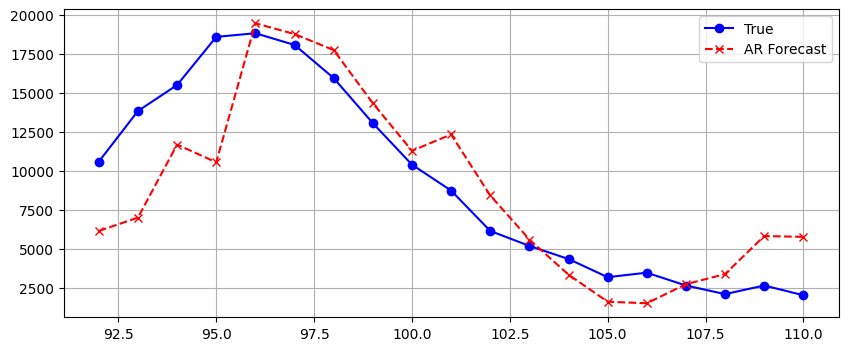

h: 1 MSE: 1545217.9499, MAE: 818.0702, SMAPE: 8.7590
h: 2 MSE: 2646338.0818, MAE: 1290.3565, SMAPE: 13.4599
h: 3 MSE: 3648308.1650, MAE: 1586.0513, SMAPE: 18.0609
h: 4 MSE: 5285212.9412, MAE: 1918.9094, SMAPE: 26.2834
h: 5 MSE: 4803600.9437, MAE: 1774.2294, SMAPE: 27.5796
model.coef_:[[ 1.15944670e+00 -1.34023144e-01 -2.52217041e-03 -3.03814726e-02
   6.18507480e-03 -2.81097084e-02  2.25216760e+02  2.93600431e+02
   2.72991216e+01 -7.46028549e-05  4.96904887e-05  2.63896886e-05]
 [ 1.31563629e+00 -2.23480662e-01 -6.74770145e-02 -3.84092044e-02
  -1.37073705e-01  6.10473104e-02  5.06908555e+02  6.49797652e+02
  -2.58367279e+02 -6.12659104e-05  5.60541040e-05 -2.87419287e-06]
 [ 1.48605434e+00 -3.28584796e-01 -1.19728773e-01 -2.64237830e-01
   2.09754372e-02  3.38476530e-02  8.93186094e+02  9.23854640e+02
  -6.79290672e+02 -3.00484584e-05  4.90047463e-05 -4.40009325e-05]
 [ 1.57878515e+00 -3.55320206e-01 -3.30220731e-01 -1.96325257e-01
  -1.18522285e-02  7.74819592e-02  1.32359333e+03  1

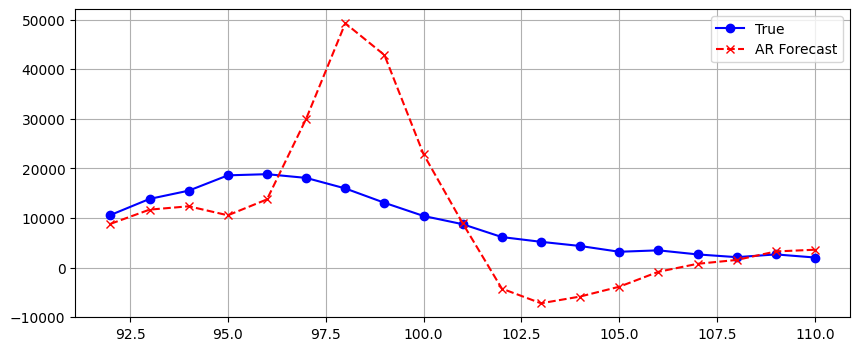

h: 1 MSE: 2887055.0181, MAE: 1318.9785, SMAPE: 11.7227
h: 2 MSE: 9257009.8584, MAE: 2029.1626, SMAPE: 15.4217
h: 3 MSE: 23755117.6229, MAE: 2864.2959, SMAPE: 19.7648
h: 4 MSE: 52310135.7641, MAE: 4665.6563, SMAPE: 42.4219
h: 5 MSE: 95100158.9403, MAE: 6536.0965, SMAPE: 79.4430
model.coef_:[[ 1.24932361e+00 -3.09798587e-01 -2.56286177e-02 -3.49251383e-02
   1.81828031e-02 -5.63052330e-02 -4.79467002e-02  1.01657659e-02
   7.30268413e-03  1.78574095e-02 -7.74546956e-03 -4.85848433e-04]
 [ 1.25785763e+00 -4.03861625e-01 -9.42722931e-03 -3.98265179e-02
  -1.42696197e-01  3.96549604e-02 -1.66917506e-01  9.91082072e-02
   2.10235801e-02  5.45900066e-02 -3.21361743e-02 -6.57724976e-03]
 [ 1.17111984e+00 -4.29711342e-01  8.09650014e-02 -2.71920390e-01
  -7.95351280e-03  3.02522165e-02 -3.20556667e-01  2.50938573e-01
   1.62014267e-02  1.00695699e-01 -7.24576241e-02 -8.83300626e-03]
 [ 1.04247053e+00 -3.98054131e-01 -9.20287292e-03 -1.84268201e-01
  -6.35586760e-02  6.66459398e-02 -4.31997553e-

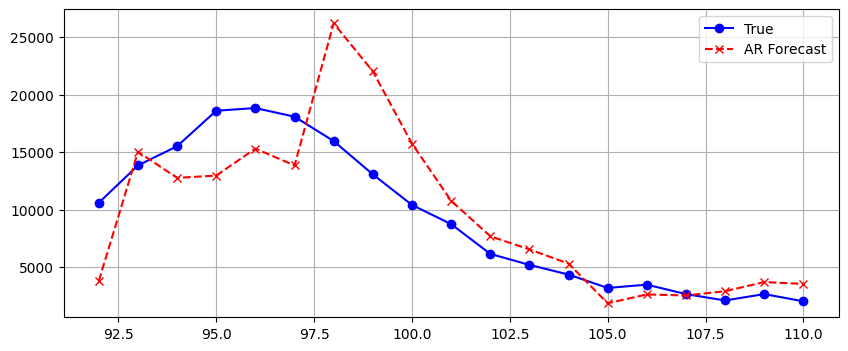

h: 1 MSE: 1808046.0588, MAE: 971.6556, SMAPE: 10.3285
h: 2 MSE: 3142516.9025, MAE: 1310.1639, SMAPE: 13.6519
h: 3 MSE: 2971247.4341, MAE: 1126.8472, SMAPE: 12.4996
h: 4 MSE: 7863474.6480, MAE: 1998.4877, SMAPE: 23.0397
h: 5 MSE: 11531583.0488, MAE: 2581.7503, SMAPE: 26.7631
model.coef_:[[ 1.31683804e+00 -3.25832127e-01 -3.33793240e-02 -5.31325036e-02
  -6.95146489e-03  3.37664650e-03  3.68490569e-02 -3.89271862e-02
   1.04072623e-02  1.94874844e-04 -3.22066911e-04  9.20277291e-05]
 [ 1.39662570e+00 -4.69994400e-01 -1.80175883e-02 -2.82828589e-02
  -1.94635237e-01  1.04501359e-01  7.21259992e-02 -7.42696206e-02
   1.27699409e-02  3.19422013e-04 -2.23884572e-04 -3.41965274e-05]
 [ 1.35899973e+00 -5.16052287e-01  5.97405983e-02 -2.16647958e-01
  -7.76500617e-02  6.12389071e-02  9.18238924e-02 -9.36663080e-02
   7.36677835e-03  7.13517318e-04 -3.05258805e-04 -1.27561652e-04]
 [ 1.24708885e+00 -4.99654698e-01 -2.06596205e-02 -1.02323587e-01
  -1.41807510e-01  5.38783881e-02  1.05295395e-01 

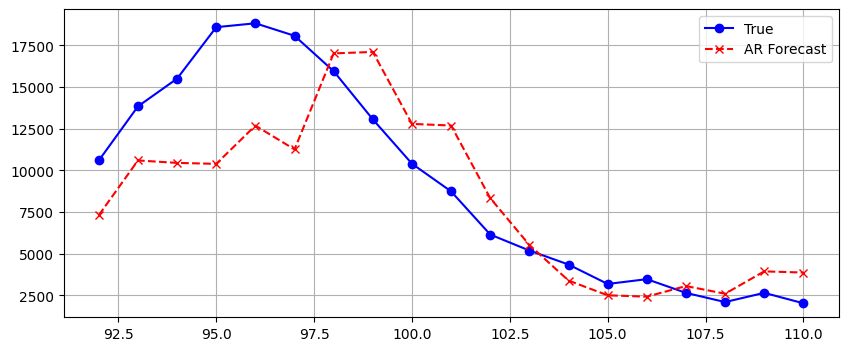

h: 1 MSE: 1576679.3697, MAE: 956.7667, SMAPE: 9.4683
h: 2 MSE: 2554989.6283, MAE: 1215.2962, SMAPE: 12.3110
h: 3 MSE: 3380174.8635, MAE: 1206.4623, SMAPE: 11.9016
h: 4 MSE: 7311049.2049, MAE: 1909.0823, SMAPE: 21.1869
h: 5 MSE: 9477607.3305, MAE: 2217.1099, SMAPE: 23.6429
model.coef_:[[ 1.22594047e+00 -3.25263975e-01 -2.16087732e-02 -2.76465689e-02
  -2.30705296e-03 -7.40999440e-04  3.56315904e-02 -3.98662715e-02
   1.35186954e-02  7.80727330e+02  3.61677962e+02  7.03549972e+01]
 [ 1.28198652e+00 -4.65416520e-01 -8.09584744e-03 -1.37113190e-02
  -1.81014857e-01  1.15938534e-01  8.28504003e-02 -8.50839665e-02
   1.95180911e-02  1.08668570e+03  4.03389007e+02 -5.89611002e+01]
 [ 1.27129182e+00 -5.39909706e-01  7.24683040e-02 -2.11468748e-01
  -7.13776970e-02  1.05910388e-01  1.31165198e-01 -1.30720346e-01
   2.24559423e-02  1.12432499e+03  2.32921098e+02 -3.44041097e+02]
 [ 1.21202240e+00 -5.52341696e-01 -2.12477931e-02 -1.09168511e-01
  -1.24278644e-01  1.17761300e-01  1.73718453e-01 -1

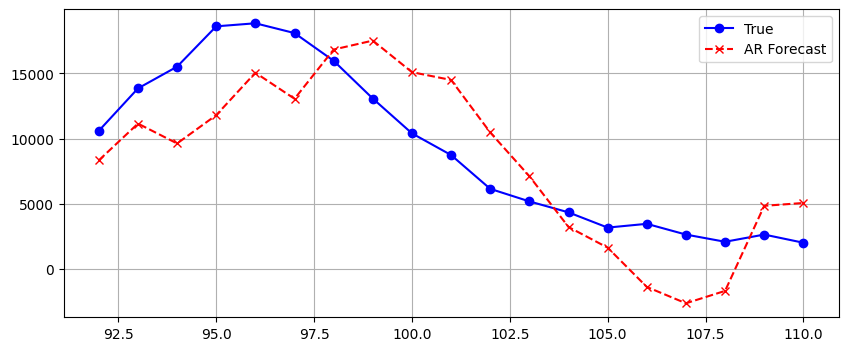

h: 1 MSE: 1876102.6226, MAE: 978.9070, SMAPE: 10.0372
h: 2 MSE: 3714783.8730, MAE: 1669.3479, SMAPE: 19.9293
h: 3 MSE: 4800413.3937, MAE: 1723.0702, SMAPE: 25.8244
h: 4 MSE: 8871264.5148, MAE: 2341.6173, SMAPE: 44.9627
h: 5 MSE: 11696958.1854, MAE: 2966.5836, SMAPE: 56.0412
model.coef_:[[ 1.25998198e+00 -3.37076162e-01 -3.56716988e-02 -5.10385964e-02
   3.00739210e-02 -3.67116749e-02  3.25479228e-02 -4.47173526e-02
   2.05696797e-02 -2.77817039e+01  4.26470363e+01 -2.17950836e+01]
 [ 1.30350167e+00 -4.71972517e-01 -3.25970792e-02 -3.91228335e-02
  -1.34272808e-01  6.75131696e-02  7.38034372e-02 -8.58391097e-02
   2.87810178e-02 -3.76292311e+01  5.14595022e+01 -2.34386226e+01]
 [ 1.24643704e+00 -5.33249469e-01  3.91390121e-02 -2.32660869e-01
  -6.08151129e-03  4.99866608e-02  1.14053363e-01 -1.22850360e-01
   3.26922953e-02 -4.88884428e+01  6.08022836e+01 -2.26566437e+01]
 [ 1.12961006e+00 -5.28420788e-01 -6.38156994e-02 -1.23942786e-01
  -3.52467827e-02  5.26846274e-02  1.46924374e-01 

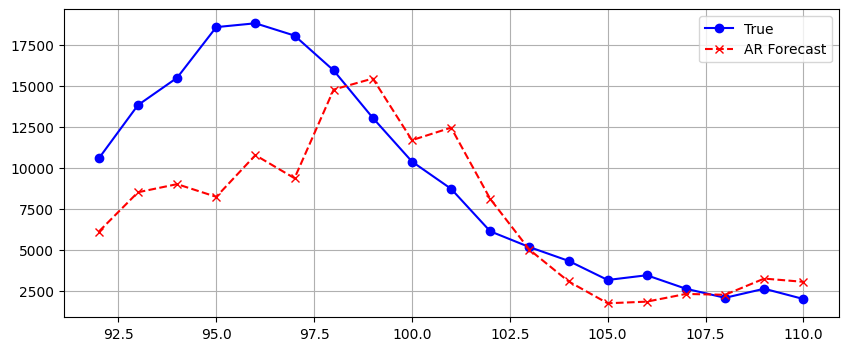

h: 1 MSE: 2304249.4493, MAE: 1160.8003, SMAPE: 13.4299
h: 2 MSE: 5095797.5743, MAE: 1764.0479, SMAPE: 22.9125
h: 3 MSE: 8480349.1313, MAE: 2346.9927, SMAPE: 34.3936
h: 4 MSE: 13301470.8690, MAE: 2754.1781, SMAPE: 38.9034
h: 5 MSE: 14581494.6169, MAE: 2701.9495, SMAPE: 33.6142
model.coef_:[[ 1.27236915e+00 -3.22890993e-01 -4.52230934e-02 -2.86839795e-02
   3.98074612e-03 -4.08467319e-02  3.61631442e-02 -4.24801634e-02
   1.62372143e-02  1.45930881e-05 -3.03068568e-05  1.52266266e-05]
 [ 1.29887626e+00 -4.47463636e-01 -5.40483905e-02 -1.49665003e-02
  -1.79057596e-01  7.45951867e-02  8.26180655e-02 -8.96472462e-02
   2.81932815e-02  2.86487667e-05 -6.43478045e-05  3.48229197e-05]
 [ 1.20086426e+00 -4.83114123e-01 -2.00671914e-02 -1.97266979e-01
  -6.89159502e-02  6.39322557e-02  1.26487398e-01 -1.33036808e-01
   3.83359086e-02  6.23415921e-05 -1.39014011e-04  7.54360224e-05]
 [ 1.05476266e+00 -4.79238108e-01 -1.23807540e-01 -1.02394141e-01
  -1.48443982e-01  1.31814779e-01  1.68865719e-0

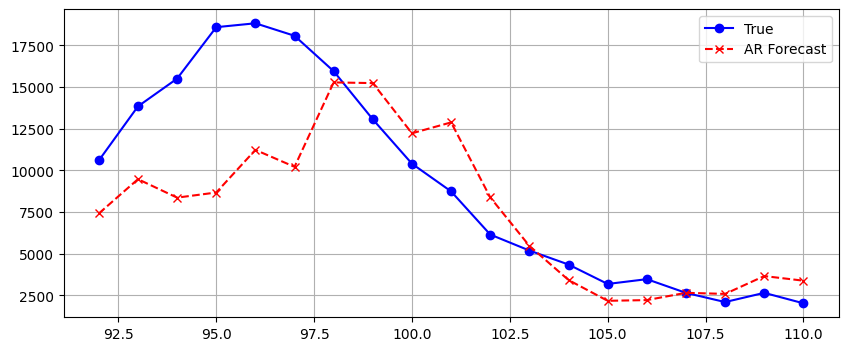

h: 1 MSE: 2039630.7378, MAE: 1058.4295, SMAPE: 11.4926
h: 2 MSE: 4212585.1546, MAE: 1584.7172, SMAPE: 17.7184
h: 3 MSE: 6329688.6354, MAE: 1986.2291, SMAPE: 23.9480
h: 4 MSE: 10865853.3543, MAE: 2361.4613, SMAPE: 27.5559
h: 5 MSE: 12923514.8068, MAE: 2489.5554, SMAPE: 27.7115
model.coef_:[[ 1.27954473e+00 -3.36512486e-01 -2.79784554e-02 -3.94761900e-02
  -1.35964338e-02 -8.96455563e-03  3.76626705e-02 -4.46098244e-02
   1.68680281e-02 -1.51453753e-05  2.35482047e-05 -8.86671075e-06]
 [ 1.30047280e+00 -4.65016791e-01 -1.98418889e-02 -4.01948601e-02
  -1.97643710e-01  1.11216616e-01  8.35424131e-02 -9.22052140e-02
   2.96977365e-02 -1.19705032e-05  7.20770675e-06  3.94149750e-06]
 [ 1.21651002e+00 -5.31900753e-01  6.14234355e-02 -2.50953335e-01
  -1.02586417e-01  1.32699829e-01  1.31909322e-01 -1.42197030e-01
   4.19791709e-02 -3.84872542e-05  4.94503647e-05 -1.21777053e-05]
 [ 1.06553856e+00 -5.31118819e-01 -3.33543115e-02 -1.62007612e-01
  -1.73970836e-01  1.86641613e-01  1.73094497e-0

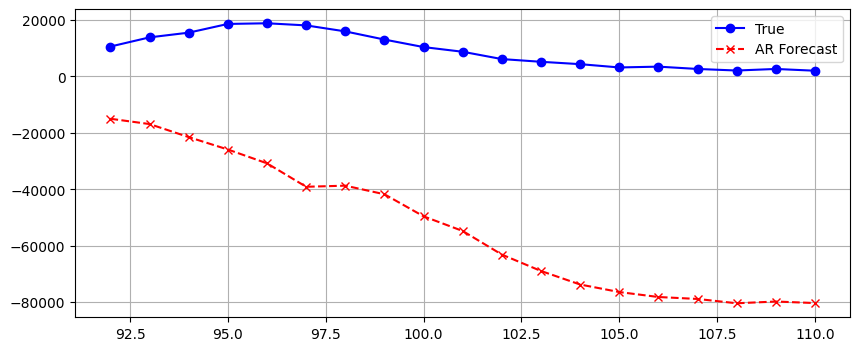

h: 1 MSE: 5944660.5807, MAE: 2024.7248, SMAPE: 19.2093
h: 2 MSE: 1996212861.3627, MAE: 42244.1529, SMAPE: 200.0000
h: 3 MSE: 1777288006.6477, MAE: 40498.4574, SMAPE: 200.0000
h: 4 MSE: 143980356.0245, MAE: 11727.3894, SMAPE: 165.9817
h: 5 MSE: 74787695.3986, MAE: 7556.7983, SMAPE: 69.5361
model.coef_:[[ 1.33691457e+00 -3.58011640e-01 -2.59214365e-02 -3.44917156e-02
  -1.29167984e-02 -6.12558917e-03  3.42364599e-02 -3.53508781e-02
   7.30612444e-03 -1.05644631e-04  2.35393080e-04 -1.27199557e-04]
 [ 1.41823927e+00 -5.21185096e-01  1.82106618e-03 -4.54843632e-02
  -1.51900953e-01  7.99664167e-02  8.53781072e-02 -9.17658360e-02
   2.09289307e-02 -7.40302815e-06  1.47773912e-04 -2.23673414e-04]
 [ 1.36870370e+00 -5.93032313e-01  9.13740188e-02 -2.49122833e-01
  -3.19322111e-02  6.26098925e-02  1.40513415e-01 -1.53329372e-01
   3.55111478e-02  6.81643723e-05 -9.16494188e-05 -5.19692973e-05]
 [ 1.26224405e+00 -6.02224739e-01  4.38030022e-03 -1.48993047e-01
  -9.73875040e-02  9.04684967e-02  

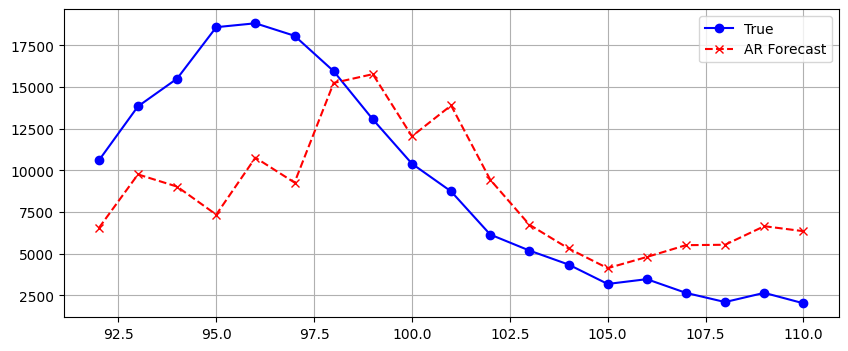

h: 1 MSE: 1907692.8557, MAE: 1024.0190, SMAPE: 10.9900
h: 2 MSE: 3782561.8061, MAE: 1494.7514, SMAPE: 15.3298
h: 3 MSE: 6151577.8689, MAE: 1821.6140, SMAPE: 18.4207
h: 4 MSE: 12308511.9640, MAE: 2523.0191, SMAPE: 28.1387
h: 5 MSE: 16314398.3916, MAE: 3094.6401, SMAPE: 36.8438
model.coef_:[[ 1.30156342e+00 -3.36990190e-01 -4.18675595e-02 -3.45321785e-02
  -6.54829627e-03 -8.60063973e-03  3.28545933e-02 -3.74127233e-02
   1.19032117e-02  3.46715330e-05  4.63243199e-05 -1.09447908e-04]
 [ 1.34766667e+00 -4.73618907e-01 -4.95050235e-02 -1.36878214e-02
  -2.11925056e-01  1.34932270e-01  7.58067968e-02 -7.99468151e-02
   2.07715647e-02  1.04104563e-04  6.60048822e-06 -1.81658508e-04]
 [ 1.27792212e+00 -5.38974656e-01  1.32024260e-02 -1.99727700e-01
  -1.42562093e-01  1.77154897e-01  1.20134112e-01 -1.24258411e-01
   2.96741288e-02  1.75694087e-04 -8.07099722e-05 -2.15619932e-04]
 [ 1.14816574e+00 -5.44664362e-01 -9.19635739e-02 -8.19690184e-02
  -2.65021006e-01  2.81550082e-01  1.61191005e-0

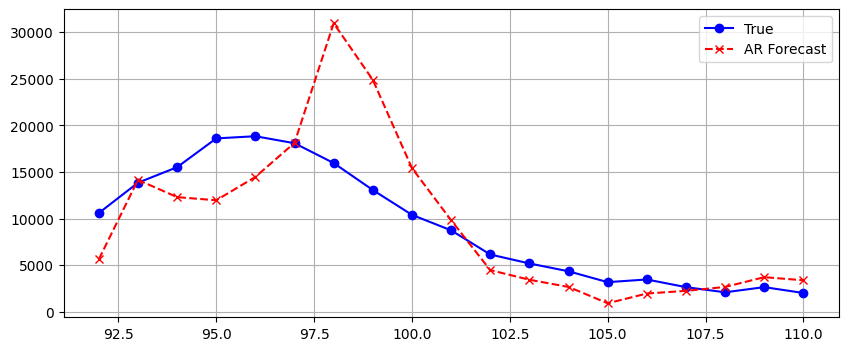

h: 1 MSE: 1479300.1215, MAE: 866.6245, SMAPE: 9.1763
h: 2 MSE: 2069920.3961, MAE: 1139.4445, SMAPE: 11.7340
h: 3 MSE: 2385512.4554, MAE: 1065.9298, SMAPE: 10.5267
h: 4 MSE: 8615375.9659, MAE: 2127.1691, SMAPE: 22.5420
h: 5 MSE: 16180246.7321, MAE: 2900.2141, SMAPE: 30.1728
model.coef_:[[ 1.27093402e+00 -3.13551054e-01 -1.76532216e-02 -7.00188116e-02
  -1.94963878e-03  8.61063387e-03  1.05847840e-02 -1.02006955e-02
   3.24573861e-03  1.03767637e-04 -2.68864473e-04  4.12128503e-05]
 [ 1.31010526e+00 -4.46749008e-01  2.64302790e-02 -7.45444538e-02
  -1.85979087e-01  1.26997046e-01  2.36699341e-02 -2.31658733e-02
   5.32378686e-03  7.61714598e-05 -1.01443604e-04 -1.02284118e-04]
 [ 1.24922557e+00 -4.87104049e-01  1.33344594e-01 -2.93838429e-01
  -7.01406843e-02  1.09184528e-01  3.38353427e-02 -3.37550438e-02
   5.83580566e-03  3.21751784e-04 -1.29481672e-04 -1.89466282e-04]
 [ 1.12501608e+00 -4.68538179e-01  7.51979439e-02 -2.02130623e-01
  -1.34296475e-01  1.21214345e-01  4.14263390e-02 -

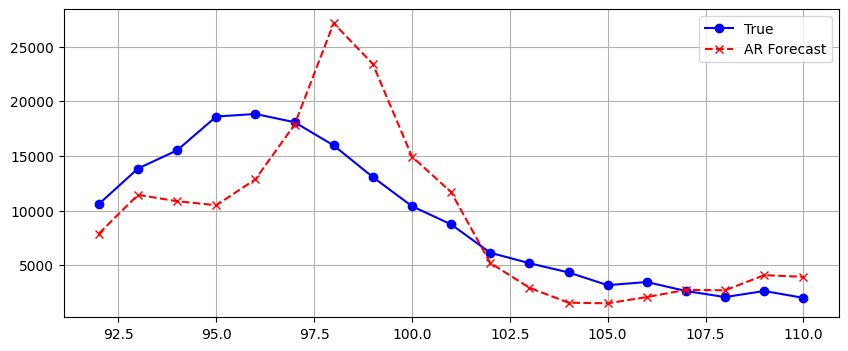

h: 1 MSE: 1967922.3726, MAE: 1039.7554, SMAPE: 9.7454
h: 2 MSE: 3196711.5564, MAE: 1407.9204, SMAPE: 12.6340
h: 3 MSE: 3812111.8522, MAE: 1379.6256, SMAPE: 11.7775
h: 4 MSE: 8649562.8828, MAE: 2204.1950, SMAPE: 22.1084
h: 5 MSE: 14482289.9602, MAE: 2848.2376, SMAPE: 28.7126
model.coef_:[[ 1.18799537e+00 -3.11882883e-01 -1.27582901e-02 -3.89912323e-02
   1.26113521e-02 -1.11626507e-02  8.90143448e-03 -9.49523545e-03
   3.28287327e-03  7.84255019e+02  4.04179064e+02  1.34269139e+02]
 [ 1.20571123e+00 -4.30393018e-01  1.96076887e-02 -4.41723278e-02
  -1.55071771e-01  1.01630491e-01  2.16176846e-02 -2.11828942e-02
   4.50265851e-03  1.05715280e+03  4.64820387e+02  5.52314022e+01]
 [ 1.16380635e+00 -4.82579815e-01  1.24502994e-01 -2.67981092e-01
  -3.59980472e-02  9.23319680e-02  3.54201186e-02 -3.42627317e-02
   5.33751855e-03  1.04438850e+03  2.97858120e+02 -1.92189750e+02]
 [ 1.08497931e+00 -4.76925396e-01  4.77942341e-02 -1.81595670e-01
  -8.45022707e-02  1.06750984e-01  4.69953041e-02 

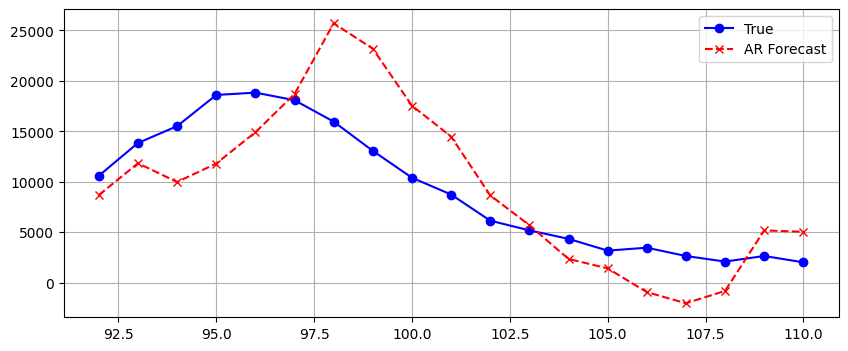

h: 1 MSE: 1699588.4988, MAE: 939.1421, SMAPE: 9.2718
h: 2 MSE: 2738512.4890, MAE: 1401.0968, SMAPE: 17.1202
h: 3 MSE: 3030779.0024, MAE: 1437.1079, SMAPE: 20.6351
h: 4 MSE: 7934626.0067, MAE: 2371.5544, SMAPE: 41.4355
h: 5 MSE: 14905757.6684, MAE: 3329.9282, SMAPE: 57.4618
model.coef_:[[ 1.22496555e+00 -3.26830677e-01 -2.88460706e-02 -6.30300205e-02
   4.74544278e-02 -4.98373152e-02  8.22663307e-03 -1.08240343e-02
   5.11107907e-03 -2.82257847e+01  4.40754980e+01 -2.33041832e+01]
 [ 1.23175645e+00 -4.42421066e-01 -5.88147694e-03 -7.02001768e-02
  -1.07200307e-01  5.03078560e-02  1.98187765e-02 -2.19743234e-02
   7.01039946e-03 -3.66902152e+01  5.20993490e+01 -2.55739922e+01]
 [ 1.14344708e+00 -4.83874127e-01  9.16370993e-02 -2.88680567e-01
   2.85155491e-02  3.29806417e-02  3.19631746e-02 -3.34339820e-02
   8.27028257e-03 -4.60067345e+01  5.99731132e+01 -2.50833601e+01]
 [ 1.00550994e+00 -4.63422686e-01  6.50942956e-03 -1.93053897e-01
   1.48982945e-03  3.77673120e-02  4.13569810e-02 -

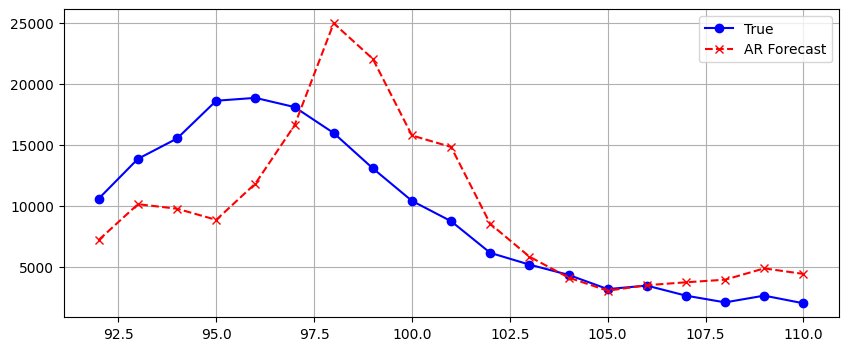

h: 1 MSE: 1637020.7812, MAE: 978.8057, SMAPE: 11.1078
h: 2 MSE: 2366005.7497, MAE: 1212.4463, SMAPE: 15.1592
h: 3 MSE: 3106646.6864, MAE: 1393.9188, SMAPE: 18.8342
h: 4 MSE: 7582146.5404, MAE: 2107.5300, SMAPE: 22.7656
h: 5 MSE: 13825275.7108, MAE: 2871.3901, SMAPE: 26.5888
model.coef_:[[ 1.24582529e+00 -3.13316649e-01 -3.83341733e-02 -3.98395858e-02
   1.34150195e-02 -4.35637345e-02  8.60837845e-03 -9.61378770e-03
   3.78961316e-03  1.14243383e-05 -2.56111010e-05  1.37296908e-05]
 [ 1.24162166e+00 -4.23289030e-01 -2.47769988e-02 -4.76571778e-02
  -1.64108107e-01  7.95392198e-02  2.08964275e-02 -2.15937032e-02
   6.49903013e-03  1.85123371e-05 -4.76313699e-05  2.83608598e-05]
 [ 1.11510489e+00 -4.44652530e-01  3.80050103e-02 -2.58866925e-01
  -4.78827496e-02  7.87329632e-02  3.33938938e-02 -3.41996133e-02
   9.43727397e-03  4.45857871e-05 -1.08897332e-04  6.32874837e-05]
 [ 9.46902982e-01 -4.29240779e-01 -4.45602556e-02 -1.83204114e-01
  -1.23534397e-01  1.56124037e-01  4.47375431e-02 

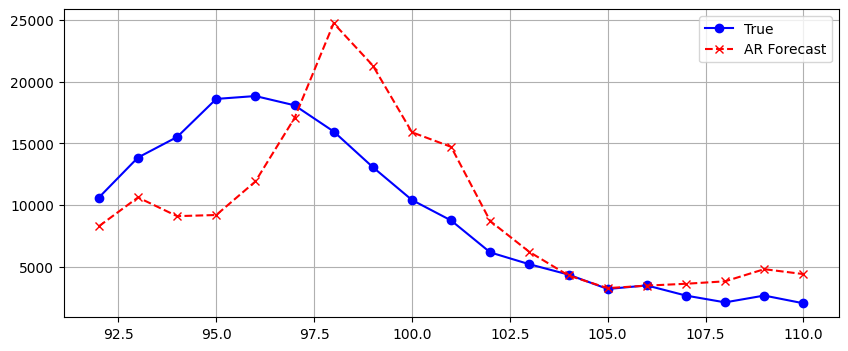

h: 1 MSE: 1518346.1713, MAE: 940.3606, SMAPE: 10.1636
h: 2 MSE: 2076976.2712, MAE: 1120.3209, SMAPE: 12.3668
h: 3 MSE: 2361056.4024, MAE: 1171.6648, SMAPE: 12.9561
h: 4 MSE: 6801505.2085, MAE: 2027.6232, SMAPE: 20.9501
h: 5 MSE: 13265899.5211, MAE: 2793.1565, SMAPE: 25.9543
model.coef_:[[ 1.24827857e+00 -3.22799336e-01 -2.43094950e-02 -4.97398472e-02
   4.34835227e-04 -1.94386716e-02  8.82796765e-03 -9.99028555e-03
   3.96677081e-03 -1.43148988e-05  2.06217757e-05 -6.74468126e-06]
 [ 1.23307951e+00 -4.30625805e-01 -1.34791761e-03 -6.72303764e-02
  -1.71625055e-01  9.60076591e-02  2.07782115e-02 -2.18336530e-02
   6.85784257e-03 -1.12186162e-05  3.68215546e-06  6.81733020e-06]
 [ 1.11695191e+00 -4.76609469e-01  1.00426136e-01 -3.01906522e-01
  -6.36971150e-02  1.15471787e-01  3.40957022e-02 -3.55681616e-02
   1.00783601e-02 -3.80249482e-05  4.60159773e-05 -9.00644874e-06]
 [ 9.41150319e-01 -4.59570092e-01  1.94423561e-02 -2.27334648e-01
  -1.25944633e-01  1.68343258e-01  4.49334676e-02 

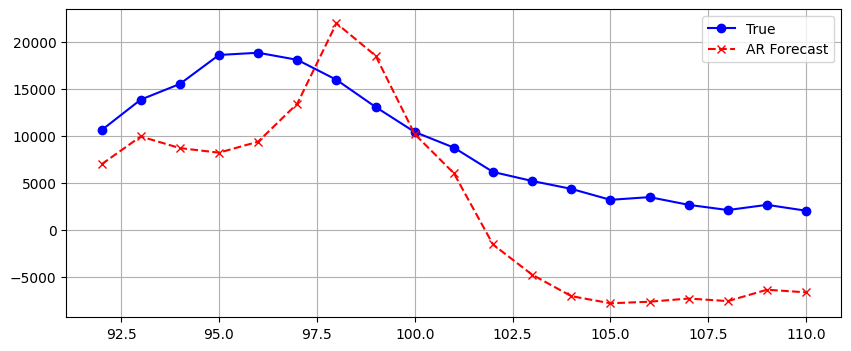

h: 1 MSE: 88818868.4034, MAE: 9022.8853, SMAPE: 62.7381
h: 2 MSE: 663589353.4963, MAE: 24011.0009, SMAPE: 199.4645
h: 3 MSE: 113077130.8887, MAE: 10148.9118, SMAPE: 132.3474
h: 4 MSE: 1010179726.5054, MAE: 29403.3949, SMAPE: 116.5996
h: 5 MSE: 3654105219.5481, MAE: 57131.9696, SMAPE: 145.8070
model.coef_:[[ 1.30984859e+00 -3.40017088e-01 -1.51375962e-02 -4.80166551e-02
  -1.06611513e-02 -3.84369595e-03  9.41956820e-03 -9.42097910e-03
   1.74046426e-03 -1.16223576e-04  2.49003379e-04 -1.17390050e-04]
 [ 1.36037988e+00 -4.79736396e-01  2.01717116e-02 -6.47206016e-02
  -1.53217837e-01  8.99274796e-02  2.23943305e-02 -2.20193192e-02
   3.47809981e-03 -3.22888365e-05  1.79180200e-04 -1.96636648e-04]
 [ 1.28126301e+00 -5.26995204e-01  1.18685807e-01 -2.74997775e-01
  -3.81723697e-02  8.29650840e-02  3.65134563e-02 -3.59500244e-02
   5.27853256e-03  2.80971419e-05 -4.12673306e-05 -6.34118189e-06]
 [ 1.14853773e+00 -5.12857791e-01  4.35812549e-02 -1.82794700e-01
  -1.10432609e-01  1.22776151e-

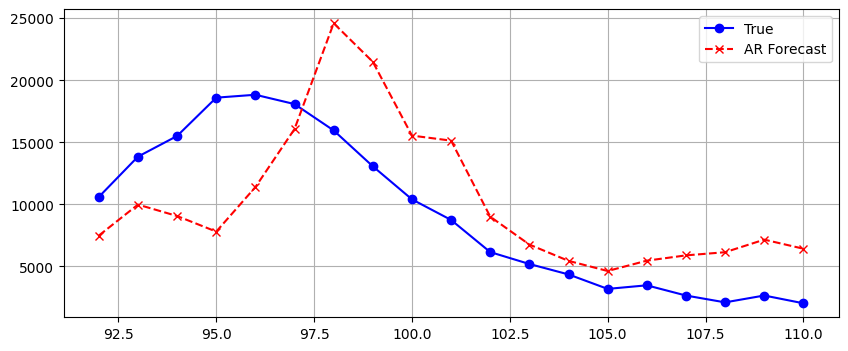

h: 1 MSE: 1518982.1918, MAE: 961.7610, SMAPE: 10.2456
h: 2 MSE: 2038374.1527, MAE: 1168.5988, SMAPE: 12.6765
h: 3 MSE: 2826998.5084, MAE: 1343.6616, SMAPE: 15.2963
h: 4 MSE: 8863774.3255, MAE: 2422.0673, SMAPE: 26.8882
h: 5 MSE: 16757960.5934, MAE: 3510.2620, SMAPE: 38.5372
model.coef_:[[ 1.27289992e+00 -3.24216381e-01 -3.12775735e-02 -5.25856186e-02
   8.43249626e-03 -1.41377909e-02  8.34177408e-03 -9.14208299e-03
   2.99825322e-03  1.41361392e-05  6.26732662e-05 -1.08845601e-04]
 [ 1.28184679e+00 -4.40558459e-01 -1.62581368e-02 -5.89388120e-02
  -1.80405163e-01  1.26220251e-01  2.00996726e-02 -2.04780024e-02
   5.23213231e-03  5.11103826e-05  4.37513873e-05 -1.71186480e-04]
 [ 1.17656269e+00 -4.85079469e-01  7.55940869e-02 -2.79895215e-01
  -9.24818972e-02  1.66751008e-01  3.29909325e-02 -3.35722508e-02
   7.95887716e-03  8.61709599e-05 -2.07015125e-05 -1.92247016e-04]
 [ 1.01800790e+00 -4.73885262e-01 -9.14824828e-03 -1.85235204e-01
  -1.99871576e-01  2.68358734e-01  4.41253091e-02 

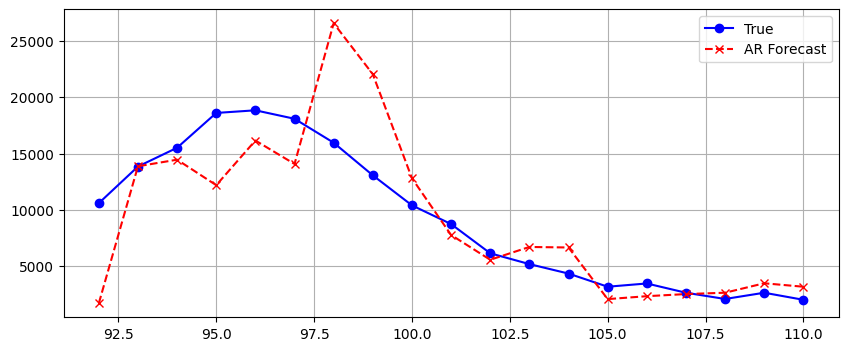

h: 1 MSE: 1913851.6744, MAE: 1031.8195, SMAPE: 10.2563
h: 2 MSE: 3822674.1776, MAE: 1529.3803, SMAPE: 14.8504
h: 3 MSE: 4760157.6972, MAE: 1700.5315, SMAPE: 16.7954
h: 4 MSE: 10544627.4621, MAE: 2354.4804, SMAPE: 25.4898
h: 5 MSE: 13363517.7447, MAE: 2595.9619, SMAPE: 28.9287
model.coef_:[[ 1.25713083e+00 -3.11137439e-01 -6.69688255e-02 -1.39290500e-02
   2.31064826e-02 -4.32126934e-02  3.22165888e-04 -2.66615676e-04
   9.79878704e-05  7.96494908e+02  3.77680122e+02  8.91490741e+01]
 [ 1.32221834e+00 -4.44435457e-01 -8.36200583e-02  2.56731612e-02
  -1.59432666e-01  3.47740638e-02  6.09626263e-04 -1.32342407e-04
  -1.56858072e-04  1.18882867e+03  4.78085727e+02  2.36983074e+01]
 [ 1.28698205e+00 -4.80478673e-01 -2.26075109e-02 -1.72761337e-01
  -5.85094872e-02  6.29465104e-04  1.11163447e-03 -2.04191463e-04
  -4.36054771e-04  1.29682135e+03  3.74907794e+02 -1.64556876e+02]
 [ 1.19394650e+00 -4.54731979e-01 -1.15660690e-01 -6.62683305e-02
  -1.42745001e-01  5.49021794e-03  1.54717643e-0

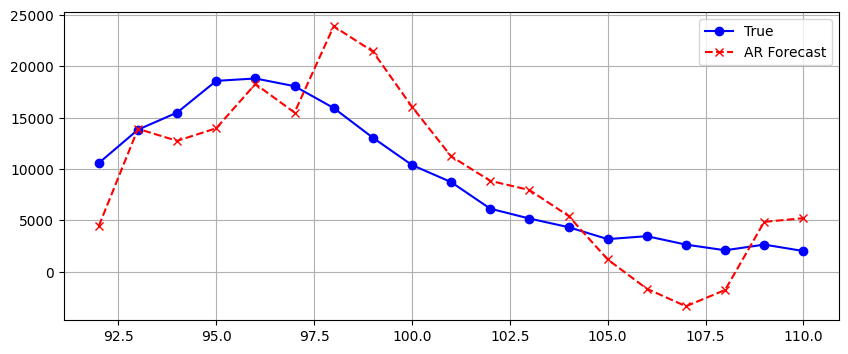

h: 1 MSE: 2005371.8435, MAE: 1041.2731, SMAPE: 10.7578
h: 2 MSE: 4401210.2677, MAE: 1724.1568, SMAPE: 21.0053
h: 3 MSE: 5103480.7961, MAE: 1895.3513, SMAPE: 31.6348
h: 4 MSE: 9737246.1475, MAE: 2686.6054, SMAPE: 49.6240
h: 5 MSE: 12747214.1835, MAE: 3142.1849, SMAPE: 58.4136
model.coef_:[[ 1.29204033e+00 -3.28706786e-01 -9.49825204e-02 -2.15167704e-02
   6.48686024e-02 -8.17128046e-02  2.10040113e-04 -3.04904575e-04
   2.22844076e-04 -2.86661011e+01  4.18335687e+01 -2.05366350e+01]
 [ 1.35637621e+00 -4.63014217e-01 -1.27459552e-01  2.44900959e-02
  -9.30609856e-02 -2.53003022e-02  3.78183197e-04 -1.48410932e-04
   5.88413700e-05 -4.03285247e+01  5.07238276e+01 -2.09229686e+01]
 [ 1.29833826e+00 -4.95254632e-01 -7.35210733e-02 -1.65444245e-01
   3.50809445e-02 -7.82012441e-02  7.80679190e-04 -1.76831466e-04
  -1.51921419e-04 -5.35404353e+01  6.30647901e+01 -2.10353205e+01]
 [ 1.17296403e+00 -4.64106533e-01 -1.68738439e-01 -4.91575270e-02
  -2.00146116e-02 -9.08114272e-02  1.12775784e-03

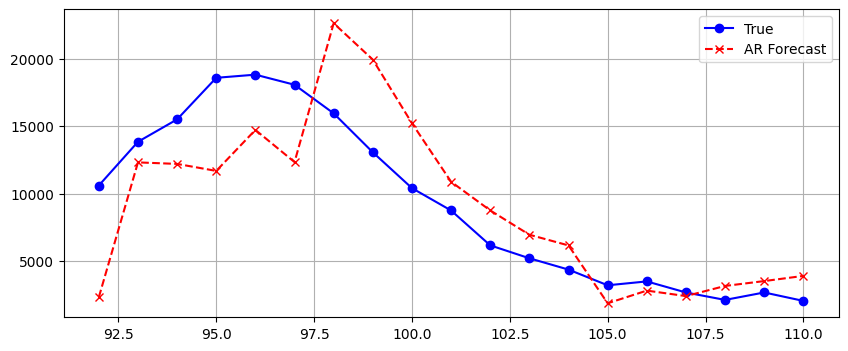

h: 1 MSE: 1888848.8517, MAE: 1012.1091, SMAPE: 11.3982
h: 2 MSE: 3890596.6314, MAE: 1515.7381, SMAPE: 18.4763
h: 3 MSE: 5149095.4230, MAE: 1610.4483, SMAPE: 24.5870
h: 4 MSE: 9729010.4223, MAE: 1992.8113, SMAPE: 28.6495
h: 5 MSE: 11185479.5924, MAE: 2558.1643, SMAPE: 30.6581
model.coef_:[[ 1.31323717e+00 -3.01411146e-01 -1.11327290e-01 -3.81299445e-03
   2.72219360e-02 -7.78253471e-02  3.21470402e-04 -3.10430445e-04
   1.36381708e-04  2.66813677e-05 -5.59846100e-05  2.89494256e-05]
 [ 1.37250127e+00 -4.19735656e-01 -1.74484617e-01  5.45610477e-02
  -1.50802261e-01 -1.39339362e-02  5.57798991e-04 -2.02486391e-04
  -5.73161678e-07  5.03738279e-05 -1.11228707e-04  6.01537242e-05]
 [ 1.27965131e+00 -4.22605035e-01 -1.85766894e-01 -1.06643147e-01
  -2.73791850e-02 -7.58180858e-02  9.58279860e-04 -3.10871332e-04
  -6.81276609e-05  9.19373694e-05 -2.03574023e-04  1.10573134e-04]
 [ 1.12574168e+00 -3.93254837e-01 -3.05181497e-01  1.68235942e-02
  -1.21171670e-01 -3.88341895e-02  1.31071103e-03

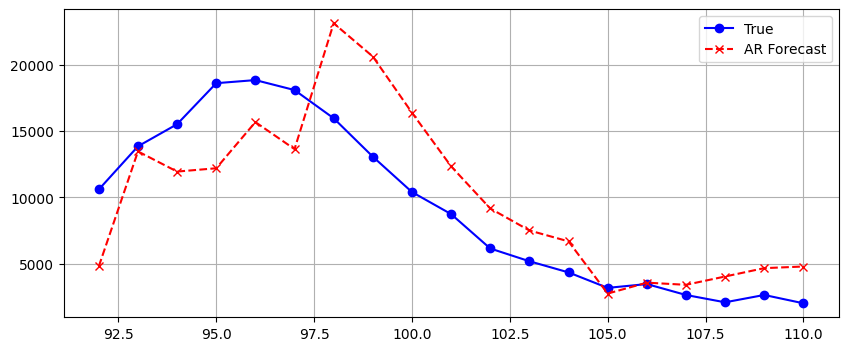

h: 1 MSE: 1760513.3397, MAE: 940.8003, SMAPE: 10.1906
h: 2 MSE: 3231912.1509, MAE: 1339.4385, SMAPE: 13.5059
h: 3 MSE: 3538661.7256, MAE: 1309.1521, SMAPE: 14.1523
h: 4 MSE: 7868498.0310, MAE: 1978.4711, SMAPE: 23.2666
h: 5 MSE: 10374186.6927, MAE: 2641.2834, SMAPE: 28.4446
model.coef_:[[ 1.31761542e+00 -3.21846342e-01 -8.02727220e-02 -2.01830631e-02
   1.17643539e-05 -3.26741433e-02  3.16158148e-04 -2.71823744e-04
   1.06697214e-04 -1.34620342e-05  1.65865901e-05 -3.40360552e-06]
 [ 1.36709880e+00 -4.52142522e-01 -1.19233094e-01  2.24701383e-02
  -1.84623838e-01  4.60839590e-02  4.93265497e-04 -1.12727525e-04
  -1.90323819e-05 -6.43852129e-06 -1.29459288e-05  1.88533462e-05]
 [ 1.28510728e+00 -4.89332342e-01 -6.93162993e-02 -1.67427112e-01
  -9.46707497e-02  3.47521426e-02  9.31499431e-04 -1.66397192e-04
  -1.81817117e-04 -4.05433122e-05  4.10930016e-05 -1.43670204e-06]
 [ 1.12502421e+00 -4.64643045e-01 -1.75198749e-01 -4.90175775e-02
  -1.87806818e-01  6.77163077e-02  1.28465179e-03 

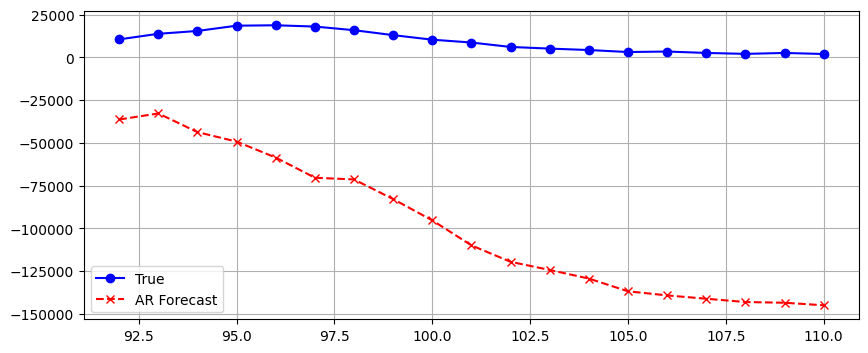

h: 1 MSE: 33984483.0291, MAE: 5335.5561, SMAPE: 82.4986
h: 2 MSE: 4370399021.9264, MAE: 62405.4845, SMAPE: 200.0000
h: 3 MSE: 5656648708.4809, MAE: 71645.7859, SMAPE: 200.0000
h: 4 MSE: 2767805139.6203, MAE: 50607.0021, SMAPE: 200.0000
h: 5 MSE: 1519876474.0058, MAE: 37208.9716, SMAPE: 200.0000
model.coef_:[[ 1.35630430e+00 -3.35386433e-01 -5.44240830e-02 -4.63484329e-02
   1.07879041e-02 -3.85766009e-02  3.88373377e-04 -3.05855738e-04
   2.60600966e-05 -1.24308200e-04  2.95616990e-04 -1.83391442e-04]
 [ 1.45551591e+00 -4.98874326e-01 -5.24420731e-02 -2.67293991e-02
  -1.20479526e-01 -5.79811941e-03  6.58285272e-04 -1.52836030e-04
  -2.27211613e-04 -5.34179463e-05  2.95291637e-04 -3.65771326e-04]
 [ 1.39834065e+00 -5.41489516e-01  1.66069352e-02 -2.16503002e-01
   6.38828171e-03 -7.17826227e-02  1.13349818e-03 -1.95625435e-04
  -4.74279865e-04 -1.50816765e-05  1.55307614e-04 -2.78245609e-04]
 [ 1.26515723e+00 -5.16176799e-01 -6.27701788e-02 -1.10330264e-01
  -7.32886655e-02 -7.20556733

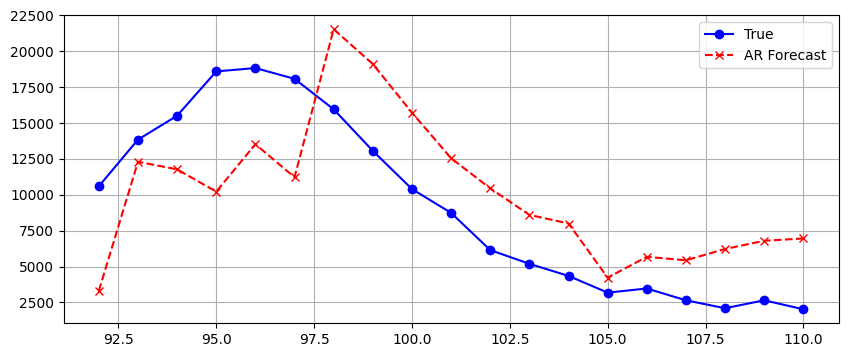

h: 1 MSE: 1762682.3824, MAE: 977.3140, SMAPE: 10.4106
h: 2 MSE: 3898679.7959, MAE: 1530.7695, SMAPE: 16.3529
h: 3 MSE: 5623298.2393, MAE: 1739.9888, SMAPE: 20.5209
h: 4 MSE: 11581608.2045, MAE: 2538.0222, SMAPE: 31.0222
h: 5 MSE: 14927485.5380, MAE: 3428.2245, SMAPE: 42.2884
model.coef_:[[ 1.32424138e+00 -3.18692551e-01 -9.87254347e-02 -4.28985968e-02
   5.58128968e-02 -6.93680347e-02  2.74529772e-04 -3.62872260e-04
   2.23842079e-04  2.73071253e-05  1.40677829e-04 -2.06108333e-04]
 [ 1.39392473e+00 -4.61357977e-01 -1.61904026e-01  2.51936576e-02
  -1.42898870e-01  1.90143109e-02  4.00382171e-04 -2.05599032e-04
   1.39217772e-04  1.42101845e-04  7.97526669e-05 -3.18557121e-04]
 [ 1.32321429e+00 -5.02765669e-01 -1.33710917e-01 -1.50923497e-01
  -5.94088021e-02  1.83230935e-02  7.56043177e-04 -2.48098301e-04
   3.71919558e-05  1.94935861e-04  2.50662770e-05 -3.81969126e-04]
 [ 1.18256683e+00 -4.89399423e-01 -2.46327009e-01 -1.80476736e-03
  -2.12930954e-01  1.09798516e-01  1.06783777e-03

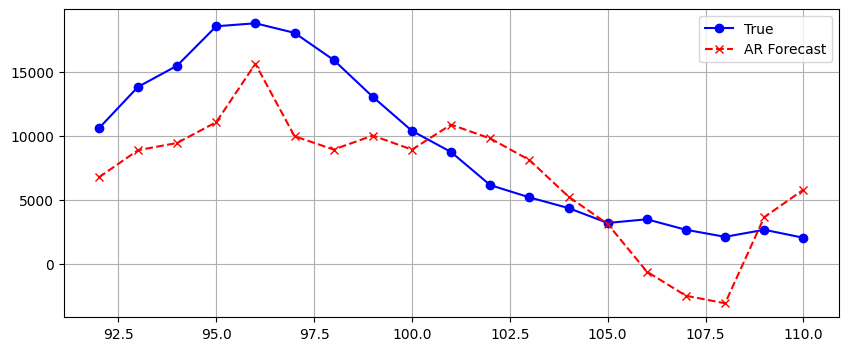

h: 1 MSE: 2181036.9171, MAE: 1083.5395, SMAPE: 11.4423
h: 2 MSE: 5692914.1949, MAE: 1966.8284, SMAPE: 21.3508
h: 3 MSE: 10103354.5890, MAE: 2522.6386, SMAPE: 35.4292
h: 4 MSE: 15947169.9220, MAE: 3134.5086, SMAPE: 47.9499
h: 5 MSE: 17314939.6958, MAE: 3505.1501, SMAPE: 56.8481
model.coef_:[[ 1.34125899e+00 -3.45114944e-01 -7.89442432e-02 -5.63703202e-03
   2.75599575e-02 -5.08611522e-02  3.75217760e+02 -5.97084061e+01
  -3.80059962e+02 -2.36148389e+01  3.32185446e+01 -1.56412375e+01]
 [ 1.51321660e+00 -5.02236462e-01 -1.43403661e-01  3.16822511e-02
  -1.24061066e-01  1.58908084e-02  3.49652759e+02 -3.52281065e+02
  -8.32000214e+02 -3.37756860e+01  3.66174649e+01 -1.34194894e+01]
 [ 1.58926283e+00 -5.87193103e-01 -1.42493395e-01 -1.45108102e-01
   2.06723659e-02 -4.59814594e-02  1.25791720e+02 -7.49330835e+02
  -1.31074893e+03 -4.74211231e+01  4.32975487e+01 -1.05585556e+01]
 [ 1.58415984e+00 -6.01460113e-01 -3.05148047e-01 -2.41470446e-02
   5.87273565e-03 -8.24940793e-02 -1.17175559e+

/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=7.6186e-20): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


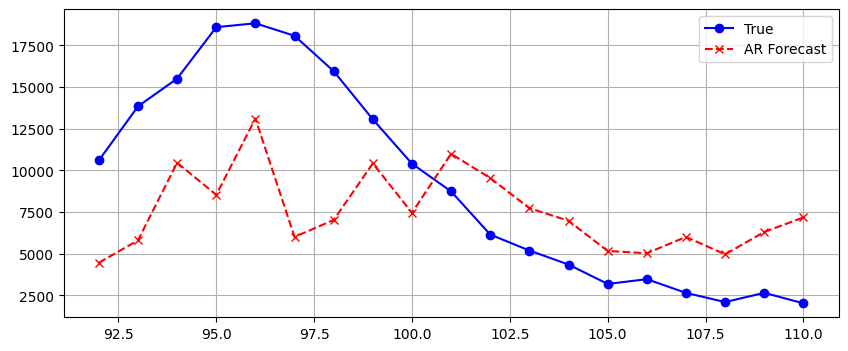

h: 1 MSE: 2182184.2746, MAE: 1166.0669, SMAPE: 12.2590
h: 2 MSE: 6014935.5597, MAE: 1971.2072, SMAPE: 19.8619
h: 3 MSE: 12871183.4654, MAE: 2543.3979, SMAPE: 25.5099
h: 4 MSE: 21564528.9405, MAE: 3472.3218, SMAPE: 38.1128
h: 5 MSE: 24639970.8759, MAE: 4133.7672, SMAPE: 49.2298
model.coef_:[[ 1.37438917e+00 -3.44899617e-01 -1.10368794e-01  1.92590867e-02
   5.11997624e-03 -4.31926116e-02  5.55295228e+02  6.93099805e+01
  -2.50349754e+02  2.50878039e-05 -5.10891460e-05  2.59521658e-05]
 [ 1.58565399e+00 -5.07692765e-01 -2.21342252e-01  8.04838828e-02
  -1.65150420e-01  3.41933002e-02  6.83278472e+02 -1.27272462e+02
  -6.41645111e+02  5.91826017e-05 -1.24041741e-04  6.47589040e-05]
 [ 1.69147926e+00 -5.81657803e-01 -2.90847295e-01 -5.97208998e-02
  -4.01889764e-02 -2.74658239e-02  5.62967534e+02 -4.86880659e+02
  -1.11821714e+03  1.14256520e-04 -2.39968913e-04  1.25493118e-04]
 [ 1.72872129e+00 -6.10560079e-01 -4.94247316e-01  7.95427846e-02
  -1.05975042e-01 -1.07559854e-02  4.35480796e+

/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=9.95858e-20): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


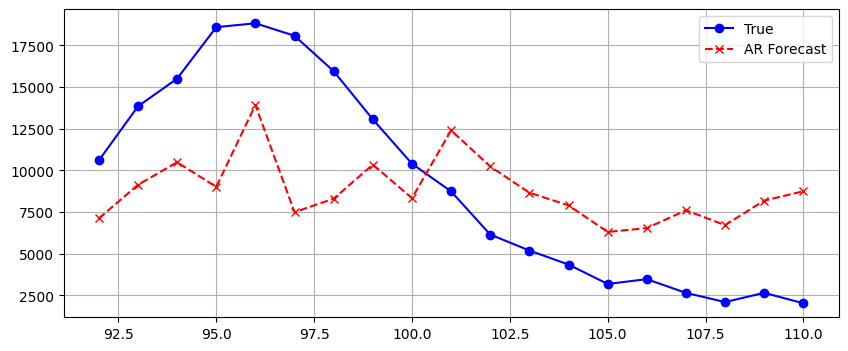

h: 1 MSE: 2229781.2175, MAE: 1197.3786, SMAPE: 12.2957
h: 2 MSE: 5770383.1160, MAE: 2081.2120, SMAPE: 20.9593
h: 3 MSE: 11321513.0645, MAE: 2821.5427, SMAPE: 30.3037
h: 4 MSE: 19598038.6122, MAE: 3670.4191, SMAPE: 41.7488
h: 5 MSE: 23524119.3332, MAE: 4316.3881, SMAPE: 51.6727
model.coef_:[[ 1.37788408e+00 -3.60629785e-01 -8.48670576e-02  1.49985595e-03
  -1.83861025e-02  1.15907432e-03  5.65071759e+02  8.16034377e+01
  -2.54991976e+02 -3.46856349e-06 -1.06045625e-06  4.61110943e-06]
 [ 1.57519763e+00 -5.29187011e-01 -1.58124290e-01  3.31003953e-02
  -2.01706700e-01  1.06613802e-01  6.73220451e+02 -1.25060324e+02
  -6.65682695e+02  2.21160390e-05 -6.51809895e-05  4.32723200e-05]
 [ 1.68840830e+00 -6.38551544e-01 -1.66933345e-01 -1.47178074e-01
  -1.03508519e-01  1.00590605e-01  5.79470484e+02 -4.66847313e+02
  -1.15844272e+03  2.14254687e-05 -7.81769819e-05  5.69668462e-05]
 [ 1.71288991e+00 -6.72639666e-01 -3.39770938e-01 -3.00931031e-02
  -1.72956815e-01  1.26670283e-01  4.30156562e+

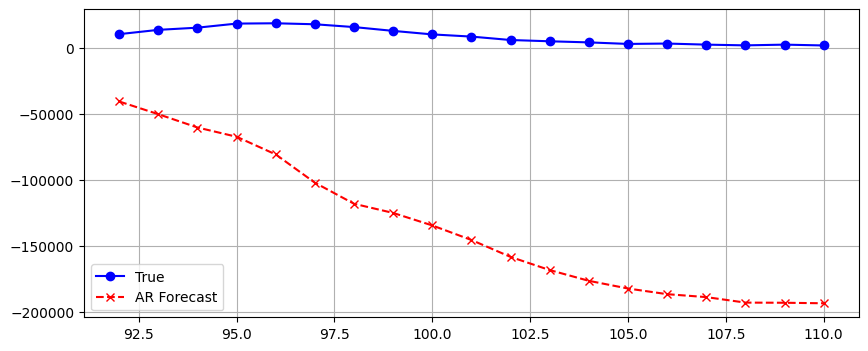

h: 1 MSE: 37225977.3613, MAE: 5529.5964, SMAPE: 84.0623
h: 2 MSE: 4768326076.0196, MAE: 65052.5232, SMAPE: 200.0000
h: 3 MSE: 7496672023.7823, MAE: 82242.8971, SMAPE: 200.0000
h: 4 MSE: 5609488926.2629, MAE: 71583.4475, SMAPE: 200.0000
h: 5 MSE: 5241191267.7750, MAE: 68791.5845, SMAPE: 200.0000
model.coef_:[[ 1.39468161e+00 -3.76993856e-01 -7.37383747e-02 -1.30216343e-02
   3.52804000e-03 -2.24113936e-02  6.06677587e+02  1.06669467e+02
  -2.22909032e+02 -9.44449531e-05  2.58231840e-04 -1.77069421e-04]
 [ 1.62885531e+00 -5.88967046e-01 -1.27966756e-01  7.77907143e-03
  -1.12552045e-01  2.30248006e-02  8.02432173e+02 -5.83272358e+01
  -6.11493069e+02  1.09244019e-05  2.27751426e-04 -3.69334114e-04]
 [ 1.76126034e+00 -7.18353857e-01 -1.29538610e-01 -1.63949713e-01
   3.39586272e-02 -4.59238210e-02  8.07333756e+02 -3.49829855e+02
  -1.06870816e+03  8.92678351e-05  6.09066176e-05 -3.11081429e-04]
 [ 1.81340208e+00 -7.76115156e-01 -2.88887564e-01 -4.76594111e-02
  -4.28497265e-03 -6.68285616

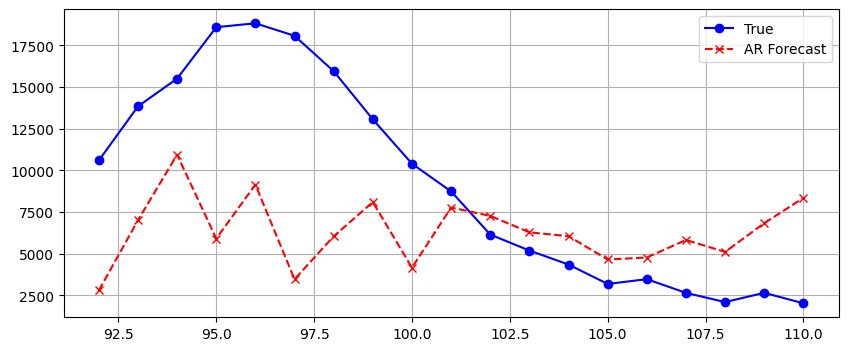

h: 1 MSE: 2193731.2323, MAE: 1134.4581, SMAPE: 12.4067
h: 2 MSE: 6580607.0864, MAE: 1901.3340, SMAPE: 20.2795
h: 3 MSE: 15243895.2228, MAE: 2796.4992, SMAPE: 29.1493
h: 4 MSE: 27644472.0517, MAE: 3736.5013, SMAPE: 41.3727
h: 5 MSE: 33969189.6897, MAE: 4488.8496, SMAPE: 53.8648
model.coef_:[[ 1.36320548e+00 -3.49173956e-01 -9.18442911e-02  3.74311452e-03
   1.55674958e-02 -5.48357796e-02  5.04380990e+02  3.96491768e+01
  -2.63248123e+02  8.70712581e-05  4.99119668e-05 -1.49588361e-04]
 [ 1.55768166e+00 -5.17809809e-01 -1.81135980e-01  6.00519747e-02
  -1.58554268e-01  1.12969787e-02  5.51719193e+02 -2.02681149e+02
  -6.73715383e+02  2.45715954e-04  3.02979099e-05 -3.18277970e-04]
 [ 1.65847606e+00 -6.18210935e-01 -2.08352007e-01 -9.16047467e-02
  -5.84086554e-02 -3.04484092e-02  3.90071646e+02 -5.80267069e+02
  -1.16048981e+03  4.12815269e-04 -3.09143419e-05 -4.64827801e-04]
 [ 1.68535754e+00 -6.54735574e-01 -3.97399588e-01  6.14692613e-02
  -1.54713327e-01 -2.76993989e-03  2.15499366e+

/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.00645e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


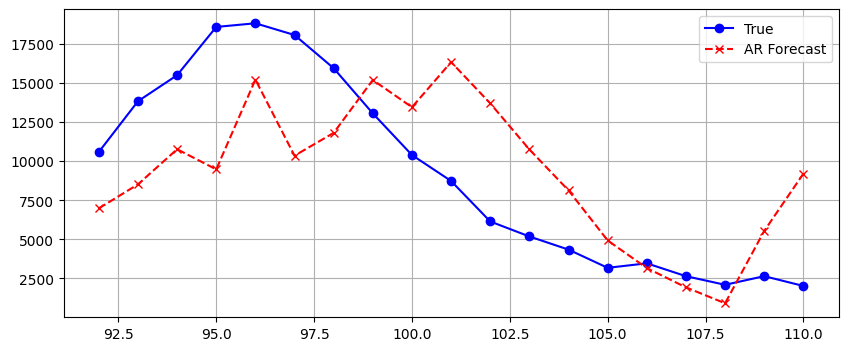

h: 1 MSE: 2324648.7384, MAE: 1163.7165, SMAPE: 12.0473
h: 2 MSE: 5612554.6473, MAE: 1975.2811, SMAPE: 20.0147
h: 3 MSE: 9885528.0296, MAE: 2503.7710, SMAPE: 28.3672
h: 4 MSE: 16164529.8597, MAE: 3075.8937, SMAPE: 39.1177
h: 5 MSE: 18929535.8777, MAE: 3645.5417, SMAPE: 45.8757
model.coef_:[[ 1.34917924e+00 -3.52130637e-01 -1.07779075e-01  1.10333212e-02
   3.25708871e-02 -6.00587130e-02 -2.49431782e+01  3.57022043e+01
  -1.73838211e+01  2.11139357e-05 -4.05977912e-05  1.96116536e-05]
 [ 1.49976378e+00 -5.03983632e-01 -2.00574824e-01  7.17606756e-02
  -1.39110182e-01  4.15449815e-02 -2.91816381e+01  3.02978652e+01
  -1.04471230e+01  4.45759789e-05 -9.25277628e-05  4.81950226e-05]
 [ 1.53183592e+00 -5.64770845e-01 -2.41630649e-01 -6.96893379e-02
  -1.71509310e-02  1.51981156e-02 -3.24170671e+01  2.17987838e+01
   3.94766995e-01  8.40656971e-05 -1.78043400e-04  9.42620421e-05]
 [ 1.50153047e+00 -5.78796617e-01 -4.10060562e-01  6.49938929e-02
  -8.17397354e-02  6.33323065e-02 -3.81503369e+0

/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.28623e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


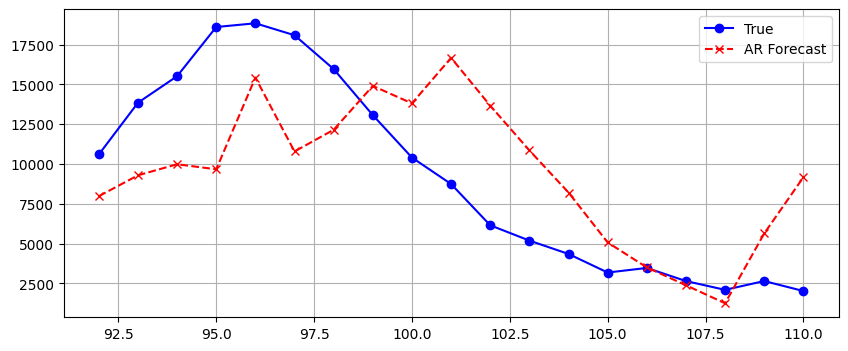

h: 1 MSE: 2407913.0218, MAE: 1204.0996, SMAPE: 12.2956
h: 2 MSE: 5710879.5478, MAE: 2012.9225, SMAPE: 19.6588
h: 3 MSE: 9632875.5425, MAE: 2435.4801, SMAPE: 24.9849
h: 4 MSE: 15887416.9142, MAE: 3050.7307, SMAPE: 35.5311
h: 5 MSE: 18948065.7545, MAE: 3595.4362, SMAPE: 43.0008
model.coef_:[[ 1.36511928e+00 -3.73334545e-01 -8.68807202e-02  6.91927298e-04
   8.53734528e-03 -1.63943101e-02 -2.42493037e+01  3.25328440e+01
  -1.49986894e+01 -2.01723072e-05  3.87716649e-05 -1.84187654e-05]
 [ 1.51824954e+00 -5.37912881e-01 -1.53175124e-01  4.23800119e-02
  -1.74405095e-01  1.05760405e-01 -2.66333668e+01  2.49494991e+01
  -7.14514798e+00 -1.51322934e-05  1.94180312e-05 -3.90980117e-06]
 [ 1.56863923e+00 -6.33795967e-01 -1.48324881e-01 -1.24806952e-01
  -7.05601171e-02  1.16836252e-01 -2.98599518e+01  1.46344951e+01
   5.51415677e+00 -4.14214962e-05  6.26916740e-05 -2.08529331e-05]
 [ 1.53463750e+00 -6.53186887e-01 -3.06030202e-01  4.60135328e-03
  -1.29358287e-01  1.53992612e-01 -3.47910552e+0

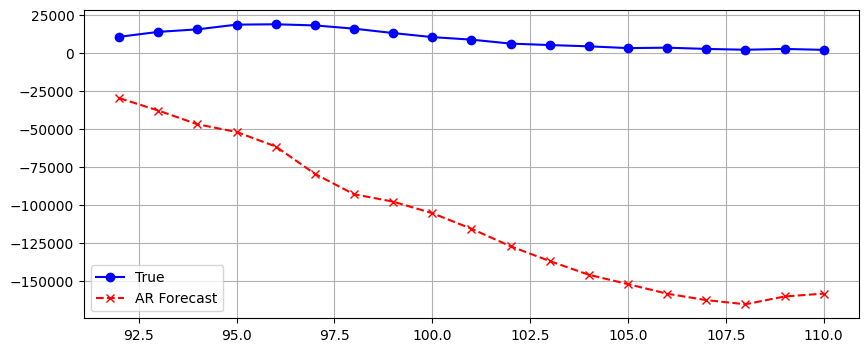

h: 1 MSE: 17303727.9365, MAE: 3711.5950, SMAPE: 64.6636
h: 2 MSE: 3945273797.3132, MAE: 59045.7517, SMAPE: 200.0000
h: 3 MSE: 5581123279.4884, MAE: 70796.0728, SMAPE: 200.0000
h: 4 MSE: 3309609563.0914, MAE: 54807.2769, SMAPE: 200.0000
h: 5 MSE: 2547257840.7769, MAE: 47517.7209, SMAPE: 200.0000
model.coef_:[[ 1.36561440e+00 -3.72926099e-01 -7.38336954e-02 -1.89305846e-02
   2.53847968e-02 -3.81886311e-02 -2.34222241e+01  3.21141565e+01
  -1.45452743e+01 -1.01924693e-04  2.61069058e-04 -1.67836560e-04]
 [ 1.52731327e+00 -5.57769572e-01 -1.21711225e-01  8.51738666e-03
  -8.60969456e-02  1.57481364e-02 -3.08550779e+01  3.09352224e+01
  -8.71347870e+00  7.60779849e-06  2.13907485e-04 -3.39817925e-04]
 [ 1.56848385e+00 -6.51818941e-01 -1.13720951e-01 -1.54807539e-01
   6.88930959e-02 -4.15886964e-02 -4.17134045e+01  3.36285318e+01
  -2.50178903e+00  9.45430505e-05  2.08651996e-05 -2.53666758e-04]
 [ 1.53192044e+00 -6.72689492e-01 -2.62691348e-01 -3.17259657e-02
   4.45432469e-02 -5.50457070

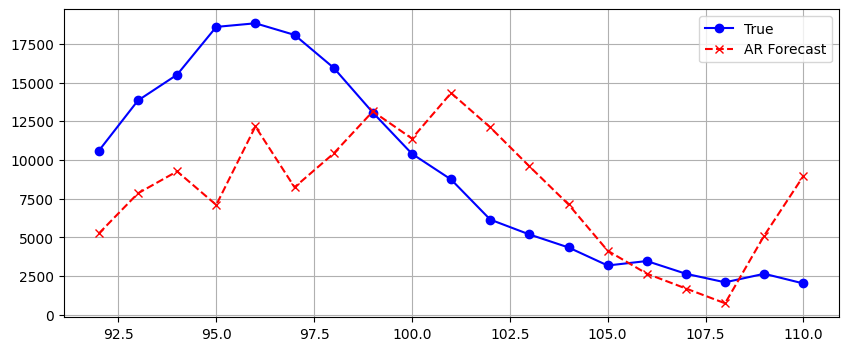

h: 1 MSE: 2326319.9035, MAE: 1123.8835, SMAPE: 12.0654
h: 2 MSE: 5840294.1833, MAE: 1924.8932, SMAPE: 20.7568
h: 3 MSE: 10871745.9229, MAE: 2613.4802, SMAPE: 31.1556
h: 4 MSE: 18850354.0936, MAE: 3417.3087, SMAPE: 43.4267
h: 5 MSE: 22128454.1643, MAE: 3868.7991, SMAPE: 51.9899
model.coef_:[[ 1.35186077e+00 -3.62694198e-01 -9.35572705e-02  9.35274628e-03
   2.89944070e-02 -6.78191742e-02 -2.31807526e+01  3.36300050e+01
  -1.61232180e+01  7.72898692e-05 -1.04539592e-05 -6.00522367e-05]
 [ 1.50053574e+00 -5.24880491e-01 -1.69157037e-01  6.82094515e-02
  -1.46705905e-01  2.04765330e-02 -2.36295973e+01  2.42557553e+01
  -7.57077334e+00  1.83097693e-04 -3.79327084e-05 -1.60661865e-04]
 [ 1.54171358e+00 -6.12372374e-01 -1.74459074e-01 -8.36328492e-02
  -4.32791542e-02  7.70304523e-03 -2.53437380e+01  1.42831579e+01
   4.12602574e+00  2.72500233e-04 -9.79292106e-05 -2.22721533e-04]
 [ 1.51010892e+00 -6.31807396e-01 -3.37887267e-01  6.58895362e-02
  -1.30480672e-01  6.29159578e-02 -3.11000606e+

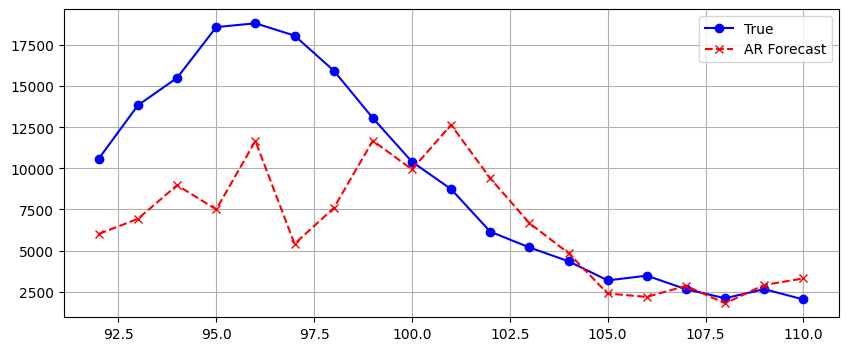

h: 1 MSE: 3313111.8992, MAE: 1601.0932, SMAPE: 16.7812
h: 2 MSE: 8285849.9881, MAE: 2221.1484, SMAPE: 27.6000
h: 3 MSE: 14075273.7659, MAE: 2721.8843, SMAPE: 33.2862
h: 4 MSE: 24833495.2043, MAE: 3715.2168, SMAPE: 55.1895
h: 5 MSE: 26717198.5963, MAE: 3799.6307, SMAPE: 49.2740
model.coef_:[[ 1.37676911e+00 -3.56265289e-01 -1.23464809e-01  2.89816665e-02
   1.50306985e-02 -8.75954499e-02  3.73349696e-05 -5.11130352e-05
   2.98920757e-05 -8.57642483e-05  9.23303036e-05 -2.42423180e-05]
 [ 1.55705285e+00 -5.26346114e-01 -1.65525695e-01  3.32851582e-02
  -1.59818387e-01  4.77745857e-02  3.67157233e-05 -2.40365328e-05
  -3.44681771e-05  8.02014003e-06 -9.96086990e-06  2.58583415e-05]
 [ 1.61421034e+00 -6.11600720e-01 -2.14601814e-01 -1.11783843e-01
  -3.75316138e-02  1.24893781e-02  8.76776583e-05 -1.12987292e-04
  -2.62620881e-07 -1.74264933e-05  3.19179372e-05  1.36102309e-05]
 [ 1.60325636e+00 -6.49717948e-01 -3.77137794e-01  2.67520782e-03
  -1.09062030e-01  7.79702006e-02  9.23819561e-

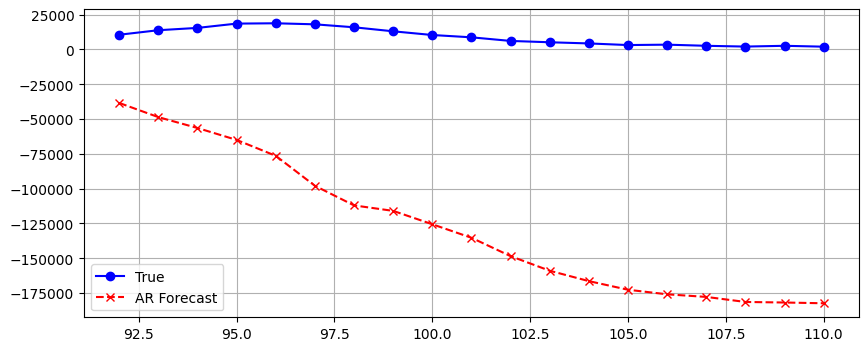

h: 1 MSE: 9565708.9651, MAE: 2588.8717, SMAPE: 51.0012
h: 2 MSE: 4109029204.7149, MAE: 60316.8478, SMAPE: 200.0000
h: 3 MSE: 6265540766.1367, MAE: 75210.3379, SMAPE: 200.0000
h: 4 MSE: 4672557276.1953, MAE: 65475.8236, SMAPE: 200.0000
h: 5 MSE: 4058263674.3156, MAE: 60679.6772, SMAPE: 200.0000
model.coef_:[[ 1.41299896e+00 -3.67172413e-01 -1.20354568e-01  1.01905917e-02
   1.03517337e-02 -5.79845261e-02  3.22878721e-05 -6.25468597e-05
   2.99920712e-05 -8.02553354e-05  2.40799022e-04 -1.67135863e-04]
 [ 1.62366203e+00 -5.64308630e-01 -2.13868632e-01  5.62703945e-02
  -1.23862756e-01  1.66471244e-02  6.32885591e-05 -1.31164472e-04
   6.77127079e-05  2.13108518e-05  2.12514707e-04 -3.55255603e-04]
 [ 1.70012883e+00 -6.58562256e-01 -2.70596516e-01 -7.73866514e-02
  -1.37263991e-03 -8.49638132e-03  1.11212130e-04 -2.36752963e-04
   1.25606623e-04  9.11103828e-05  5.05226160e-05 -2.89512588e-04]
 [ 1.71236435e+00 -7.07747744e-01 -4.51091250e-01  5.56173910e-02
  -8.71716592e-02  6.41340111e

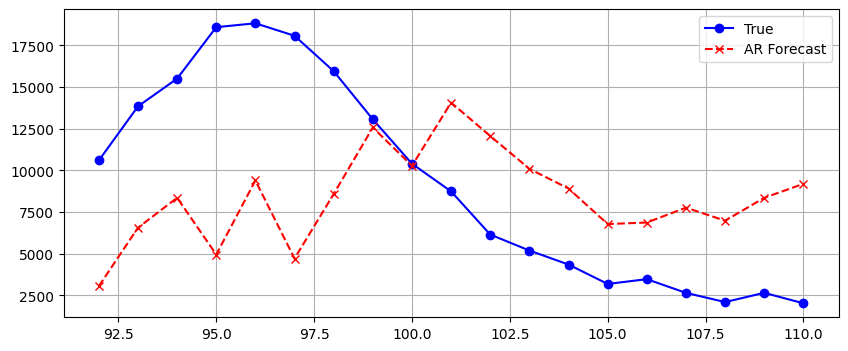

h: 1 MSE: 2940908.3526, MAE: 1302.6140, SMAPE: 14.2699
h: 2 MSE: 8739852.6732, MAE: 2300.7674, SMAPE: 24.8085
h: 3 MSE: 18345973.5734, MAE: 3474.0024, SMAPE: 38.0837
h: 4 MSE: 32096959.6947, MAE: 4716.2287, SMAPE: 54.1569
h: 5 MSE: 39911981.7890, MAE: 5561.4399, SMAPE: 66.9821
model.coef_:[[ 1.38865052e+00 -3.70909091e-01 -8.65894388e-02 -3.53112130e-03
   1.67394766e-02 -5.91792511e-02 -2.05634982e-07  1.83504728e-05
  -1.81096453e-05  6.89810703e-05  1.27856020e-05 -1.65608779e-04]
 [ 1.55957594e+00 -5.52473545e-01 -1.59540316e-01  4.64933876e-02
  -1.60063734e-01  2.99282563e-02  6.49786815e-06  3.26760932e-05
  -3.89182808e-05  1.62197564e-04 -8.04388082e-05 -3.07389683e-04]
 [ 1.61053938e+00 -6.31177413e-01 -2.12772006e-01 -7.85414745e-02
  -6.29818338e-02  8.46285010e-03  7.12656030e-05 -6.34508643e-05
  -7.35847678e-06  1.46720187e-04 -2.85737348e-04 -2.48746302e-04]
 [ 1.59194192e+00 -6.67927047e-01 -4.00218992e-01  8.35949356e-02
  -1.65021751e-01  6.62116609e-02  9.46770176e-

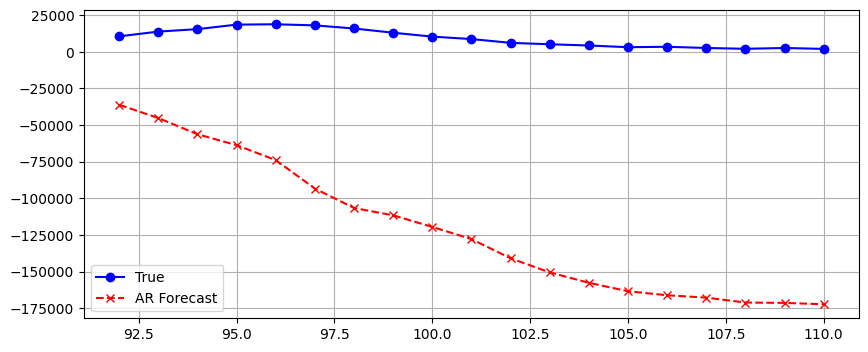

h: 1 MSE: 45310974.0366, MAE: 6149.5154, SMAPE: 89.8782
h: 2 MSE: 4543840612.1672, MAE: 63661.2537, SMAPE: 200.0000
h: 3 MSE: 7061753269.5821, MAE: 80109.1114, SMAPE: 200.0000
h: 4 MSE: 4961814424.2626, MAE: 67717.9461, SMAPE: 200.0000
h: 5 MSE: 3785620969.2287, MAE: 58895.0578, SMAPE: 200.0000
model.coef_:[[ 1.42365386e+00 -3.90829986e-01 -8.28306940e-02 -1.55504906e-02
  -1.64927606e-02 -1.69435418e-04 -2.43611489e-07 -7.56044376e-06
   7.79678712e-06 -9.69116039e-05  2.63491765e-04 -1.81002011e-04]
 [ 1.61867199e+00 -5.93649676e-01 -1.36392793e-01  1.47689527e-03
  -1.61941512e-01  1.01886640e-01  1.78907976e-05 -5.80761879e-05
   4.05488687e-05 -1.09465223e-05  2.47093537e-04 -3.64326369e-04]
 [ 1.70112308e+00 -7.20399204e-01 -1.32952581e-01 -1.71190160e-01
  -5.91148066e-02  1.22543227e-01  8.67646184e-06 -5.65205023e-05
   4.86638236e-05  4.55725520e-05  9.84119578e-05 -3.01732593e-04]
 [ 1.69217754e+00 -7.68095786e-01 -2.86624662e-01 -5.63753258e-02
  -1.43786900e-01  1.94625514

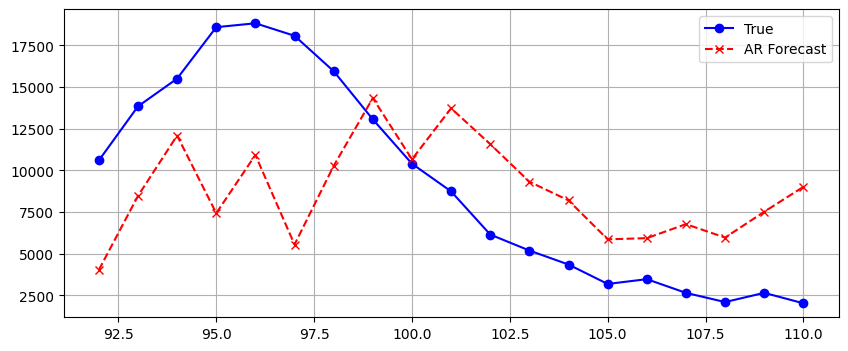

h: 1 MSE: 1942519.6262, MAE: 1026.0697, SMAPE: 10.9904
h: 2 MSE: 4625146.3225, MAE: 1638.3000, SMAPE: 16.4274
h: 3 MSE: 10699791.1435, MAE: 2437.2355, SMAPE: 24.8970
h: 4 MSE: 21246308.1304, MAE: 3461.2339, SMAPE: 38.2165
h: 5 MSE: 23935864.9094, MAE: 4001.5707, SMAPE: 48.7327
model.coef_:[[ 1.37436751e+00 -3.64183639e-01 -1.09682679e-01  2.08108628e-02
   1.89859335e-02 -9.52064400e-02 -8.88571955e-05  1.18161689e-04
  -2.95741384e-05  1.73474732e-04  1.42045953e-04 -1.00605380e-04]
 [ 1.55397812e+00 -5.48914864e-01 -2.01644167e-01  8.70833467e-02
  -1.65182757e-01 -7.84596001e-03 -1.06104935e-04  1.43212464e-04
  -3.72719935e-05  3.47164271e-04  1.24702971e-04 -2.52133660e-04]
 [ 1.63464511e+00 -6.78200297e-01 -2.35890983e-01 -3.52458331e-02
  -8.22386866e-02 -1.90744166e-02 -1.55931463e-04  2.52474753e-04
  -9.66394508e-05  6.13176599e-04  3.18402611e-05 -4.89390795e-04]
 [ 1.63546490e+00 -7.35548358e-01 -4.24223039e-01  1.33550927e-01
  -1.94193121e-01  4.93003579e-02 -1.64756906e-

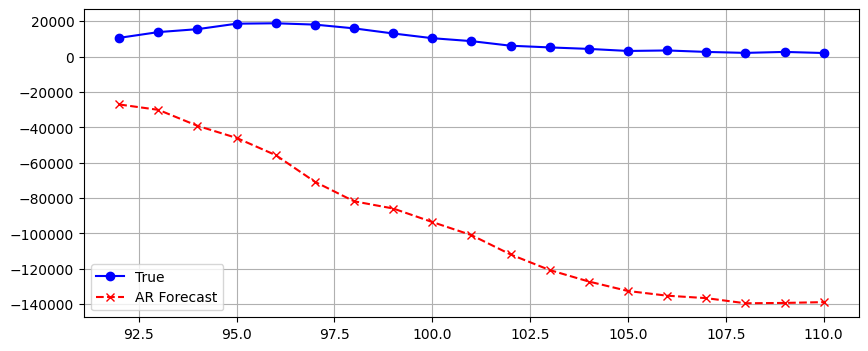

h: 1 MSE: 2394520.0150, MAE: 1067.3820, SMAPE: 10.5926
h: 2 MSE: 3080453406.7787, MAE: 52215.1921, SMAPE: 200.0000
h: 3 MSE: 3956269293.8141, MAE: 59775.2194, SMAPE: 200.0000
h: 4 MSE: 2113914703.8745, MAE: 44047.7062, SMAPE: 200.0000
h: 5 MSE: 1320768748.2251, MAE: 34484.1187, SMAPE: 199.1246
model.coef_:[[ 1.39815151e+00 -3.74218543e-01 -9.77501977e-02  4.91337936e-03
  -3.50232177e-03 -4.81249763e-02 -1.37892606e-04  3.33509840e-04
  -1.96988248e-04  1.63141273e-04 -1.38711143e-05 -1.61570040e-04]
 [ 1.58306321e+00 -5.74783517e-01 -1.72138879e-01  5.93981678e-02
  -1.55806771e-01  1.66873262e-02 -6.49883037e-05  3.62897557e-04
  -4.03350755e-04  3.35531250e-04 -1.03753146e-04 -2.70363035e-04]
 [ 1.64077468e+00 -6.87060522e-01 -1.86680319e-01 -8.73809005e-02
  -4.21921646e-02 -1.76037878e-02 -1.26925141e-05  2.36223237e-04
  -3.40982121e-04  4.69043469e-04 -1.53130387e-04 -3.88882166e-04]
 [ 1.61994893e+00 -7.30087082e-01 -3.61593627e-01  7.01504554e-02
  -1.46345179e-01  2.71943752e

/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.22185e-18): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=8.13377e-18): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=3.04342e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=3.96171e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


avg MSE: 14613992.3779, MAE: 2892.6160, SMAPE: 41.6739

 p:5, q:1, variables: Index(['new_deaths', 'hosp_patients', 'people_vaccinated'], dtype='object') 
avg MSE: 20384254.2733, MAE: 3603.7458, SMAPE: 66.6989

 p:5, q:1, variables: Index(['new_deaths', 'hosp_patients', 'people_fully_vaccinated'], dtype='object') 
avg MSE: 20196160.4307, MAE: 3600.8310, SMAPE: 66.6965

 p:5, q:1, variables: Index(['new_deaths', 'hosp_patients', 'total_boosters'], dtype='object') 
avg MSE: 224891257.4213, MAE: 12782.8831, SMAPE: 145.1393

 p:5, q:1, variables: Index(['new_deaths', 'hosp_patients', 'new_vaccinations'], dtype='object') 
avg MSE: 19855222.5491, MAE: 3556.3667, SMAPE: 37.9732

 p:5, q:1, variables: Index(['new_deaths', 'new_tests', 'positive_rate'], dtype='object') 
avg MSE: 12880706.3791, MAE: 2555.1052, SMAPE: 23.9943

 p:5, q:1, variables: Index(['new_deaths', 'new_tests', 'tests_per_case'], dtype='object') 
avg MSE: 10261047.5029, MAE: 2508.1834, SMAPE: 37.0801

 p:5, q:1, variables: In

/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=3.72876e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=4.47267e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.22492e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.59772e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


avg MSE: 11428390.5562, MAE: 2509.8115, SMAPE: 32.8056

 p:5, q:2, variables: Index(['new_deaths', 'hosp_patients', 'people_fully_vaccinated'], dtype='object') 
avg MSE: 10155181.9701, MAE: 2312.6384, SMAPE: 26.0438

 p:5, q:2, variables: Index(['new_deaths', 'hosp_patients', 'total_boosters'], dtype='object') 
avg MSE: 899357985.4591, MAE: 20230.5462, SMAPE: 94.4010

 p:5, q:2, variables: Index(['new_deaths', 'hosp_patients', 'new_vaccinations'], dtype='object') 
avg MSE: 11279443.4414, MAE: 2413.6897, SMAPE: 26.0992

 p:5, q:2, variables: Index(['new_deaths', 'new_tests', 'positive_rate'], dtype='object') 
avg MSE: 11623332.4405, MAE: 2484.3067, SMAPE: 25.1725

 p:5, q:2, variables: Index(['new_deaths', 'new_tests', 'tests_per_case'], dtype='object') 
avg MSE: 9641752.5941, MAE: 2533.1980, SMAPE: 41.2743

 p:5, q:2, variables: Index(['new_deaths', 'new_tests', 'people_vaccinated'], dtype='object') 
avg MSE: 9669799.1463, MAE: 2149.2016, SMAPE: 29.7793

 p:5, q:2, variables: Index(['n

/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.11774e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.43483e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=7.56547e-20): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=9.92036e-20): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


avg MSE: 8442451.7472, MAE: 2093.4753, SMAPE: 23.0009

 p:5, q:3, variables: Index(['new_deaths', 'hosp_patients', 'total_boosters'], dtype='object') 
avg MSE: 821902664.9894, MAE: 23816.2801, SMAPE: 141.8964

 p:5, q:3, variables: Index(['new_deaths', 'hosp_patients', 'new_vaccinations'], dtype='object') 
avg MSE: 9874132.7277, MAE: 2345.8805, SMAPE: 26.4677

 p:5, q:3, variables: Index(['new_deaths', 'new_tests', 'positive_rate'], dtype='object') 
avg MSE: 9841111.1581, MAE: 2164.4723, SMAPE: 22.4053

 p:5, q:3, variables: Index(['new_deaths', 'new_tests', 'tests_per_case'], dtype='object') 
avg MSE: 9786142.1869, MAE: 2570.5867, SMAPE: 43.2955

 p:5, q:3, variables: Index(['new_deaths', 'new_tests', 'people_vaccinated'], dtype='object') 
avg MSE: 8864623.4103, MAE: 2081.1832, SMAPE: 28.0959

 p:5, q:3, variables: Index(['new_deaths', 'new_tests', 'people_fully_vaccinated'], dtype='object') 
avg MSE: 7250353.2114, MAE: 1916.6465, SMAPE: 21.5391

 p:5, q:3, variables: Index(['new_deat

/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.11665e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.43374e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.39349e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.82212e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


avg MSE: 245901915.3036, MAE: 8564.6814, SMAPE: 39.7367

 p:4, q:1, variables: Index(['new_deaths', 'new_cases', 'tests_per_case'], dtype='object') 
avg MSE: 184616331.2803, MAE: 7561.2927, SMAPE: 49.2001

 p:4, q:1, variables: Index(['new_deaths', 'new_cases', 'people_vaccinated'], dtype='object') 
avg MSE: 227840310.6285, MAE: 8701.1303, SMAPE: 73.0803

 p:4, q:1, variables: Index(['new_deaths', 'new_cases', 'people_fully_vaccinated'], dtype='object') 
avg MSE: 225098817.6339, MAE: 8659.4809, SMAPE: 72.7085

 p:4, q:1, variables: Index(['new_deaths', 'new_cases', 'total_boosters'], dtype='object') 
avg MSE: 194928697.5758, MAE: 11473.9963, SMAPE: 118.0398

 p:4, q:1, variables: Index(['new_deaths', 'new_cases', 'new_vaccinations'], dtype='object') 
avg MSE: 221038132.2383, MAE: 8513.6768, SMAPE: 48.0456

 p:4, q:1, variables: Index(['new_deaths', 'reproduction_rate', 'icu_patients'], dtype='object') 
avg MSE: 6213063.2771, MAE: 1893.4613, SMAPE: 22.4284

 p:4, q:1, variables: Index([

/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=3.07172e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=4.01064e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


avg MSE: 169483704.9428, MAE: 7083.8324, SMAPE: 51.1819

 p:4, q:2, variables: Index(['new_deaths', 'new_cases', 'people_vaccinated'], dtype='object') 
avg MSE: 234408213.2770, MAE: 8149.3389, SMAPE: 49.4936

 p:4, q:2, variables: Index(['new_deaths', 'new_cases', 'people_fully_vaccinated'], dtype='object') 
avg MSE: 224322002.3915, MAE: 7900.1833, SMAPE: 41.8230

 p:4, q:2, variables: Index(['new_deaths', 'new_cases', 'total_boosters'], dtype='object') 
avg MSE: 1314874530.5704, MAE: 25186.6128, SMAPE: 104.1863

 p:4, q:2, variables: Index(['new_deaths', 'new_cases', 'new_vaccinations'], dtype='object') 
avg MSE: 193916723.7083, MAE: 7503.0877, SMAPE: 41.8515

 p:4, q:2, variables: Index(['new_deaths', 'reproduction_rate', 'icu_patients'], dtype='object') 
avg MSE: 4096477.8119, MAE: 1552.0257, SMAPE: 22.3470

 p:4, q:2, variables: Index(['new_deaths', 'reproduction_rate', 'hosp_patients'], dtype='object') 
avg MSE: 8715118.4328, MAE: 2011.9478, SMAPE: 25.2875

 p:4, q:2, variables: I

/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=5.80071e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=7.3422e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.2176e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.59137e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


avg MSE: 11484374.5245, MAE: 2473.2263, SMAPE: 27.4537

 p:4, q:2, variables: Index(['new_deaths', 'new_tests', 'positive_rate'], dtype='object') 
avg MSE: 11715718.1329, MAE: 2501.6107, SMAPE: 25.1487

 p:4, q:2, variables: Index(['new_deaths', 'new_tests', 'tests_per_case'], dtype='object') 
avg MSE: 9111943.0011, MAE: 2441.2475, SMAPE: 39.8750

 p:4, q:2, variables: Index(['new_deaths', 'new_tests', 'people_vaccinated'], dtype='object') 
avg MSE: 9848477.0406, MAE: 2148.4120, SMAPE: 29.7537

 p:4, q:2, variables: Index(['new_deaths', 'new_tests', 'people_fully_vaccinated'], dtype='object') 
avg MSE: 7384999.6533, MAE: 1948.8547, SMAPE: 22.2558

 p:4, q:2, variables: Index(['new_deaths', 'new_tests', 'total_boosters'], dtype='object') 
avg MSE: 627920437.7770, MAE: 18795.0943, SMAPE: 114.3287

 p:4, q:2, variables: Index(['new_deaths', 'new_tests', 'new_vaccinations'], dtype='object') 
avg MSE: 12010639.2982, MAE: 2712.7407, SMAPE: 33.2913

 p:4, q:2, variables: Index(['new_deaths', 

/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.18692e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.5022e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=7.50601e-20): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=9.84938e-20): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


avg MSE: 8918795.4012, MAE: 2108.5611, SMAPE: 22.0078

 p:4, q:3, variables: Index(['new_deaths', 'new_tests', 'tests_per_case'], dtype='object') 
avg MSE: 10672602.4855, MAE: 2694.3534, SMAPE: 44.4931

 p:4, q:3, variables: Index(['new_deaths', 'new_tests', 'people_vaccinated'], dtype='object') 
avg MSE: 8628342.0736, MAE: 2002.5412, SMAPE: 26.3254

 p:4, q:3, variables: Index(['new_deaths', 'new_tests', 'people_fully_vaccinated'], dtype='object') 
avg MSE: 7050380.3354, MAE: 1914.5182, SMAPE: 21.6133

 p:4, q:3, variables: Index(['new_deaths', 'new_tests', 'total_boosters'], dtype='object') 
avg MSE: 2994676262.6411, MAE: 43304.2934, SMAPE: 167.8876

 p:4, q:3, variables: Index(['new_deaths', 'new_tests', 'new_vaccinations'], dtype='object') 
avg MSE: 11260647.0681, MAE: 2533.1431, SMAPE: 30.4915

 p:4, q:3, variables: Index(['new_deaths', 'positive_rate', 'tests_per_case'], dtype='object') 
avg MSE: 11626413.2742, MAE: 2717.7830, SMAPE: 42.4862

 p:4, q:3, variables: Index(['new_dea

/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.66418e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=2.13741e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=2.01229e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=2.63733e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


avg MSE: 219294589.7753, MAE: 8411.6775, SMAPE: 67.5469

 p:3, q:1, variables: Index(['new_deaths', 'new_cases', 'total_boosters'], dtype='object') 
avg MSE: 173089162.7287, MAE: 10779.1753, SMAPE: 113.5592

 p:3, q:1, variables: Index(['new_deaths', 'new_cases', 'new_vaccinations'], dtype='object') 
avg MSE: 217136959.9158, MAE: 8493.8043, SMAPE: 48.5902

 p:3, q:1, variables: Index(['new_deaths', 'reproduction_rate', 'icu_patients'], dtype='object') 
avg MSE: 6863739.3345, MAE: 1989.2251, SMAPE: 22.0875

 p:3, q:1, variables: Index(['new_deaths', 'reproduction_rate', 'hosp_patients'], dtype='object') 
avg MSE: 9942460.7888, MAE: 2257.7488, SMAPE: 22.3493

 p:3, q:1, variables: Index(['new_deaths', 'reproduction_rate', 'new_tests'], dtype='object') 
avg MSE: 6477111.4173, MAE: 1865.2965, SMAPE: 20.7636

 p:3, q:1, variables: Index(['new_deaths', 'reproduction_rate', 'positive_rate'], dtype='object') 
avg MSE: 9758653.6407, MAE: 2328.5438, SMAPE: 24.9251

 p:3, q:1, variables: Index(['

/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=3.11988e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=4.08728e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


avg MSE: 1241624798.1554, MAE: 24377.1557, SMAPE: 102.6205

 p:3, q:2, variables: Index(['new_deaths', 'new_cases', 'new_vaccinations'], dtype='object') 
avg MSE: 188424311.1962, MAE: 7601.5771, SMAPE: 43.8298

 p:3, q:2, variables: Index(['new_deaths', 'reproduction_rate', 'icu_patients'], dtype='object') 
avg MSE: 4551749.9509, MAE: 1603.0353, SMAPE: 21.3088

 p:3, q:2, variables: Index(['new_deaths', 'reproduction_rate', 'hosp_patients'], dtype='object') 
avg MSE: 9222063.7153, MAE: 2006.0781, SMAPE: 24.0297

 p:3, q:2, variables: Index(['new_deaths', 'reproduction_rate', 'new_tests'], dtype='object') 
avg MSE: 5726411.7454, MAE: 1741.0984, SMAPE: 21.0152

 p:3, q:2, variables: Index(['new_deaths', 'reproduction_rate', 'positive_rate'], dtype='object') 
avg MSE: 9491429.9445, MAE: 2266.1362, SMAPE: 24.4813

 p:3, q:2, variables: Index(['new_deaths', 'reproduction_rate', 'tests_per_case'], dtype='object') 
avg MSE: 8444619.5127, MAE: 2322.1821, SMAPE: 35.0766

 p:3, q:2, variables: I

/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=2.12042e-18): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=2.77247e-18): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.23903e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.62345e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


avg MSE: 8551890.7051, MAE: 1934.9369, SMAPE: 24.1600

 p:3, q:2, variables: Index(['new_deaths', 'new_tests', 'people_fully_vaccinated'], dtype='object') 
avg MSE: 6896897.0946, MAE: 1934.8361, SMAPE: 22.4354

 p:3, q:2, variables: Index(['new_deaths', 'new_tests', 'total_boosters'], dtype='object') 
avg MSE: 625193939.7371, MAE: 18841.6173, SMAPE: 115.5589

 p:3, q:2, variables: Index(['new_deaths', 'new_tests', 'new_vaccinations'], dtype='object') 
avg MSE: 12281372.4721, MAE: 2738.8477, SMAPE: 33.8000

 p:3, q:2, variables: Index(['new_deaths', 'positive_rate', 'tests_per_case'], dtype='object') 
avg MSE: 10221513.9607, MAE: 2507.3453, SMAPE: 36.8193

 p:3, q:2, variables: Index(['new_deaths', 'positive_rate', 'people_vaccinated'], dtype='object') 
avg MSE: 15263569.8456, MAE: 2880.9598, SMAPE: 32.1452

 p:3, q:2, variables: Index(['new_deaths', 'positive_rate', 'people_fully_vaccinated'], dtype='object') 
avg MSE: 14570840.3851, MAE: 3038.8862, SMAPE: 34.9419

 p:3, q:2, variables

avg MSE: 8185675.9381, MAE: 2348.7914, SMAPE: 37.4936

 p:3, q:3, variables: Index(['new_deaths', 'new_tests', 'people_vaccinated'], dtype='object') 
avg MSE: 8165578.8943, MAE: 1938.8871, SMAPE: 23.7138

 p:3, q:3, variables: Index(['new_deaths', 'new_tests', 'people_fully_vaccinated'], dtype='object') 
avg MSE: 6964792.8703, MAE: 1983.8640, SMAPE: 22.8466


/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=2.3052e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=3.0011e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=7.60777e-20): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=9.97193e-20): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T



 p:3, q:3, variables: Index(['new_deaths', 'new_tests', 'total_boosters'], dtype='object') 
avg MSE: 2461407646.0643, MAE: 38092.2870, SMAPE: 159.7812

 p:3, q:3, variables: Index(['new_deaths', 'new_tests', 'new_vaccinations'], dtype='object') 
avg MSE: 12288391.4235, MAE: 2660.4308, SMAPE: 32.1231

 p:3, q:3, variables: Index(['new_deaths', 'positive_rate', 'tests_per_case'], dtype='object') 
avg MSE: 9523448.0273, MAE: 2418.7772, SMAPE: 37.0785

 p:3, q:3, variables: Index(['new_deaths', 'positive_rate', 'people_vaccinated'], dtype='object') 
avg MSE: 14045576.6629, MAE: 2740.4706, SMAPE: 31.1625

 p:3, q:3, variables: Index(['new_deaths', 'positive_rate', 'people_fully_vaccinated'], dtype='object') 
avg MSE: 12733693.2206, MAE: 2852.3896, SMAPE: 33.2046

 p:3, q:3, variables: Index(['new_deaths', 'positive_rate', 'total_boosters'], dtype='object') 
avg MSE: 4851382987.6444, MAE: 56128.6728, SMAPE: 174.5005

 p:3, q:3, variables: Index(['new_deaths', 'positive_rate', 'new_vaccinati

/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.91984e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=2.48296e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


In [19]:
import numpy as np
import pandas as pd
from sklearn.linear_model import Ridge
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

def SMAPE(pred, true, pr = True):
    df = pd.DataFrame()
    df['pred'] = pred
    df['true'] = true
    if pr:
        print("df",df)
    return 200*np.mean(np.abs( pred - true)  / ( np.abs(true) + np.abs(pred) )  )


def create_lagged_matrix(y, X, p, q,h):
    """
    Construct lagged matrices for ARX(p, q) model.
    p: number of lags for endogenous y
    q: number of lags for exogenous X (excluding contemporaneous)
    """
    n_obs = len(y)
    lagged_data = []
    for i in range(max(p, q), n_obs-h+1):
        row = []
        # Add lags for y
        for lag in range(1, p + 1):
            row.append(y[i - lag])
        # Add lags for X
#         for lag in range(1, q + 1):
#             row.extend(X[i - lag])
        for feat in range(X.shape[1]):
            for lag in range(1, q + 1):
                row.append(X[i - lag, feat])
        lagged_data.append(row)
        
    Y_target = []
    for i in range(h):
        Y_target.append(y[max(p, q)+i:n_obs-(h-i) +1])
    return np.array(lagged_data), np.array(Y_target).transpose()

# Example data
np.random.seed(42)
n = 200
y = np.random.randn(n)           # Endogenous
X = np.random.randn(n, 2)        # Two exogenous variables

# --- Load and preprocess data ---
df = pd.read_csv("./../dataset/rag_data/data/covid_19_weekly_2.csv")  # replace with actual file path
vnames = ['new_deaths','new_cases','reproduction_rate','icu_patients','hosp_patients','new_tests','positive_rate','tests_per_case','people_vaccinated','people_fully_vaccinated','total_boosters','new_vaccinations']
data = df[vnames]  # endogenous + exogenous

split = int(len(data)*0.8)

# data = np.log1p(data)


# split = int(len(y)*0.8)
print("split:",split)

# X_lagged_test

# Parameters
p = 6  # lags for y
q = 0  # lags for X
h=6

from itertools import combinations


combos = list(combinations(vnames[1:], 2))

for p_ in range(p,int(p/2)-1,-1):
    for q_ in range(1,int(p/2)+1):
        for combo in combos:
            
            new_vnames = [vnames[0]]
            new_vnames.extend(combo)
            
            data = df[new_vnames ]  
            print(f"\n p:{p_}, q:{q_}, variables: {data.columns} ")
            
            
            scaler = StandardScaler()
            scaler.fit(np.array(data)[:split,:])
            dataS = np.array(data) #scaler.transform(data)
            y= dataS[:,0]
            XX= dataS[:,1:]        

            
            
            # Create lagged dataset
            X_lagged_train, y_target_train = create_lagged_matrix(y[:split], XX[:split], p_, q_,h)
            X_lagged_test, y_target_test = create_lagged_matrix(y[split-max(p_,q_) :], XX[split-max(p_,q_) :], p_, q_, h)

            
            
            # Fit model
            model = Ridge(alpha=7.0) #alpha=7.0) #alpha=35.0)

#             print("X_lagged_train.shape",X_lagged_train.shape, "y_target_train.shape", y_target_train.shape)
#             print("X_lagged_test.shape",X_lagged_test.shape, "y_target_test.shape", y_target_test.shape)
           
#             print("y_target_test[:4,:]:",y_target_test[:])
        
            model.fit(X_lagged_train, y_target_train)

            # Predict
            y_pred = model.predict(X_lagged_test)
            if p_ == 6 and q_ == 3:
                print(f"X:{X_lagged_test[:5,:]}  y:{y_target_test[:,-1]} y_pred:{y_pred[:,-1]}",) #19,6
                
                plt.figure(figsize=(10, 4))
                plt.plot(split + np.array(range(len(y_pred[:,-6]))),y_target_test[:,-1],  color='blue', marker='o', linestyle='-', label="True")
                plt.plot(split + np.array(range(len(y_pred[:,-6]))),y_pred[:,-1] , label="AR Forecast", color='red', linestyle='--', marker='x')
#                 plt.title(f"Horizon {i+1}")
                plt.legend()
                plt.grid()
                plt.show()

            smape_list = []; mse_list=[]; mae_list=[]

            # Evaluate
            for i in range(h):
#                 print("i:",i,"y_pred",y_pred[:4])

                # denormalize
                dummy = np.zeros((len(y_pred), dataS.shape[1]))
                dummy[:,0] = y_pred[:,i]
                denorm_y_pred = dummy[:,0] #scaler.inverse_transform(dummy)[:,0]


                # denormalize
                dummy = np.zeros((len(y_target_test), dataS.shape[1]))
                dummy[:,0] = y_target_test[:,i]
                denorm_y_target_test = dummy[:,0]  #scaler.inverse_transform(dummy)[:,0]

                if i == 5 and p_ == 6 and q_ == 3:
                    print(f"model.coef_:{model.coef_}, model.intercept_:{model.intercept_}, model.coef_.shape:{model.coef_.shape}")
                    pv = True 
                else: pv = False
                smape = SMAPE(denorm_y_target_test,denorm_y_pred, pv)
                mse = mean_squared_error(y_target_test[:,i], y_pred[:,i])
                mae = mean_absolute_error(y_target_test[:,i], y_pred[:,i])
                if p_ == 6 and q_ == 3:
                    print(f"h: {i+1} MSE: {mse:.4f}, MAE: {mae:.4f}, SMAPE: {smape:.4f}")

                smape_list.append(smape); mse_list.append(mse); mae_list.append(mae); 

#             print(f"model.coef_:{model.coef_}, model.intercept_:{model.intercept_}, model.coef_.shape:{model.coef_.shape}")
            print(f"avg MSE: {np.mean(mse_list):.4f}, MAE: {np.mean(mae_list):.4f}, SMAPE: {np.mean(smape_list):.4f}")


            #     plt.figure(figsize=(10, 4))
            #     plt.plot(split + np.array(range(len(denorm_y_target_test))),denorm_y_target_test,  color='blue', marker='o', linestyle='-', label="True")
            #     plt.plot(split + np.array(range(len(denorm_y_target_test))),denorm_y_pred , label="AR Forecast", color='red', linestyle='--', marker='x')
            #     plt.title(f"Horizon {i+1}")
            #     plt.legend()
            #     plt.grid()
            #     plt.show()

            # MSE: 0.8548, MAE: 0.7255

### sample

In [2]:
import numpy as np
import pandas as pd
from sklearn.linear_model import Ridge
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

def SMAPE(pred, true, pr = True):
    return 200*np.mean(np.abs( pred - true)  / ( np.abs(true) + np.abs(pred) )  )


def create_lagged_matrix(y, X, p, q,h):
    """
    Construct lagged matrices for ARX(p, q) model.
    p: number of lags for endogenous y
    q: number of lags for exogenous X (excluding contemporaneous)
    """
    n_obs = len(y)
    lagged_data = []
    for i in range(max(p, q), n_obs-h+1):
        row = []
        # Add lags for y
        for lag in range(1, p + 1):
            row.append(y[i - lag])
        # Add lags for X
#         for lag in range(1, q + 1):
#             row.extend(X[i - lag])
        for feat in range(X.shape[1]):
            for lag in range(1, q + 1):
                row.append(X[i - lag, feat])
        lagged_data.append(row)
        
    Y_target = []
    for i in range(h):
        Y_target.append(y[max(p, q)+i:n_obs-(h-i) +1])
    return np.array(lagged_data), np.array(Y_target).transpose()



# --- Load and preprocess data ---
df = pd.read_csv("./../dataset/rag_data/data/covid_19_weekly_2.csv")  # replace with actual file path
vnames = ['new_deaths','icu_patients','positive_rate']
data = df[vnames]  # endogenous + exogenous

split = int(len(data)*0.8)



print("split:",split)


# Parameters
p_ = 6  # lags for y
q_ = 3  # lags for X
h=6


print(f"\n p:{p_}, q:{q_}, variables: {data.columns} ")


scaler = StandardScaler()
scaler.fit(np.array(data)[:split,:])
dataS = np.array(data) #scaler.transform(data)
y= dataS[:,0]
XX= dataS[:,1:]        


# Create lagged dataset
X_lagged_train, y_target_train = create_lagged_matrix(y[:split], XX[:split], p_, q_,h)
X_lagged_test, y_target_test = create_lagged_matrix(y[split-max(p_,q_) :], XX[split-max(p_,q_) :], p_, q_, h)

print("X_lagged_test.shape:",X_lagged_test)

# Fit model
model = Ridge(alpha=1000000) 


model.fit(X_lagged_train, y_target_train)

# Predict
y_pred = model.predict(X_lagged_test)
# if p_ == 6 and q_ == 3:
#     print(f"X:{X_lagged_test[:5,:]}  y:{y_target_test[:,-1]} y_pred:{y_pred[:,-1]}",) #19,6

#     plt.figure(figsize=(10, 4))
#     plt.plot(split + np.array(range(len(y_pred[:,-6]))),y_target_test[:,-1],  color='blue', marker='o', linestyle='-', label="True")
#     plt.plot(split + np.array(range(len(y_pred[:,-6]))),y_pred[:,-1] , label="AR Forecast", color='red', linestyle='--', marker='x')
# #                 plt.title(f"Horizon {i+1}")
#     plt.legend()
#     plt.grid()
#     plt.show()

smape_list = []; mse_list=[]; mae_list=[]

# Evaluate
for i in range(h):

    # denormalize
    dummy = np.zeros((len(y_pred), dataS.shape[1]))
    dummy[:,0] = y_pred[:,i]
    denorm_y_pred = dummy[:,0]


    # denormalize
    dummy = np.zeros((len(y_target_test), dataS.shape[1]))
    dummy[:,0] = y_target_test[:,i]
    denorm_y_target_test = dummy[:,0] 


    smape = SMAPE(denorm_y_target_test,denorm_y_pred)
    mse = mean_squared_error(y_target_test[:,i], y_pred[:,i])
    mae = mean_absolute_error(y_target_test[:,i], y_pred[:,i])

    print(f"h: {i+1} MSE: {mse:.4f}, MAE: {mae:.4f}, SMAPE: {smape:.4f}")

    smape_list.append(smape); mse_list.append(mse); mae_list.append(mae); 

print(f"avg MSE: {np.mean(mse_list):.4f}, MAE: {np.mean(mae_list):.4f}, SMAPE: {np.mean(smape_list):.4f}")


split: 92

 p:6, q:3, variables: Index(['new_deaths', 'icu_patients', 'positive_rate'], dtype='object') 
X_lagged_test.shape: [[6.78900e+03 1.03480e+04 7.40900e+03 7.58300e+03 9.08600e+03 1.11680e+04
  8.70200e+04 8.14620e+04 7.90340e+04 4.70000e-01 4.20000e-01 3.90000e-01]
 [7.22600e+03 6.78900e+03 1.03480e+04 7.40900e+03 7.58300e+03 9.08600e+03
  9.53020e+04 8.70200e+04 8.14620e+04 5.30000e-01 4.70000e-01 4.20000e-01]
 [8.25600e+03 7.22600e+03 6.78900e+03 1.03480e+04 7.40900e+03 7.58300e+03
  1.03830e+05 9.53020e+04 8.70200e+04 5.00000e-01 5.30000e-01 4.70000e-01]
 [9.00200e+03 8.25600e+03 7.22600e+03 6.78900e+03 1.03480e+04 7.40900e+03
  1.11154e+05 1.03830e+05 9.53020e+04 5.50000e-01 5.00000e-01 5.30000e-01]
 [1.16670e+04 9.00200e+03 8.25600e+03 7.22600e+03 6.78900e+03 1.03480e+04
  1.13375e+05 1.11154e+05 1.03830e+05 8.60000e-01 5.50000e-01 5.00000e-01]
 [9.17000e+03 1.16670e+04 9.00200e+03 8.25600e+03 7.22600e+03 6.78900e+03
  1.24172e+05 1.13375e+05 1.11154e+05 1.54000e+00 8.600

#### weather

In [20]:
import numpy as np
import pandas as pd
from sklearn.linear_model import Ridge
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

def SMAPE(pred, true, pr = True):
    return 200*np.mean(np.abs( pred - true)  / ( np.abs(true) + np.abs(pred) )  )


def create_lagged_matrix(y, X, p, q,h):
    """
    Construct lagged matrices for ARX(p, q) model.
    p: number of lags for endogenous y
    q: number of lags for exogenous X (excluding contemporaneous)
    """
    n_obs = len(y)
    lagged_data = []
    for i in range(max(p, q), n_obs-h+1):
        row = []
        # Add lags for y
        for lag in range(1, p + 1):
            row.append(y[i - lag])
        # Add lags for X
#         for lag in range(1, q + 1):
#             row.extend(X[i - lag])
        for feat in range(X.shape[1]):
            for lag in range(1, q + 1):
                row.append(X[i - lag, feat])
        lagged_data.append(row)
        
    Y_target = []
    for i in range(h):
        Y_target.append(y[max(p, q)+i:n_obs-(h-i) +1])
    return np.array(lagged_data), np.array(Y_target).transpose()



# --- Load and preprocess data ---
df = pd.read_csv("./../dataset/weather/weather.csv")  # replace with actual file path

vnames = ['OT','T (degC)','p (mbar)'] #,'rh (%)']
data = df[vnames]  # endogenous + exogenous

split = int(len(data)*0.8)

print("split:",split)


# Parameters
p_ = 6  # lags for y
q_ = 3  # lags for X
h=96


print(f"\n p:{p_}, q:{q_}, variables: {data.columns} ")


scaler = StandardScaler()
scaler.fit(np.array(data)[:split,:])
dataS = scaler.transform(data)
y= dataS[:,0]
XX= dataS[:,1:]        


# Create lagged dataset
X_lagged_train, y_target_train = create_lagged_matrix(y[:split], XX[:split], p_, q_,h)
X_lagged_test, y_target_test = create_lagged_matrix(y[split-max(p_,q_) :], XX[split-max(p_,q_) :], p_, q_, h)

# print("X_lagged_test.shape:",X_lagged_test)

# Fit model
model = Ridge(alpha=0) 


model.fit(X_lagged_train, y_target_train)

# Predict
y_pred = model.predict(X_lagged_test)
# if p_ == 6 and q_ == 3:
#     print(f"X:{X_lagged_test[:5,:]}  y:{y_target_test[:,-1]} y_pred:{y_pred[:,-1]}",) #19,6

#     plt.figure(figsize=(10, 4))
#     plt.plot(split + np.array(range(len(y_pred[:,-6]))),y_target_test[:,-1],  color='blue', marker='o', linestyle='-', label="True")
#     plt.plot(split + np.array(range(len(y_pred[:,-6]))),y_pred[:,-1] , label="AR Forecast", color='red', linestyle='--', marker='x')
# #                 plt.title(f"Horizon {i+1}")
#     plt.legend()
#     plt.grid()
#     plt.show()

smape_list = []; mse_list=[]; mae_list=[]

# Evaluate
for i in range(h):

    # denormalize
    dummy = np.zeros((len(y_pred), dataS.shape[1]))
    dummy[:,0] = y_pred[:,i]
    denorm_y_pred = scaler.inverse_transform(dummy)[:,0] #dummy[:,0]


    # denormalize
    dummy = np.zeros((len(y_target_test), dataS.shape[1]))
    dummy[:,0] = y_target_test[:,i]
    denorm_y_target_test = scaler.inverse_transform(dummy)[:,0] #dummy[:,0] 


    smape = SMAPE(denorm_y_target_test,denorm_y_pred)
    mse = mean_squared_error(y_target_test[:,i], y_pred[:,i])
    mae = mean_absolute_error(y_target_test[:,i], y_pred[:,i])

#     print(f"h: {i+1} MSE: {mse:.4f}, MAE: {mae:.4f}, SMAPE: {smape:.4f}")

    smape_list.append(smape); mse_list.append(mse); mae_list.append(mae); 

print(f"avg MSE: {np.mean(mse_list):.4f}, MAE: {np.mean(mae_list):.4f}, SMAPE: {np.mean(smape_list):.4f}")


split: 42156

 p:6, q:3, variables: Index(['OT', 'T (degC)', 'p (mbar)'], dtype='object') 


/home/fs47816/.local/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


avg MSE: 0.0077, MAE: 0.0690, SMAPE: 5.8146


In [3]:
import numpy as np
import pandas as pd
from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Set seed for reproducibility
np.random.seed(42)

# Generate synthetic dataset
n_samples = 200
n_features = 5

X = np.random.randn(n_samples, n_features)
coef = np.array([1.5, -2.0, 0.0, 0.5, 3.0])
y = X @ coef + np.random.randn(n_samples) * 0.5

# Split into train/test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Train Ridge Regression in Python
alpha_val = 7.0
ridge_model = Ridge(alpha=alpha_val)
ridge_model.fit(X_train_scaled, y_train)

# Predict and evaluate
y_pred = ridge_model.predict(X_test_scaled)
mse = mean_squared_error(y_test, y_pred)

{
    "alpha": alpha_val,
    "python_coefficients": ridge_model.coef_,
    "intercept": ridge_model.intercept_,
    "mse_python": mse
}


{'alpha': 7.0,
 'python_coefficients': array([ 1.31768221, -1.92353744,  0.01751275,  0.45095734,  3.0293371 ]),
 'intercept': 0.4337333108062275,
 'mse_python': 0.25648777335572437}

/home/fs47816/.local/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


split: 92
X_lagged_train.shape (84, 5) y_target_train.shape (84, 6)
X_lagged_test.shape (19, 5) y_target_test.shape (19, 6)
y_pred.shape (19, 6)
MSE: 0.0674, MAE: 0.2160, SMAPE: 12.6652


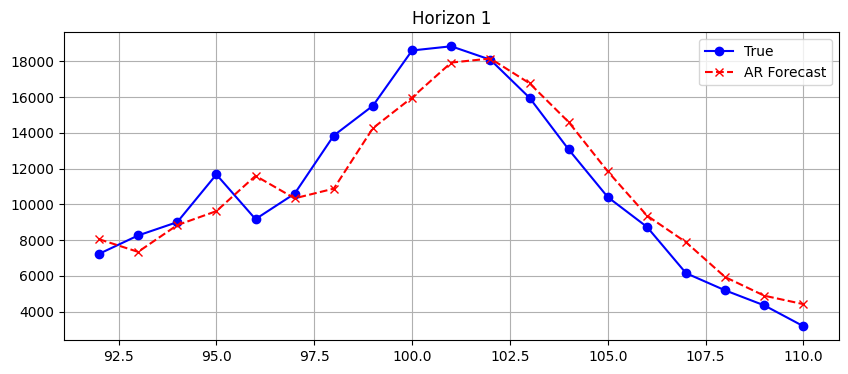

MSE: 0.1398, MAE: 0.3226, SMAPE: 18.5648


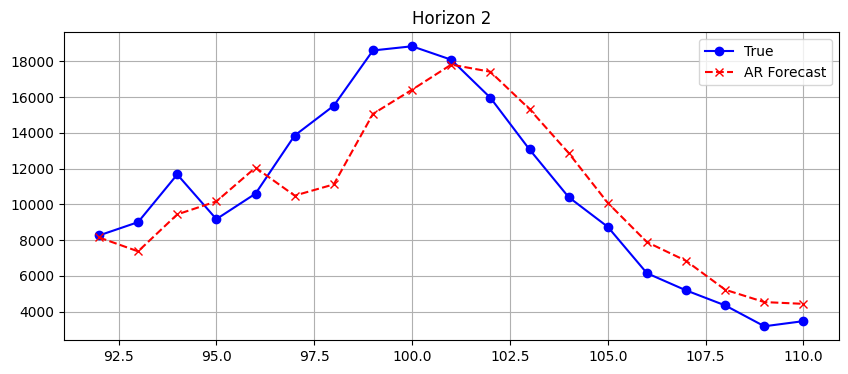

MSE: 0.2657, MAE: 0.4188, SMAPE: 25.1586


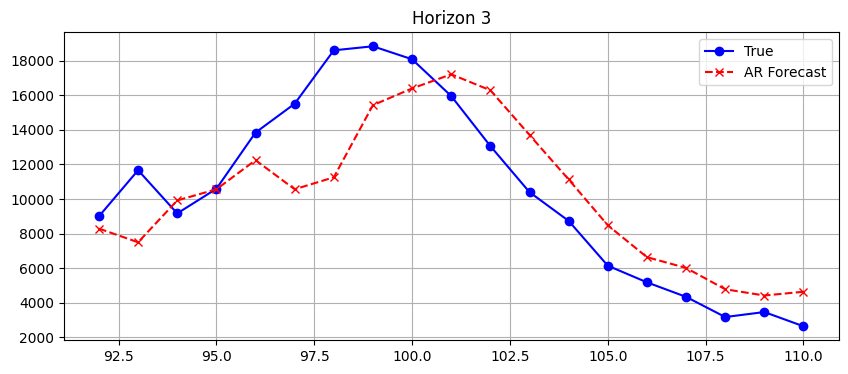

MSE: 0.3954, MAE: 0.5188, SMAPE: 32.9493


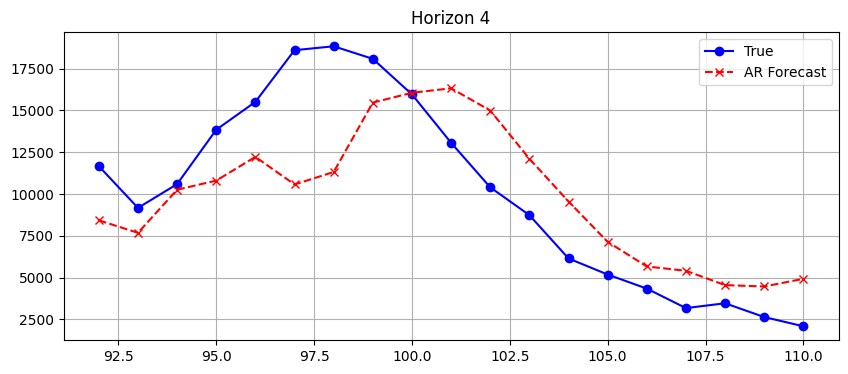

MSE: 0.5160, MAE: 0.6186, SMAPE: 40.2233


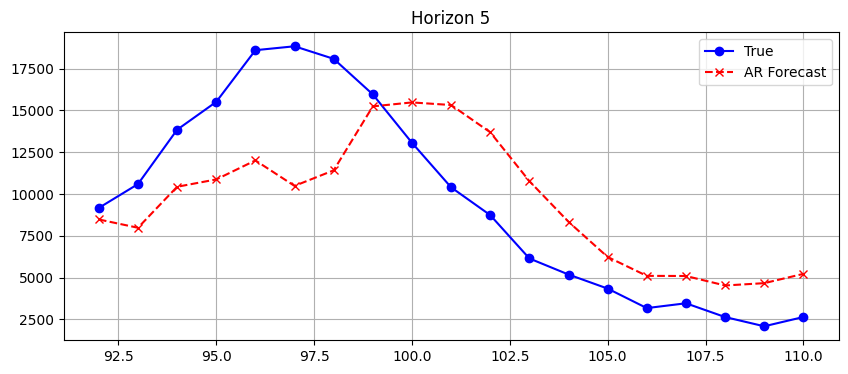

MSE: 0.6836, MAE: 0.7425, SMAPE: 49.8202


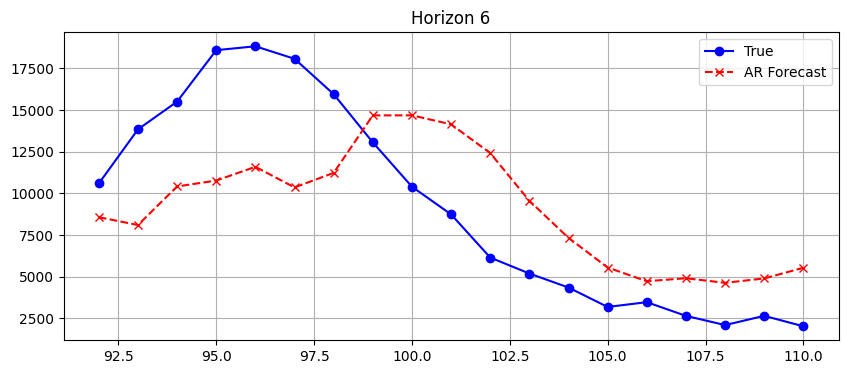

In [4]:
import numpy as np
import pandas as pd
from sklearn.linear_model import Ridge
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

def SMAPE(pred, true):
    return 200*np.mean(np.abs( pred - true)  / ( np.abs(true) + np.abs(pred) )  )


def create_lagged_matrix(y, X, p, q,h):
    """
    Construct lagged matrices for ARX(p, q) model.
    p: number of lags for endogenous y
    q: number of lags for exogenous X (excluding contemporaneous)
    """
    n_obs = len(y)
    lagged_data = []
    for i in range(max(p, q), n_obs-h+1):
        row = []
        # Add lags for y
        for lag in range(1, p + 1):
            row.append(y[i - lag])
        # Add lags for X
        for lag in range(1, q + 1):
            row.extend(X[i - lag])
        lagged_data.append(row)
        
    Y_target = []
    for i in range(h):
        Y_target.append(y[max(p, q)+i:n_obs-(h-i) +1])
    return np.array(lagged_data), np.array(Y_target).transpose()

# Example data
np.random.seed(42)
n = 200
y = np.random.randn(n)           # Endogenous
X = np.random.randn(n, 2)        # Two exogenous variables

# --- Load and preprocess data ---
df = pd.read_csv("./../dataset/rag_data/data/covid_till14May22.csv")  # replace with actual file path
data = df[['new_deaths','icu_patients']] #,'hosp_patients' ]]#,'new_tests','people_vaccinated','people_fully_vaccinated','OT']]  # endogenous + exogenous

split = int(len(data)*0.8)

# data = np.log1p(data)
scaler = StandardScaler()
scaler.fit(np.array(data)[:split,:])
dataS = scaler.transform(data)
y= dataS[:,0]
X= dataS[:,1:]

split = int(len(y)*0.8)
print("split:",split)

# X_lagged_test

# Parameters
p = 3  # lags for y
q =2  # lags for X
h=6

# Create lagged dataset
X_lagged_train, y_target_train = create_lagged_matrix(y[:split], X[:split], p, q,h)
X_lagged_test, y_target_test = create_lagged_matrix(y[split-max(p,q) :], X[split-max(p,q) :], p, q,h)
# print(y_target_train)

# Fit model
model = Ridge(alpha=7.0) #alpha=35.0)
print("X_lagged_train.shape",X_lagged_train.shape, "y_target_train.shape", y_target_train.shape)
print("X_lagged_test.shape",X_lagged_test.shape, "y_target_test.shape", y_target_test.shape)
model.fit(X_lagged_train, y_target_train)

# Predict
y_pred = model.predict(X_lagged_test)
print("y_pred.shape",y_pred.shape)

# Evaluate
for i in range(h):
    
    # denormalize
    dummy = np.zeros((len(y_pred), dataS.shape[1]))
    dummy[:,0] = y_pred[:,i]
    denorm_y_pred = scaler.inverse_transform(dummy)[:,0]
    
    
        # denormalize
    dummy = np.zeros((len(y_target_test), dataS.shape[1]))
    dummy[:,0] = y_target_test[:,i]
    denorm_y_target_test = scaler.inverse_transform(dummy)[:,0]
    
    smape = SMAPE(denorm_y_target_test,denorm_y_pred)
    mse = mean_squared_error(y_target_test[:,i], y_pred[:,i])
    mae = mean_absolute_error(y_target_test[:,i], y_pred[:,i])
    print(f"MSE: {mse:.4f}, MAE: {mae:.4f}, SMAPE: {smape:.4f}")
    
    
    plt.figure(figsize=(10, 4))
    plt.plot(split + np.array(range(len(denorm_y_target_test))),denorm_y_target_test,  color='blue', marker='o', linestyle='-', label="True")
    plt.plot(split + np.array(range(len(denorm_y_target_test))),denorm_y_pred , label="AR Forecast", color='red', linestyle='--', marker='x')
    plt.title(f"Horizon {i+1}")
    plt.legend()
    plt.grid()
    plt.show()
    
# MSE: 0.8548, MAE: 0.7255

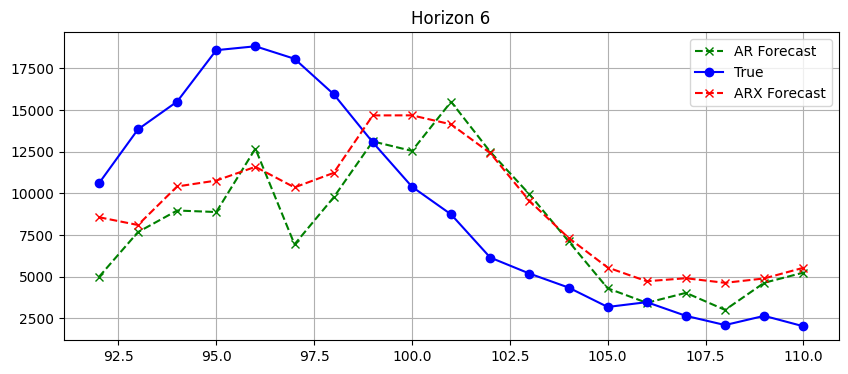

In [8]:

plt.figure(figsize=(10, 4))
plt.plot(split + np.array(range(len(trues_inv))),preds_inv, label="AR Forecast", color='green', linestyle='--', marker='x')
plt.plot(split + np.array(range(len(denorm_y_target_test))),denorm_y_target_test,  color='blue', marker='o', linestyle='-', label="True")
plt.plot(split + np.array(range(len(denorm_y_target_test))),denorm_y_pred , label="ARX Forecast", color='red', linestyle='--', marker='x')
plt.title(f"Horizon {6}")
plt.legend()
plt.grid()
plt.show()




#### varx ridge regression

In [10]:
import numpy as np
import pandas as pd
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

def SMAPE(pred, true):
    return 200 * np.mean(np.abs(pred - true) / (np.abs(true) + np.abs(pred)))

def create_lagged_matrix_VARX(Y, X, p, q, h):
    """
    Construct lagged matrices for VARX(p, q) model.
    Y: endogenous variables (n_samples, n_endog)
    X: exogenous variables (n_samples, n_exog)
    p: lags for Y
    q: lags for X
    h: horizon
    """
    n_obs = len(Y)
    lagged_data = []
    Y_target = []

    for i in range(max(p, q), n_obs - h):
        row = []
        # Add lags for each endogenous variable
        for lag in range(1, p + 1):
            row.extend(Y[i - lag])
        # Add lags for each exogenous variable
        for lag in range(1, q + 1):
            row.extend(X[i - lag])
        lagged_data.append(row)

        target_row = []
        for i_h in range(h):
            target_row.extend(Y[i + i_h])
        Y_target.append(target_row)

    return np.array(lagged_data), np.array(Y_target)

# --- Load and preprocess data ---
df = pd.read_csv("./../dataset/rag_data/data/covid_till14May22.csv")
data = df[['new_deaths', 'icu_patients', 'hosp_patients', 'new_tests', 'people_vaccinated', 'people_fully_vaccinated', 'OT']]

split = int(len(data) * 0.8)

scaler = StandardScaler()
scaler.fit(np.array(data)[:split,:])
dataS = scaler.transform(data)

Y = dataS[:, :3]  # multivariate endogenous: first 3 columns (e.g., deaths, icu, hosp)
X = dataS[:, 3:]  # exogenous: rest

# Parameters
p = 3
q = 2
h = 6
split = int(len(Y) * 0.8)

X_lagged_train, y_target_train = create_lagged_matrix_VARX(Y[:split], X[:split], p, q, h)
X_lagged_test, y_target_test = create_lagged_matrix_VARX(Y[split - max(p, q):], X[split - max(p, q):], p, q, h)

model = Ridge(alpha=120)
model.fit(X_lagged_train, y_target_train)
y_pred = model.predict(X_lagged_test)

# Evaluate
n_endog = Y.shape[1]
for i in range(h):
    for j in range(n_endog):
        idx = i * n_endog + j

        # Denormalize
        dummy_pred = np.zeros((len(y_pred), dataS.shape[1]))
        dummy_true = np.zeros((len(y_pred), dataS.shape[1]))
        dummy_pred[:, j] = y_pred[:, idx]
        dummy_true[:, j] = y_target_test[:, idx]

        denorm_pred = scaler.inverse_transform(dummy_pred)[:, j]
        denorm_true = scaler.inverse_transform(dummy_true)[:, j]

        smape = SMAPE(denorm_true, denorm_pred)
        mse = mean_squared_error(y_target_test[:, idx], y_pred[:, idx])
        mae = mean_absolute_error(y_target_test[:, idx], y_pred[:, idx])
        print(f"Horizon {i+1}, Var {j+1} — MSE: {mse:.4f}, MAE: {mae:.4f}, SMAPE: {smape:.4f}")


Horizon 1, Var 1 — MSE: 0.2467, MAE: 0.3312, SMAPE: 13.0451
Horizon 1, Var 2 — MSE: 1.4515, MAE: 0.9079, SMAPE: 48.5275
Horizon 1, Var 3 — MSE: 0.5855, MAE: 0.5852, SMAPE: 30.2563
Horizon 2, Var 1 — MSE: 0.3939, MAE: 0.4398, SMAPE: 17.0431
Horizon 2, Var 2 — MSE: 2.0698, MAE: 1.0557, SMAPE: 59.8300
Horizon 2, Var 3 — MSE: 1.3437, MAE: 0.9155, SMAPE: 47.2017
Horizon 3, Var 1 — MSE: 0.7002, MAE: 0.6129, SMAPE: 25.2977
Horizon 3, Var 2 — MSE: 2.6602, MAE: 1.2378, SMAPE: 73.0594
Horizon 3, Var 3 — MSE: 2.2112, MAE: 1.1978, SMAPE: 62.6930
Horizon 4, Var 1 — MSE: 1.1483, MAE: 0.8170, SMAPE: 35.6851
Horizon 4, Var 2 — MSE: 3.0525, MAE: 1.3687, SMAPE: 84.8102
Horizon 4, Var 3 — MSE: 2.9171, MAE: 1.4288, SMAPE: 76.3479
Horizon 5, Var 1 — MSE: 1.6079, MAE: 0.9825, SMAPE: 45.9128
Horizon 5, Var 2 — MSE: 3.1785, MAE: 1.4541, SMAPE: 95.0280
Horizon 5, Var 3 — MSE: 3.3151, MAE: 1.5618, SMAPE: 86.7246
Horizon 6, Var 1 — MSE: 2.0124, MAE: 1.1424, SMAPE: 56.7616
Horizon 6, Var 2 — MSE: 3.0454, MAE: 1.4

/home/fs47816/.local/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


#### arx with variables

In [16]:
import numpy as np
import pandas as pd
from sklearn.linear_model import Ridge
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

def SMAPE(pred, true):
    return 200*np.mean(np.abs( pred - true)  / ( np.abs(true) + np.abs(pred) )  )


def create_lagged_matrix(y, X, p, q,h):
    """
    Construct lagged matrices for ARX(p, q) model.
    p: number of lags for endogenous y
    q: number of lags for exogenous X (excluding contemporaneous)
    """
    n_obs = len(y)
    lagged_data = []
    for i in range(max(p, q), n_obs-h+1):
        row = []
        # Add lags for y
        for lag in range(1, p + 1):
            row.append(y[i - lag])
        # Add lags for X
        for lag in range(1, q + 1):
            row.extend(X[i - lag])
        lagged_data.append(row)
        
    Y_target = []
    for i in range(h):
        Y_target.append(y[max(p, q)+i:n_obs-(h-i) +1])
    return np.array(lagged_data), np.array(Y_target).transpose()

# Example data
np.random.seed(42)
n = 200
y = np.random.randn(n)           # Endogenous
X = np.random.randn(n, 2)        # Two exogenous variables

# --- Load and preprocess data ---
df = pd.read_csv("./../dataset/rag_data/data/covid_till14May22.csv")  # replace with actual file path
vnames = ['new_deaths','icu_patients','hosp_patients','new_tests','people_vaccinated','people_fully_vaccinated','OT']

for vname in vnames[1:]:
    print("\nExogenous variable: ", vname)

    data = df[[vnames[0],vname]] #,'hosp_patients' ]]#,'new_tests','people_vaccinated','people_fully_vaccinated','OT']]  # endogenous + exogenous

    split = int(len(data)*0.8)

    # data = np.log1p(data)
    scaler = StandardScaler()
    scaler.fit(np.array(data)[:split,:])
    dataS = scaler.transform(data)
    y= dataS[:,0]
    X= dataS[:,1:]

    split = int(len(y)*0.8)
#     print("split:",split)

    # X_lagged_test

    # Parameters
    p = 3  # lags for y
    q =2  # lags for X
    h=6

    # Create lagged dataset
    X_lagged_train, y_target_train = create_lagged_matrix(y[:split], X[:split], p, q,h)
    X_lagged_test, y_target_test = create_lagged_matrix(y[split-max(p,q) :], X[split-max(p,q) :], p, q,h)
    # print(y_target_train)

    # Fit model
    model = Ridge(alpha=7.0) #alpha=35.0)
#     print("X_lagged_train.shape",X_lagged_train.shape, "y_target_train.shape", y_target_train.shape)
#     print("X_lagged_test.shape",X_lagged_test.shape, "y_target_test.shape", y_target_test.shape)
    model.fit(X_lagged_train, y_target_train)

    # Predict
    y_pred = model.predict(X_lagged_test)
#     print("y_pred.shape",y_pred.shape)

    smape_list = []; mae_list =[]; mse_list=[]
    # Evaluate
    for i in range(h):

        # denormalize
        dummy = np.zeros((len(y_pred), dataS.shape[1]))
        dummy[:,0] = y_pred[:,i]
        denorm_y_pred = scaler.inverse_transform(dummy)[:,0]


            # denormalize
        dummy = np.zeros((len(y_target_test), dataS.shape[1]))
        dummy[:,0] = y_target_test[:,i]
        denorm_y_target_test = scaler.inverse_transform(dummy)[:,0]

        smape = SMAPE(denorm_y_target_test,denorm_y_pred)
        mse = mean_squared_error(y_target_test[:,i], y_pred[:,i])
        mae = mean_absolute_error(y_target_test[:,i], y_pred[:,i])
        
        smape_list.append(smape); mse_list.append(mse); mae_list.append(mae); 
        
        print(f"MSE: {mse:.4f}, MAE: {mae:.4f}, SMAPE: {smape:.4f}")
        
    print(f"avg MSE: {np.mean(mse_list):.4f}, MAE: {np.mean(mae_list):.4f}, SMAPE: {np.mean(smape_list):.4f}")


    #     plt.figure(figsize=(10, 4))
    #     plt.plot(split + np.array(range(len(denorm_y_target_test))),denorm_y_target_test,  color='blue', marker='o', linestyle='-', label="True")
    #     plt.plot(split + np.array(range(len(denorm_y_target_test))),denorm_y_pred , label="AR Forecast", color='red', linestyle='--', marker='x')
    #     plt.title(f"Horizon {i+1}")
    #     plt.legend()
    #     plt.grid()
    #     plt.show()

    # MSE: 0.8548, MAE: 0.7255


Exogenous variable:  icu_patients
MSE: 0.0674, MAE: 0.2160, SMAPE: 12.6652
MSE: 0.1398, MAE: 0.3226, SMAPE: 18.5648
MSE: 0.2657, MAE: 0.4188, SMAPE: 25.1586
MSE: 0.3954, MAE: 0.5188, SMAPE: 32.9493
MSE: 0.5160, MAE: 0.6186, SMAPE: 40.2233
MSE: 0.6836, MAE: 0.7425, SMAPE: 49.8202
avg MSE: 0.3446, MAE: 0.4729, SMAPE: 29.8969

Exogenous variable:  hosp_patients
MSE: 0.0526, MAE: 0.1952, SMAPE: 12.0117
MSE: 0.1080, MAE: 0.2973, SMAPE: 17.7808
MSE: 0.2363, MAE: 0.4119, SMAPE: 25.1732
MSE: 0.4066, MAE: 0.5525, SMAPE: 34.2666
MSE: 0.6103, MAE: 0.6952, SMAPE: 43.2039
MSE: 0.8602, MAE: 0.8312, SMAPE: 53.3447
avg MSE: 0.3790, MAE: 0.4972, SMAPE: 30.9635

Exogenous variable:  new_tests
MSE: 0.0721, MAE: 0.2262, SMAPE: 13.6432
MSE: 0.1405, MAE: 0.3488, SMAPE: 21.1014
MSE: 0.2352, MAE: 0.4269, SMAPE: 27.6459
MSE: 0.3468, MAE: 0.5058, SMAPE: 34.6749
MSE: 0.4189, MAE: 0.5923, SMAPE: 41.3768
MSE: 0.5770, MAE: 0.7188, SMAPE: 50.7327
avg MSE: 0.2984, MAE: 0.4698, SMAPE: 31.5292

Exogenous variable:  pe

/home/fs47816/.local/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted w

#### finding top single exogenous variable

In [17]:

import numpy as np
import pandas as pd
from sklearn.linear_model import Ridge
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

def SMAPE(pred, true):
    return 200*np.mean(np.abs( pred - true)  / ( np.abs(true) + np.abs(pred) )  )


def create_lagged_matrix(y, X, p, q,h):
    """
    Construct lagged matrices for ARX(p, q) model.
    p: number of lags for endogenous y
    q: number of lags for exogenous X (excluding contemporaneous)
    """
    n_obs = len(y)
    lagged_data = []
    for i in range(max(p, q), n_obs-h+1):
        row = []
        # Add lags for y
        for lag in range(1, p + 1):
            row.append(y[i - lag])
        # Add lags for X
        for lag in range(1, q + 1):
            row.extend(X[i - lag])
        lagged_data.append(row)
        
    Y_target = []
    for i in range(h):
        Y_target.append(y[max(p, q)+i:n_obs-(h-i) +1])
    return np.array(lagged_data), np.array(Y_target).transpose()

# Example data
np.random.seed(42)
n = 200
y = np.random.randn(n)           # Endogenous
X = np.random.randn(n, 2)        # Two exogenous variables

# --- Load and preprocess data ---
df = pd.read_csv("./../dataset/rag_data/data/covid_19_weekly_2.csv")  # replace with actual file path
vnames = ['new_cases','new_deaths','reproduction_rate','icu_patients','hosp_patients','new_tests','positive_rate','tests_per_case','people_vaccinated','people_fully_vaccinated','total_boosters','new_vaccinations']

for vname in vnames:
    print("\nExogenous variable: ", vname)

    data = df[[vnames[1],vname]] #,'hosp_patients' ]]#,'new_tests','people_vaccinated','people_fully_vaccinated','OT']]  # endogenous + exogenous

    split = int(len(data)*0.8)

    # data = np.log1p(data)
    scaler = StandardScaler()
    scaler.fit(np.array(data)[:split,:])
    dataS = scaler.transform(data)
    y= dataS[:,0]
    X= dataS[:,1:]

    split = int(len(y)*0.8)
#     print("split:",split)

    # X_lagged_test

    # Parameters
    p = 3  # lags for y
    q = 2  # lags for X
    h=6

    # Create lagged dataset
    X_lagged_train, y_target_train = create_lagged_matrix(y[:split], X[:split], p, q,h)
    X_lagged_test, y_target_test = create_lagged_matrix(y[split-max(p,q) :], X[split-max(p,q) :], p, q,h)
    # print(y_target_train)

    # Fit model
    model = Ridge(alpha=7.0) #alpha=35.0)
#     print("X_lagged_train.shape",X_lagged_train.shape, "y_target_train.shape", y_target_train.shape)
#     print("X_lagged_test.shape",X_lagged_test.shape, "y_target_test.shape", y_target_test.shape)
    model.fit(X_lagged_train, y_target_train)

    # Predict
    y_pred = model.predict(X_lagged_test)
#     print("y_pred.shape",y_pred.shape)

    smape_list = []; mae_list =[]; mse_list=[]
    # Evaluate
    for i in range(h):

        # denormalize
        dummy = np.zeros((len(y_pred), dataS.shape[1]))
        dummy[:,0] = y_pred[:,i]
        denorm_y_pred = scaler.inverse_transform(dummy)[:,0]


            # denormalize
        dummy = np.zeros((len(y_target_test), dataS.shape[1]))
        dummy[:,0] = y_target_test[:,i]
        denorm_y_target_test = scaler.inverse_transform(dummy)[:,0]

        smape = SMAPE(denorm_y_target_test,denorm_y_pred)
        mse = mean_squared_error(y_target_test[:,i], y_pred[:,i])
        mae = mean_absolute_error(y_target_test[:,i], y_pred[:,i])
        
        smape_list.append(smape); mse_list.append(mse); mae_list.append(mae); 
        
        print(f"MSE: {mse:.4f}, MAE: {mae:.4f}, SMAPE: {smape:.4f}")
        
    print(f"avg MSE: {np.mean(mse_list):.4f}, MAE: {np.mean(mae_list):.4f}, SMAPE: {np.mean(smape_list):.4f}")


    #     plt.figure(figsize=(10, 4))
    #     plt.plot(split + np.array(range(len(denorm_y_target_test))),denorm_y_target_test,  color='blue', marker='o', linestyle='-', label="True")
    #     plt.plot(split + np.array(range(len(denorm_y_target_test))),denorm_y_pred , label="AR Forecast", color='red', linestyle='--', marker='x')
    #     plt.title(f"Horizon {i+1}")
    #     plt.legend()
    #     plt.grid()
    #     plt.show()

    # MSE: 0.8548, MAE: 0.7255


Exogenous variable:  new_cases
MSE: 1.0149, MAE: 0.6969, SMAPE: 25.1368
MSE: 2.5085, MAE: 1.0513, SMAPE: 33.4084
MSE: 4.6566, MAE: 1.3806, SMAPE: 42.0222
MSE: 7.0800, MAE: 1.6316, SMAPE: 49.2075
MSE: 9.2604, MAE: 1.8555, SMAPE: 56.8287
MSE: 10.6479, MAE: 2.0629, SMAPE: 67.6240
avg MSE: 5.8614, MAE: 1.4465, SMAPE: 45.7046

Exogenous variable:  new_deaths
MSE: 0.0942, MAE: 0.2582, SMAPE: 15.0429
MSE: 0.2253, MAE: 0.4093, SMAPE: 23.9820
MSE: 0.4214, MAE: 0.5391, SMAPE: 32.7428
MSE: 0.6207, MAE: 0.6791, SMAPE: 43.1499
MSE: 0.7625, MAE: 0.7761, SMAPE: 51.1440
MSE: 0.9430, MAE: 0.8805, SMAPE: 60.2527
avg MSE: 0.5112, MAE: 0.5904, SMAPE: 37.7190

Exogenous variable:  reproduction_rate
MSE: 0.0793, MAE: 0.2413, SMAPE: 14.0490
MSE: 0.1340, MAE: 0.3117, SMAPE: 17.6417
MSE: 0.2161, MAE: 0.3755, SMAPE: 22.2519
MSE: 0.3051, MAE: 0.4824, SMAPE: 30.5189
MSE: 0.4246, MAE: 0.5766, SMAPE: 38.6212
MSE: 0.6346, MAE: 0.7060, SMAPE: 49.4560
avg MSE: 0.2989, MAE: 0.4489, SMAPE: 28.7564

Exogenous variable: 

/home/fs47816/.local/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted w

#### trying top 2 exogenous variable

In [41]:

import numpy as np
import pandas as pd
from sklearn.linear_model import Ridge
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

from itertools import combinations

def SMAPE(pred, true):
    return 200*np.mean(np.abs( pred - true)  / ( np.abs(true) + np.abs(pred) )  )


def create_lagged_matrix(y, X, p, q,h):
    """
    Construct lagged matrices for ARX(p, q) model.
    p: number of lags for endogenous y
    q: number of lags for exogenous X (excluding contemporaneous)
    """
    n_obs = len(y)
    lagged_data = []
    for i in range(max(p, q), n_obs-h+1):
        row = []
        # Add lags for y
        for lag in range(1, p + 1):
            row.append(y[i - lag])
        # Add lags for X
        for lag in range(1, q + 1):
            row.extend(X[i - lag])
        lagged_data.append(row)
        
    Y_target = []
    for i in range(h):
        Y_target.append(y[max(p, q)+i:n_obs-(h-i) +1])
    return np.array(lagged_data), np.array(Y_target).transpose()

# Example data
np.random.seed(42)
n = 200
y = np.random.randn(n)           # Endogenous
X = np.random.randn(n, 2)        # Two exogenous variables

# --- Load and preprocess data ---
df = pd.read_csv("./../dataset/rag_data/data/covid_19_weekly_2.csv")  # replace with actual file path
vnames = ['new_cases','new_deaths','reproduction_rate','icu_patients','hosp_patients','new_tests','positive_rate','tests_per_case','people_vaccinated','people_fully_vaccinated','total_boosters','new_vaccinations']



my_list = [1, 2, 3, 4]
combos = list(combinations(vnames, 2))

for vname_combo in combos:
    print("\nExogenous variables: ", vname_combo)
    
    vlist =[vnames[1]]
    vlist.extend(vname_combo)
    data = df[vlist] #,'hosp_patients' ]]#,'new_tests','people_vaccinated','people_fully_vaccinated','OT']]  # endogenous + exogenous
    print("Variables: ", vlist)

    split = int(len(data)*0.8)

    # data = np.log1p(data)
    scaler = StandardScaler()
    scaler.fit(np.array(data)[:split,:])
    dataS = scaler.transform(data)
    y= dataS[:,0]
    X= dataS[:,1:]

    split = int(len(y)*0.8)
#     print("split:",split)

    # X_lagged_test

    # Parameters
    p = 3  # lags for y
    q = 2  # lags for X
    h=6

    # Create lagged dataset
    X_lagged_train, y_target_train = create_lagged_matrix(y[:split], X[:split], p, q,h)
    X_lagged_test, y_target_test = create_lagged_matrix(y[split-max(p,q) :], X[split-max(p,q) :], p, q,h)
    # print(y_target_train)

    # Fit model
    model = Ridge(alpha=7.0) #alpha=35.0)
#     print("X_lagged_train.shape",X_lagged_train.shape, "y_target_train.shape", y_target_train.shape)
#     print("X_lagged_test.shape",X_lagged_test.shape, "y_target_test.shape", y_target_test.shape)
    model.fit(X_lagged_train, y_target_train)

    # Predict
    y_pred = model.predict(X_lagged_test)
#     print("y_pred.shape",y_pred.shape)

    smape_list = []; mae_list =[]; mse_list=[]
    # Evaluate
    for i in range(h):

        # denormalize
        dummy = np.zeros((len(y_pred), dataS.shape[1]))
        dummy[:,0] = y_pred[:,i]
        denorm_y_pred = scaler.inverse_transform(dummy)[:,0]


            # denormalize
        dummy = np.zeros((len(y_target_test), dataS.shape[1]))
        dummy[:,0] = y_target_test[:,i]
        denorm_y_target_test = scaler.inverse_transform(dummy)[:,0]

        smape = SMAPE(denorm_y_target_test,denorm_y_pred)
        mse = mean_squared_error(y_target_test[:,i], y_pred[:,i])
        mae = mean_absolute_error(y_target_test[:,i], y_pred[:,i])
        
        smape_list.append(smape); mse_list.append(mse); mae_list.append(mae); 
        
        print(f"MSE: {mse:.4f}, MAE: {mae:.4f}, SMAPE: {smape:.4f}")
        
    print(f"avg MSE: {np.mean(mse_list):.4f}, MAE: {np.mean(mae_list):.4f}, SMAPE: {np.mean(smape_list):.4f}")


    #     plt.figure(figsize=(10, 4))
    #     plt.plot(split + np.array(range(len(denorm_y_target_test))),denorm_y_target_test,  color='blue', marker='o', linestyle='-', label="True")
    #     plt.plot(split + np.array(range(len(denorm_y_target_test))),denorm_y_pred , label="AR Forecast", color='red', linestyle='--', marker='x')
    #     plt.title(f"Horizon {i+1}")
    #     plt.legend()
    #     plt.grid()
    #     plt.show()

    # MSE: 0.8548, MAE: 0.7255


Exogenous variables:  ('new_cases', 'new_deaths')
Variables:  ['new_deaths', 'new_cases', 'new_deaths']
MSE: 0.6767, MAE: 0.5759, SMAPE: 21.6127
MSE: 1.9830, MAE: 0.9347, SMAPE: 30.3599
MSE: 4.0326, MAE: 1.2861, SMAPE: 39.9558
MSE: 6.4770, MAE: 1.5602, SMAPE: 47.7898
MSE: 8.7667, MAE: 1.7988, SMAPE: 55.5209
MSE: 10.3372, MAE: 2.0320, SMAPE: 67.0232
avg MSE: 5.3789, MAE: 1.3646, SMAPE: 43.7104

Exogenous variables:  ('new_cases', 'reproduction_rate')
Variables:  ['new_deaths', 'new_cases', 'reproduction_rate']
MSE: 1.1288, MAE: 0.7059, SMAPE: 23.7126
MSE: 2.8116, MAE: 1.0551, SMAPE: 29.3478
MSE: 5.0677, MAE: 1.3716, SMAPE: 35.2932
MSE: 7.3849, MAE: 1.6122, SMAPE: 42.0449
MSE: 9.4379, MAE: 1.7979, SMAPE: 47.7344
MSE: 10.7177, MAE: 2.0019, SMAPE: 58.8782
avg MSE: 6.0914, MAE: 1.4241, SMAPE: 39.5019

Exogenous variables:  ('new_cases', 'icu_patients')
Variables:  ['new_deaths', 'new_cases', 'icu_patients']
MSE: 2.1537, MAE: 0.9734, SMAPE: 31.1931
MSE: 5.6329, MAE: 1.5221, SMAPE: 41.9218
M

/home/fs47816/.local/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted w

MSE: 0.1125, MAE: 0.2624, SMAPE: 14.6737
MSE: 0.2990, MAE: 0.4438, SMAPE: 30.5964
MSE: 0.6132, MAE: 0.6486, SMAPE: 56.2940
MSE: 0.9363, MAE: 0.8062, SMAPE: 87.1307
MSE: 1.0965, MAE: 0.8449, SMAPE: 96.6467
MSE: 1.3177, MAE: 0.9119, SMAPE: 104.1539
avg MSE: 0.7292, MAE: 0.6530, SMAPE: 64.9159

Exogenous variables:  ('icu_patients', 'people_fully_vaccinated')
Variables:  ['new_deaths', 'icu_patients', 'people_fully_vaccinated']
MSE: 0.1042, MAE: 0.2480, SMAPE: 13.5836
MSE: 0.2750, MAE: 0.4148, SMAPE: 27.7019
MSE: 0.5667, MAE: 0.6090, SMAPE: 50.2301
MSE: 0.8622, MAE: 0.7579, SMAPE: 78.8743
MSE: 0.9962, MAE: 0.7905, SMAPE: 89.5484
MSE: 1.1957, MAE: 0.8598, SMAPE: 97.1020
avg MSE: 0.6667, MAE: 0.6133, SMAPE: 59.5067

Exogenous variables:  ('icu_patients', 'total_boosters')
Variables:  ['new_deaths', 'icu_patients', 'total_boosters']
MSE: 0.2827, MAE: 0.4723, SMAPE: 34.4979
MSE: 1.6057, MAE: 1.2169, SMAPE: 107.0593
MSE: 5.0286, MAE: 2.1866, SMAPE: 171.7036
MSE: 7.8650, MAE: 2.7492, SMAPE: 198

/home/fs47816/.local/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/home/fs47816/.local/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted w

In [ ]:
 df[list(vnames[1]).extend(list(vname_combo))]

In [37]:
vlist = [vnames[1]]
vlist.extend(str(vname_combo))
vlist

['new_deaths', 'n', 'e', 'w', '_', 'c', 'a', 's', 'e', 's']

In [39]:
combos

[('new_cases', 'new_deaths'),
 ('new_cases', 'reproduction_rate'),
 ('new_cases', 'icu_patients'),
 ('new_cases', 'hosp_patients'),
 ('new_cases', 'new_tests'),
 ('new_cases', 'positive_rate'),
 ('new_cases', 'tests_per_case'),
 ('new_cases', 'people_vaccinated'),
 ('new_cases', 'people_fully_vaccinated'),
 ('new_cases', 'total_boosters'),
 ('new_cases', 'new_vaccinations'),
 ('new_deaths', 'reproduction_rate'),
 ('new_deaths', 'icu_patients'),
 ('new_deaths', 'hosp_patients'),
 ('new_deaths', 'new_tests'),
 ('new_deaths', 'positive_rate'),
 ('new_deaths', 'tests_per_case'),
 ('new_deaths', 'people_vaccinated'),
 ('new_deaths', 'people_fully_vaccinated'),
 ('new_deaths', 'total_boosters'),
 ('new_deaths', 'new_vaccinations'),
 ('reproduction_rate', 'icu_patients'),
 ('reproduction_rate', 'hosp_patients'),
 ('reproduction_rate', 'new_tests'),
 ('reproduction_rate', 'positive_rate'),
 ('reproduction_rate', 'tests_per_case'),
 ('reproduction_rate', 'people_vaccinated'),
 ('reproduction_ra